# Description

In [1]:
import os
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import math
from statsmodels.stats.weightstats import DescrStatsW
from scipy.stats import t
import scipy.optimize as optim
import random

In [2]:
pd.set_option('max_columns', 100)
pd.set_option('max_rows', 150)

In [3]:
def logistic_function(t, a, b, c):
    return c/(1 + a*np.exp(-b*t))

In [4]:
os.getcwd()

'/Users/alvastrand/Documents/OU/Research/notebooks/calculate_arrival_date'

In [5]:
path = '/Users/alvastrand/'
os.chdir(path)

In [6]:
os.getcwd()

'/Users/alvastrand'

In [7]:
filename = 'ebd_US_barswa_201001_202001_zerofilled_blocks_prop_relJan-2020_v2.csv'
# filename = 'ebd_US_barswa_201001_202001_zerofilled_blocks_prop_relJan-2020.csv'
df = pd.read_csv(filename)

In [8]:
df['observation_date_dt'] = pd.to_datetime(df['observation_date_dt'])

In [9]:
df.shape

(272264, 7)

In [10]:
df.head(2)

,grid_cell,observation_date,nb_checklists,nb_checklists_species,prop,observation_date_dt,year
0,4,2013-02-02,1,0.0,0.0,2013-02-02,2013
1,4,2013-02-03,1,0.0,0.0,2013-02-03,2013


In [11]:
df_prop_greater_than = df[df['prop'] > 0]

In [12]:
df_prop_greater_than.shape

(76554, 7)

In [13]:
df_prop_greater_than.head(2)

,grid_cell,observation_date,nb_checklists,nb_checklists_species,prop,observation_date_dt,year
400,5,2010-03-31,2,2.0,1.0,2010-03-31,2010
401,5,2010-04-01,1,1.0,1.0,2010-04-01,2010


In [14]:
# Calculate the number of proportions greater than 0 for each grid cell and date
df_prop_greater_than_cnt = df_prop_greater_than[['grid_cell', 'year', 'prop']].groupby(['grid_cell', 'year']).count()

In [15]:
df_prop_greater_than_cnt.reset_index(inplace=True)

In [16]:
df_prop_greater_than_cnt.rename(columns={'prop': 'nb_prop'}, inplace=True)

In [17]:
df_prop_greater_than_cnt.shape

(918, 3)

In [18]:
df_prop_greater_than_cnt.head(2)

,grid_cell,year,nb_prop
0,5,2010,19
1,5,2011,21


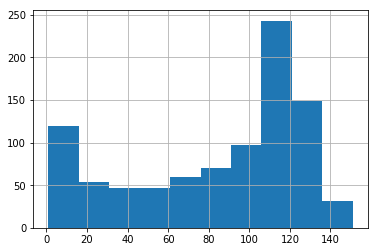

In [19]:
df_prop_greater_than_cnt['nb_prop'].hist()
plt.show()

In [20]:
df_nb_prop = df_prop_greater_than_cnt['nb_prop'].value_counts(sort=False).to_frame().reset_index()

In [21]:
df_nb_prop.rename(columns={'index': 'nb_prop', 'nb_prop': 'count'}, inplace=True)

In [22]:
df_nb_prop.shape

(149, 2)

In [23]:
df_nb_prop

,nb_prop,count
0,1,27
1,2,12
2,3,13
3,4,7
4,5,8
5,6,5
6,7,6
7,8,4
8,9,7
9,10,4


In [24]:
df_subset = df_prop_greater_than_cnt[df_prop_greater_than_cnt['nb_prop'] > 9]
list_grid_cells = list(df_subset['grid_cell'])
print(len(list_grid_cells))
list_years = list(df_subset['year'])
list_nb_prop = list(df_subset['nb_prop'])

829


In [25]:
start_month = 1
start_day = 1

end_month = 7
end_day = 30

In [26]:
bounds = (0, [1000000, 100, 1])

0
5 2010
[0.2799246418941861, 0.7598633402616132, 0.2885536826743823]
17689.68688052515 0.12612385788939845 0.19575238888662622


/Users/alvastrand/opt/anaconda3/lib/python3.7/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


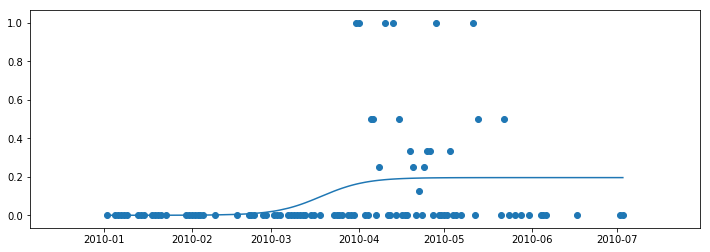

0.11833916860273175
77.54866724111913
2010-03-19
0.004893809722165656
0.19085857916446056
48.50133466315181
106.59599981908644
58.094665155934635
---
1
5 2011
[0.8381678760125707, 0.6629163026201969, 0.44247219227706314]
6389.934119384755 0.1993751254470305 0.21850516039122642


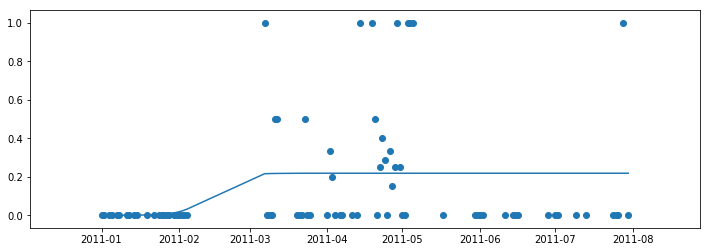

0.09988672394996112
43.94971146834959
2011-02-13
0.005462629009780661
0.21304253138144574
25.57449220308085
62.3249307336183
36.75043853053745
---
2
5 2012
[0.8270825229107502, 0.25961996447495483, 0.32871195658043273]
999979.0865278543 0.24615273544706062 0.1672731220590735


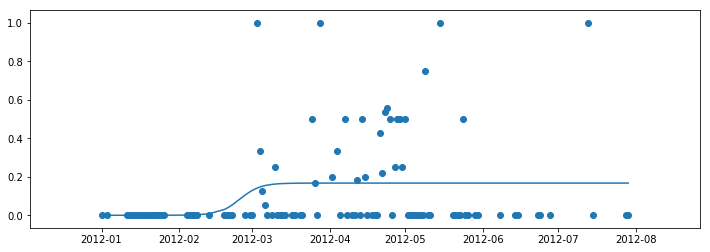

0.0866152802605672
56.12567993275337
2012-02-25
0.004181828051476838
0.16309129400759664
41.242393588297695
71.00896627720903
29.76657268891133
---
3
5 2013
[0.6272619582979773, 0.6935982256548001, 0.3947096421136095]
6501.917052761318 0.14240593000888876 0.16625437518509337


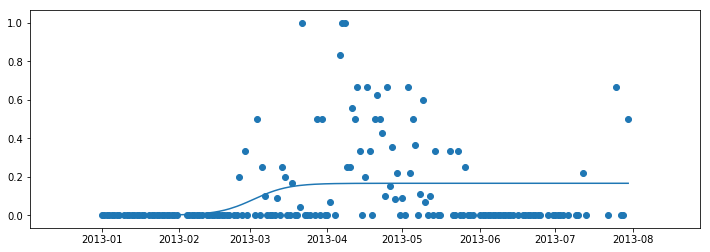

0.10218399159658698
61.65369899305525
2013-03-03
0.004156359379627334
0.16209801580546604
35.927511566022034
87.3798864200885
51.45237485406646
---
4
5 2014
[0.9132126489810547, 0.4422188359930379, 0.040692987842392725]
999999.9466504934 0.19684615151444634 0.16047703041420716


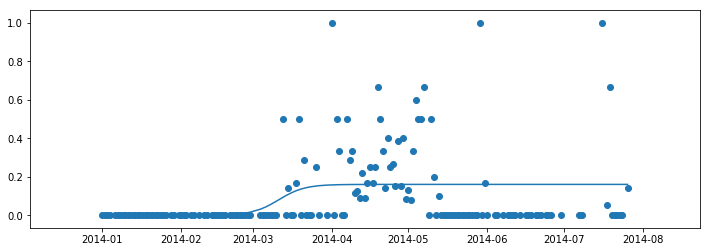

0.13228990341898783
70.18430585675361
2014-03-11
0.004011925760355179
0.15646510465385197
51.573011615317654
88.79560009818955
37.2225884828719
---
5
5 2015
[0.4551255388704841, 0.404051615469307, 0.28086151931488335]
999999.9998097931 0.212657152267598 0.1600435204363053


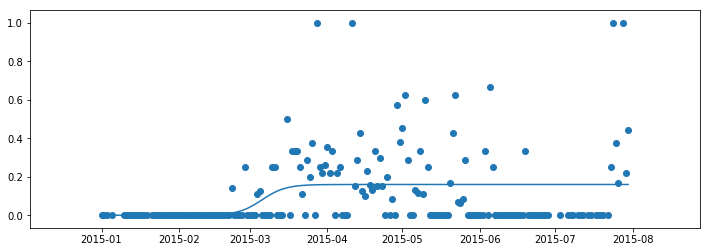

0.1190916333925458
64.96612227925098
2015-03-06
0.004001088010907632
0.15604243242539764
47.738572643301815
82.19367191520014
34.45509927189833
---
6
5 2016
[0.9640179968607846, 0.5723470015770676, 0.6013933859994371]
999999.9798802611 0.20076712652207573 0.18221645839791137


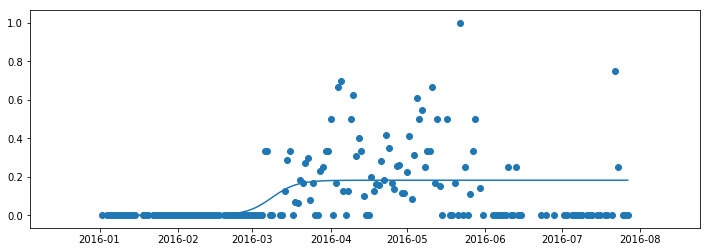

0.19243779346121737
68.81360896663242
2016-03-09
0.004555411459947784
0.17766104693796358
50.565792655296136
87.06142527796871
36.495632622672574
---
7
5 2017
[0.4509820913901772, 0.4237934613639397, 0.431035040568127]
994734.7385357452 0.20286352876718206 0.12682914288116848


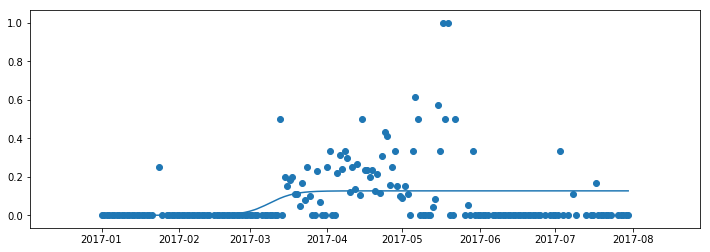

0.1148370832724962
68.07646238871799
2017-03-09
0.003170728572029212
0.12365841430913926
50.01721995912306
86.13570481831295
36.118484859189884
---
8
5 2018
[0.9146235421636585, 0.36465873136110505, 0.5367747523699276]
999999.9999831452 0.19125006947580817 0.14823184621524574


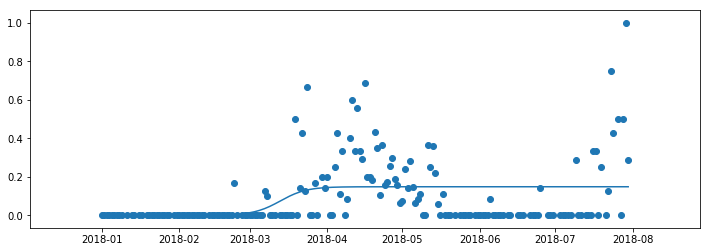

0.149164514798659
72.23793745965142
2018-03-13
0.0037057961553811436
0.1445260500598646
53.0820665301872
91.39380838911566
38.311741858928464
---
9
5 2019
[0.7007068920947012, 0.18092430659029535, 0.5778048128105089]
999999.9999999997 0.21276001487129687 0.1309804284740093


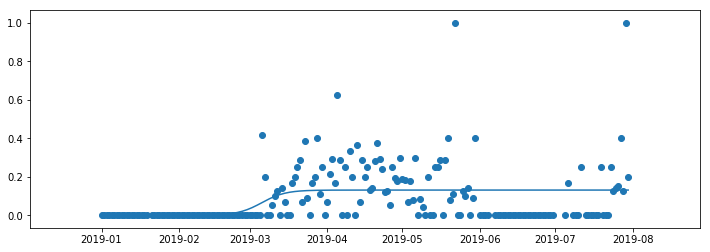

0.14999937884240144
64.93471325578528
2019-03-06
0.003274510711850233
0.1277059177621591
47.71549258433621
82.15393392723436
34.43844134289815
---
10
6 2015
[0.19401224279213147, 0.3806467583858142, 0.5642376669304364]
14656.252776711208 0.1368445184200446 0.07350100219617108


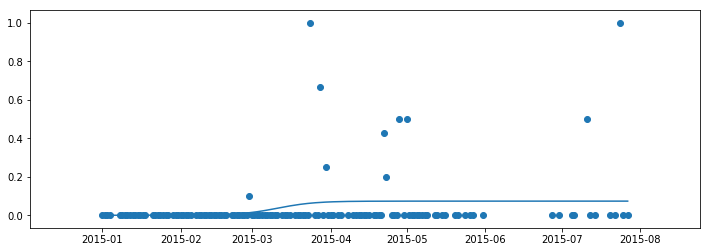

0.04749854591346825
70.09869627835488
2015-03-11
0.0018375250549042769
0.0716634771412668
43.32698712677357
96.87040542993617
53.5434183031626
---
11
6 2016
[0.8209703052476599, 0.5488257859639039, 0.9709824987545339]
499485.56404175865 0.20719585509039382 0.06487038379911


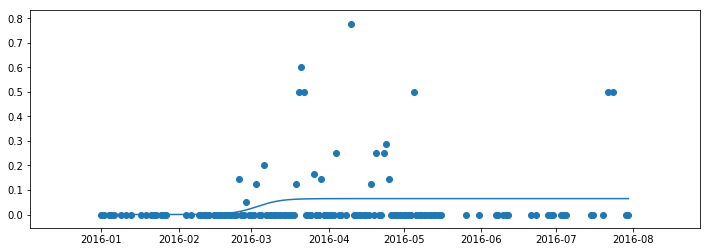

0.04071764208845585
63.32816826915449
2016-03-03
0.0016217595949777502
0.06324862420413226
45.64653248290125
81.00980405540773
35.36327157250648
---
12
6 2017
[0.5797344543178765, 0.9471504985019245, 0.31889745625860855]
999999.583653215 0.17449707972928838 0.03346473537341528


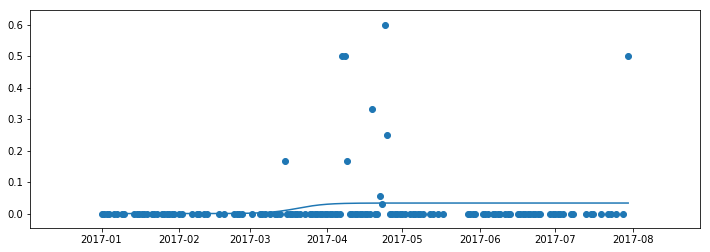

0.0238759065711025
79.17330286014261
2017-03-20
0.000836618384335382
0.0326281169890799
58.178328893740265
100.168276826545
41.98994793280473
---
13
6 2019
[0.5707244836502932, 0.3422834714691917, 0.0779689527191928]
999999.747425704 0.2372449528964015 0.11225700868835253


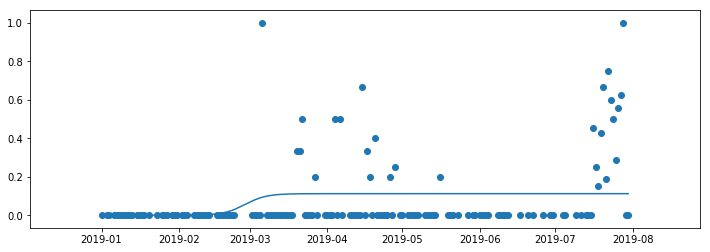

0.06223719572190578
58.23310522193831
2019-02-27
0.0028064252172088134
0.10945058347114371
42.79099949364733
73.67521095022927
30.884211456581944
---
14
19 2010
[0.8741448649985549, 0.933065530043145, 0.3898605602814781]
27469.34518643883 0.15632206289771544 0.026304986631548122


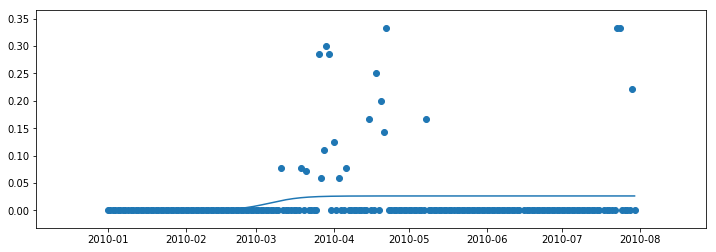

0.036192845835558596
65.38313115843552
2010-03-06
0.0006576246657887031
0.025647361965759417
41.94714535950972
88.8191169573613
46.871971597851584
---
15
19 2011
[0.10430179097310166, 0.8922226735609606, 0.8308293917592138]
10793.768479518765 0.15475311825545796 0.025336405589380148


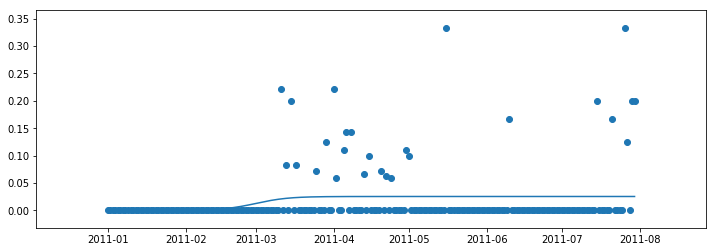

0.04174642605337897
60.00993297350451
2011-03-01
0.0006334101397345037
0.024702995449645646
36.3363444382348
83.68352150877425
47.347177070539445
---
16
19 2012
[0.11342056715992443, 0.32499805595201403, 0.7649272800109719]
---
17
19 2013
[0.8627377381566528, 0.07829759913509782, 0.37851500164149754]
999999.5656542152 0.18556461400631974 0.04888729710324666


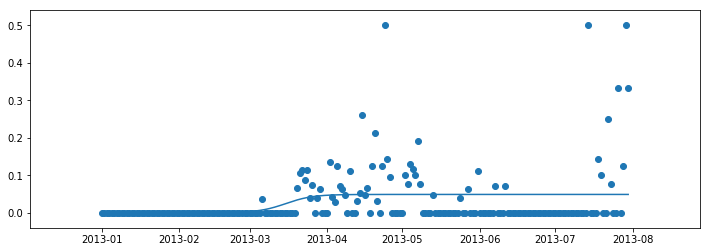

0.0811969006262031
74.45121041853315
2013-03-15
0.0012221824275811665
0.04766511467566549
54.70842882330467
94.19399201376166
39.485563190456986
---
18
19 2014
[0.33145183767448105, 0.9412772521118788, 0.41623264093161283]
743749.4732164958 0.1867140569631393 0.05579745571010807


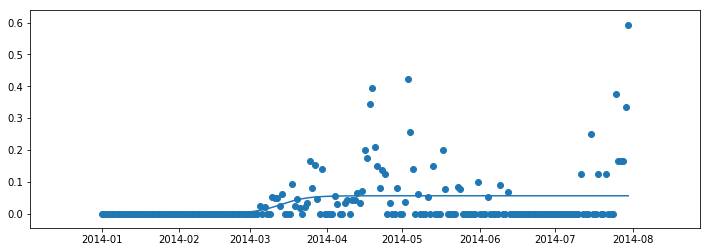

0.09006640567251767
72.40729352386343
2014-03-13
0.001394936392752702
0.05440251931735537
52.78605179350512
92.0285352542217
39.24248346071657
---
19
19 2015
[0.4584991237146052, 0.3951910724656382, 0.5289645201297211]
60721.68109383667 0.15545816774992186 0.036028701868152636


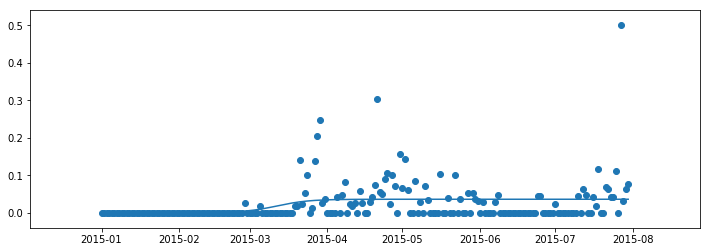

0.09113470574151039
70.84900238501895
2015-03-12
0.000900717546703816
0.03512798432144882
47.28278068592467
94.41522408411325
47.13244339818858
---
20
19 2016
[0.44421925519750827, 0.2053316656457892, 0.572300618274195]
999999.9998295587 0.18259717330702416 0.04056737525353129


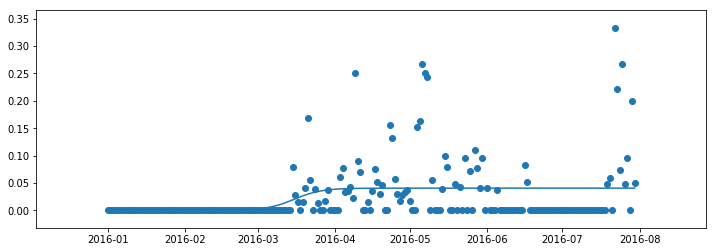

0.10936060562581551
75.66114144912875
2016-03-16
0.0010141843813382824
0.03955319087219301
55.5975140677255
95.72476883053204
40.127254762806544
---
21
19 2017
[0.8857918473080252, 0.4633855186705096, 0.506550162531801]
999897.9552125823 0.19389364722484362 0.033373297280534876


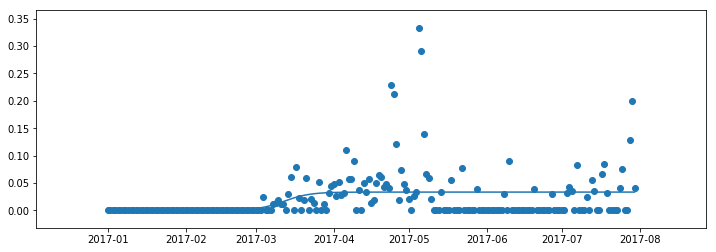

0.10688930084755088
71.25250726729206
2017-03-12
0.0008343324320133719
0.03253896484852151
52.357810620107465
90.14720391447668
37.78939329436921
---
22
19 2018
[0.17365801477704534, 0.01119325742324917, 0.13340304626353428]
698357.8570931869 0.1902463031973756 0.03134060640619792


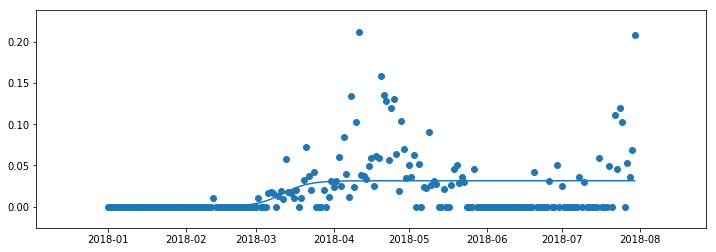

0.14357974728592637
70.73192337224435
2018-03-12
0.0007835151601549482
0.030557091246042972
51.474983371003965
89.98886337348469
38.513880002480725
---
23
19 2019
[0.23279268974765066, 0.5053110813881726, 0.8783436884904389]
999999.7469205089 0.1757467400469731 0.04204805697840682


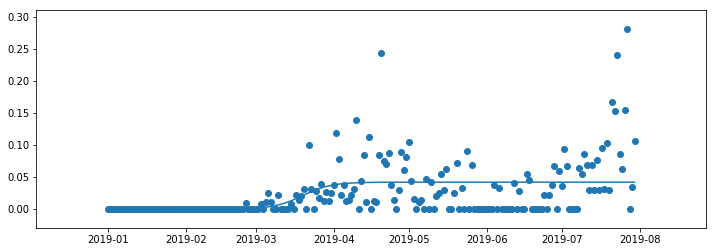

0.18422195244135064
78.61033610747022
2019-03-20
0.0010512014244601707
0.04099685555394665
57.76464847109949
99.45602374384096
41.69137527274147
---
24
20 2010
[0.9232572137534072, 0.03019900215146809, 0.5181698512033266]
168.9609700661628 0.005892304354198503 0.9999999868724915


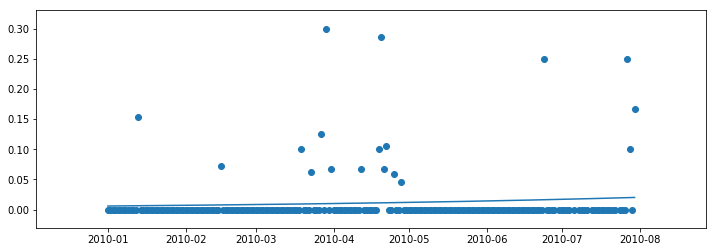

0.007516920597228971
870.5707365984409
---
25
20 2011
[0.5263112346025672, 0.5573428227950749, 0.8435551601302163]
998496.4372942409 0.05591671396712673 0.8331479017050728


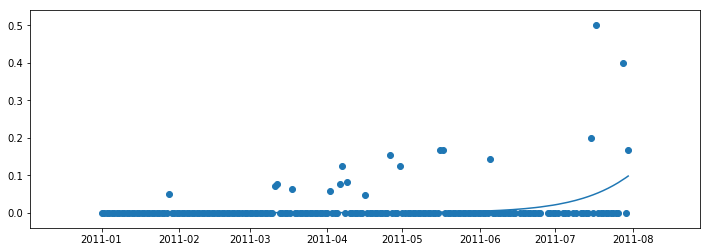

0.08626677571488017
247.04609558950492
---
26
20 2012
[0.9600726607667797, 0.5648466137867473, 0.7495494403003714]
9118.400381695586 0.11197403964136983 0.021792117866596256


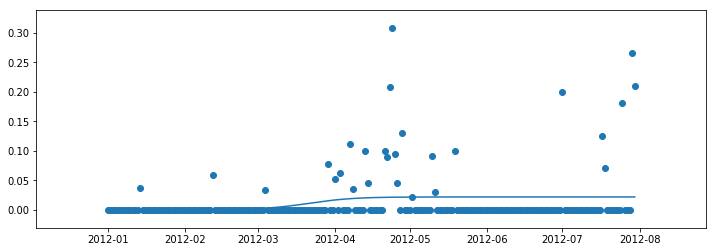

0.044740562631882086
81.43003235521314
2012-03-21
0.0005448029466649065
0.02124731491993135
48.712076855319665
114.14798785510666
65.435910999787
---
27
20 2013
[0.3913917446658911, 0.8790937694407391, 0.2638609902459744]
999996.4442958847 0.17251408812296215 0.02969958208666857


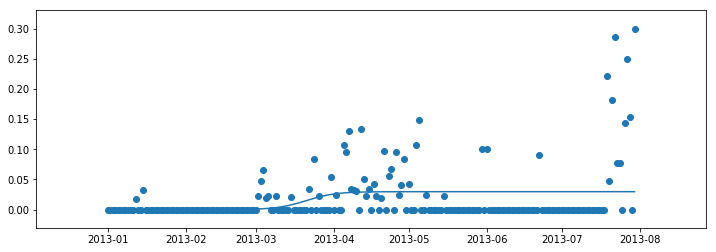

0.06590062931147611
80.08335523535106
2013-03-21
0.0007424895521667143
0.028957092534501856
58.84705108192805
101.31965938877413
42.47260830684608
---
28
20 2014
[0.8725330371786078, 0.6905169192483505, 0.3704089027818752]
42242.86102426587 0.13645544831023784 0.021397513773253822


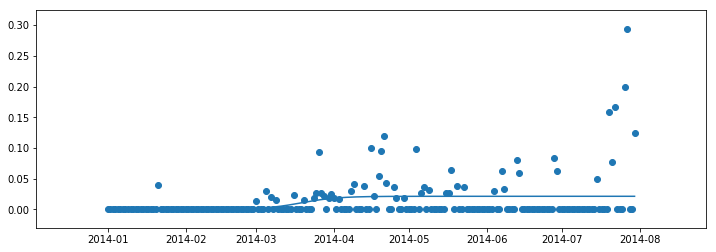

0.0652523145269116
78.05617716672234
2014-03-19
0.0005349378443313456
0.020862575928922475
51.20813488261824
104.90421945082639
53.69608456820815
---
29
20 2015
[0.7613207929058597, 0.47491747993698796, 0.5998747763751638]
999999.9999234949 0.057219347304464756 0.9999972751441364


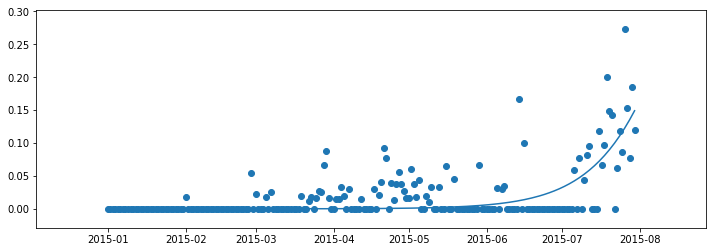

0.4276010490240997
241.44823750566903
---
30
20 2016
[0.9075265051785164, 0.6639084622919531, 0.028918800158056812]
1492.0267897442886 0.023911101247355855 0.9999999999999999


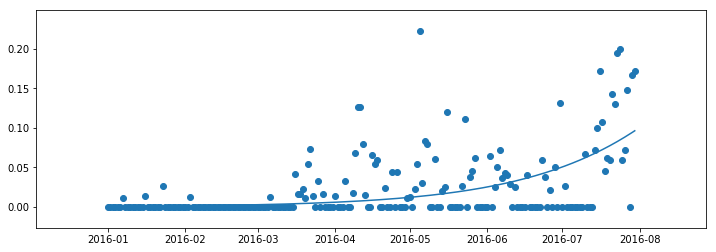

0.2602258900106159
305.627526754056
---
31
20 2017
[0.6116132236859623, 0.5116416450169445, 0.7847406933151658]
4542.1098192980735 0.09676937795786175 0.03858605909499186


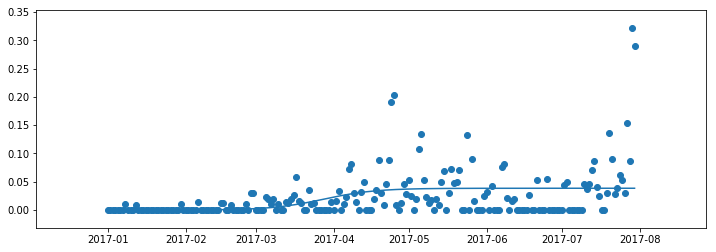

0.13143393502054757
87.02284832978388
2017-03-28
0.0009646514773747966
0.037621407617617064
49.16416076309366
124.88153589647412
75.71737513338046
---
32
20 2018
[0.04492625241442938, 0.11007034418116057, 0.5636277312473744]
993810.6952169124 0.05934747391380257 0.9995268120334844


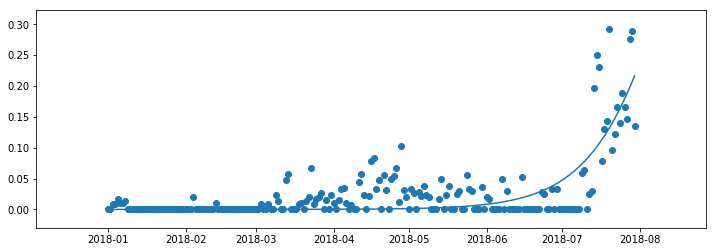

0.5940938021976829
232.68559063002905
---
33
20 2019
[0.13871142092940225, 0.8832285021240373, 0.38362701726879256]
973557.1788845663 0.05668618559047128 0.8614440542898504


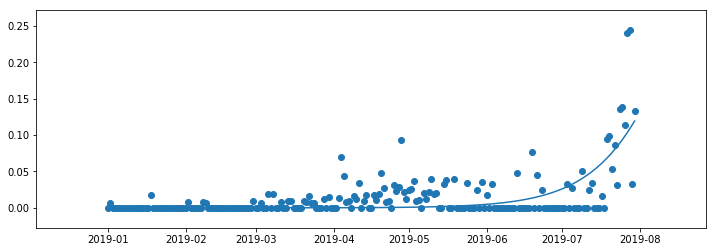

0.4363703668935305
243.2464222775167
---
34
33 2010
[0.8759819393723898, 0.950743111108812, 0.9755846603717507]
362213.52087802 0.20261460699108788 0.029591634963978895


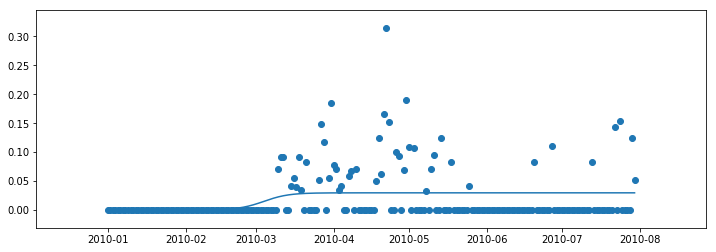

0.08409862471213292
63.17406895626856
2010-03-04
0.0007397908740994724
0.02885184408987942
45.09263987997896
81.25549803255814
36.162858152579176
---
35
33 2011
[0.8564125986598876, 0.45499508092995755, 0.1364790306598901]
999988.2617248421 0.18988424597001113 0.06355376115433783


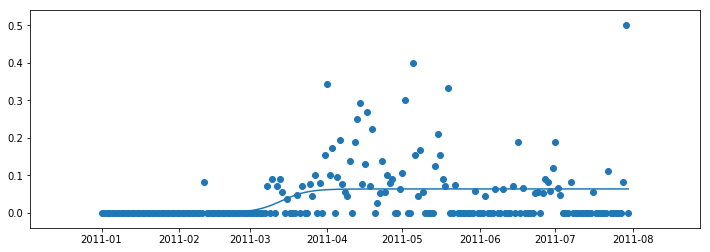

0.12716773462310516
72.75747784680429
2011-03-14
0.0015888440288584459
0.061964917125479385
53.46382013752681
92.05113555608175
38.58731541855494
---
36
33 2012
[0.7153498608178208, 0.026823364790231397, 0.8018222521836381]
999999.9915784337 0.18384718252735838 0.06471606060429265


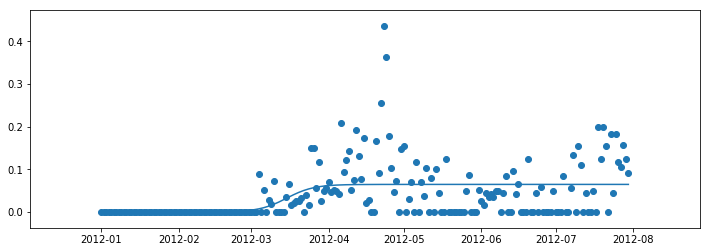

0.1932865340530725
75.14670804099386
2012-03-15
0.0016179015151073163
0.06309815908918533
55.2194967790836
95.07391930290409
39.85442252382049
---
37
33 2013
[0.39889425165812176, 0.6467568661388833, 0.9709630287230196]
999999.4560711399 0.19339777925215795 0.05573888944977591


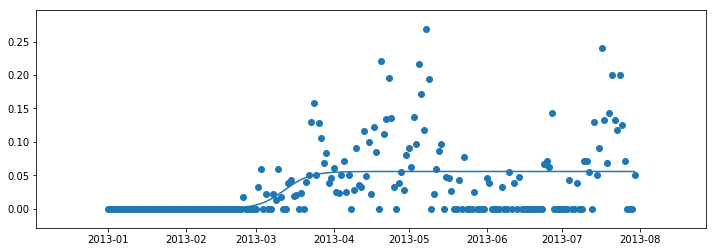

0.20086508811230208
71.43572210321082
2013-03-12
0.001393472236244398
0.05434541721353151
52.49257983810247
90.37886436831917
37.8862845302167
---
38
33 2014
[0.14927266776114856, 0.30069596940450183, 0.096435212947383]
999999.9987237827 0.20567695139418626 0.05646706245275242


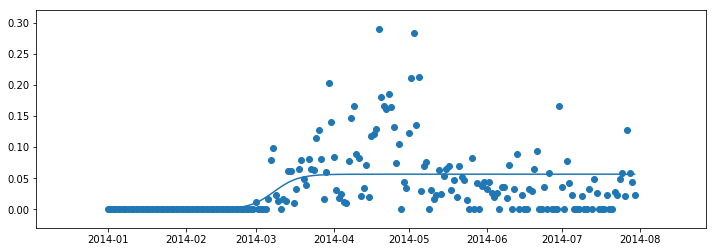

0.21683109807303325
67.17092247351626
2014-03-08
0.0014116765613188106
0.055055385891433606
49.35870957704874
84.9831353699838
35.62442579293506
---
39
33 2015
[0.14700988621765443, 0.9877557319873576, 0.11404552544598423]
999999.9997717638 0.18728417686646248 0.05005632499903962


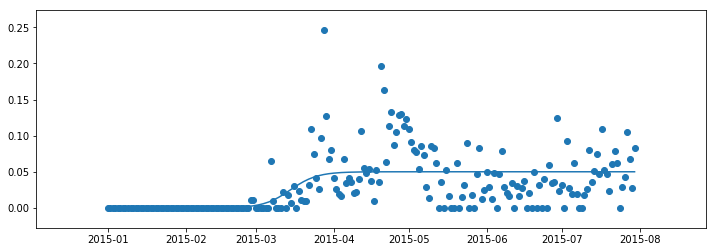

0.3043410722624402
73.7676337045109
2015-03-15
0.0012514081249759906
0.04880491687406363
54.20612184896401
93.32914556005781
39.1230237110938
---
40
33 2016
[0.12422206138060721, 0.5811631225138875, 0.528923130925508]
999999.9994329871 0.18376192914777864 0.05797968442170896


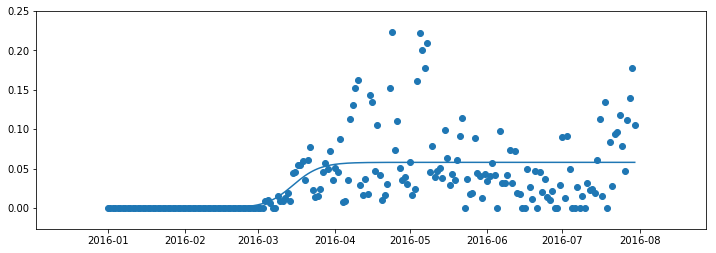

0.3026823542653869
75.18157118543868
2016-03-15
0.0014494921105427242
0.05653019231116624
55.24511501565467
95.11802735522274
39.87291233956807
---
41
33 2017
[0.4969187831706776, 0.4569080865920686, 0.48676043902563537]
999999.9999996063 0.20502276716655798 0.04713009675573354


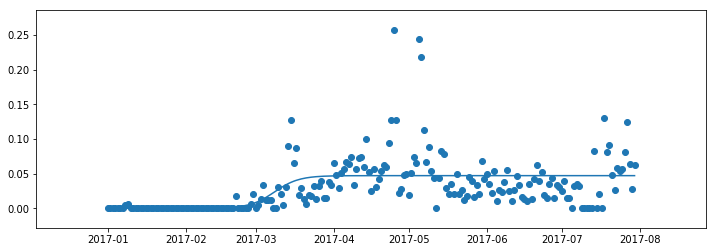

0.2762455629461813
67.38525066701655
2017-03-08
0.0011782524188933387
0.0459518443368402
49.51620277169957
85.25429856233352
35.73809579063395
---
42
33 2018
[0.12879805350620477, 0.21416049350523314, 0.7321524599178811]
999999.9999310194 0.20739945777214847 0.04492730416368515


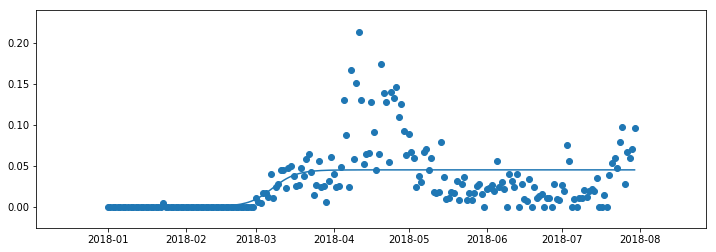

0.25990202724549316
66.61305051758225
2018-03-08
0.0011231826040921289
0.04380412155959302
48.9487726767285
84.27732835843598
35.32855568170748
---
43
33 2019
[0.9926909314325453, 0.5728262133482258, 0.4141409878804073]
140002.91151098622 0.15970160033807887 0.03556600853431655


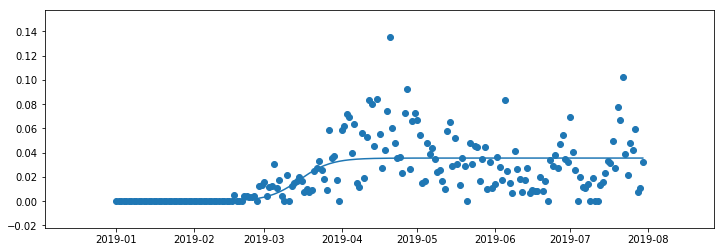

0.38515930779382923
74.19724331376594
2019-03-15
0.0008891502133579138
0.03467685832095864
51.257199892947966
97.13728673458392
45.88008684163596
---
44
34 2010
[0.10165788652670849, 0.8754396865385006, 0.9102406850265897]
249.31872365329025 0.07668318964517792 0.04734813076659104


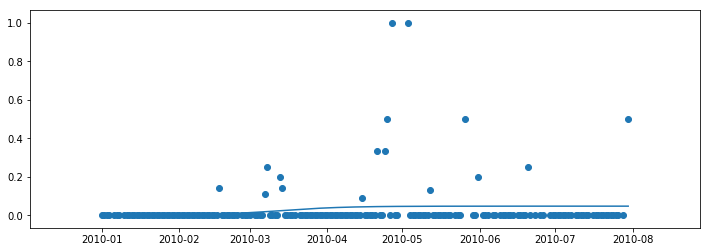

0.02178456795051542
71.96795175255488
2010-03-13
0.0011837032691647761
0.04616442749742627
24.192661456449898
119.7432420486599
95.55058059221
---
45
34 2011
[0.36618552207619004, 0.44507755527529025, 0.7593907885707502]
999931.8705550143 0.17350105042690508 0.04775908519877323


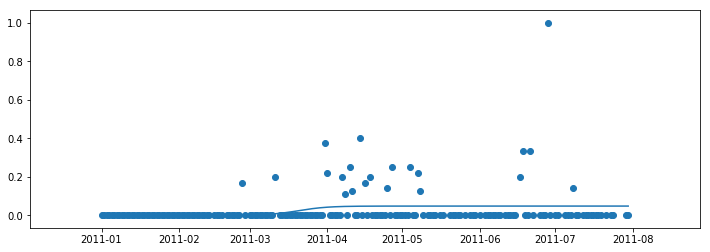

0.04040814280507965
79.62742814642918
2011-03-21
0.0011939771299693308
0.046565108068803894
58.511926902400226
100.74292939045813
42.231002488057904
---
46
34 2012
[0.29926151879467655, 0.3728502366010814, 0.2877895479070488]
389.3690545892239 0.08007146748811413 0.04059978546464913


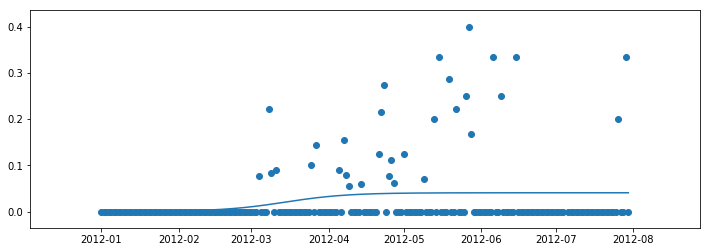

0.052881423764202684
74.4900500443279
2012-03-14
0.0010149946366162282
0.0395847908280329
28.736403195361774
120.24369689329397
91.5072936979322
---
47
34 2013
[0.9341996231436094, 0.6681252016725863, 0.8052651890404458]
999999.4537846913 0.18677886132245938 0.0697753727749842


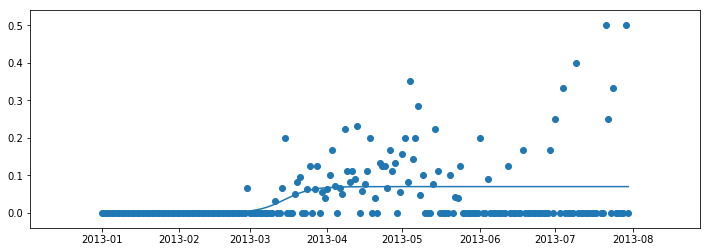

0.12721815436776818
73.96720332231493
2013-03-15
0.0017443843193746052
0.06803098845560959
54.35276933235292
93.5816373122769
39.228867979923976
---
48
34 2014
[0.41223844931442744, 0.32228101399454157, 0.5992835923372893]
999999.9654027869 0.20730574314455127 0.0535280704576722


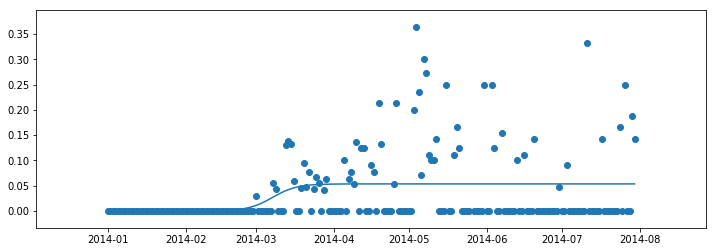

0.11197436889768164
66.64316344450576
2014-03-08
0.0013382017614418052
0.05218986869623039
48.9709002907778
84.3154265982337
35.3445263074559
---
49
34 2015
[0.5253857315740434, 0.7166166322485377, 0.194023282823499]
999999.884632476 0.18115967315012663 0.05638397943568515


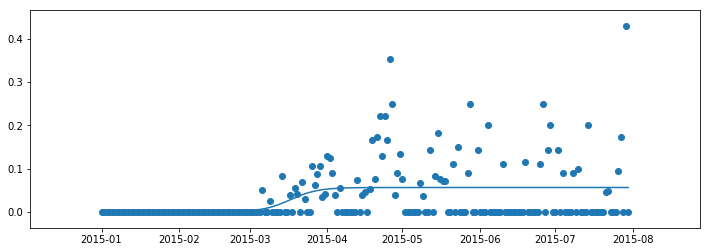

0.1395519849186222
76.26151119817852
2015-03-17
0.0014095994858921287
0.05497437994979302
56.03867913834333
96.48434325801375
40.44566411967042
---
50
34 2016
[0.13619772177707312, 0.0806133874755609, 0.8816157690607231]
999999.9999782457 0.17315778176037647 0.06737051869172915


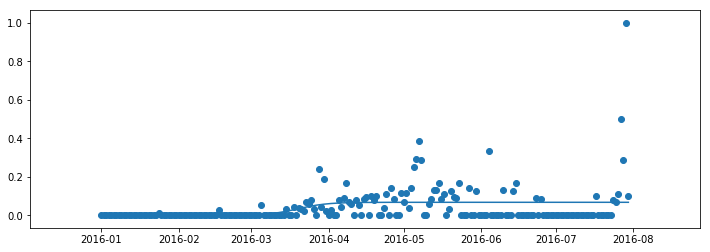

0.09668667350620197
79.78567533892901
2016-03-20
0.0016842629672932288
0.06568625572443593
58.628314642316205
100.94303603554184
42.31472139322563
---
51
34 2017
[0.9519684585228213, 0.2753820560676843, 0.6874365289863679]
80657.82649752671 0.13079107722420183 0.09410055351225004


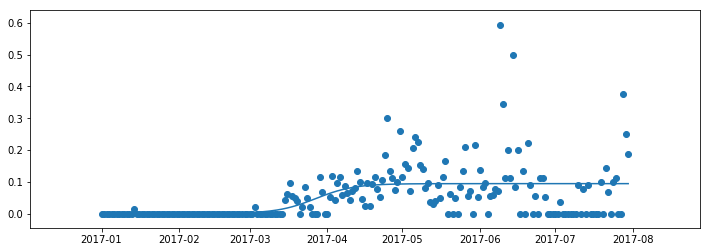

0.2444857404203763
86.38181870942783
2017-03-27
0.002352513837806251
0.09174803967444378
58.37102681228966
114.39261060656597
56.02158379427631
---
52
34 2018
[0.6133756910768811, 0.9630198309486157, 0.7510123244250291]
999999.9989294012 0.19377138909279004 0.05535436592428249


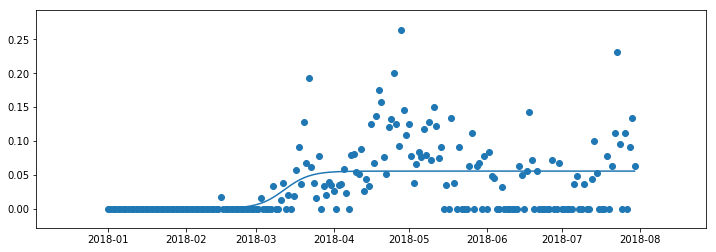

0.2435578860726939
71.29798997455673
2018-03-12
0.0013838591481070625
0.05397050677617543
52.39137190631704
90.20460804279642
37.81323613647938
---
53
34 2019
[0.19099968135040768, 0.023530745023659594, 0.9141690451699559]
54029.47302753559 0.15226726745994013 0.03957685148636182


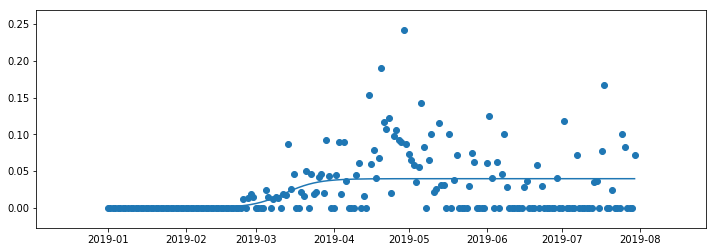

0.17644445583127522
71.56682559057995
2019-03-13
0.0009894212871590456
0.03858743019920278
47.50675209452479
95.62689908663512
48.12014699211033
---
54
43 2010
[0.9256091107034018, 0.6460901939642463, 0.09658711345163429]
0.9256091107034018 0.6460901939642463 0.1200980392155024


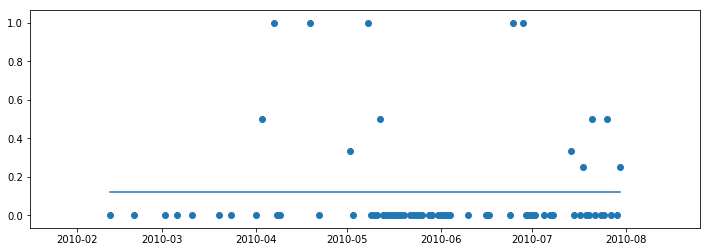

4.6629367034256575e-15
-0.1196477842395048
---
55
43 2011
[0.6841754427133235, 0.4378040264885049, 0.9273533570265238]
999999.8418907142 0.1726637417220188 0.5712894207753746


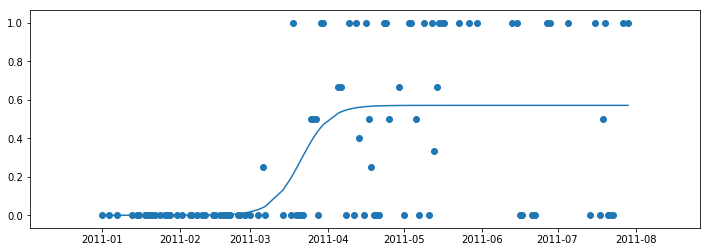

0.36158235306073694
80.01396391662445
2011-03-21
0.014282235519384366
0.5570071852559902
58.796065997860346
101.23186183538859
42.43579583752824
---
56
43 2012
[0.29069388420267817, 0.33082356883214725, 0.5181768780330862]
137862.38736400922 0.16231652699251764 0.6378245751032425


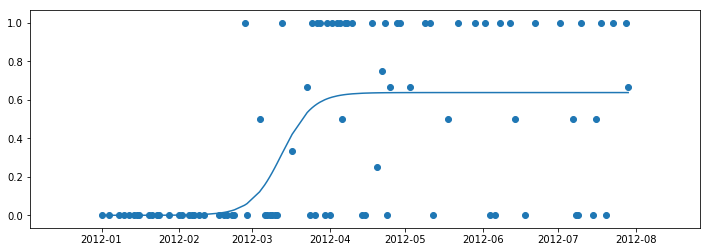

0.36770800964973394
72.9070014795394
2012-03-13
0.015945614377581064
0.6218789607256614
50.33652320471451
95.47747975436425
45.140956549649744
---
57
43 2013
[0.2554317542363638, 0.04641580476204743, 0.8836331992465715]
999999.9988779969 0.16728417650240568 0.321473429436843


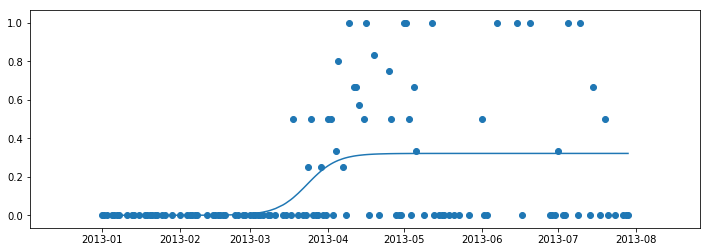

0.21163219273412714
82.58707336042386
2013-03-24
0.008036835735921075
0.3134365937009219
60.686845121700024
104.48730159914771
43.80045647744769
---
58
43 2014
[0.3017839847696523, 0.34561410696533246, 0.48085636369208495]
999992.9161667096 0.20361128812129853 0.24649279957511985


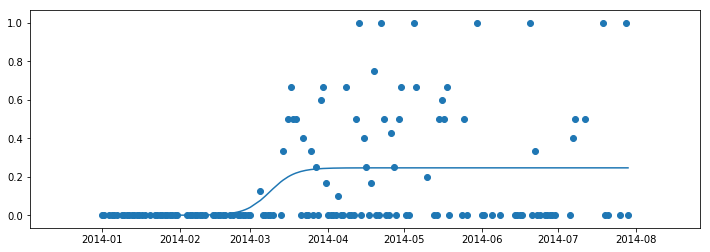

0.16801264097696766
67.85234552357187
2014-03-09
0.0061623199893779965
0.24033047958574186
49.85942538671221
85.84526566043155
35.98584027371934
---
59
43 2015
[0.9987941543174056, 0.10647449130738096, 0.948025785077756]
999999.9999952093 0.16610214675661164 0.2982041906676631


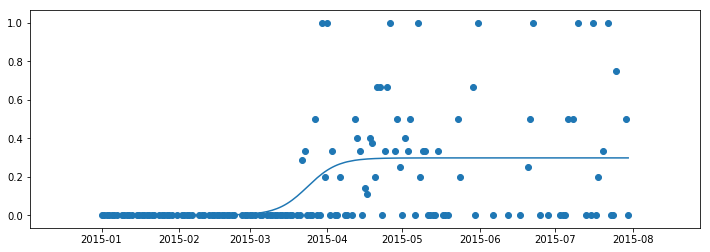

0.24964891977564896
83.1747862849916
2015-03-24
0.007455104766691579
0.29074908590097154
61.11870984247675
105.23086272750642
44.11215288502967
---
60
43 2016
[0.2746605640518236, 0.11172276350483634, 0.1838350691660221]
999999.9995612308 0.1672599913801262 0.3510394493178919


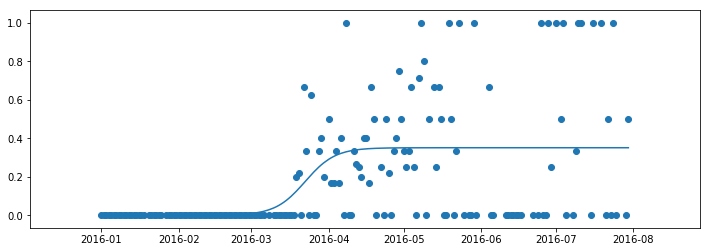

0.2807767209485029
82.5990151232727
2016-03-23
0.008775986232947298
0.3422634630849446
60.69562019959611
104.5024100469493
43.80678984735319
---
61
43 2017
[0.26946022551315774, 0.9324431717021294, 0.15713370170965235]
999999.9980350927 0.1696723392560859 0.29940512763327937


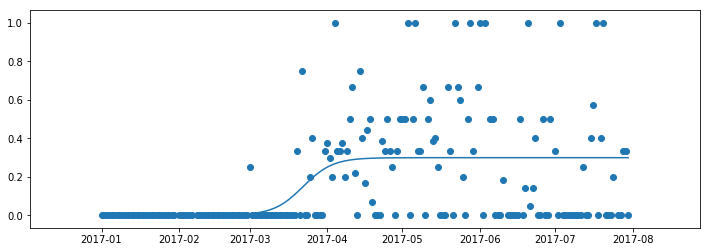

0.23990897416223822
81.42464833438562
2017-03-22
0.0074851281908319845
0.2919199994424474
59.83266898057801
103.01662768819325
43.18395870761524
---
62
43 2018
[0.2072446980755024, 0.3435680933555114, 0.31036478737709416]
999999.9924318395 0.18966007742200894 0.14611459684603484


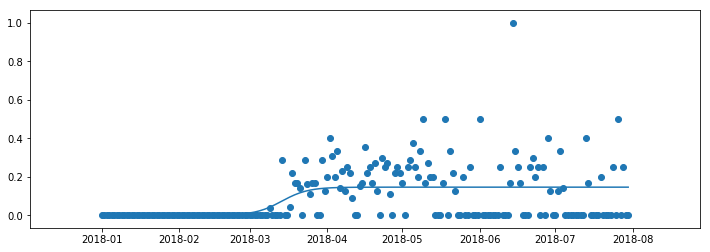

0.21806868681300817
72.84353533008156
2018-03-14
0.0036528649211508713
0.14246173192488396
53.52707350043712
92.15999715972599
38.63292365928887
---
63
43 2019
[0.5884994959243386, 0.11565133330309896, 0.2606264035366336]
319992.3702614692 0.14650010365009172 0.23367870659280116


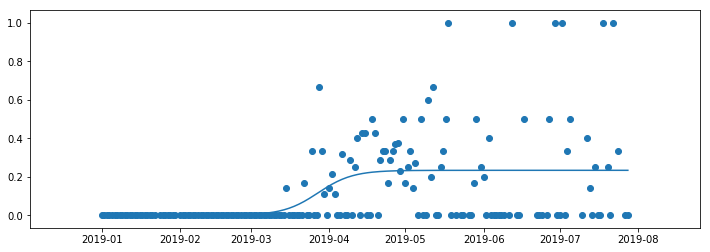

0.22245337492495698
86.52589394636115
2019-03-28
0.005841967664820029
0.22783673892798112
61.51866490794434
111.53312298477793
50.01445807683359
---
64
44 2010
[0.5952482585346754, 0.7496627181462321, 0.3271225747253548]
999999.773860991 0.1624862074342297 0.26319983065442193


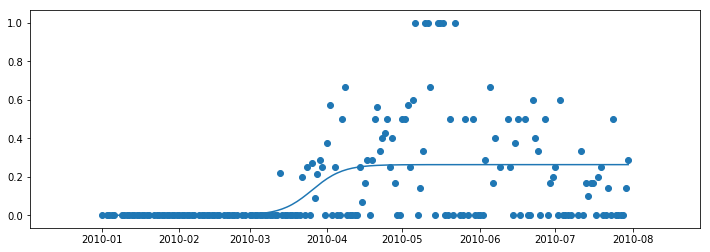

0.23421180494722804
85.02574187669072
2010-03-26
0.006579995766360549
0.2566198348880614
62.47883340993632
107.57265034344515
45.093816933508826
---
65
44 2011
[0.2307088221041198, 0.20238170500993236, 0.29621339945592107]
12643.547585486469 0.13014459860340555 0.35911278622370374


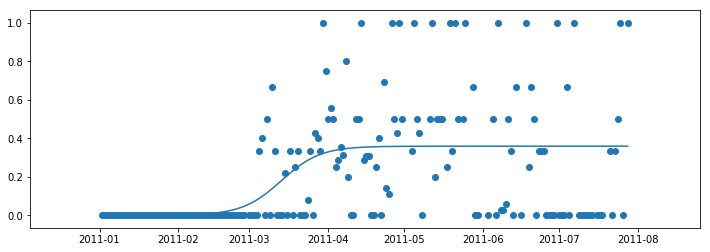

0.2604061238717392
72.57237252321767
2011-03-14
0.008977819655592594
0.35013496656811116
44.42244017532398
100.7223048711114
56.29986469578743
---
66
44 2012
[0.8481632890046472, 0.37728670817813637, 0.13728735836895967]
999999.8271248001 0.1842683010027291 0.266729793368911


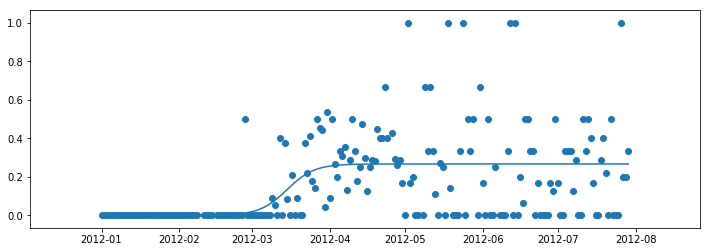

0.2540547661345409
74.97497024669721
2012-03-15
0.006668244834222775
0.2600615485346882
55.093299735851254
94.85664075754313
39.76334102169188
---
67
44 2013
[0.8564129774003469, 0.8264037287822311, 0.5903780301440502]
222539.43652662673 0.1613892269317788 0.2733137960445011


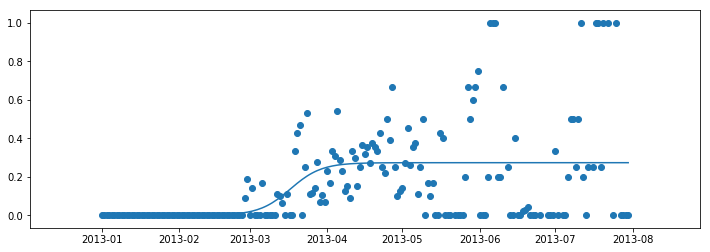

0.23683865805463866
76.2929462008259
2013-03-17
0.006832844901112529
0.2664809511433886
53.59278389272908
98.9931085089227
45.40032461619362
---
68
44 2014
[0.35445631910011177, 0.12468048984003599, 0.08795086495844295]
16232.181157669364 0.12479056977944322 0.2938803193591292


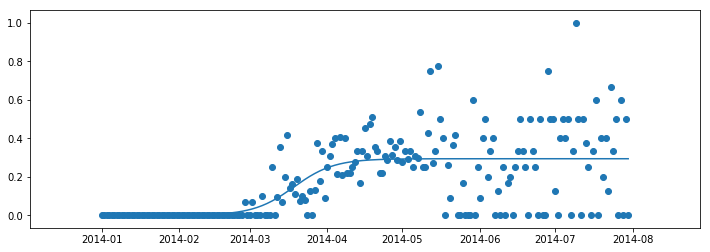

0.40686401951409346
77.68817034095383
2014-03-19
0.007347007983978231
0.286533311375151
48.3304900883139
107.04585059359373
58.715360505279826
---
69
44 2015
[0.09558305511211229, 0.16589117387572605, 0.9973093604340719]
999999.9964420203 0.16721321904981779 0.30601839402362846


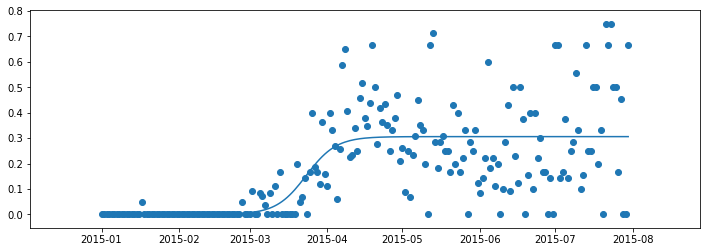

0.4813120635223809
82.62211942878896
2015-03-24
0.007650459850590712
0.29836793417303775
60.712597759702724
104.53164109787522
43.8190433381725
---
70
44 2016
[0.9482670126936384, 0.01376241838696457, 0.4377333180007511]
75832.32915662706 0.14312296230495328 0.28403846644452363


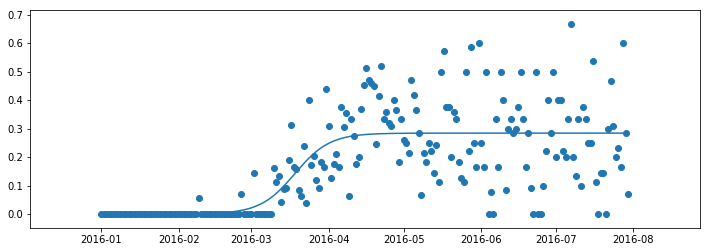

0.5327086716353024
78.50787746263588
2016-03-19
0.007100961661113091
0.27693750478341056
52.910575763949225
104.10517916132255
51.19460339737333
---
71
44 2017
[0.3703192120664991, 0.7507104562774837, 0.18719318287525177]
999999.9992850828 0.17049914326531032 0.29326828570353736


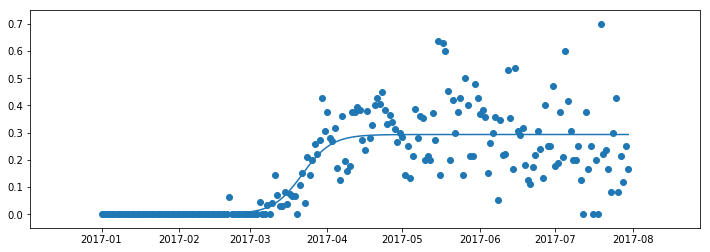

0.6274346386255643
81.02979459404858
2017-03-22
0.007331707142588434
0.2859365785609489
59.54252154406703
102.5170676440301
42.97454609996308
---
72
44 2018
[0.6486957828400509, 0.7895899846725787, 0.5851342443608669]
999999.9999989514 0.17704137122672828 0.2650443451540941


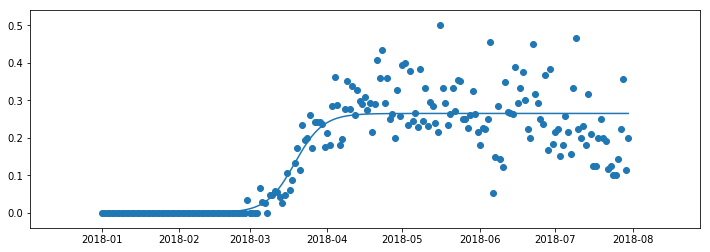

0.7736277379576448
78.03549228202922
2018-03-19
0.0066261086288523525
0.2584182365252417
57.342240638389946
98.72874392566847
41.38650328727852
---
73
44 2019
[0.7384123892558788, 0.9075761646924166, 0.845806285381531]
999999.9997151679 0.17003294329976243 0.23947106138636917


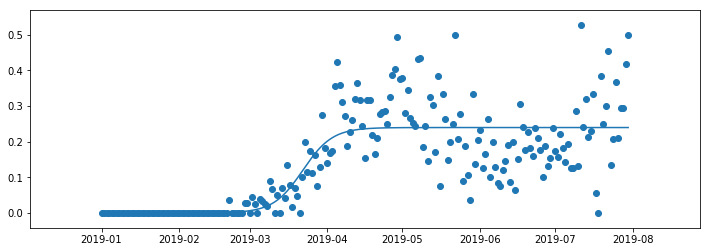

0.6285328066016953
81.2519638228173
2019-03-22
0.005986776534659229
0.23348428485170994
59.70577650739273
102.79815113824189
43.092374630849164
---
74
45 2010
[0.05329290386185426, 0.8873247529323224, 0.6257325212018833]
381784.99534210656 0.17310874088416556 0.1808090720800101


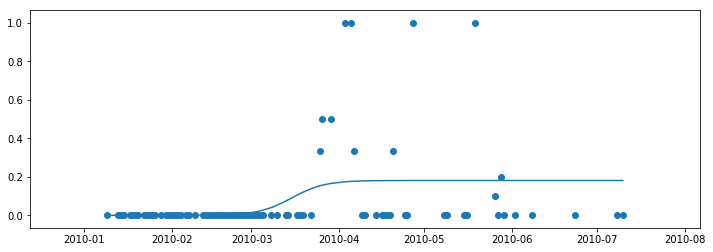

0.1504276601380753
74.24589205646646
2010-03-15
0.004520226802000252
0.17628884527800984
53.08253758102093
95.40924653191196
42.32670895089103
---
75
45 2011
[0.8489399541577236, 0.5789932924775986, 0.7450813004425184]
999999.9999436009 0.16375310599875245 0.31255618308468985


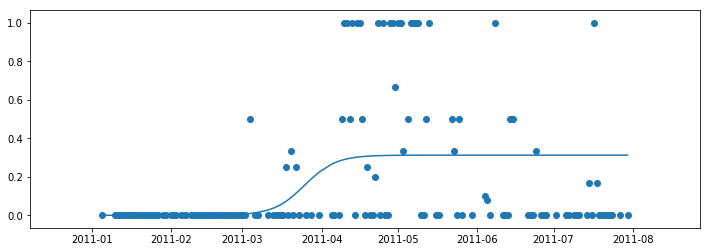

0.1807616964036558
84.36792983953005
2011-03-25
0.007813904577117246
0.3047422785075726
61.99545865014353
106.74040102891655
44.74494237877302
---
76
45 2012
[0.8984636434560527, 0.7996677608940741, 0.20517022681470598]
999999.9966736932 0.17544298474799994 0.1900271619097021


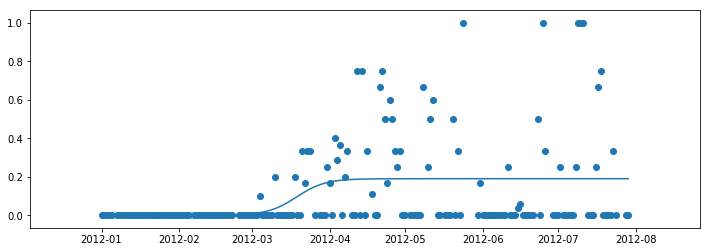

0.14057062166268552
78.74644047171265
2012-03-19
0.004750679047742553
0.18527648286195952
57.864661406041506
99.62821953738376
41.76355813134225
---
77
45 2013
[0.9100999083592136, 0.061219400880912156, 0.9054590811563583]
255488.34881418926 0.15978479837532852 0.25366277892860845


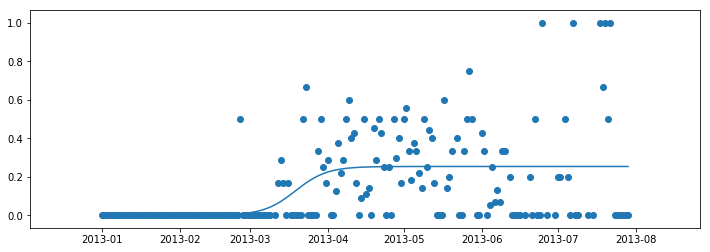

0.2358916349092014
77.92313294303078
2013-03-19
0.006341569473215212
0.24732120945539324
54.99503412899919
100.8512317570624
45.85619762806321
---
78
45 2014
[0.6467896611303112, 0.2834885514487564, 0.43941326699954864]
1229.8320861433958 0.09417549407664823 0.29392874624338694


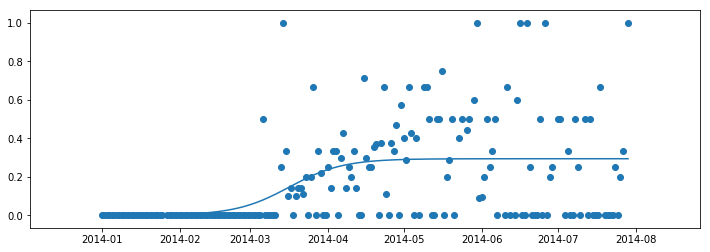

0.2520156084624896
75.54654205399035
2014-03-17
0.007348218656084674
0.28658052758730224
36.64510933999875
114.4479747679819
77.80286542798316
---
79
45 2015
[0.30779710245830794, 0.33243069692654725, 0.5718013801885183]
999999.9997714589 0.183903335062426 0.2623004003511476


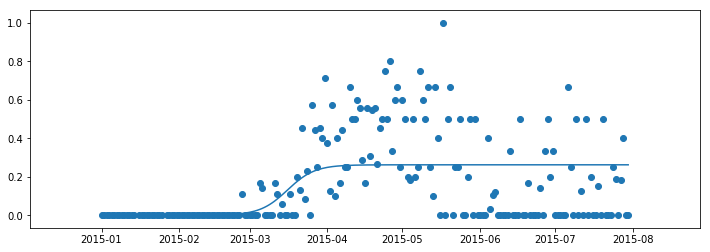

0.2612995508949234
75.12376299780564
2015-03-16
0.00655751000877869
0.2557428903423689
55.202636255400186
95.04488974021112
39.84225348481093
---
80
45 2016
[0.7093661622486334, 0.16603750070197276, 0.3564375211965609]
177557.94010258082 0.15101223852934043 0.23625849211306757


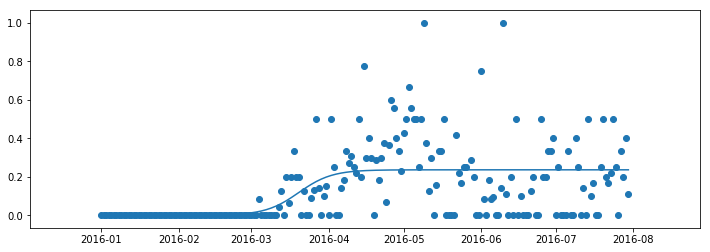

0.292125008598762
80.04021644509224
2016-03-20
0.005906462302826689
0.2303520298102409
55.78018506082899
104.30024782935551
48.52006276852652
---
81
45 2017
[0.6874754159686757, 0.36845186778887695, 0.9823403627661127]
999999.9998206038 0.1848358389844671 0.16604935361022446


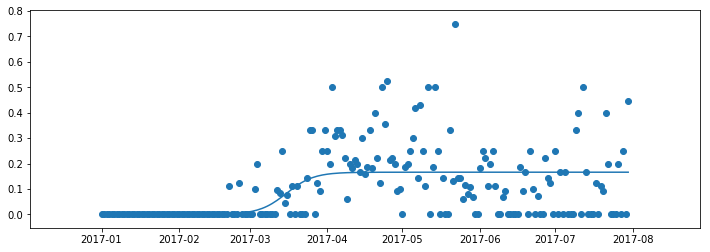

0.26352321952290514
74.74476072222055
2017-03-16
0.0041512338402556114
0.16189811976996885
54.92413683099826
94.56538461344282
39.64124778244456
---
82
45 2018
[0.5560002558417954, 0.41166555964217033, 0.5428412042459542]
59997.3087303893 0.1441911584099054 0.2024218667547762


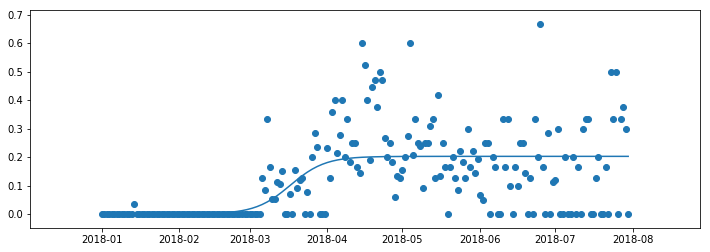

0.35274470873771147
76.30186973342835
2018-03-17
0.005060546668869405
0.1973613200859068
50.894197816992914
101.70954164986381
50.815343832870894
---
83
45 2019
[0.4176160979267618, 0.8530184266362842, 0.01565303782889471]
999999.9999965675 0.170188704507862 0.1787726111799721


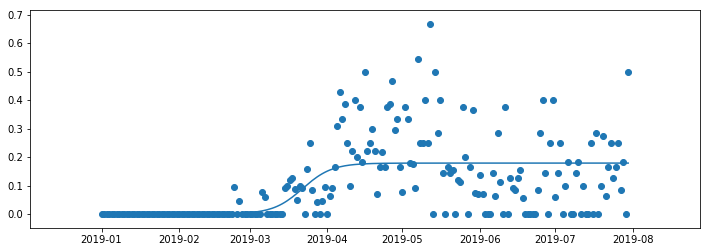

0.33025586663261997
81.17759987604009
2019-03-22
0.004469315279499303
0.17430329590047278
59.65113220168038
102.70406755039976
43.05293534871937
---
84
46 2010
[0.4536254096305855, 0.6814949401766669, 0.9665423427713417]
999999.9995718916 0.16744534056182167 0.1223884417267854


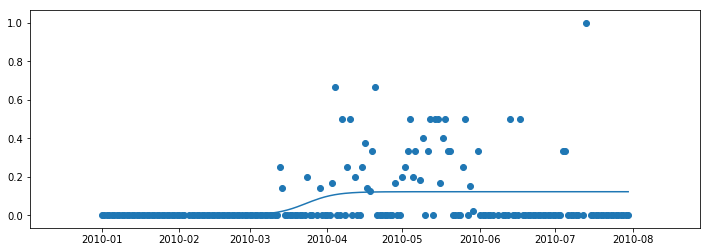

0.11828774857172697
82.50758433278357
2010-03-24
0.003059711043169635
0.11932873068361576
60.62843479158124
104.38673387398586
43.75829908240462
---
85
46 2011
[0.49347118984795146, 0.4403643171131635, 0.9333366252395641]
999999.9993544536 0.16256280876687887 0.1393279027834907


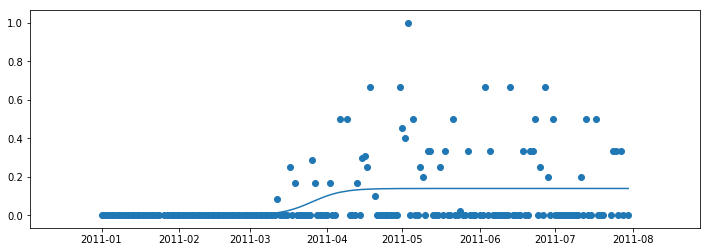

0.13160374964719757
84.98567822564314
2011-03-26
0.0034831975695872675
0.13584470521390343
62.4493941030962
107.5219623481901
45.0725682450939
---
86
46 2012
[0.9443938708499592, 0.6175691307303633, 0.1414967992762285]
598.1285139818102 0.09403430543586813 0.14328893002511428


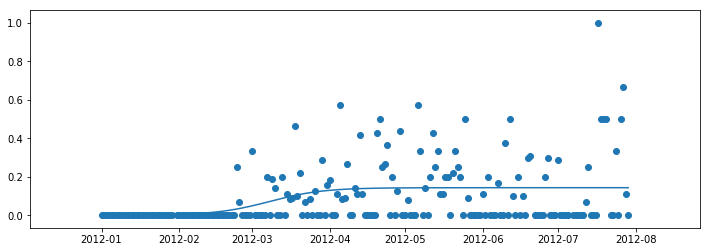

0.13469092062366095
67.99439425376816
2012-03-08
0.0035822232506278573
0.13970670677448643
29.034552639069226
106.95423586846715
77.91968322939792
---
87
46 2013
[0.5944184463220631, 0.5565712295862661, 0.961213019787967]
999999.9997290488 0.18932795373440792 0.1821377609591359


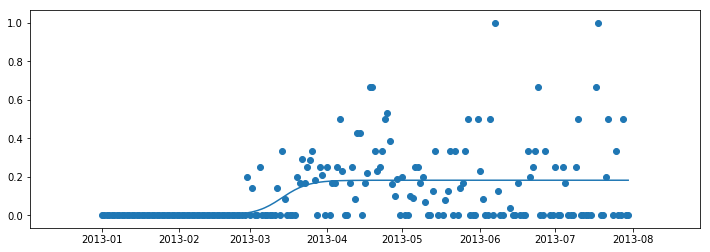

0.18967997623309163
72.97131926473956
2013-03-14
0.004553444023978398
0.1775843169351575
53.62097202933373
92.32166650014544
38.70069447081171
---
88
46 2014
[0.04278987523819433, 0.6273372858324966, 0.9507791941127555]
999999.8441941699 0.18550797833619204 0.15281469697222907


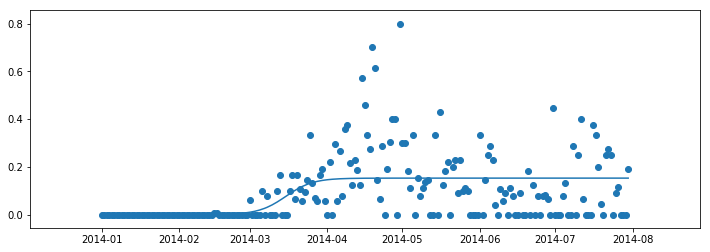

0.23420460724092484
74.47394190842232
2014-03-15
0.003820367424305727
0.14899432954792335
54.725132832996714
94.22275098384794
39.49761815085123
---
89
46 2015
[0.4879066443787281, 0.39770123257583156, 0.8529603004656339]
999809.0876514661 0.18388897706286003 0.1593264057449738


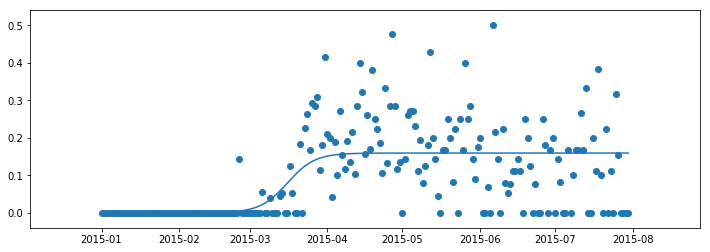

0.37209419193725024
75.12859034865951
2015-03-16
0.003983160143624345
0.15534324560134946
55.20590817028563
95.05127252703343
39.8453643567478
---
90
46 2016
[0.6138429958520302, 0.5200215648476458, 0.658782440382175]
999999.9996979075 0.19744377885288944 0.10972255963639005


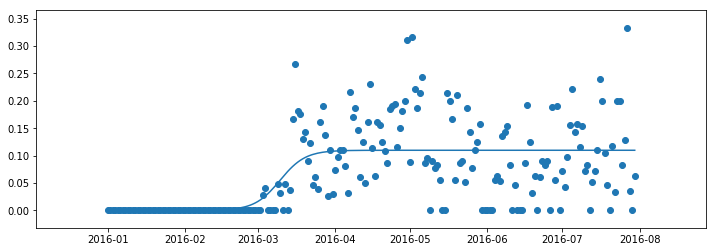

0.3943252658014723
69.97187066580499
2016-03-10
0.0027430639909097514
0.1069794956454803
51.41690951476625
88.52683181684372
37.10992230207747
---
91
46 2017
[0.7461656027899132, 0.5395801816075282, 0.9721277744455833]
999989.6648669309 0.16713310698651335 0.13109345524059915


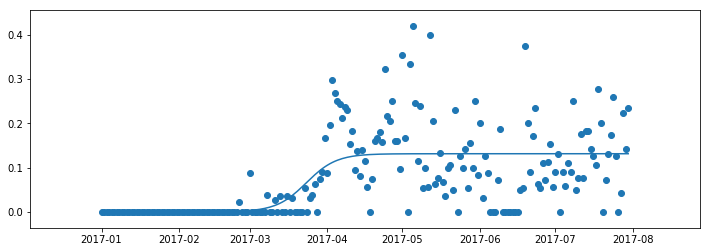

0.40266817341073413
82.66166094723906
2017-03-24
0.0032773363810149787
0.12781611885958416
60.741637367319164
104.58168452715893
43.84004715983976
---
92
46 2018
[0.7024866897183946, 0.7135131345064449, 0.5510402480987976]
999999.9999098364 0.1665414438418419 0.14501341649591304


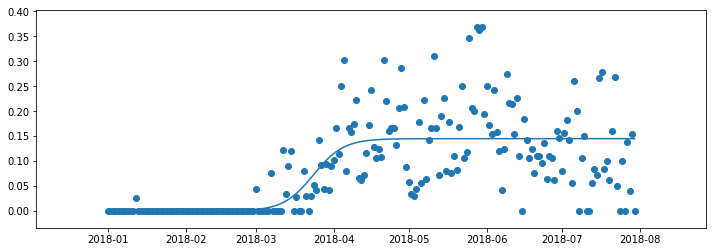

0.4955082003468436
82.95539079746527
2018-03-24
0.0036253354123978263
0.14138808108351522
60.95749308733858
104.95328850759196
43.99579542025339
---
93
46 2019
[0.5520117108456133, 0.029871527973340473, 0.8992735705590426]
999999.9994456678 0.16957108093137935 0.1205943175353221


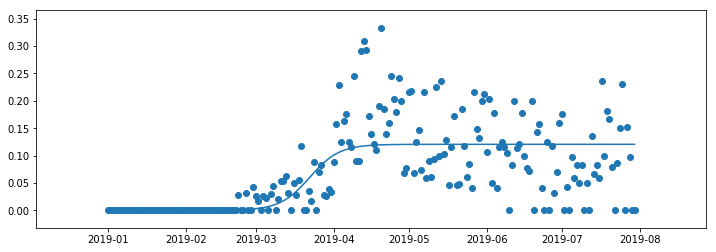

0.4503556853446381
81.47327056905824
2019-03-22
0.003014857938383053
0.11757945959693904
59.868397698004316
103.07814344011213
43.20974574210781
---
94
47 2010
[0.20315807450946421, 0.6370758600037584, 0.39198959284954527]
999999.8954938614 0.1745018603719535 0.11807745099513553


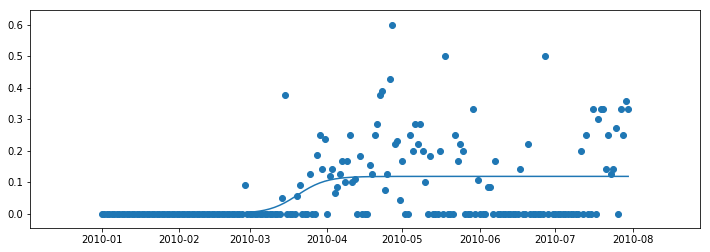

0.19365980123178195
79.17113562004525
2010-03-20
0.0029519362748783883
0.11512551472025714
58.17673683071025
100.16553440938026
41.98879757867001
---
95
47 2011
[0.8726678633746455, 0.6369314858620266, 0.5661523927933907]
999999.9999130955 0.20310436755071407 0.0921230436712628


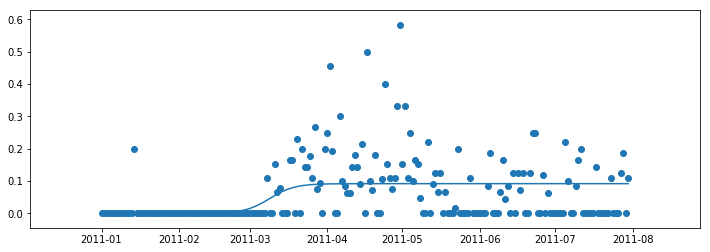

0.16396815794125863
68.02173052446895
2011-03-09
0.00230307609178157
0.08981996757948123
49.98390253332606
86.05955851561187
36.07565598228581
---
96
47 2012
[0.61081041831413, 0.8661687758078574, 0.4873343150152424]
999999.9902336906 0.16930101381977147 0.07681440603119083


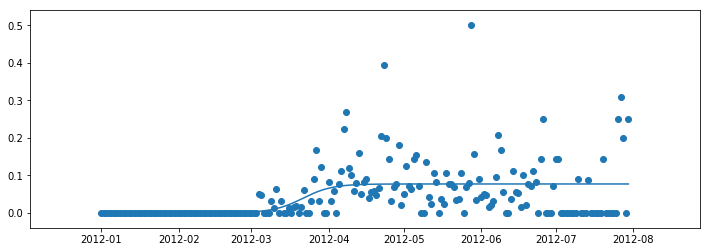

0.2205392749261953
81.60323577805148
2012-03-22
0.001920360150779771
0.07489404588041106
59.963899051871735
103.24257250423122
43.278673452359484
---
97
47 2013
[0.12938780715530873, 0.7551629105503549, 0.1393673677848426]
999999.9999612103 0.1862448487250103 0.09591087573030944


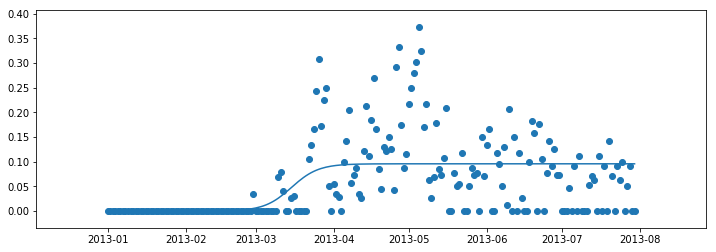

0.28272594001905316
74.17928953473513
2013-03-15
0.0023977718932577364
0.0935131038370517
54.50861584249853
93.84996322697171
39.34134738447318
---
98
47 2014
[0.9984374992174828, 0.23616858699923315, 0.8553230637434642]
999999.9972797281 0.1855751763156651 0.09411885082000217


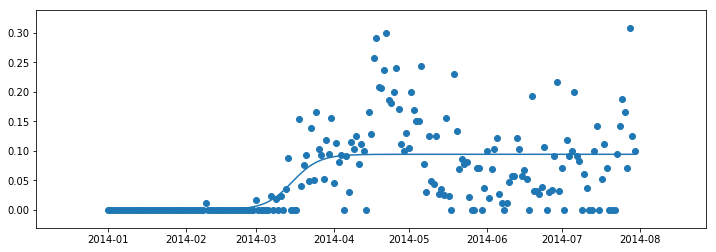

0.3572605951940656
74.44697523414278
2014-03-15
0.0023529712705000544
0.0917658795495021
54.705317331051845
94.18863313723371
39.483315806181864
---
99
47 2015
[0.9563379923702887, 0.9245878199082558, 0.7248554298755112]
999999.9997455649 0.16631059291369896 0.10220292984826124


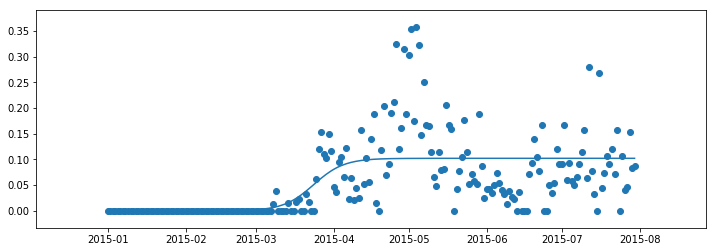

0.3710850970078935
83.07053877727989
2015-03-24
0.002555073246206531
0.0996478566020547
61.04210642101546
105.09897113354434
44.05686471252888
---
100
47 2016
[0.8457369725154539, 0.40632495296445004, 0.645277342158021]
149989.94504677516 0.15544793248423744 0.08659606322731525


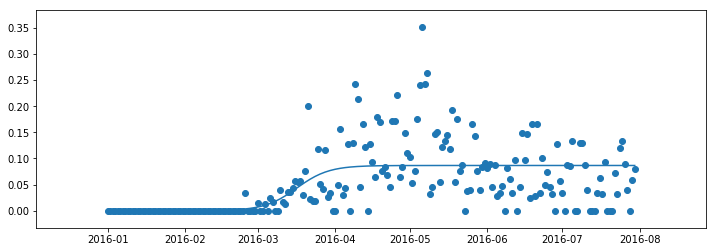

0.3502238989717885
76.67083985834684
2016-03-17
0.0021649015806828814
0.08443116164663236
53.103066472225194
100.23861324446845
47.13554677224326
---
101
47 2017
[0.9633655261578674, 0.5230373263955209, 0.12138585930452173]
14946.41103949292 0.11927635292042953 0.08712472674097767


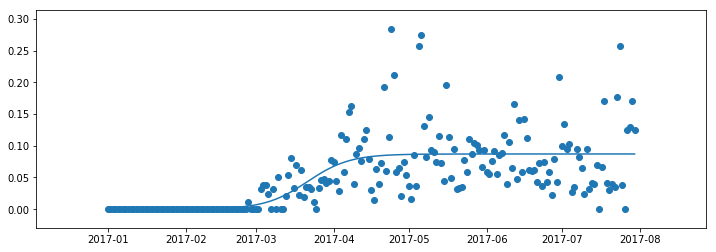

0.4409034661731309
80.58786381709078
2017-03-22
0.002178118168524442
0.08494660857245323
49.872960515397395
111.3027671187842
61.42980660338681
---
102
47 2018
[0.8211859224032914, 0.20949882938700215, 0.44639120054230896]
999999.9996372393 0.19540353358337637 0.09492680691895297


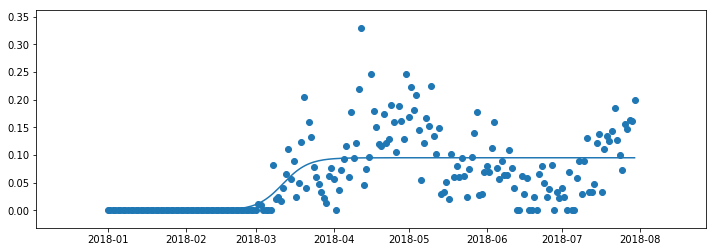

0.40659754715880225
70.7024602075919
2018-03-12
0.0023731701729738245
0.09255363674597915
51.953763196099786
89.45115721908402
37.49739402298424
---
103
47 2019
[0.25456668702465923, 0.5818331900853861, 0.9750841189398616]
999999.9869552752 0.16744354616536533 0.0650169441741936


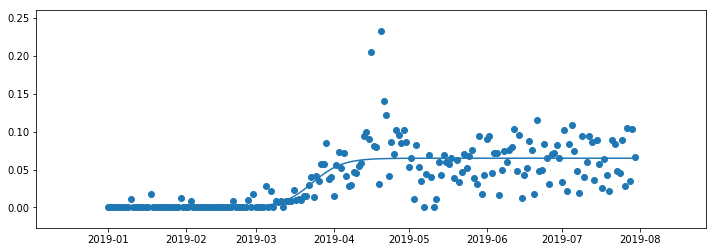

0.5508864695652484
82.50846844389875
2019-03-24
0.00162542360435484
0.06339152056983875
60.629084436398365
104.38785245139911
43.75876801500075
---
104
48 2016
[0.29011412572168616, 0.10155214364787168, 0.5716533478745474]
25085.741631514018 0.15541938728674604 0.08717292631405069


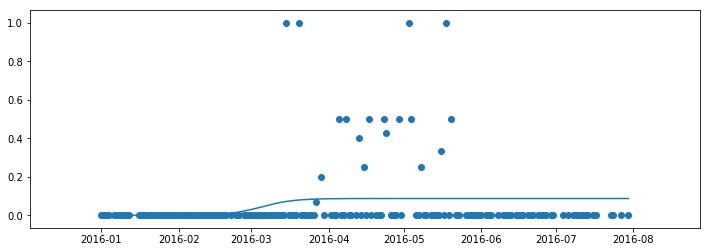

0.04626566981787972
65.17883693964123
2016-03-05
0.002179323157851267
0.08499360315619942
41.60673496390483
88.75093891537759
47.14420395147276
---
105
48 2017
[0.49898984766595766, 0.07141334138707034, 0.772579054004913]
999999.9999984383 0.14227107984588555 0.18091460971315618


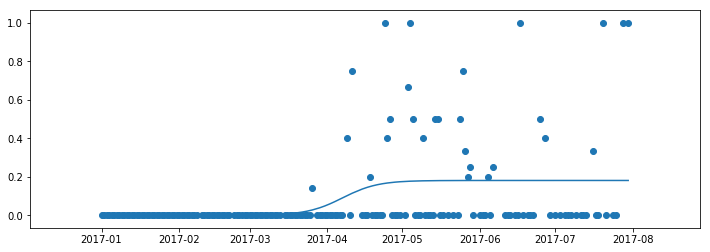

0.14192763333614666
97.10694944417584
2017-04-07
0.004522865242828905
0.17639174447032727
71.3563777180163
122.85752117033535
51.50114345231904
---
106
48 2018
[0.636608136037493, 0.6315903360665399, 0.4791271530400857]
13413.352833921199 0.13621823752360618 0.08533548957063987


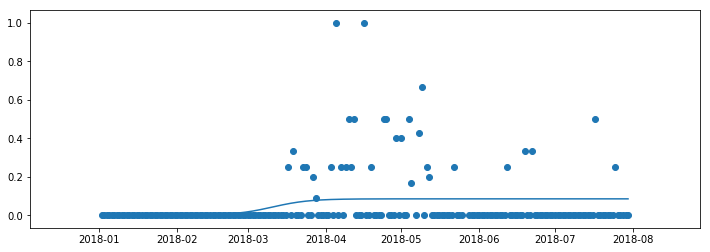

0.06234077791347903
69.77043707733044
2018-03-11
0.002133387239265997
0.08320210233137387
42.875641543841304
96.66523261081961
53.78959106697831
---
107
48 2019
[0.3537670403458786, 0.02896309801464292, 0.3639563750185627]
---
108
56 2018
[0.45789896343827863, 0.23780483195519275, 0.0667618768362257]
999999.5489429265 0.16596737987853621 0.17187256616744273


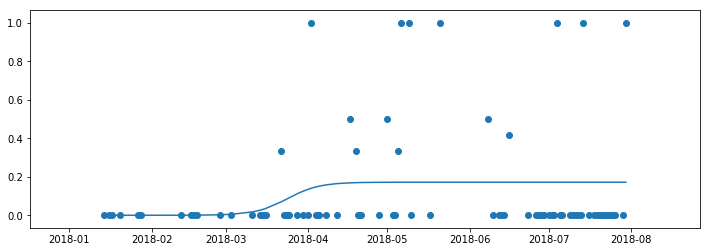

0.05127617812673302
83.24232217811732
2018-03-24
0.004296814154186069
0.16757575201325667
61.16833602004918
105.3163083361855
44.14797231613632
---
109
56 2019
[0.548810773627047, 0.12585247426874546, 0.4382758489339572]
38572.111455815284 0.2050885804375824 0.06481424839707035


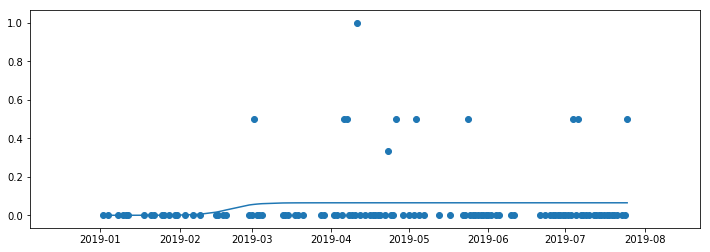

0.022089246827971976
51.49133496680703
2019-02-20
0.001620356209926759
0.0631938921871436
33.62802127906794
69.35464865454614
35.7266273754782
---
110
57 2010
[0.2816947056945033, 0.4961820635255625, 0.06127441630828423]
4414.5429405849445 0.10795290298345805 0.17768946318576181


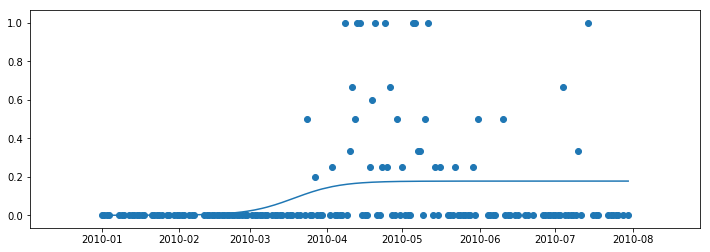

0.10083179180733359
77.74371370771539
2010-03-19
0.004442236579644046
0.17324722660611777
43.80704739415619
111.68038002127464
67.87333262711846
---
111
57 2011
[0.6802795273796017, 0.24380465898593418, 0.5516235576382211]
999999.9978621794 0.15496314695597135 0.17579983864138782


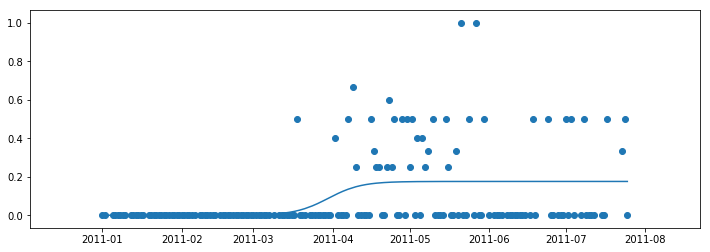

0.16373303282940166
89.15352344871883
2011-03-30
0.0043949959660346954
0.1714048426753531
65.51202081989993
112.79502607753768
47.283005257637754
---
112
57 2012
[0.7186863316397974, 0.6337669936400039, 0.019871051234400583]
999999.9977022909 0.15791667397702985 0.16066738300308794


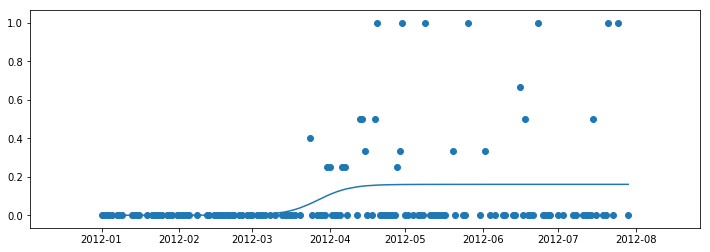

0.09617669524309203
87.48607862445313
2012-03-27
0.004016684575077199
0.15665069842801074
64.2867447361106
110.68541251279566
46.39866777668506
---
113
57 2013
[0.9631351464754367, 0.7394069335632623, 0.49028197267572116]
999481.3415371709 0.15739664050735147 0.1600233284246065


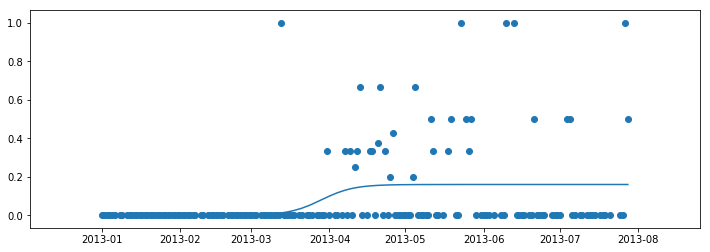

0.10301660903765275
87.77183375973242
2013-03-29
0.004000583210615163
0.15602274521399134
64.4958500136973
111.04781750576751
46.55196749207022
---
114
57 2014
[0.3866164500122875, 0.9967455945911243, 0.2775217194463362]
114.15712179458107 0.055362820393458134 0.2005584784613931


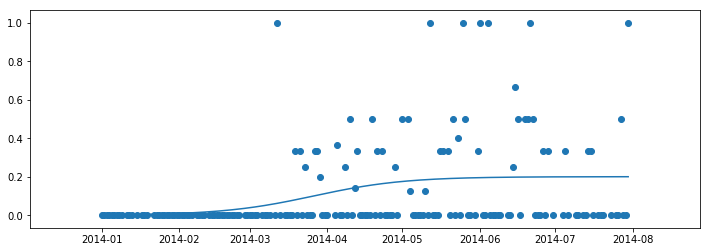

0.11680645439715143
85.57323718608657
2014-03-27
0.005013961961534828
0.19554451649985827
19.39955564144933
151.74691873072368
132.34736308927435
---
115
57 2015
[0.23223026080239928, 0.771507126129871, 0.9385190284875842]
634.0587381228323 0.05699664969110048 0.4394641060267375


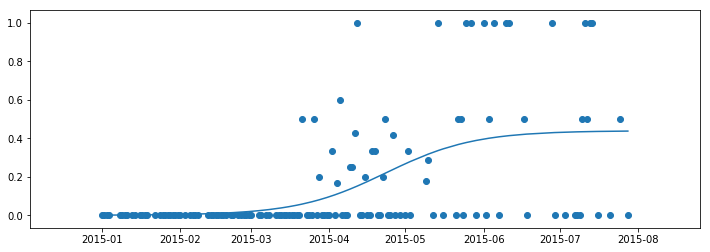

0.28673049685182994
113.20212033505983
2015-04-23
0.010986602650668439
0.42847750337606905
48.92533098016415
177.47890968995546
128.5535787097913
---
116
57 2016
[0.009641257481768362, 0.19552914646502528, 0.6817400492999597]
999999.9990488415 0.18925041402544987 0.2024488395655634


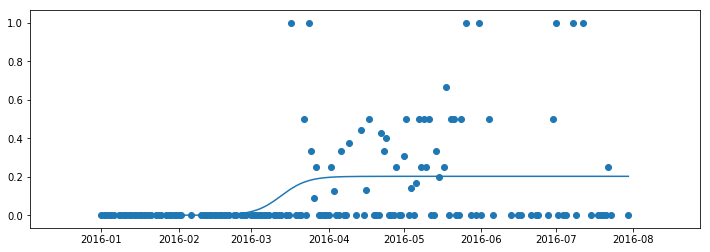

0.1450138003712499
73.0012170813811
2016-03-13
0.005061220989139085
0.1973876185764243
53.6429416187077
92.35949254405452
38.716550925346816
---
117
57 2017
[0.4775067610515896, 0.47196600788422793, 0.36035250319399914]
999999.9999970086 0.15033287279744972 0.31278526072285073


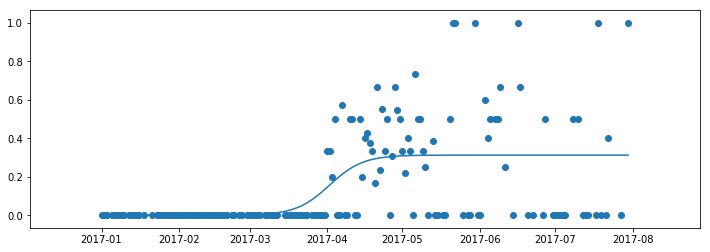

0.3089587960205674
91.8994648401055
2017-04-02
0.007819631518071269
0.30496562920477943
67.52980052147221
116.26912915873874
48.739328637266524
---
118
57 2018
[0.5286854864882466, 0.08047298988598972, 0.9657728577877916]
999999.9916569723 0.17716745185998745 0.19297314560495657


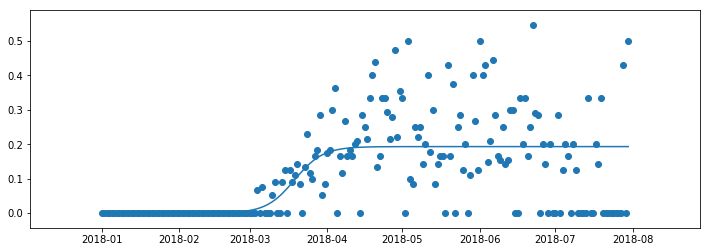

0.3826421203308372
77.97995853402813
2018-03-19
0.004824328640123915
0.18814881696483265
57.30143317472625
98.65848389333003
41.35705071860378
---
119
57 2019
[0.8099905229430628, 0.2321827444667901, 0.3695437985478227]
999999.9999986604 0.1804453428534063 0.1453277607818661


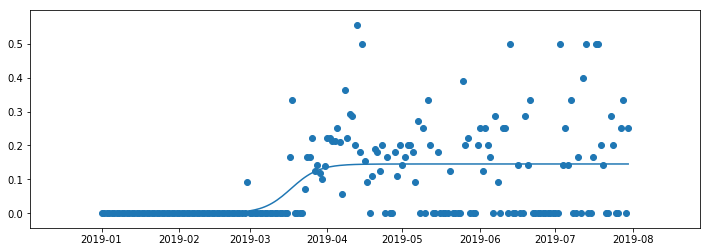

0.25771858942574033
76.56340883891167
2019-03-18
0.0036331940195466527
0.14169456676231945
56.26052050609434
96.86629717172903
40.60577666563469
---
120
58 2011
[0.596118094639046, 0.7843267340859269, 0.5298510004373677]
104.17973736984922 0.05311930968783152 0.47172799541052385


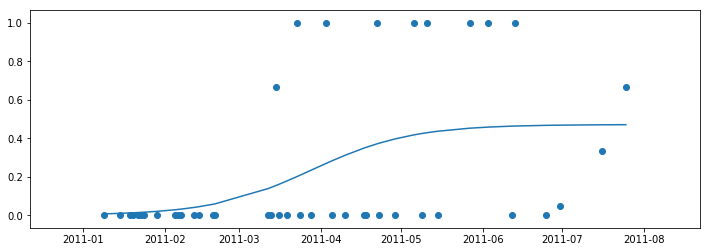

0.2154513546613377
87.46570086642944
2011-03-28
0.011793199885263096
0.45993479552526073
18.497153126267655
156.43424860659115
137.9370954803235
---
121
58 2012
[0.7676761137542912, 0.7775227946508846, 0.9260908342934256]
5062.438353812479 0.15385325619303436 0.09764038527241724


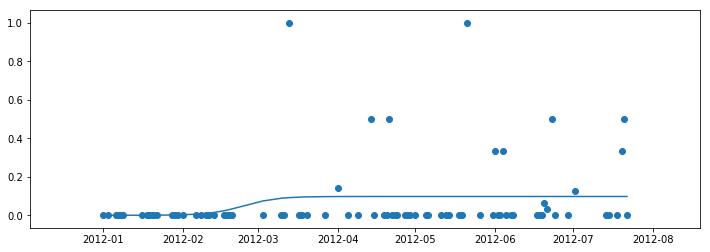

0.05230399936391161
55.43986357762984
2012-02-24
0.0024410096318104313
0.0951993756406068
31.627812167205988
79.25191498805373
47.62410282084774
---
122
58 2013
[0.8466070383898298, 0.9045762495340348, 0.11638972855306828]
3849.1382697910967 0.1360739185198933 0.1989903747648375


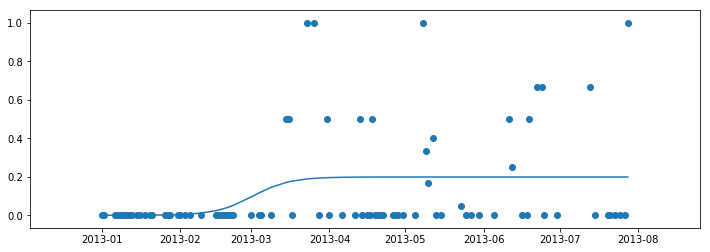

0.12449042500671148
60.66999955611503
2013-03-02
0.004974759369120937
0.19401561539571655
33.74667959899883
87.59331951323118
53.84663991423235
---
123
58 2014
[0.040872642015163385, 0.25515348459049836, 0.5529350033762186]
999999.9999591558 0.20705200818539535 0.09233586505817196


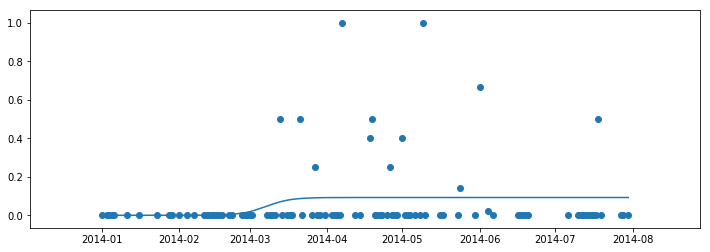

0.046455724134032206
66.72483246601963
2014-03-08
0.002308396626454299
0.09002746843171766
49.03091257489123
84.41875235714804
35.387839782256805
---
124
58 2015
[0.00973566180874852, 0.19410805015213617, 0.5475504782661935]
674.6055168869509 0.02790183905453457 0.9999999851171643


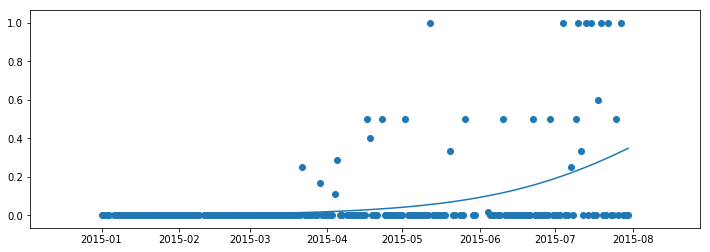

0.16818184222353827
233.46590480556605
---
125
58 2016
[0.8770535251230541, 0.03195190398662939, 0.8505010065029565]
999999.9998591 0.14830478896680677 0.16120205767218376


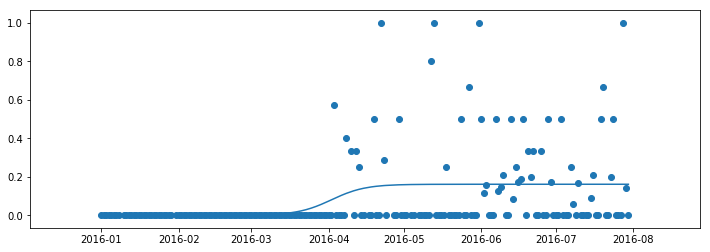

0.14200669173424973
93.15619983731969
2016-04-02
0.004030051441804594
0.15717200623037916
68.45327775602657
117.85912191861277
49.405844162586206
---
126
58 2017
[0.8075820436006909, 0.5120383719997234, 0.07290434425714665]
451141.51939300954 0.1372702903622615 0.22882598154667008


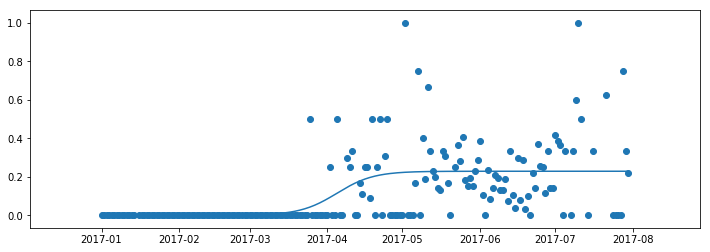

0.31415512002932
94.84598834265093
2017-04-05
0.005720649538666752
0.22310533200800334
68.15731713447202
121.53465955082987
53.37734241635785
---
127
58 2018
[0.8551758143131504, 0.05511442011203471, 0.09729515873944228]
645.4696650387633 0.06999995150805614 0.22080853391910105


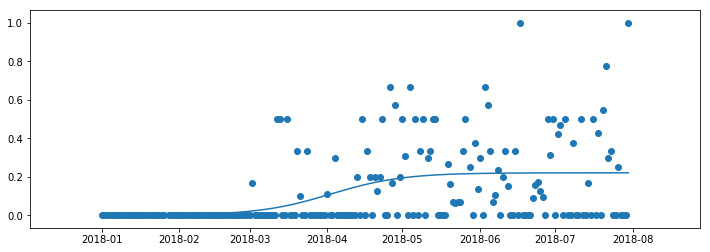

0.19752310567914633
92.42832423848192
2018-04-02
0.0055202133479775265
0.21528832057112351
40.091693037987234
144.76495543897656
104.67326240098933
---
128
58 2019
[0.4086215841394272, 0.9737622337823444, 0.15333485047237505]
163533.91135180183 0.13482400649147144 0.15778706045219193


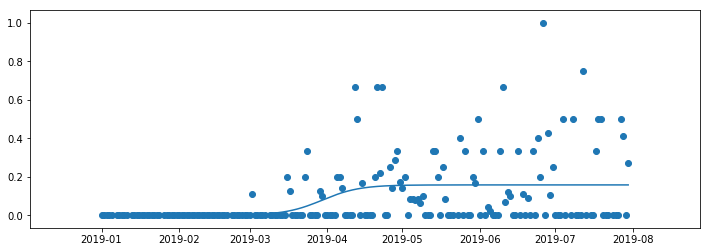

0.16266625506783783
89.0403420658776
2019-03-30
0.003944676511304798
0.15384238394088712
61.86742426387331
116.21325986788185
54.345835604008535
---
129
59 2011
[0.12568594637406338, 0.7782286097221658, 0.1978305865233323]
999999.9988367553 0.2060910641249408 0.1715232433681854


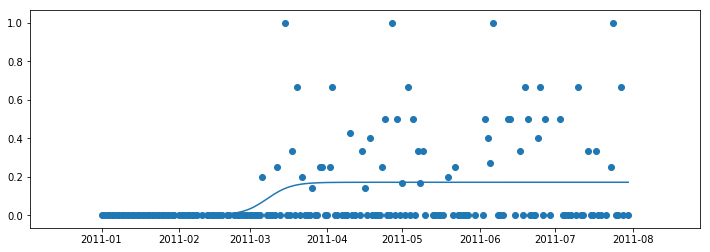

0.12067129917116792
67.03595139100987
2011-03-08
0.004288081084204635
0.16723516228398075
49.25952978008235
84.81237300193736
35.55284322185501
---
130
59 2012
[0.4323554380297683, 0.6734554783362888, 0.8625673395699013]
2055.54976787448 0.09083655865327607 0.2364427255103565


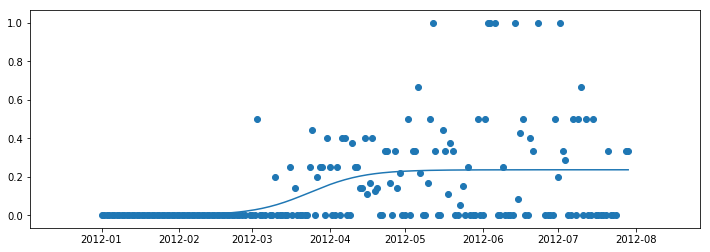

0.19357367412024828
83.97828727984823
2012-03-24
0.005911068137758913
0.2305316573725976
43.6469306053457
124.3096439543508
80.6627133490051
---
131
59 2013
[0.4579492557816892, 0.8882189065235371, 0.6585550565735923]
13928.849632628577 0.11153589801693513 0.22365704872236825


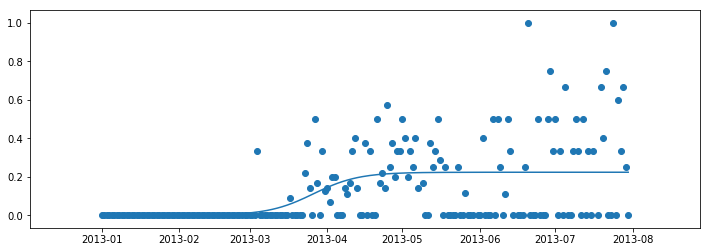

0.2352570469475146
85.54839877567488
2013-03-27
0.005591426218059206
0.21806562250430903
52.701918752056045
118.39487879929365
65.6929600472376
---
132
59 2014
[0.15894298532553652, 0.3950871476368235, 0.26317509062215205]
1384.4833277698658 0.0901832873391625 0.24474380081748123


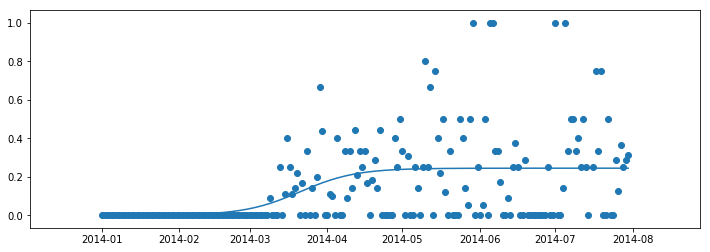

0.22230407732951107
80.20424309082499
2014-03-21
0.0061185950204370315
0.2386252057970442
39.580733411568396
120.8277527700815
81.24701935851311
---
133
59 2015
[0.43742930528451507, 0.6029565271915314, 0.5371997653213539]
999999.9999215298 0.17600576917473365 0.2225026802466744


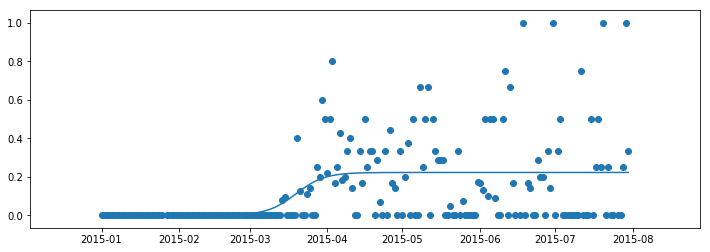

0.21474733852722394
78.49464607134637
2015-03-19
0.0055625670061668605
0.21694011324050755
57.67963720369634
99.30965493899645
41.63001773530011
---
134
59 2016
[0.9401241916020023, 0.11778094069361078, 0.19443535863445915]
13727.51584991279 0.10909680390523968 0.2379127352099267


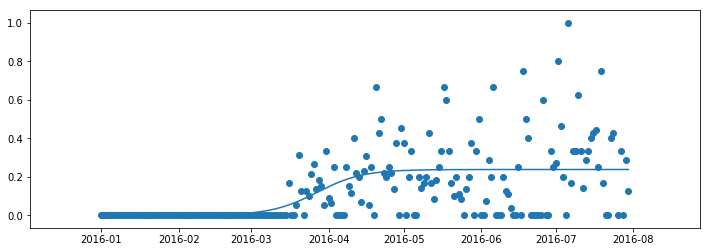

0.31309765939517176
87.32755876182992
2016-03-27
0.005947818380248168
0.23196491682967854
53.746724906130744
120.90839261752912
67.16166771139837
---
135
59 2017
[0.6448299612655032, 0.061554596205813605, 0.29466766421604007]
999999.999964528 0.16440225607672557 0.17069819275058845


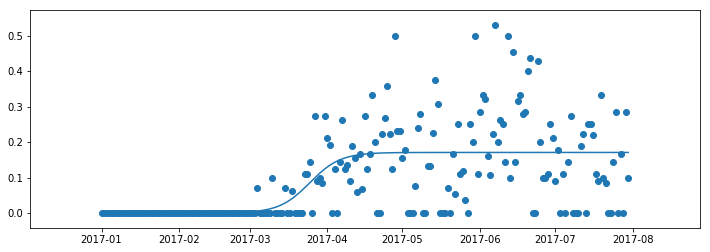

0.37421154202301943
84.03479908135314
2017-03-25
0.004267454818764712
0.16643073793182372
61.75066665180861
106.31893151089766
44.56826485908905
---
136
59 2018
[0.20798218505441524, 0.7033671804573933, 0.683211646276311]
999999.5823500853 0.1895263785200812 0.13557137044520862


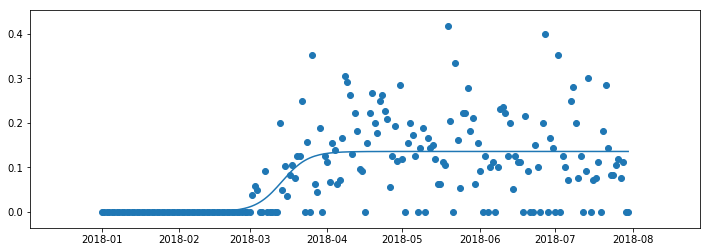

0.3862902297674571
72.8949196844937
2018-03-14
0.0033892842611302158
0.1321820861840784
53.56483130979565
92.22500805919175
38.6601767493961
---
137
59 2019
[0.12724767458268837, 0.6050610014251551, 0.08061698754069446]
71935.98858128181 0.13432188059207575 0.11754427990631187


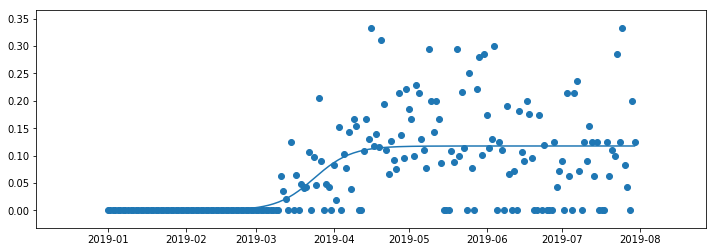

0.38370188435092156
83.25919727882858
2019-03-24
0.002938606997657797
0.11460567290865407
55.98470089759062
110.53369366006649
54.54899276247587
---
138
60 2010
[0.9945816424232244, 0.5455176594326828, 0.7157731482879522]
1943.320655045021 0.09638970839086446 0.15224609237878733


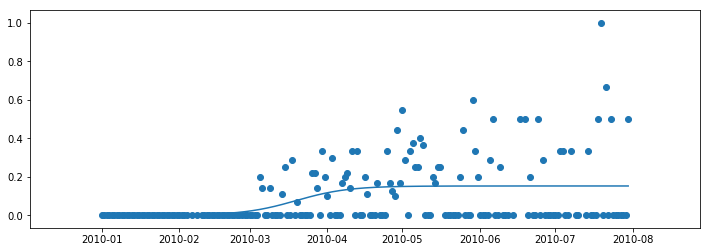

0.1566687130447394
78.5576965951508
2010-03-20
0.0038061523094696835
0.14843994006931766
40.549887387203576
116.56550580309808
76.0156184158945
---
139
60 2011
[0.35646898231232926, 0.5662482016575866, 0.5920591249461856]
999999.9898640349 0.16511696199248713 0.13527408129591045


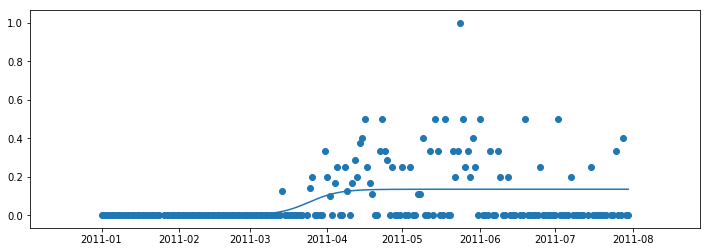

0.16690084839246888
83.67105584498896
2011-03-25
0.0033818520323977614
0.13189222926351268
61.483379897460686
105.85873179251719
44.375351895056504
---
140
60 2012
[0.836153562102211, 0.08883742587662691, 0.16495294147163364]
999999.9922925038 0.1536993067461325 0.221455977422671


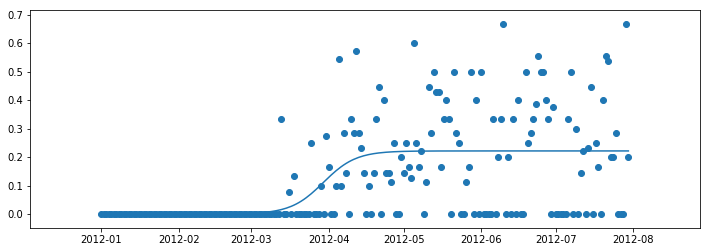

0.32531849514866795
89.88661590436494
2012-03-30
0.005536399435566775
0.21591957798710423
66.05071368926382
113.72251811946609
47.67180443020227
---
141
60 2013
[0.765819868229752, 0.19984179746366648, 0.14306951407339907]
4668.207937261866 0.09279839878246103 0.1438566775237024


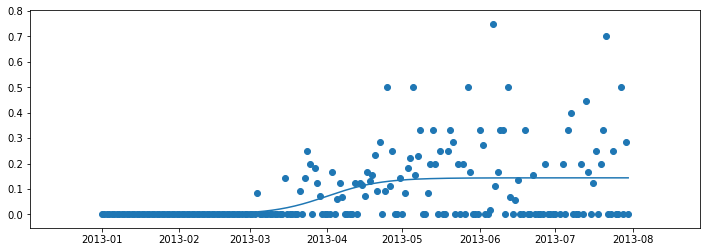

0.20972966451802466
91.04177063956608
2013-04-01
0.00359641693809256
0.14026026058560984
51.56305447423863
130.52048680489347
78.95743233065483
---
142
60 2014
[0.11159589740676457, 0.9794404546526126, 0.43882220831467644]
247722.87352082948 0.1603023010247867 0.14028193365221356


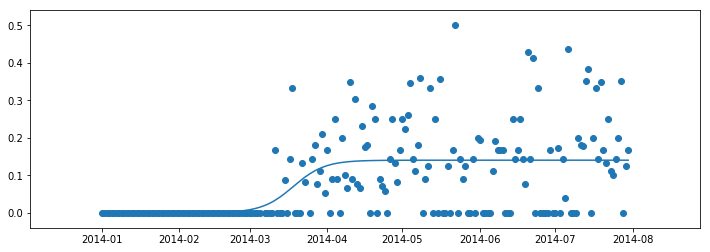

0.29985813627426583
77.47902478916032
2014-03-18
0.003507048341305339
0.13677488531090823
54.62494457503308
100.33310500328759
45.7081604282545
---
143
60 2015
[0.6455102989602813, 0.7310639625957538, 0.2548597396140604]
70286.29999175912 0.11707090735935367 0.1871765687577429


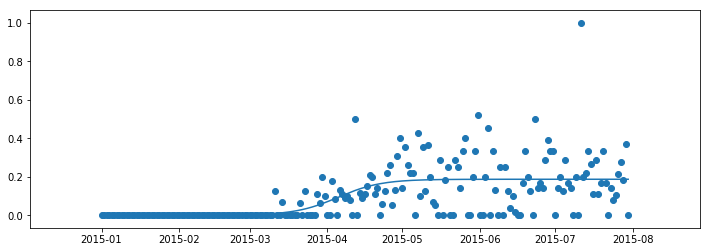

0.35792968822404847
95.3296803734802
2015-04-05
0.004679414218943573
0.18249715453879933
64.03615298256143
126.6232077643989
62.587054781837466
---
144
60 2016
[0.5343181878273923, 0.5059645318145655, 0.8660100072188034]
674115.5899506162 0.16071065458803044 0.1610265007979583


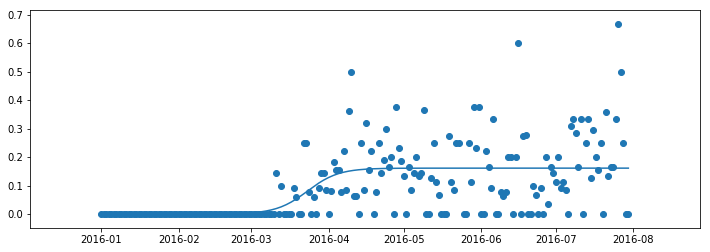

0.33206467544677465
83.51130737434575
2016-03-24
0.004025662519948957
0.15700083827800934
60.71529764169355
106.30731710699797
45.59201946530442
---
145
60 2017
[0.6752986413796545, 0.15684682164679076, 0.6725151497822213]
27939.189044980583 0.11604745991866325 0.19214902352394922


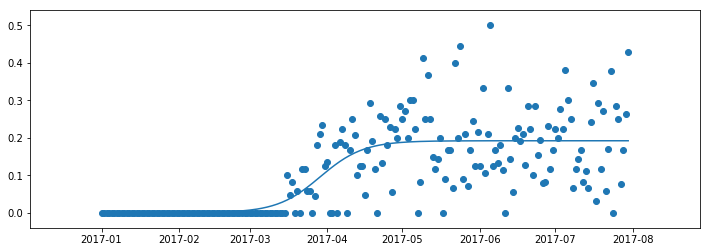

0.5492821119782396
88.22067811471169
2017-03-29
0.004803725588098731
0.18734529793585047
56.65116639340897
119.79018983601435
63.13902344260538
---
146
60 2018
[0.9505193649994292, 0.32716712828495154, 0.46141898880145615]
223.9639879667981 0.056728664336796686 0.15699189518539142


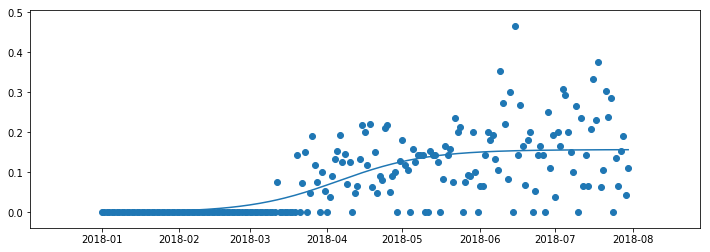

0.4766363020776574
95.39243227722159
2018-04-05
0.003924797379634785
0.15306709780575664
30.812000339336162
159.97286421510708
129.16086387577093
---
147
60 2019
[0.6101174345080556, 0.7099165750891365, 0.37567328323736304]
36578.688169562294 0.11705902578390374 0.1997007628745131


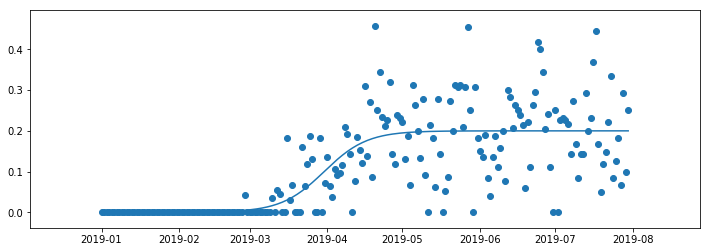

0.5697216255390672
89.76002481637103
2019-03-31
0.004992519071862828
0.19470824380265028
58.4633211098773
121.0567285228648
62.5934074129875
---
148
61 2010
[0.28900841419253076, 0.954205203136268, 0.4607086929688473]
444.9812760474606 0.05628526321252365 0.1386129833926961


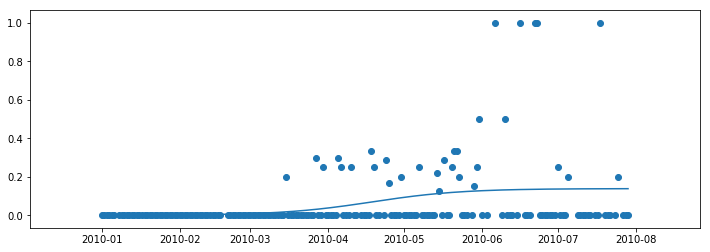

0.09384787349959056
108.3415419407035
2010-04-18
0.0034653245848174025
0.13514765880787868
43.25236162903548
173.43072225237142
130.17836062333595
---
149
61 2011
[0.48409843565359456, 0.18715197899837288, 0.7106865461870369]
999997.2002615222 0.15480501254311013 0.18878032981683668


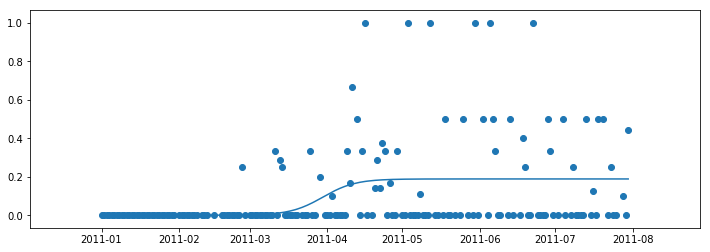

0.13086273817891325
89.24457633033381
2011-03-30
0.004719508245420917
0.18406082157141576
65.57892373972784
112.91022892093983
47.33130518121199
---
150
61 2012
[0.7164909653161503, 0.6085176562083158, 0.07270792761828182]
149.08365639503504 0.04858332252722111 0.21979489099261582


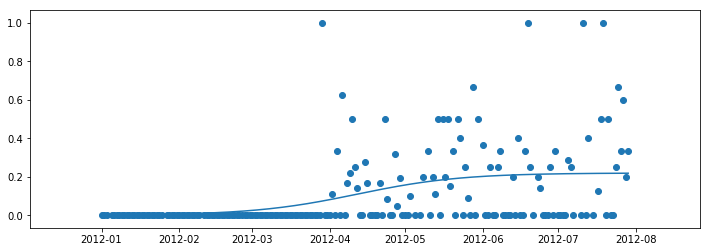

0.19030362979962467
103.00875568775142
2012-04-12
0.005494872274815396
0.2143000187178004
27.60095203091091
178.41655934459183
150.8156073136809
---
151
61 2013
[0.04889440377976628, 0.9064534887166172, 0.028418445503357703]
56258.0484799799 0.12186099592502928 0.1976284075544923


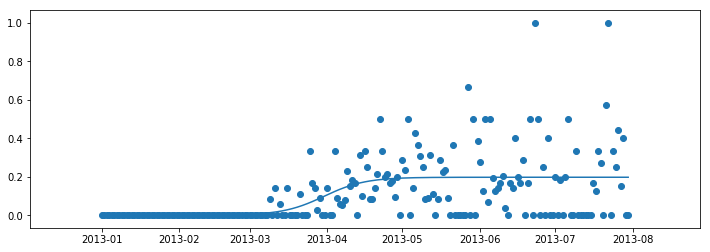

0.26593715470929224
89.7555802075398
2013-03-31
0.004940710188862308
0.19268769736563
59.692132766296794
119.81902764878285
60.126894882486056
---
152
61 2014
[0.7033696303197783, 0.04187144818706734, 0.9437254377450405]
999999.9999822703 0.17643486818036128 0.17844827594303922


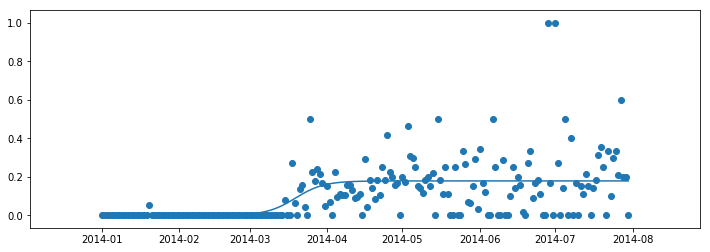

0.2825900982566123
78.30374290768637
2014-03-19
0.004461206898575981
0.17398706904446323
57.53935725130606
99.06812856406667
41.52877131276061
---
153
61 2015
[0.986390572414593, 0.1962902177996272, 0.676657849304195]
50300.964241285226 0.11736818963558687 0.2081204618782973


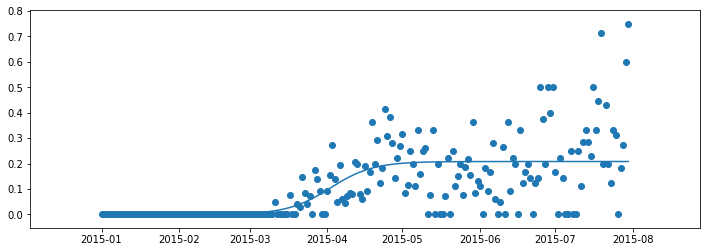

0.4141818306610382
92.23776526947897
2015-04-02
0.005203011546957433
0.20291745033133987
61.023501357727966
123.45202918122999
62.42852782350202
---
154
61 2016
[0.5034779337755568, 0.8539578458479041, 0.8387614681448657]
17700.204017332566 0.10753939683623132 0.18341729874163654


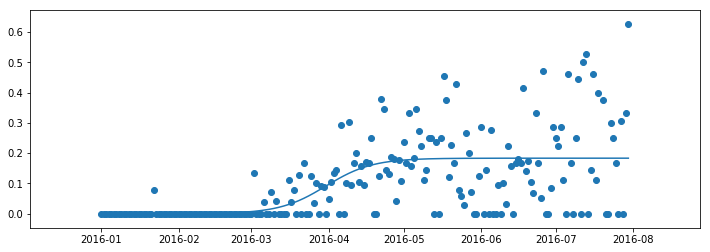

0.36201309749356325
90.95579603997756
2016-03-31
0.004585432468540914
0.1788318662730956
56.88863782717131
125.02295425278372
68.13431642561241
---
155
61 2017
[0.35297810559267173, 0.9711957767253613, 0.44001688123165306]
13057.567697905662 0.1057549562873381 0.18264093513997612


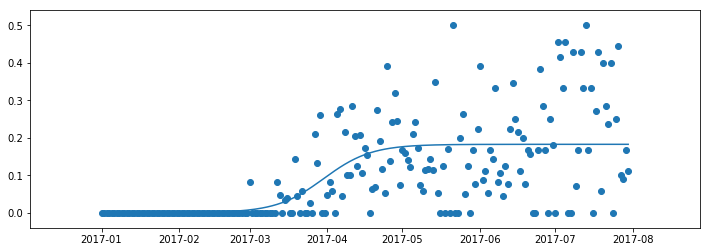

0.39930996633419935
89.61398574216064
2017-03-31
0.0045660233784994035
0.17807491176147672
54.97200039467787
124.25597108964342
69.28397069496555
---
156
61 2018
[0.16241648619565374, 0.9048855202112549, 0.002686220818281737]
1289.0299118670075 0.07998957996974952 0.18201057258109718


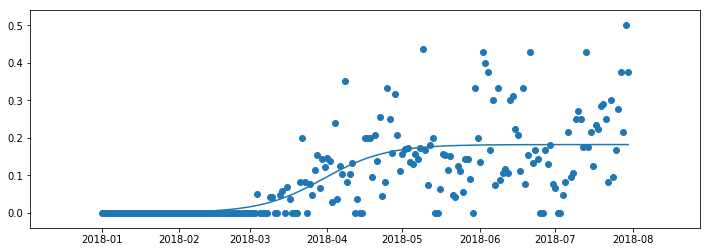

0.47157012288415623
89.53222670828984
2018-03-31
0.004550264314527429
0.17746030826656975
43.73174060103521
135.33271281554454
91.60097221450933
---
157
61 2019
[0.7528402002429658, 0.33346425640461475, 0.9619592735372987]
7718.349752155363 0.08983138203962428 0.1863747612890138


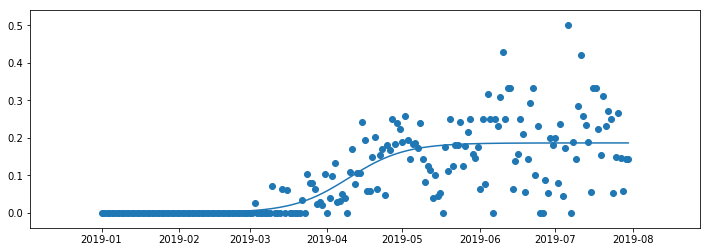

0.578725291561947
99.64619996100852
2019-04-10
0.004659369032225346
0.18171539225678845
58.86355181569039
140.42884810632657
81.56529629063618
---
158
62 2010
[0.040660520740829376, 0.25036293243379537, 0.9515578133496575]
999999.9999901499 0.16919040143117645 0.14197062633032992


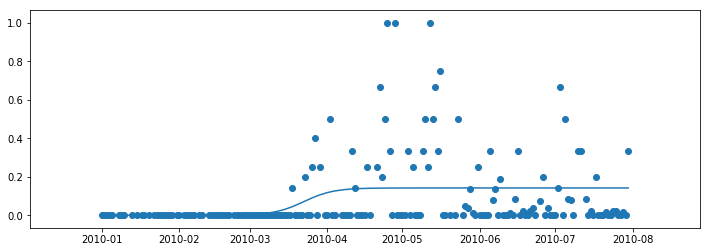

0.11330547119094125
81.65658595930644
2010-03-23
0.003549265658258248
0.13842136067207167
60.00310198421277
103.31006993440015
43.30696795018738
---
159
62 2011
[0.47748821183987067, 0.9426721325661679, 0.2358358343729723]
999999.862479981 0.16059281157813174 0.35254919549397323


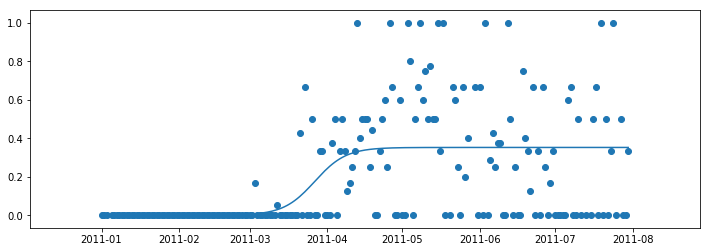

0.3021810196564093
86.0281994236256
2011-03-27
0.00881372988734933
0.3437354656066239
63.21546197835552
108.84093686889564
45.62547489054012
---
160
62 2012
[0.01966582460255606, 0.033647344135948054, 0.08992725686585423]
999999.9999923427 0.15798647604901905 0.30915505811810295


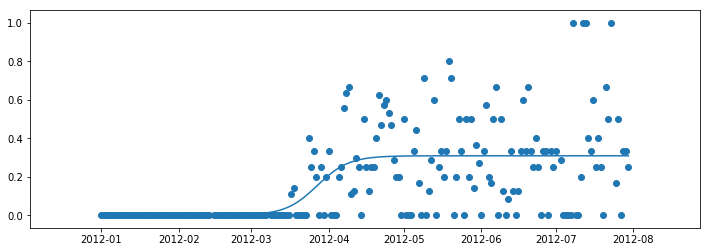

0.3628679313298063
87.44742526993278
2012-03-27
0.007728876452952574
0.3014261816651504
64.25834138282246
110.63650915704311
46.37816777422064
---
161
62 2013
[0.9722933383030726, 0.7563462729098871, 0.43869506346286047]
3575.8605282279223 0.08713034604181949 0.3456312390444524


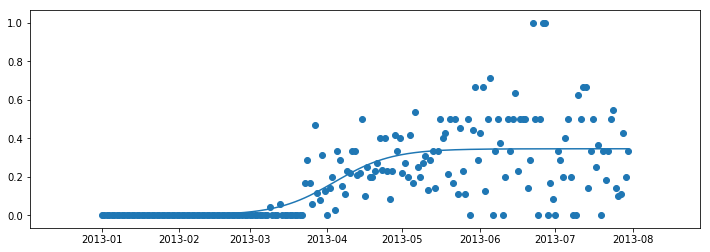

0.49869539450791256
93.90483918693894
2013-04-04
0.00864078097611131
0.3369904580683411
51.85793116282451
135.9517472110533
84.09381604822877
---
162
62 2014
[0.1790686373972069, 0.029051747661874017, 0.46813806981706074]
246514.89645259947 0.14241234361694916 0.25577944565038657


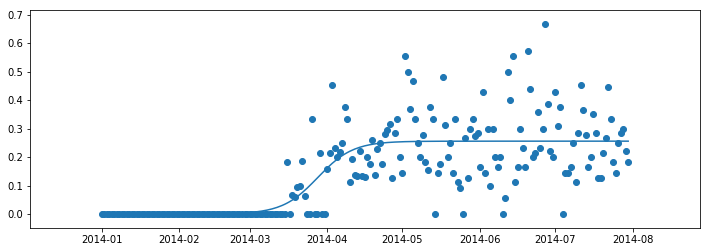

0.5830947647409599
87.17767987786804
2014-03-28
0.006394486141259665
0.2493849595091269
61.45265104199943
112.90270871373662
51.450057671737184
---
163
62 2015
[0.2968401398888252, 0.39767236059310984, 0.24983023810654104]
33902.46207583623 0.11606650154588764 0.24522986188233875


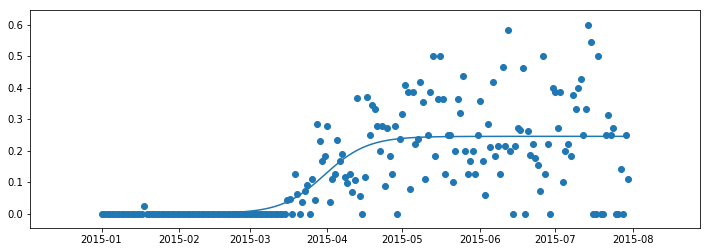

0.5189613854084099
89.87298470621184
2015-03-31
0.006130746547058469
0.23909911533528028
58.3086522129021
121.43731719952154
63.12866498661944
---
164
62 2016
[0.5825503663455258, 0.7269702291096468, 0.7415933818636228]
2023.0593316555594 0.07780612278699978 0.2841023235239272


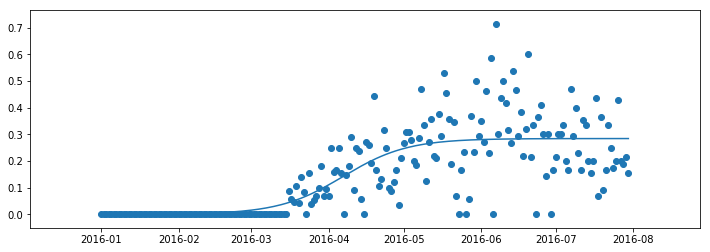

0.6000665075904028
97.83762373208813
2016-04-07
0.007102558088098181
0.27699976543582905
50.75184802573496
144.92339943844135
94.17155141270639
---
165
62 2017
[0.9168727692312121, 0.0954354810244562, 0.39627213484871937]
999999.9999772569 0.15643732399346513 0.21569675105134706


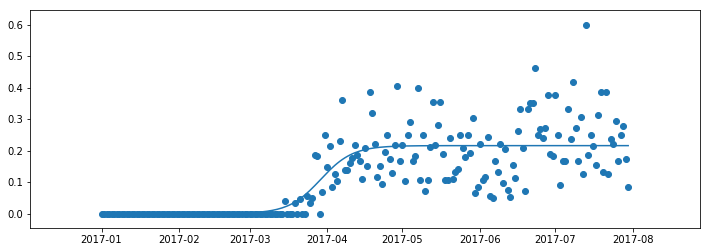

0.635126062492771
88.31339098154508
2017-03-29
0.005392418776283677
0.21030433227506337
64.89467252863493
111.73210943445521
46.83743690582028
---
166
62 2018
[0.03809269523535319, 0.5682642325779395, 0.5380480469224282]
136291.47503963954 0.13388831444762606 0.17289666608473672


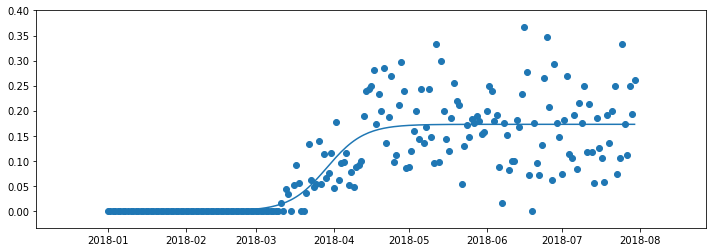

0.6594280959597926
88.30159016446028
2018-03-29
0.004322416652118418
0.1685742494326183
60.93877167470518
115.66440865421539
54.72563697951021
---
167
62 2019
[0.9040437105982523, 0.08152767684277729, 0.7786231983667184]
629047.2203630412 0.14217407192490963 0.18243139136119135


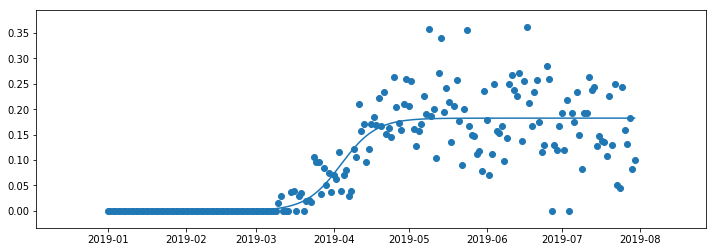

0.7281254976142464
93.91277484150595
2019-04-04
0.004560784784029784
0.17787060657716156
68.14463303809339
119.68091664491845
51.536283606825066
---
168
71 2011
[0.2588593631597298, 0.7671555391258431, 0.3407697190878427]
999999.9999833596 0.1422219348176823 0.3240509469695769


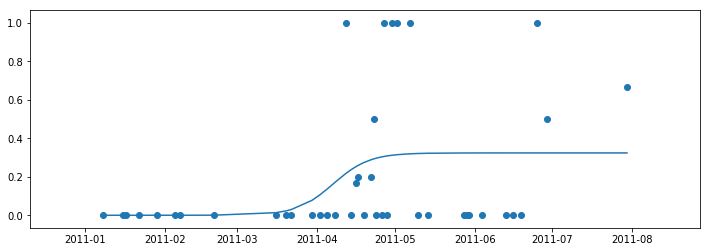

0.15103510450932578
97.1405049133811
2011-04-07
0.008101273674239424
0.3159496732953375
71.381035033956
122.89997479280622
51.51893975885022
---
169
71 2012
[0.7056751693542616, 0.12678640855751278, 0.153044019988111]
---
170
71 2013
[0.2902017863149765, 0.7854424430637094, 0.7576089409870091]
497.9922500865712 0.052570908666286824 0.39235210753316296


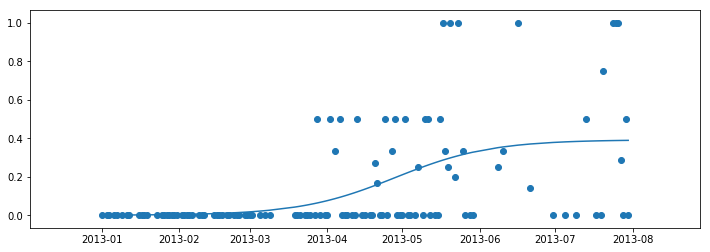

0.2655102532756619
118.13728680727917
2013-04-28
0.009808802688329074
0.3825433048448339
48.44928370682961
187.82528990772877
139.37600620089916
---
171
71 2014
[0.6370147479631537, 0.31656026469379306, 0.012834364743985693]
571.7008955595619 0.05611846306658602 0.35533066806804176


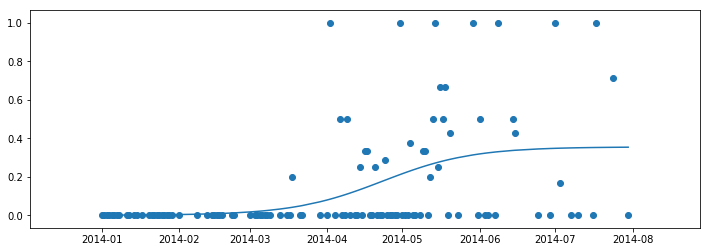

0.2100257424622013
113.12882780166402
2014-04-23
0.008883266701701044
0.3464474013663407
47.84618380297261
178.41147180035546
130.56528799738285
---
172
71 2015
[0.8779829402883008, 0.5285897479978077, 0.08664661456215184]
73.5738479277922 0.02218739454100668 0.9999999916716587


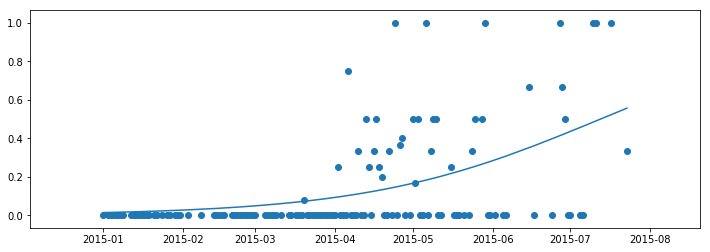

0.25722995267486426
193.72665085028717
2015-07-13
0.024999999791791468
0.9749999918798672
28.607594651116884
358.84570704945764
330.2381123983408
---
173
71 2016
[0.14737493574623095, 0.33582650155471705, 0.25463788034058865]
5477.767120021223 0.08077279235271807 0.3299942914394201


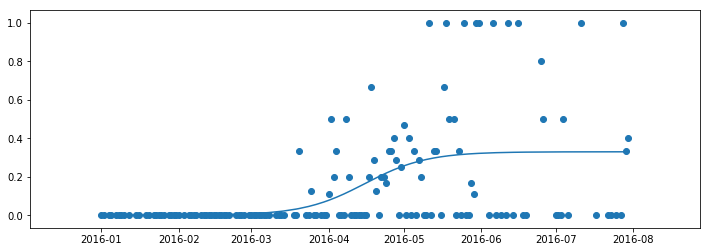

0.2420494092694626
106.57614508937942
2016-04-16
0.008249857285985504
0.3217444341534346
61.21976282972409
151.9325273490348
90.71276451931072
---
174
71 2017
[0.0051992901437301065, 0.11928844857781007, 0.9564166121805461]
999999.9999977668 0.1444639412851834 0.2892561249121308


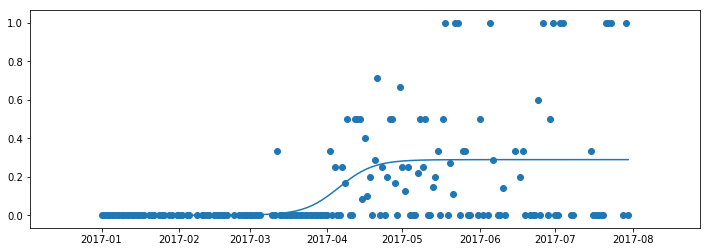

0.22153490724563485
95.63293396993176
2017-04-06
0.007231403122803271
0.2820247217893275
70.27323788565089
120.99263005421258
50.7193921685617
---
175
71 2018
[0.7564009734866509, 0.4571813716257619, 0.18801566122562807]
327900.3252765102 0.14306704868459671 0.22961052499187115


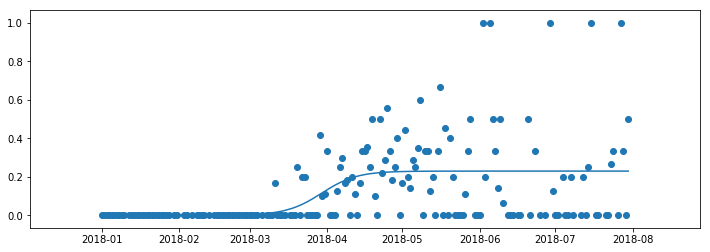

0.23049643714890644
88.77281716232648
2018-03-30
0.0057402631247967795
0.22387026186707437
63.16551149820898
114.380122826444
51.214611328235016
---
176
71 2019
[0.8552203867468267, 0.05818418464839126, 0.45518056585302935]
999999.9824737546 0.14422884652282503 0.18386959674017023


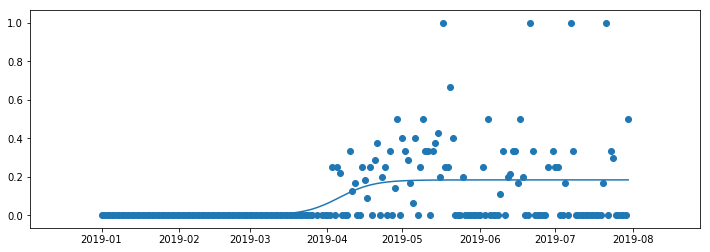

0.20861514915945023
95.7888166862074
2019-04-06
0.004596739918504256
0.17927285682166597
70.38778399092153
121.18984938149325
50.80206539057171
---
177
72 2010
[0.1160670645473676, 0.7818370484103038, 0.3823406441089191]
494704.5153114212 0.12985043579574662 0.677929345700483


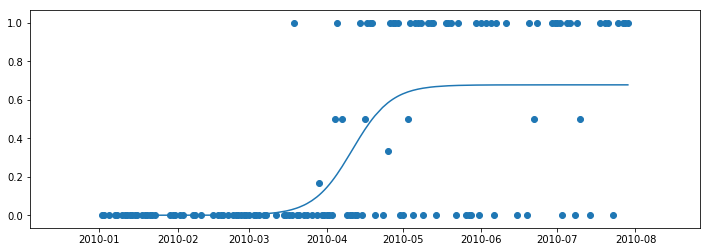

0.43260800559218004
100.97552498916318
2010-04-11
0.016948233642512075
0.6609811120579709
72.76182186465161
129.18922811367477
56.427406249023164
---
178
72 2011
[0.1416192211021029, 0.00977842307838317, 0.5406188915685805]
999999.9893375742 0.1411540842288908 0.7041786885859773


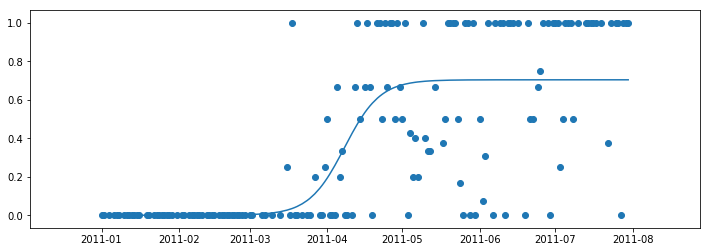

0.5428246306992343
97.87538648119506
2011-04-08
0.017604467214649432
0.6865742213713278
71.92104257295267
123.82973038943742
51.90868781648474
---
179
72 2012
[0.29912921803432946, 0.7643212305928536, 0.803725510439208]
999999.9999992463 0.14167278929163113 0.6740676796046152


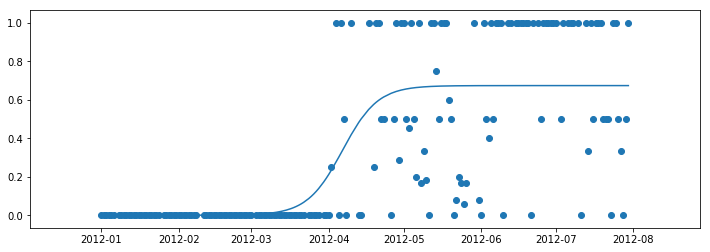

0.556474907382301
97.51703645450586
2012-04-07
0.01685169199011538
0.6572159876144998
71.65771890702491
123.37635400198683
51.71863509496191
---
180
72 2013
[0.9549595447031696, 0.16992857245583248, 0.1942020278540696]
288.5661641315543 0.049450071475766556 0.5096179126735851


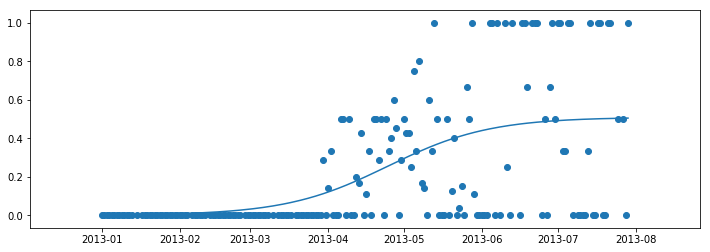

0.34760768521269003
114.5584673389441
2013-04-25
0.01274044781683963
0.4968774648567455
40.472393511426844
188.64454116646127
148.17214765503442
---
181
72 2014
[0.31777482405869006, 0.580464601800613, 0.002421528135533757]
35.218939400645795 0.025177480620426483 0.47931874116057893


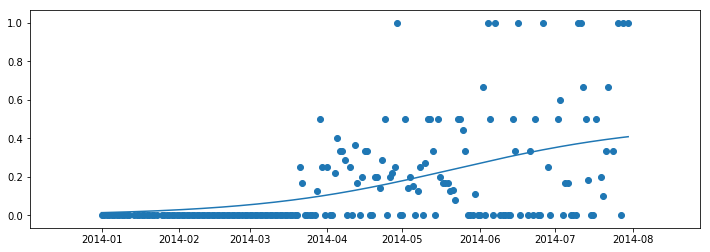

0.26753126399998317
141.45910954139023
2014-05-21
0.011982968529014475
0.46733577263156445
-4.050351923844674
286.9685710066253
291.01892293047
---
182
72 2015
[0.6776107958942877, 0.8825836518039024, 0.3318768214112371]
58.805352459320716 0.02743047729832157 0.41665902378998826


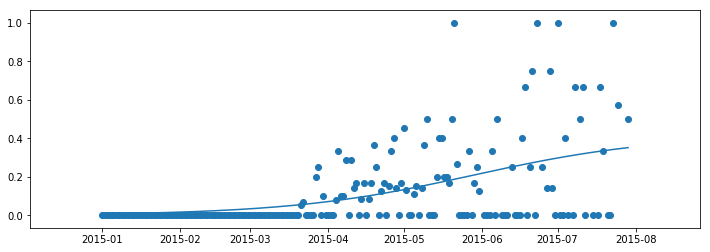

0.2708168123519822
148.52941983735732
2015-05-29
0.010416475594749708
0.40624254819523853
14.97134841605496
282.08749125865955
267.1161428426046
---
183
72 2016
[0.6262755194062679, 0.7701362913722264, 0.8060427280665386]
239.7675750689296 0.041058730796292006 0.46453075957572654


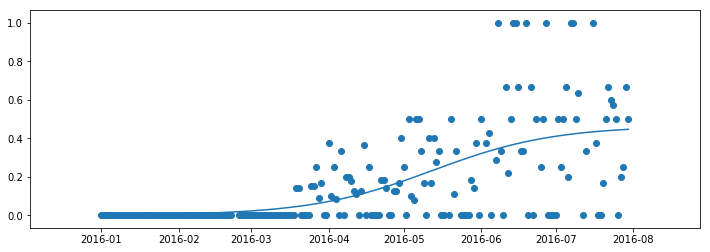

0.41280360103290925
133.45931329630312
2016-05-12
0.011613268989393164
0.45291749058633335
44.23196566332415
222.68666092928197
178.4546952659578
---
184
72 2017
[0.8593977088736339, 0.40860812027376237, 0.984145583457378]
999999.9999998824 0.14255703008963239 0.26147816504273264


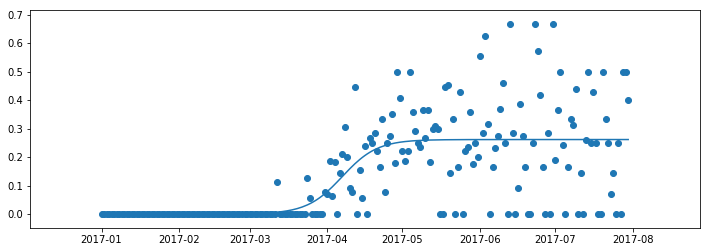

0.4825471019118044
96.91216595405844
2017-04-07
0.006536954126068317
0.25494121091666433
71.21324641409475
122.61108549402216
51.39783907992741
---
185
72 2018
[0.028118176156818664, 0.07849090091742184, 0.10527194615692737]
3120.3073109044444 0.08986179415335158 0.25815996218293397


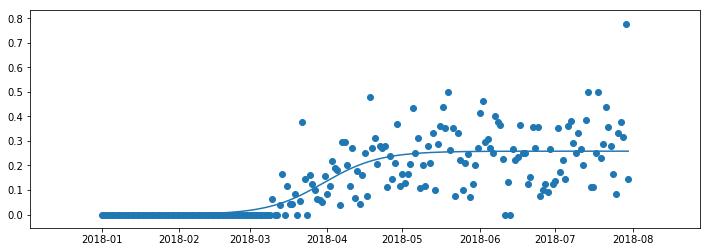

0.5915520776352692
89.53400996320623
2018-03-31
0.0064539990545733495
0.25170596312836063
48.76516397424589
130.3028559521666
81.5376919779207
---
186
72 2019
[0.4732219351226894, 0.09299863539037834, 0.1162440499183729]
14482.229124748746 0.09975602167087855 0.19155704281106256


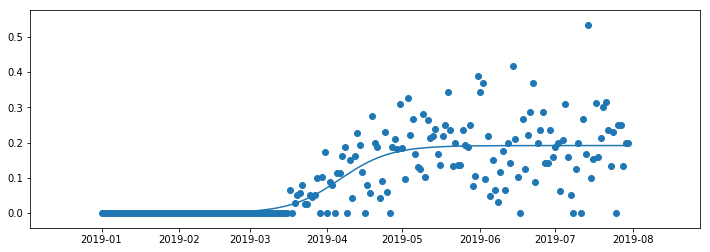

0.5919918330884886
96.04109545166003
2019-04-06
0.004788926070276565
0.186768116740786
59.31587741703648
132.76631348628362
73.45043606924713
---
187
73 2010
[0.5418598491301881, 0.8687119107658949, 0.2549343469220955]
999999.9936832354 0.12113811812194203 0.4526322903877452


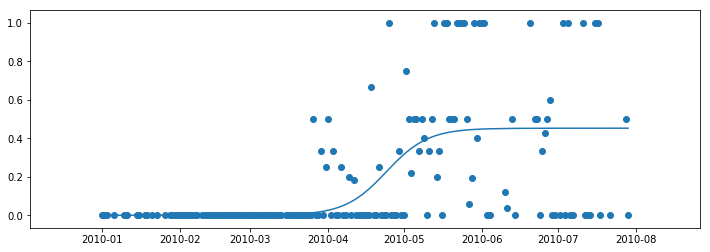

0.3426538273044796
114.04759101293216
2010-04-24
0.011315807259693632
0.44131648312805155
83.80474340288613
144.29043862297812
60.48569522009198
---
188
73 2011
[0.7435430848685127, 0.5673656850108665, 0.09244256792987005]
999999.9992541479 0.19007222830218984 0.18034869252032196


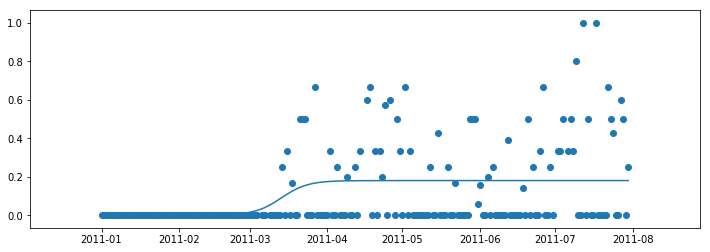

0.14947299265568814
72.68558211067835
2011-03-14
0.004508717313008049
0.1758399752073139
53.411005920067986
91.9601583012887
38.549152381220715
---
189
73 2012
[0.6932790499095043, 0.44694591743876855, 0.5136867831594744]
999999.9999916159 0.17952105826224704 0.17205062634670604


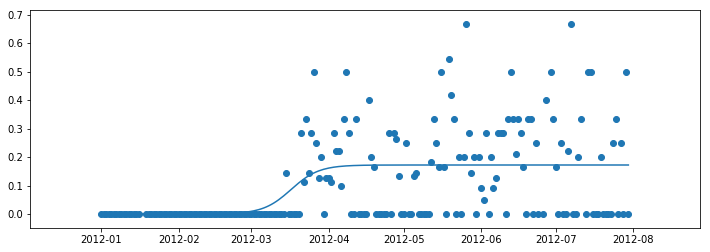

0.2574382961154922
76.95760425929522
2012-03-17
0.004301265658667651
0.1677493606880384
56.55018419619678
97.36502432239371
40.81484012619693
---
190
73 2013
[0.4570287863964706, 0.7769970613115756, 0.6799078919166445]
999999.99951169 0.155515105361436 0.15518476178194826


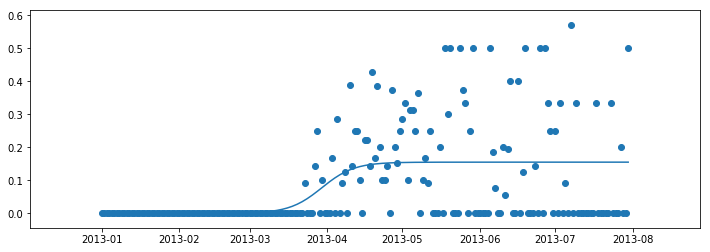

0.24311770361619367
88.83709736984737
2013-03-30
0.0038796190445487067
0.15130514273739956
65.27950379965957
112.39469094003522
47.11518714037565
---
191
73 2014
[0.3518323316449812, 0.858498207311202, 0.006211581133901745]
117945.98041084279 0.1384284365863696 0.19026203596285485


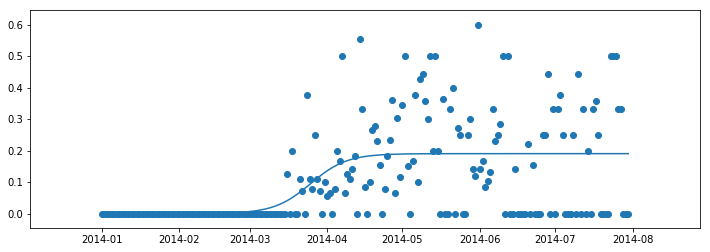

0.3047562464134548
84.36114929473935
2014-03-25
0.004756550899071371
0.18550548506378348
57.89576590623419
110.82653268324454
52.93076677701035
---
192
73 2015
[0.9396829581779834, 0.8950663468593497, 0.05733168261047206]
19315.85908650478 0.10328596023279657 0.21775740457175705


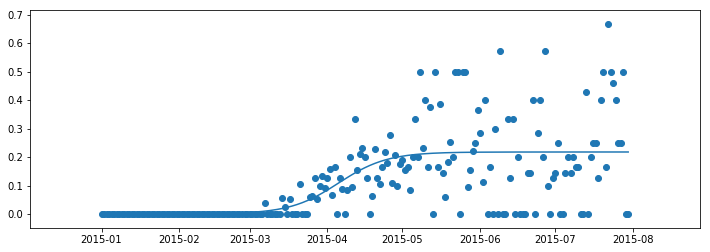

0.4100661261745917
95.5471753329708
2015-04-06
0.005443935114293926
0.21231346945746313
60.077091713935516
131.0172589520061
70.94016723807059
---
193
73 2016
[0.5330711317420174, 0.7482534742967544, 0.9341759903069045]
171.95501604901136 0.04672022911588045 0.29830497626875635


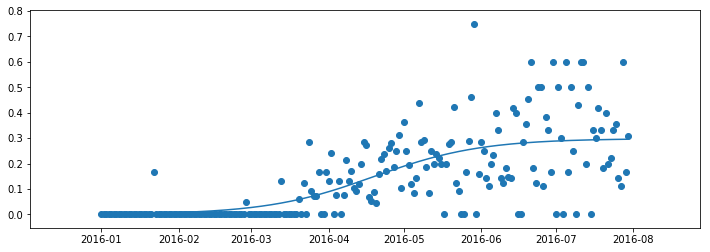

0.5061614724553689
110.17139696044369
2016-04-19
0.007457624406718909
0.2908473518620374
31.75650654877868
188.5862873721086
156.8297808233299
---
194
73 2017
[0.2162418219518243, 0.19551699540177792, 0.49012505485443125]
448.9580597337436 0.05876987923993744 0.2994648206832119


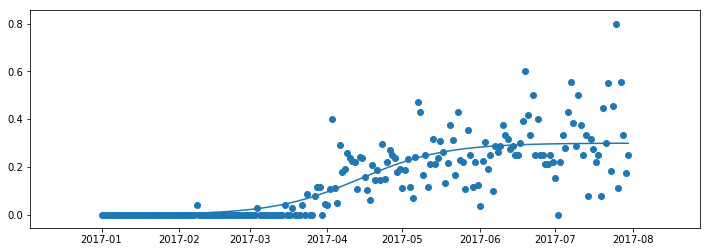

0.6522258455649805
103.91257484606257
2017-04-14
0.007486620517080298
0.2919782001661316
41.57517185136575
166.2499778407593
124.67480598939355
---
195
73 2018
[0.8314627128792598, 0.9785756807117193, 0.7474805525439983]
10198.446173495355 0.10007127636369847 0.22768635055998376


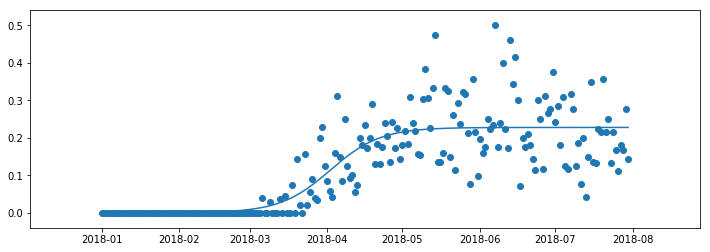

0.6864388717031714
92.2341653582074
2018-04-02
0.005692158763999595
0.22199419179598417
55.62464283333406
128.8436878830808
73.21904504974674
---
196
73 2019
[0.435004620236502, 0.5667118737393142, 0.027619383961557276]
659208.4487021085 0.13853208432535372 0.15367831848705468


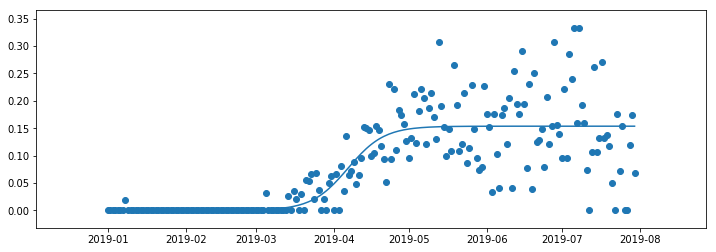

0.6406594845871212
96.71979700114953
2019-04-07
0.0038419579621763672
0.1498363605248783
70.27421463681088
123.16537936548812
52.89116472867724
---
197
74 2010
[0.49540641448654954, 0.018410753283266357, 0.6753648153798412]
24227.332587208006 0.11969991628465602 0.2227604207638486


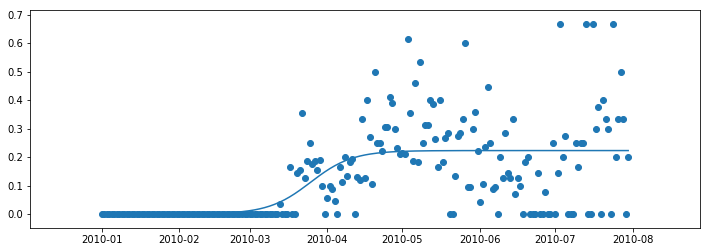

0.3833507609311396
84.33787619822463
2010-03-25
0.005569010519096216
0.2171914102447524
53.73165891886245
114.94409347758678
61.212434558724325
---
198
74 2011
[0.2533167154318985, 0.7865192091677164, 0.11322979368495412]
999999.9999955127 0.1797001430104878 0.2322656344558974


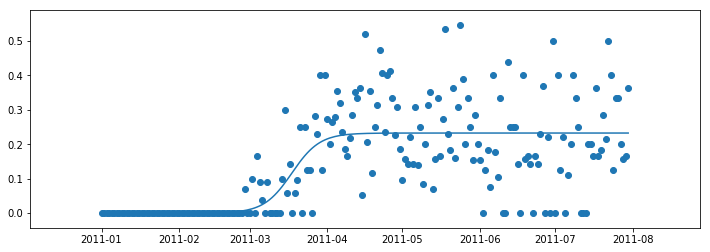

0.4921841806249734
76.88091020135401
2011-03-18
0.005806640861397435
0.22645899359449997
56.49382767178791
97.26799273092014
40.77416505913223
---
199
74 2012
[0.36255532117131306, 0.057731664994646104, 0.10231594493004592]
79708.45488769491 0.1292680937038237 0.26294581878416434


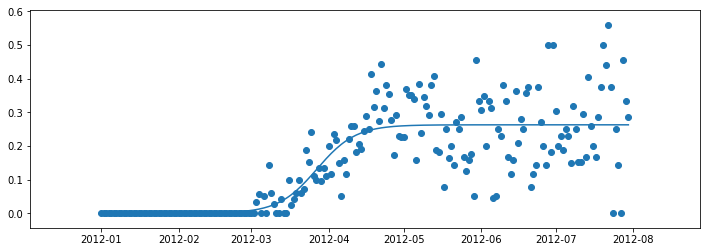

0.6680462279847749
87.30793979929187
2012-03-27
0.0065736454696041086
0.25637217331456025
58.96713627105603
115.64874332752771
56.681607056471684
---
200
74 2013
[0.11753678831164005, 0.4192664957098382, 0.01441703018881313]
999999.9924141078 0.16284174580982957 0.22272210349925778


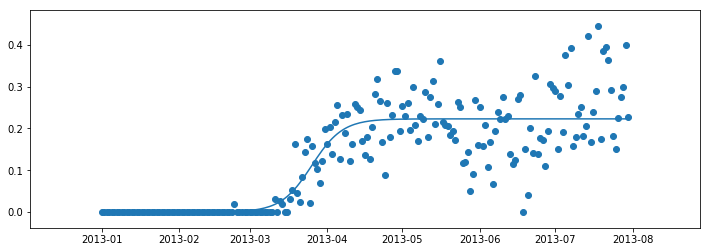

0.7286041782513795
84.84010338793875
2013-03-26
0.005568052587481445
0.21715405091177634
62.34242241608255
107.33778435979497
44.99536194371242
---
201
74 2014
[0.4285459531456285, 0.24080958799413477, 0.8341665412234324]
93526.18881199119 0.13754635979990973 0.23708603386167565


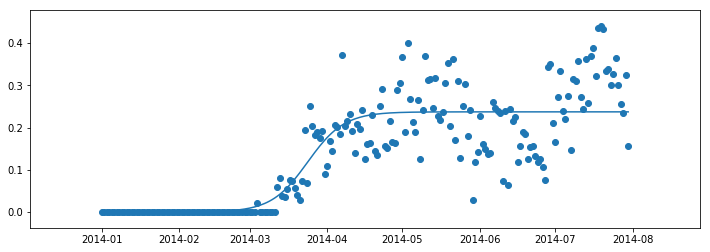

0.722436934024874
83.21555573665654
2014-03-24
0.005927150846541891
0.23115888301513376
56.5804513874097
109.85066008590341
53.27020869849371
---
202
74 2015
[0.23702319160958585, 0.9512961729819104, 0.42090733751540677]
412414.9242529875 0.15073119782959007 0.19536836207450925


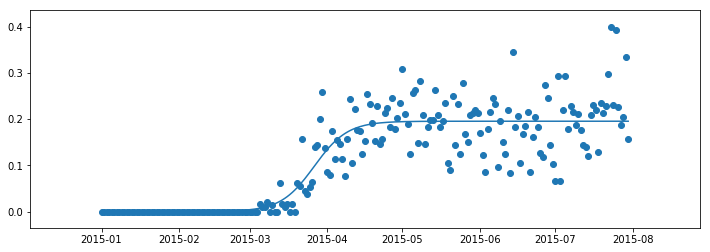

0.7690789672655358
85.78041842318707
2015-03-27
0.004884209051862732
0.1904841530226465
61.47515382712446
110.08568301924967
48.61052919212521
---
203
74 2016
[0.5457244414250999, 0.5095787360884539, 0.1548649415527792]
16835.59112155436 0.10616849078009824 0.20782869859906017


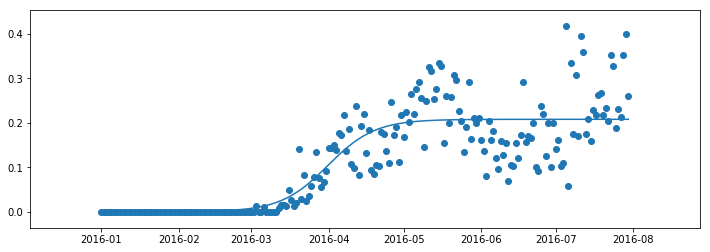

0.7286050437964493
91.65855492652767
2016-04-01
0.005195717464976504
0.20263298113408365
57.151502794480244
126.16560705857505
69.01410426409481
---
204
74 2017
[0.5322410740460586, 0.07458645882523851, 0.7114071580125653]
30035.05990987022 0.11429525613653434 0.19553864846444347


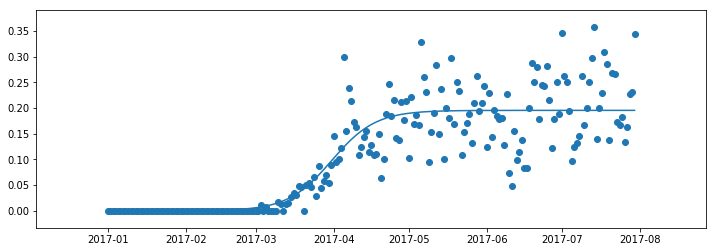

0.7653511203176702
90.20602420834172
2017-03-31
0.004888466211611087
0.19065018225283237
58.15253598873228
122.25951242795111
64.10697643921883
---
205
74 2018
[0.5402320918588279, 0.24326345046052544, 0.10869790757733122]
25805.96999027393 0.11649364070135908 0.16585012293834467


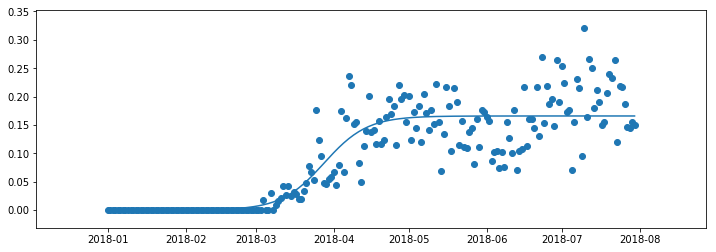

0.7761361845040762
87.20099292935366
2018-03-28
0.004146253073458617
0.16170386986488605
55.75239518553789
118.64959067316947
62.89719548763158
---
206
74 2019
[0.7984061974796827, 0.7665403832638102, 0.28163286662975584]
29953.122540525987 0.10627256013328458 0.16761113854951926


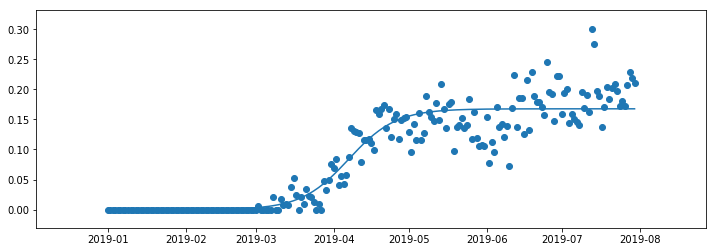

0.8756227347965656
96.99012467216423
2019-04-07
0.004190278463737982
0.16342086008578127
62.5168642036586
131.46338514066989
68.94652093701129
---
207
75 2010
[0.6861833206011458, 0.8875105584966875, 0.4552596558274088]
999999.9997619416 0.14433663731864566 0.04041623047333563


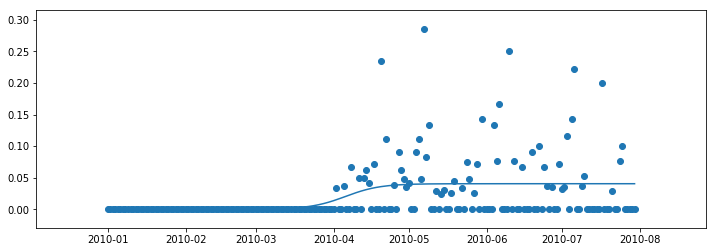

0.1625672122499403
95.71728158822434
2010-04-06
0.0010104057618333909
0.03940582471150224
70.33521841848483
121.09934475796382
50.76412633947899
---
208
75 2011
[0.15159826380537378, 0.4592555064999718, 0.21844117902562077]
25742.482342926767 0.12123544557332025 0.029759352514014462


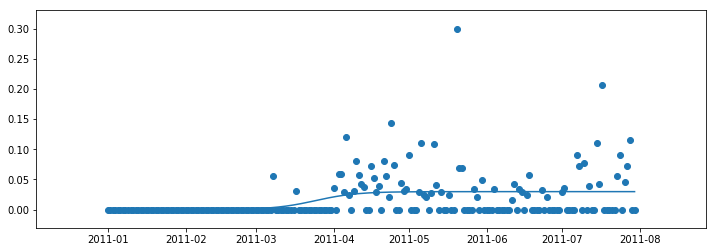

0.13571197566261228
83.77003827215918
2011-03-25
0.0007439838128503616
0.0290153687011641
53.551469529290884
113.98860701502744
60.43713748573656
---
209
75 2012
[0.18789433473629835, 0.8180172084654226, 0.29536676829353326]
999999.9974411788 0.1532027055469471 0.045611160272627266


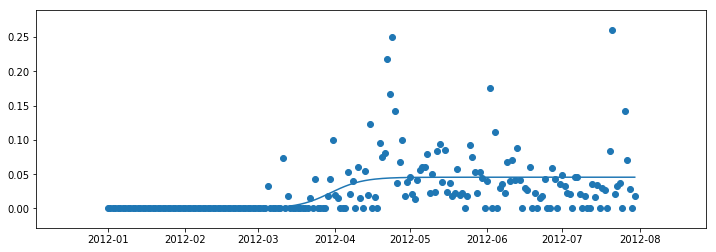

0.24072540533740872
90.17798025226035
2012-03-30
0.0011402790068156816
0.044470881265811585
66.26481479574697
114.09114570877377
47.826330913026794
---
210
75 2013
[0.28487258110213365, 0.3519069629887912, 0.7053111733728986]
999999.999788782 0.1521657953701342 0.055735487482074145


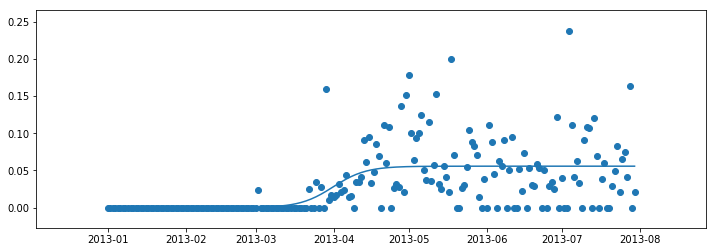

0.33640930818418757
90.792484106876
2013-04-01
0.0013933871870518537
0.05434210029502229
66.71636609876354
114.86860211498846
48.15223601622492
---
211
75 2014
[0.8011448416789161, 0.2575593321031858, 0.29192847398679234]
999999.9999999967 0.15943440998920622 0.14698268778613344


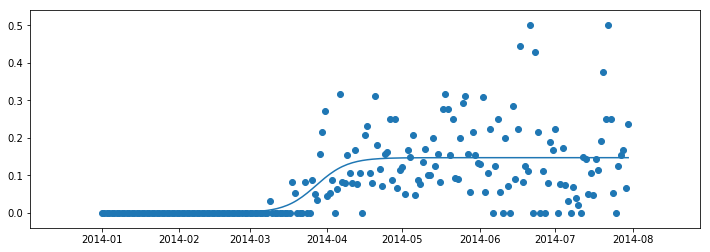

0.416751895426387
86.6532548331291
2014-03-28
0.003674567194653336
0.1433081205914801
63.67476702502249
109.63174264123575
45.956975616213256
---
212
75 2015
[0.86236754634762, 0.9220478317616868, 0.967974523540938]
194780.71950074527 0.12127447896513366 0.2095162134084669


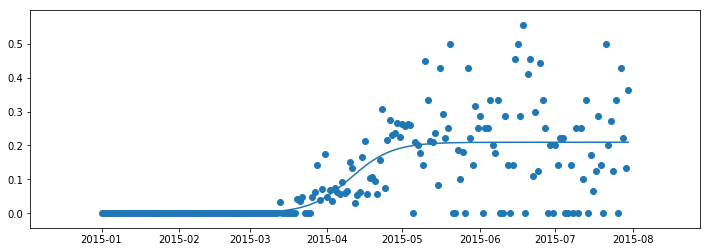

0.48387183639645226
100.43027843413707
2015-04-10
0.005237905335211673
0.20427830807325523
70.22143583681766
130.63912103145645
60.41768519463879
---
213
75 2016
[0.2981926112090513, 0.6881044764716402, 0.6744396158256014]
15705.157187660248 0.09828272196849887 0.24738544179743902


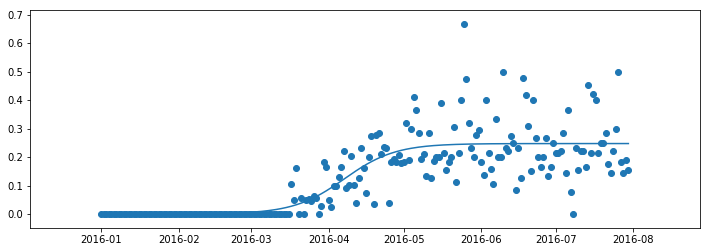

0.6683597019422436
98.30562511063516
2016-04-07
0.006184636044935975
0.24120080575250302
61.02988047564353
135.58136974562674
74.55148926998322
---
214
75 2017
[0.5139668447763852, 0.9686519690084344, 0.21789399394394837]
24588.999450930558 0.10474919740702236 0.24035638238267998


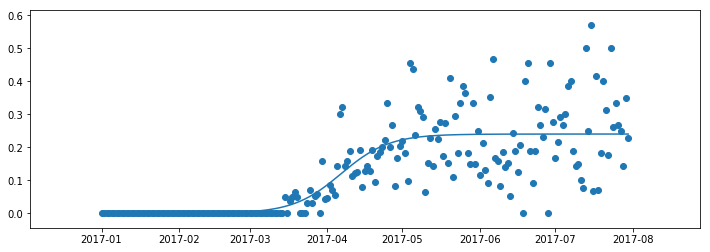

0.6233671214171239
96.51677239903968
2017-04-07
0.006008909559567
0.23434747282311297
61.54216890022527
131.49137589785406
69.94920699762878
---
215
75 2018
[0.6203651467611362, 0.6379083301470384, 0.4061005546477737]
64709.50132459432 0.12024218559261435 0.16936449011048832


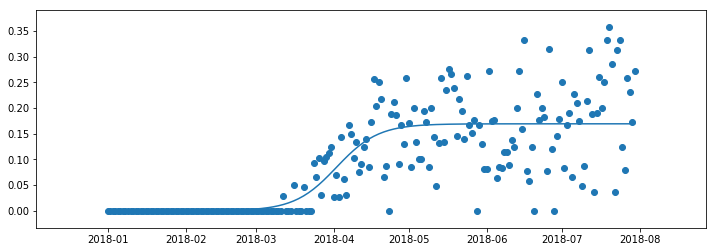

0.6232941320674876
92.12792720885739
2018-04-02
0.004234112252762208
0.1651303778577261
61.65973812801392
122.59611628970082
60.936378161686896
---
216
75 2019
[0.36866856383042224, 0.8455840697896079, 0.19521812927700222]
999999.9999984782 0.14375053550555525 0.16238306966309507


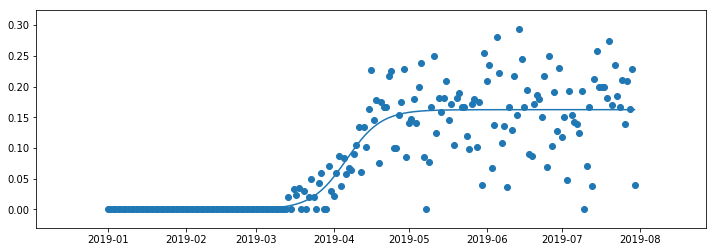

0.7427250449815976
96.10754150845477
2019-04-06
0.004059576741577377
0.15832349292151768
70.62199021471321
121.5930928021963
50.97110258748309
---
217
76 2010
[0.5557730123793255, 0.19000196683567172, 0.8688698438288796]
182526.12457458142 0.1402633396918533 0.19097766953362388


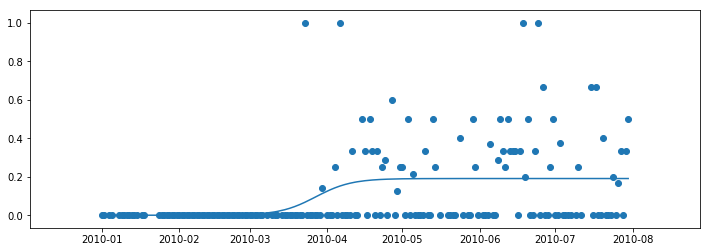

0.16183353899001895
86.37074104130605
2010-03-27
0.004774441738340598
0.18620322779528328
60.25157366529617
112.48990841731589
52.23833475201972
---
218
76 2011
[0.8763199080747857, 0.12327667800162367, 0.39844309002701894]
999999.981493965 0.15314017730419338 0.14894693261204936


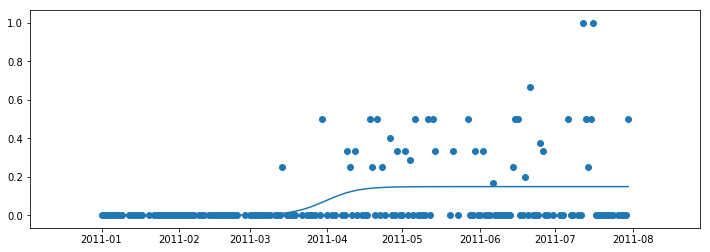

0.13295778135232295
90.21480047013067
2011-03-31
0.003723673315301234
0.14522325929674812
66.29187109508855
114.13772984517276
47.845858750084204
---
219
76 2012
[0.7712929884055729, 0.3480605707683273, 0.06731765103512699]
999999.9994464031 0.16715557621729282 0.1643319420831222


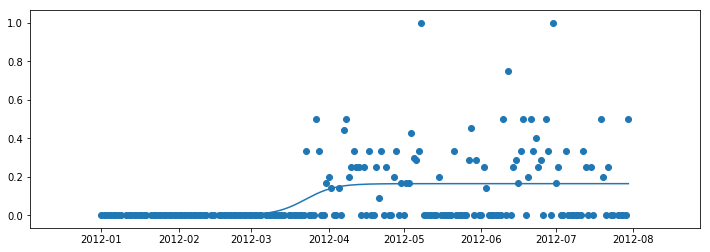

0.18403582863160517
82.65061130507122
2012-03-23
0.004108298552078056
0.16022364353104415
60.733534238092474
104.56768837204994
43.83415413395747
---
220
76 2013
[0.021728662465779425, 0.5191162006784942, 0.8083215697846813]
71.72686235782034 0.03255480813641709 0.25054023627571836


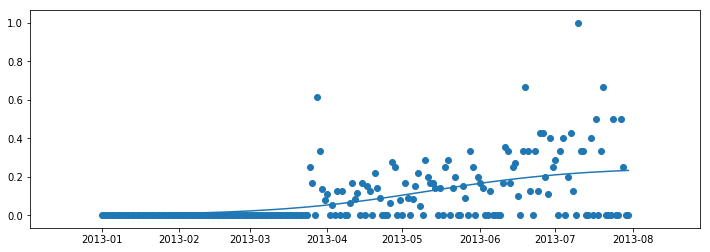

0.2808671020173422
131.25143631254343
2013-05-11
0.006263505906892959
0.2442767303688254
18.71624240883735
243.78663021624965
225.0703878074123
---
221
76 2014
[0.48252759661754585, 0.07798717411982403, 0.23049410091643774]
1382.7459445581705 0.06760461101289356 0.24782783135790895


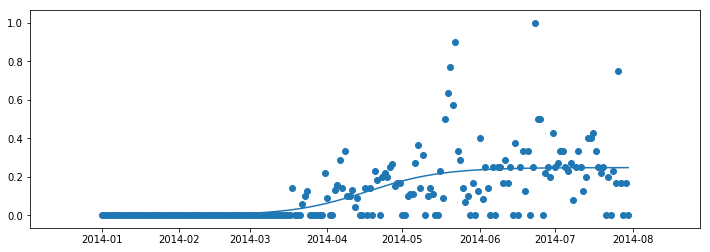

0.3836115118485054
106.97238705522288
2014-04-17
0.006195695783947724
0.2416321355739612
52.78138452980444
161.16338958064125
108.38200505083681
---
222
76 2015
[0.17684787179382566, 0.36617975741018083, 0.8276459723915509]
2374.0271177111135 0.07800832060686089 0.27393596070220155


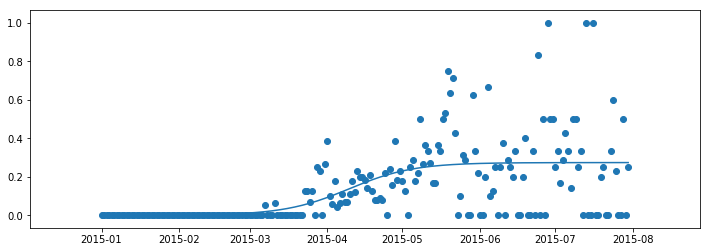

0.3395810521046191
99.63479456336373
2015-04-10
0.006848399017555039
0.26708756168464654
52.6710653402604
146.5985237864671
93.9274584462067
---
223
76 2016
[0.5535336223572612, 0.6772381505169883, 0.08420921888756183]
18230.787852917107 0.10175495527621102 0.22742777311163642


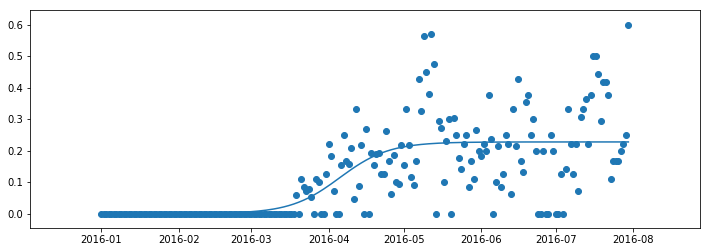

0.5103673930918444
96.4166025869886
2016-04-05
0.0056856943277909106
0.2217420787838455
60.41283612485406
132.42036904912308
72.00753292426901
---
224
76 2017
[0.3445656913996359, 0.30032897857032703, 0.2838585927191224]
87368.17682564804 0.11852022767522025 0.26999955263234204


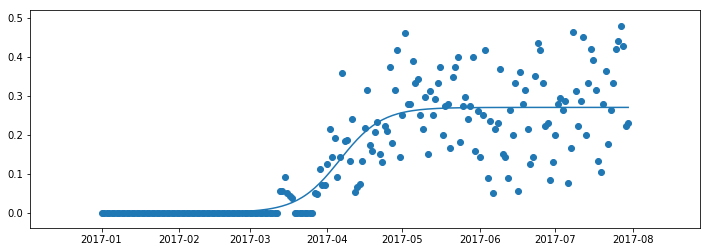

0.7221028291994132
95.99953196995195
2017-04-06
0.006749988815808551
0.26324956381653347
65.08867634648094
126.91038759342291
61.82171124694197
---
225
76 2018
[0.09872016305826481, 0.07261628100237061, 0.7391270600440077]
6842.477430795319 0.09422607057962244 0.2601758629248265


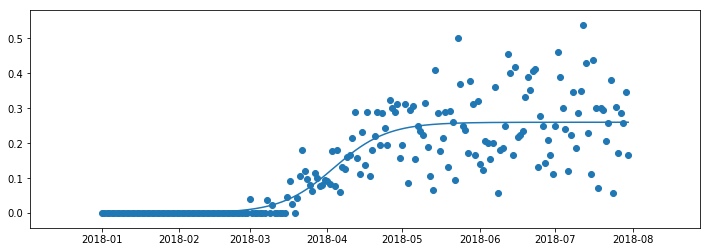

0.7080098553327738
93.72040124565494
2018-04-04
0.006504396573120662
0.2536714663517058
54.839849147985944
132.60095334332388
77.76110419533794
---
226
76 2019
[0.33548821766510584, 0.23916613598934866, 0.12290654030556925]
53503.56921638029 0.11086038548270387 0.24278657708595494


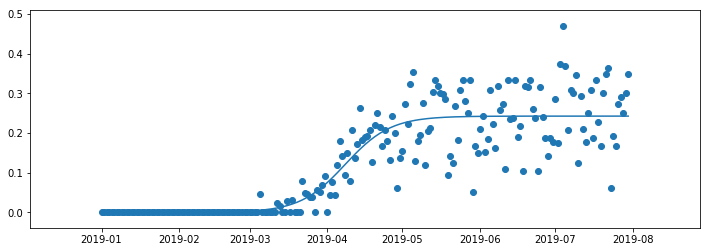

0.7856850647450925
98.20914475064946
2019-04-08
0.006069664427148874
0.23671691265880607
65.16251921188814
131.2557702894108
66.09325107752267
---
227
77 2010
[0.8499875245812001, 0.34095233073237896, 0.24247568195691982]
68.77028520368924 0.029946962962139573 0.47291091815220554


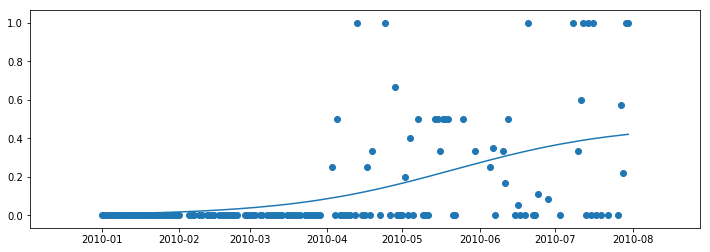

0.2735316921976434
141.27548612801678
2010-05-21
0.01182277295380514
0.4610881451984004
18.94048839347851
263.61048386255516
244.66999546907664
---
228
77 2011
[0.5327992586685485, 0.6158698631740077, 0.7559259191817495]
999999.999996746 0.14003750311652297 0.31477142083763937


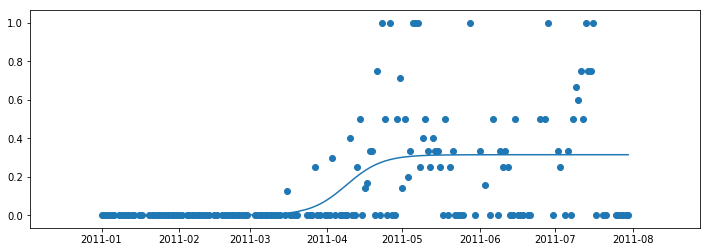

0.28154858233508573
98.65579041683823
2011-04-09
0.007869285520940985
0.30690213531669835
72.49450101508951
124.81707981858693
52.32257880349742
---
229
77 2012
[0.06620458333304524, 0.7153988288195782, 0.7509661080064672]
999999.99936732 0.14381996492961288 0.3659739806730274


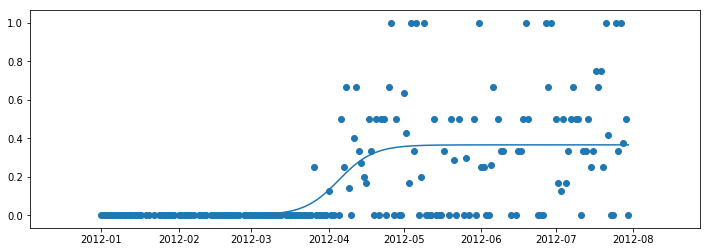

0.3519013756903626
96.06114536387949
2012-04-05
0.009149349516825686
0.3568246311562017
70.58789727956356
121.53439344819544
50.94649616863188
---
230
77 2013
[0.0074642402241390515, 0.9999187068989562, 0.14236105366190144]
446.03020188896426 0.059666943688413146 0.3724599773987519


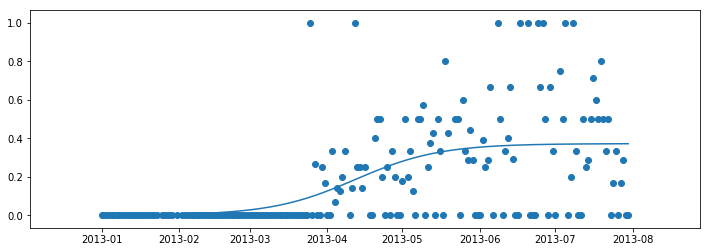

0.33190917431144573
102.24064263830951
2013-04-12
0.009311499434968798
0.36314847796378313
40.84045319235534
163.64083208426374
122.8003788919084
---
231
77 2014
[0.4688177276090939, 0.044440277910065884, 0.8773380354085789]
999999.9998787484 0.1619292425973482 0.2585333473328687


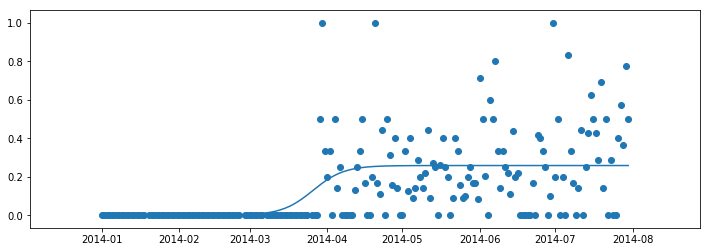

0.30673374682119803
85.31819414604777
2014-03-26
0.006463333683321718
0.25207001364954695
62.69373430565053
107.94265398644498
45.24891968079445
---
232
77 2015
[0.22002758769361752, 0.9289518305851386, 0.11870693281343292]
46294.55877721546 0.1056332760613142 0.37540812030284043


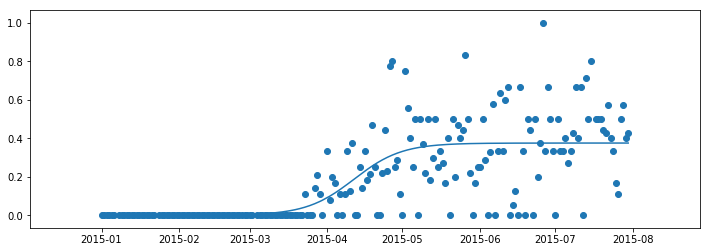

0.5269542563660452
101.69882174176009
2015-04-12
0.009385203007571011
0.3660229172952694
67.01693187967577
136.38071160384442
69.36377972416865
---
233
77 2016
[0.46528885027737843, 0.7894047089136706, 0.6442492404159597]
5564.434668303223 0.08093366584436701 0.4450571094605738


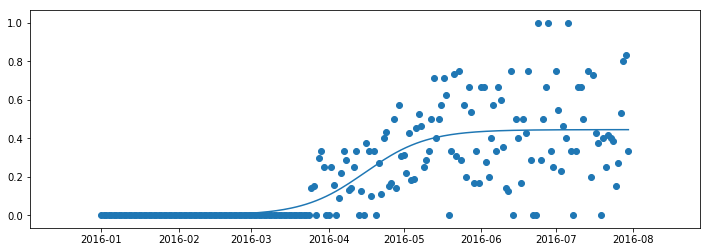

0.5871798206128929
106.55826078761599
2016-04-16
0.011126427736514346
0.43393068172405946
61.29203433032732
151.8244872449047
90.53245291457739
---
234
77 2017
[0.5018706228892693, 0.6820429000808966, 0.21426385146718807]
2833.4427134859443 0.07903103733087781 0.3621717531755441


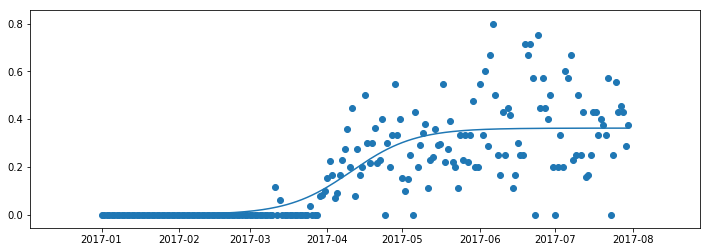

0.6275484029810823
100.58387218864314
2017-04-11
0.009054293829388603
0.3531174593461555
54.2278863651055
146.93985801218085
92.71197164707536
---
235
77 2018
[0.41161056862612055, 0.8601928148197245, 0.18733297916939717]
235499.76876666344 0.12412412048966455 0.32018437693959934


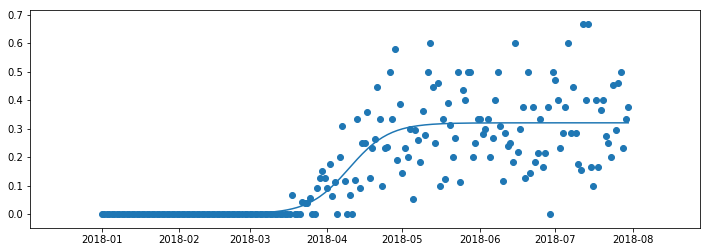

0.6765038909497645
99.65400086428458
2018-04-10
0.008004609423489984
0.3121797675161093
70.13869286711976
129.16930886144937
59.03061599432961
---
236
77 2019
[0.3062476515002399, 0.7647527249207032, 0.6376700983791165]
999999.9999916916 0.13911797854846128 0.2793036973770101


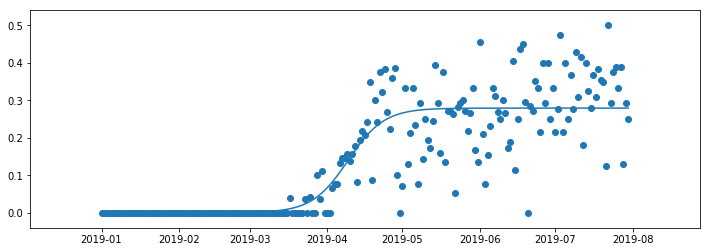

0.7520163750935565
99.30787308804504
2019-04-09
0.006982592434425253
0.2723211049425848
72.97366607645122
125.64208009963882
52.668414023187594
---
237
78 2012
[0.0965737506691624, 0.40800277003490604, 0.7828397742667038]
999999.9999948731 0.13025340039025557 0.41272807249741317


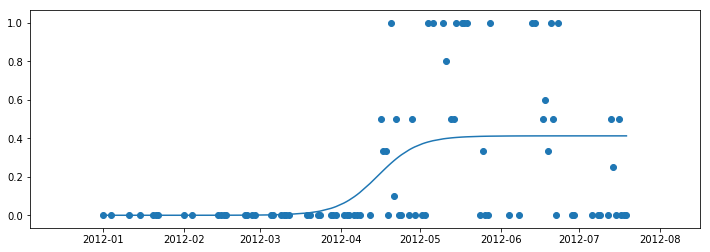

0.2658437484957987
106.0664099099612
2012-04-15
0.01031820181243533
0.40240987068497786
77.93999144293343
134.192828376989
56.25283693405558
---
238
78 2013
[0.022339824808463637, 0.06374969692733257, 0.8354566743267821]
95795.34730023087 0.12177675170560738 0.30638415817104614


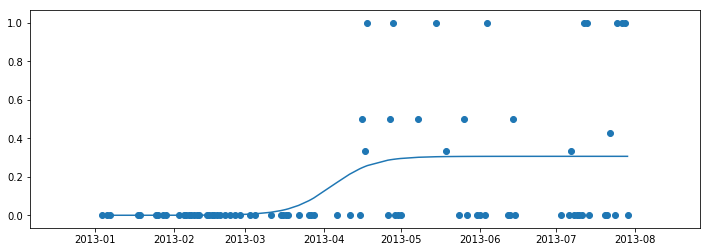

0.2034114149981444
94.18849850507189
2013-04-04
0.007659603954276154
0.29872455421676997
64.10425340231018
124.27274360783353
60.168490205523355
---
239
78 2014
[0.6014102637132114, 0.11762603334771626, 0.5226725403260767]
999999.999992157 0.13639634367359463 0.45263344655829


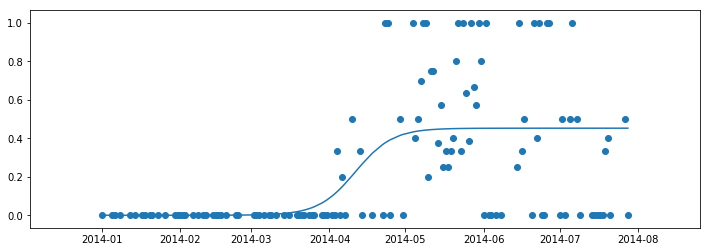

0.35125379493536835
101.28944945194317
2014-04-11
0.011315836163957252
0.44131761039433276
74.42977310389686
128.14912579998943
53.71935269609257
---
240
78 2015
[0.5030828376038686, 0.9787634082074157, 0.9835255799861897]
999999.9999765859 0.15413200106091088 0.420462766820419


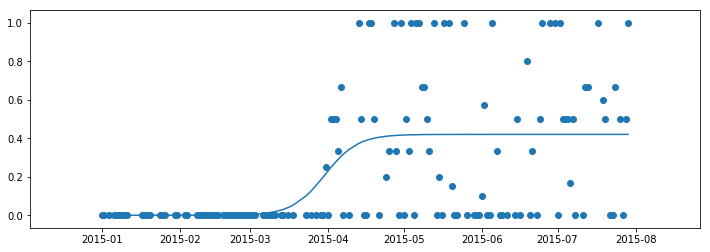

0.3020927563536363
89.63427752087094
2015-03-31
0.010511569170510476
0.4099511976499085
65.86528976418921
113.40326527755263
47.53797551336342
---
241
78 2016
[0.006094141271091313, 0.8989817216295454, 0.4740479537224981]
999999.9999837583 0.1459116973137326 0.37238603441836104


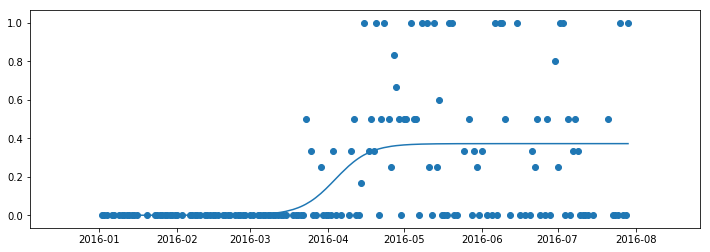

0.2736260426878606
94.68405078067565
2016-04-04
0.009309650860459026
0.363076383557902
69.57597710614066
119.7921244552106
50.21614734906994
---
242
78 2017
[0.6925580653436342, 0.21944226010111156, 0.8719194510306074]
2001.8551501812553 0.0731677672183833 0.4873351590677775


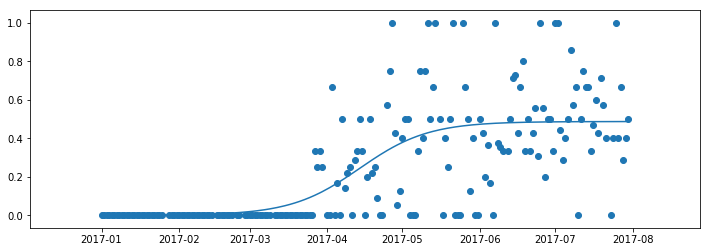

0.5087192781115052
103.89588057281634
2017-04-14
0.012183378976694439
0.47515178009108305
53.825176143705626
153.96658500192697
100.14140885822135
---
243
78 2018
[0.9329947742448593, 0.38346428547935585, 0.9888515748446881]
54.59747137550885 0.029243494784184684 0.7270505180348155


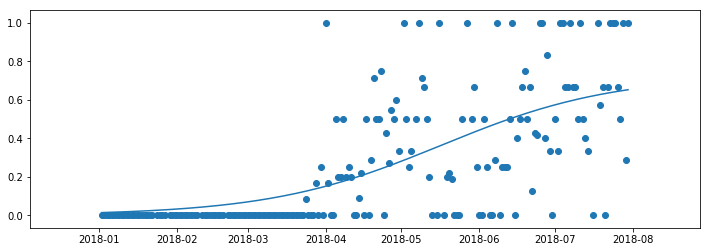

0.4719793736901895
136.78213221074452
2018-05-17
0.018176262950870388
0.7088742550839451
11.504299545171499
262.0599648763177
250.55566533114617
---
244
78 2019
[0.6534799976271266, 0.07562942607834311, 0.5357761297380833]
74.14914647603439 0.022354868186740217 0.8858517346368942


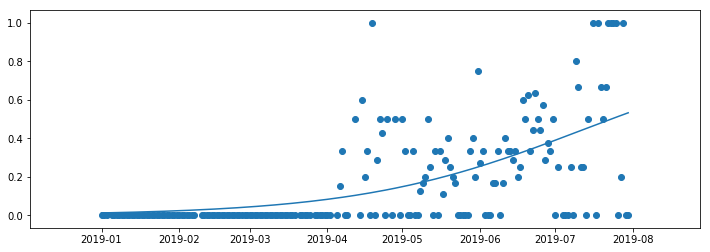

0.38652606481308405
192.6237507540684
2019-07-12
0.022146293365922356
0.8637054412709718
28.74169985015446
356.5058016579825
327.764101807828
---
245
85 2010
[0.1141656295343616, 0.6842619830076015, 0.6859690955961318]
999408.1360536698 0.12842138552591306 0.33390501803928263


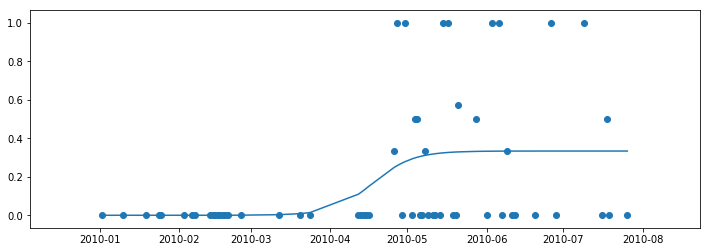

0.18956955643551043
107.57490633061066
2010-04-18
0.008347625450982067
0.3255573925883006
79.04724615059799
136.10256651062338
57.05532036002539
---
246
85 2011
[0.25496523208136035, 0.9851007383477141, 0.9044481734027671]
81623.86973502817 0.167505443305317 0.38564088578244926


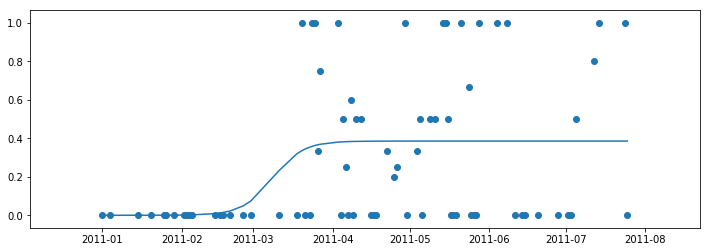

0.16999980863880593
67.51945964420963
2011-03-09
0.009641022144561232
0.375999863637888
45.648160575725235
89.39075871269401
43.74259813696877
---
247
85 2012
[0.8683364606558595, 0.8021414717409111, 0.777438023293319]
999999.9997156479 0.16186444740433742 0.29105161891207565


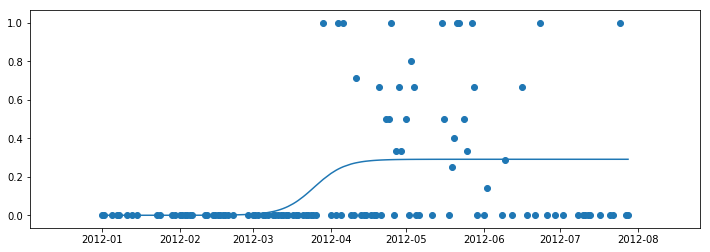

0.18350737795608485
85.35234746867404
2012-03-25
0.007276290472801892
0.2837753284392738
62.71883093753569
107.98586399981242
45.26703306227673
---
248
85 2013
[0.8821130415064867, 0.43694011724592263, 0.7599055678636868]
999999.999879786 0.164110538833894 0.4592166856002933


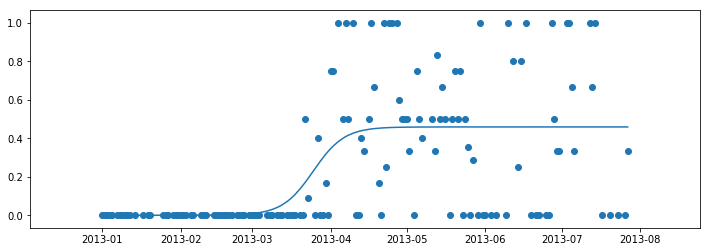

0.3702599249640238
84.18417644602067
2013-03-25
0.011480417140007332
0.4477362684602859
61.86043251000353
106.50792038203777
44.64748787203424
---
249
85 2014
[0.690447878353938, 0.799543126046972, 0.9411229231838286]
999999.9999726219 0.1474738891180582 0.2798593429562131


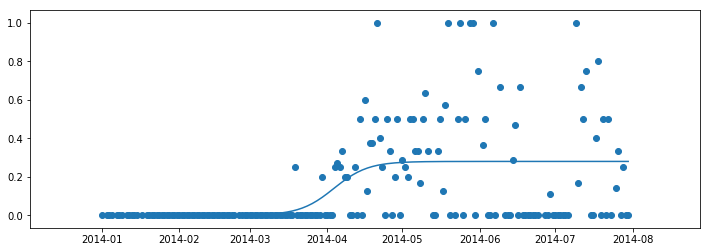

0.25607220465619596
93.68106205483656
2014-04-04
0.006996483573905328
0.2728628593823078
68.83895835743672
118.52316575223642
49.6842073947997
---
250
85 2015
[0.8651321862090223, 0.7741381451925697, 0.033365837343564575]
362370.3334346964 0.1304255896181232 0.34678971249179885


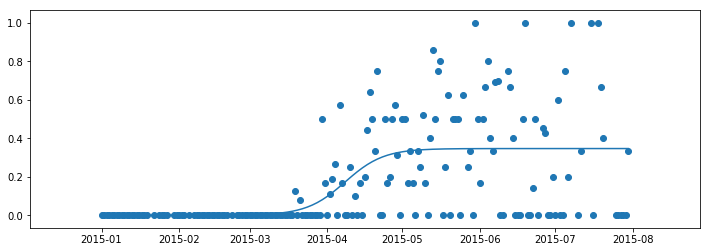

0.33871878650390974
98.1434856909259
2015-04-08
0.008669742812294972
0.33811996967950386
70.05420001580423
126.23277136604752
56.17857135024329
---
251
85 2016
[0.5493133424026683, 0.8294816438464366, 0.18418142546004024]
87.50925872476463 0.03478851257308455 0.4756358502617542


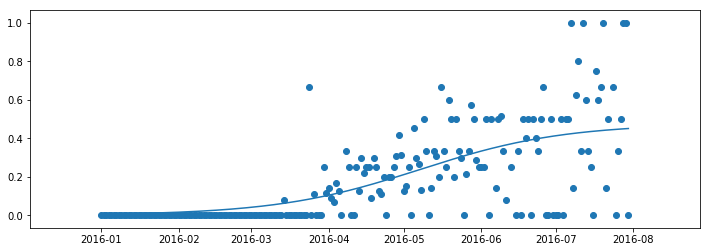

0.4686889962241233
128.54083923158896
2016-05-08
0.011890896256543855
0.4637449540052103
23.231316772612104
233.8503616905657
210.6190449179536
---
252
85 2017
[0.9513150604863465, 0.2849007501120585, 0.9415356288723997]
102.45928409256857 0.04162453971033124 0.37918573933003585


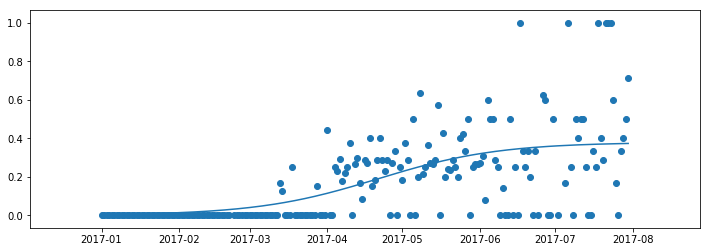

0.40397874511345633
111.21962004899133
2017-04-21
0.009479643483250897
0.36970609584678493
23.205153784026287
199.23408631395623
176.02893252992993
---
253
85 2018
[0.35230481210911646, 0.39065355046681716, 0.020217720802388706]
5006.118061019112 0.08623115856222913 0.26843996695527306


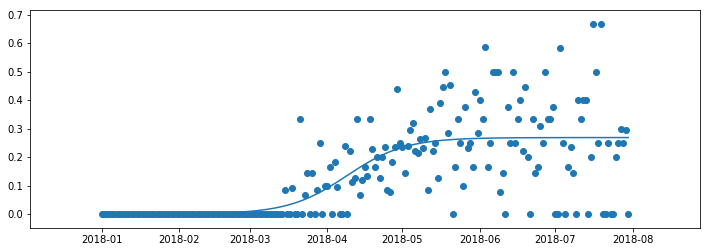

0.5143343125500257
98.78582402983032
2018-04-09
0.006710999173881827
0.2617289677813912
56.30046598508342
141.27118207457715
84.97071608949373
---
254
85 2019
[0.3175251931060977, 0.5710457498444748, 0.0721066054597993]
999999.9999919968 0.1469749029659308 0.24789944120194016


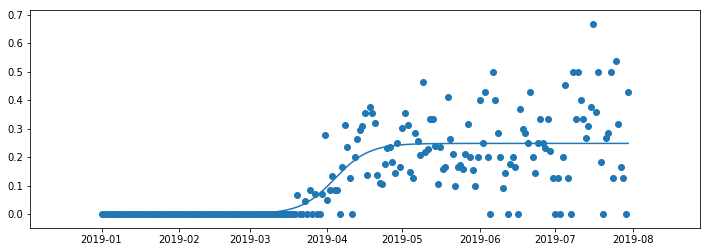

0.5760806247370165
93.99911331228262
2019-04-04
0.006197486030048504
0.24170195517189164
69.07266959842711
118.92555702613808
49.85288742771097
---
255
86 2010
[0.7832344071082302, 0.8366747320029466, 0.28080073427142493]
999999.9999967563 0.15428362499898549 0.5013359631376647


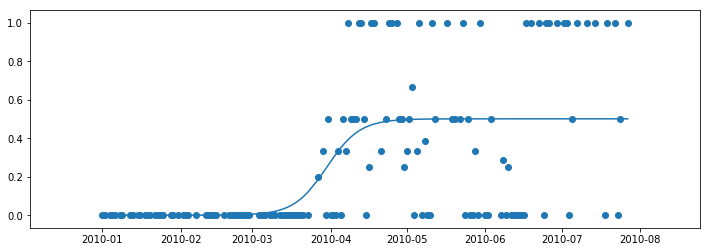

0.36654863020191575
89.5461884438603
2010-03-31
0.012533399078441618
0.48880256405922307
65.80055992266283
113.29181696505773
47.491257042394906
---
256
86 2011
[0.11593561069447045, 0.8107604482097603, 0.08134551067079876]
999999.9999987074 0.13890893252865522 0.5924549357996406


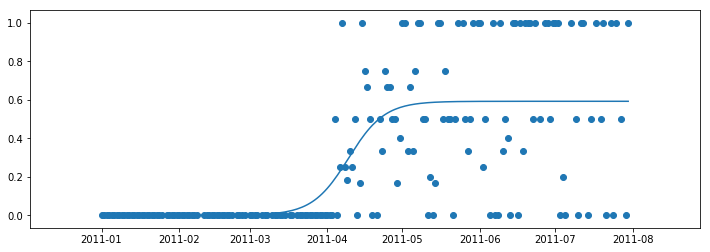

0.5030868669840023
99.45732291271486
2011-04-09
0.014811373394991015
0.5776435624046495
73.08348518004134
125.83116064538834
52.747675465347
---
257
86 2012
[0.9369214356502358, 0.6460668176525136, 0.1642976405014367]
999999.9999974997 0.14126907195487778 0.3673587474578235


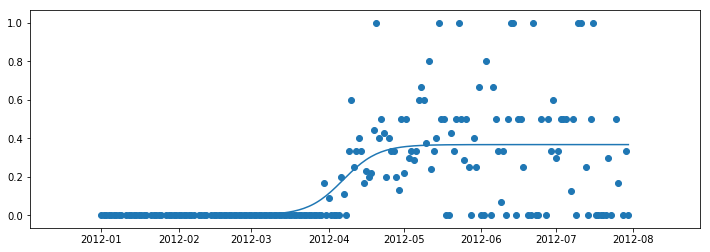

0.4074956175504272
97.79571966307341
2012-04-07
0.009183968686445587
0.3581747787713779
71.86250161730179
123.72893770884501
51.86643609154322
---
258
86 2013
[0.6282818631201613, 0.9414279679217676, 0.7583396455173697]
999999.9974064025 0.1541658938783019 0.2580394531619482


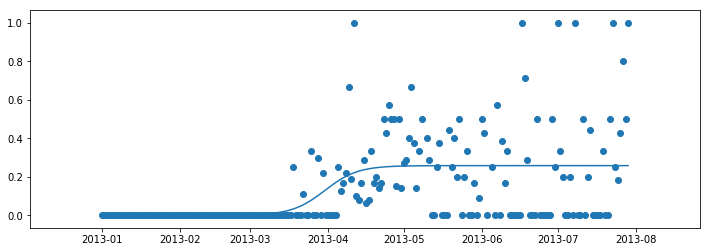

0.2611505555540823
89.61457173060988
2013-03-31
0.0064509863290487055
0.2515884668328995
65.85080950041355
113.37833396080619
47.52752446039264
---
259
86 2014
[0.22393506865653456, 0.5949238085812738, 0.9428558289534783]
2419.14802650084 0.08031430568534113 0.2753474881557747


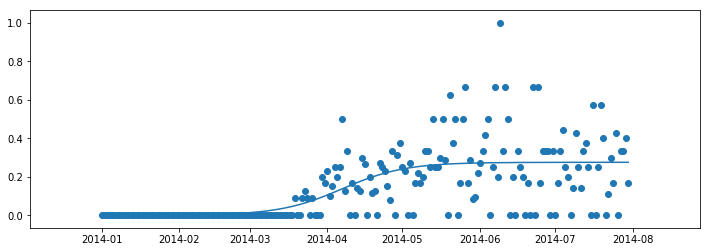

0.427763825882852
97.00850471800638
2014-04-07
0.006883687203894368
0.2684638009518803
51.39319851735381
142.62381091865888
91.23061240130507
---
260
86 2015
[0.8969213671842233, 0.7429412212203457, 0.0039573348855486135]
999999.9999915814 0.14473537112858303 0.20914434714730365


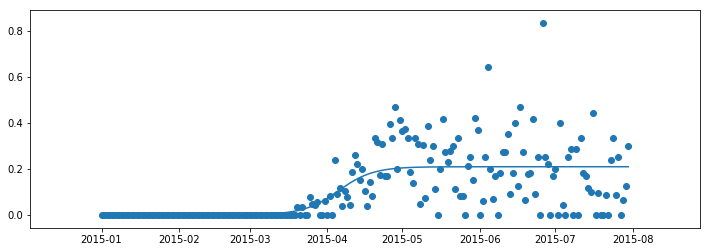

0.44476947181838145
95.45358850589565
2015-04-05
0.005228608678682592
0.20391573846862104
70.14145079164656
120.76572622014471
50.62427542849815
---
261
86 2016
[0.1777940996079994, 0.8721092533479268, 0.1411971515565148]
80552.2074735198 0.1187340308668042 0.3082279767661744


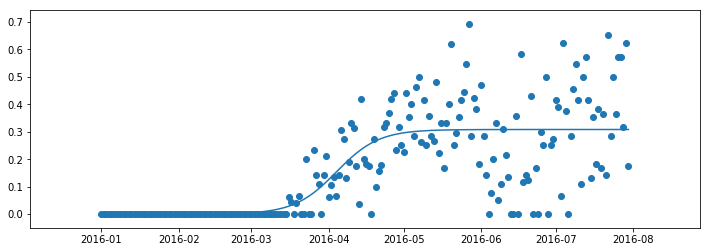

0.5682718900305973
95.14256957983476
2016-04-04
0.00770569941915436
0.30052227734702003
64.28737482746062
125.99776433220886
61.710389504748235
---
262
86 2017
[0.5849182613570075, 0.7946305635552579, 0.9077761240249385]
397730.29594095616 0.13659550111159086 0.21111703273463173


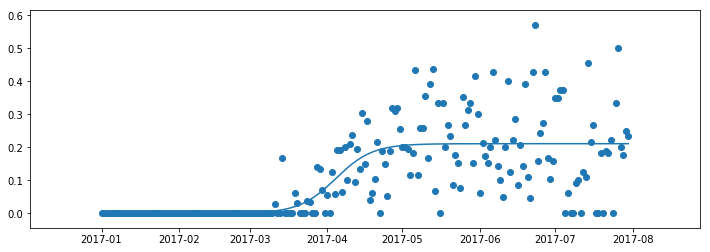

0.5141076046315501
94.39205025966615
2017-04-04
0.005277925818365794
0.20583910691626592
67.57153555518315
121.21256496414912
53.64102940896598
---
263
86 2018
[0.4915304604263655, 0.6419541429438416, 0.7643733048897622]
19091.171765041036 0.10811693084002044 0.24255411963673543


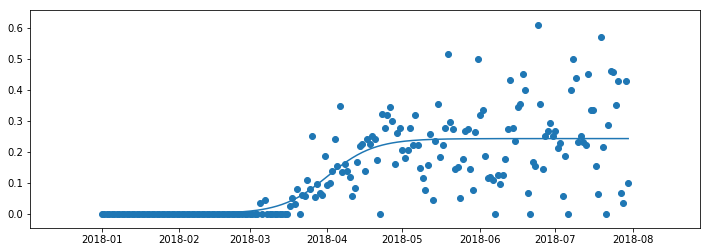

0.5667927295780596
91.16963660865525
2018-04-01
0.006063852990918386
0.23649026664581704
57.284456760638825
125.05481645667172
67.7703596960329
---
264
86 2019
[0.9477359904863489, 0.22057017628885, 0.4770719136849617]
587.5349806193883 0.05962984206099325 0.25533226715929835


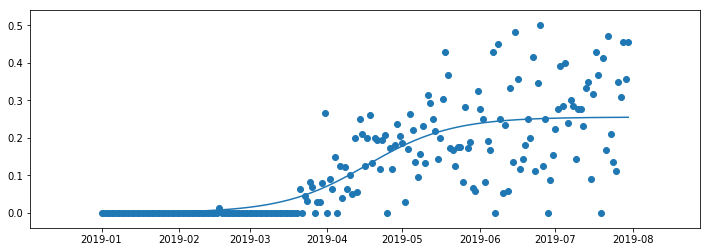

0.6235693777866028
106.92525026653402
2019-04-17
0.006383306678982459
0.2489489604803159
45.486857684807596
168.36364284826053
122.87678516345292
---
265
87 2010
[0.7125249415343764, 0.5547992812363908, 0.47675699856642695]
139029.1238524836 0.12124748976883894 0.47197542143644206


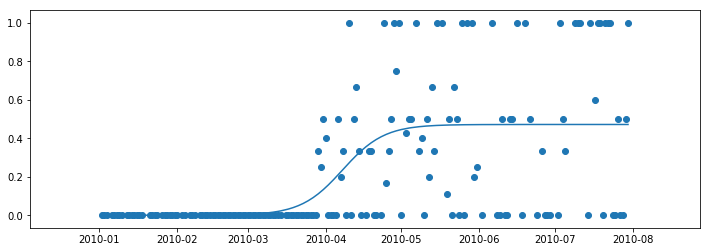

0.36567336309317966
97.67161973301204
2010-04-08
0.011799385535911052
0.46017603590053097
67.45605277064185
127.88718669538217
60.43113392474032
---
266
87 2011
[0.8041461593532617, 0.18762380990262872, 0.8133990331223894]
8076.129411410537 0.09057672111847971 0.5974357536375015


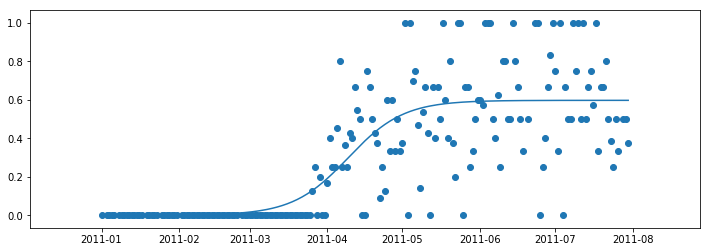

0.6350877828962829
99.32649241887016
2011-04-09
0.014935893840937537
0.5824998597965639
58.87943713920852
139.77354769853187
80.89411055932335
---
267
87 2012
[0.7892971153090358, 0.09997397191696311, 0.5393580758823298]
34149.49166838789 0.11077721993847389 0.3968137329525549


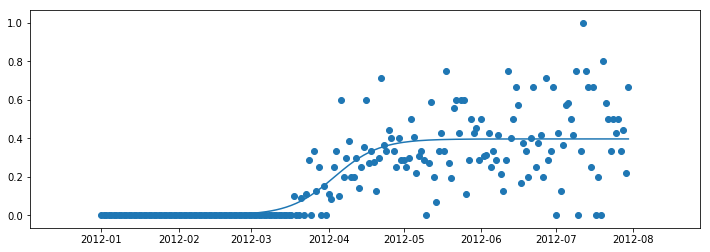

0.6122221079389545
94.22968896878105
2012-04-03
0.009920343323813873
0.38689338962874104
61.158253811224256
127.30112412633785
66.1428703151136
---
268
87 2013
[0.34451777220544433, 0.22946397576344713, 0.5325411291267538]
147789.34644792063 0.12565878009046358 0.3913476392166134


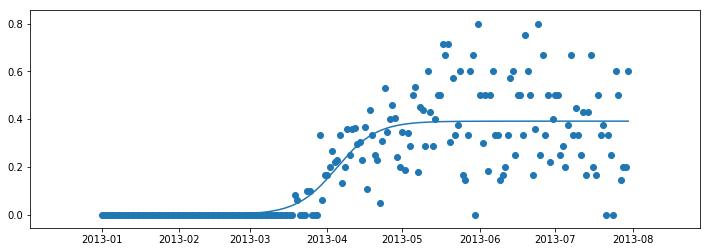

0.6614280704815982
94.72910046924045
2013-04-05
0.009783690980415337
0.38156394823619805
65.5742603260193
123.88394061246156
58.30968028644226
---
269
87 2014
[0.9969888365588101, 0.09033534154548839, 0.06366965676581904]
1541.813619310121 0.07222016583738546 0.41321187781791024


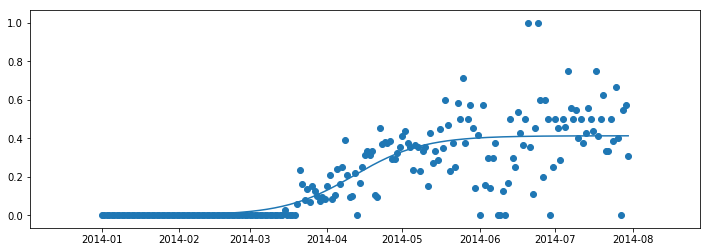

0.6496765293164724
101.64355886274211
2014-04-12
0.010330296945447758
0.40288158087246245
50.915876315201224
152.37124141028292
101.4553650950817
---
270
87 2015
[0.7536011849659107, 0.09298326886577046, 0.36145282479763274]
114112.25559823129 0.1180518715411958 0.38855934845575313


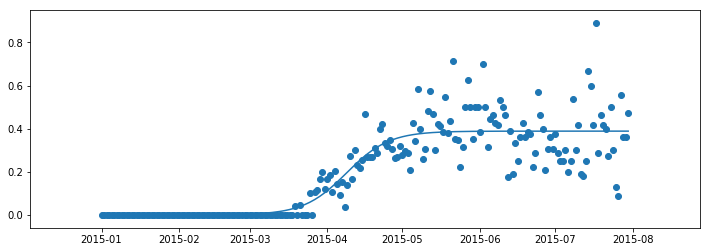

0.7811593122334279
98.64255254136992
2015-04-09
0.009713983711393828
0.3788453647443593
67.60906193845985
129.67604314428002
62.06698120582017
---
271
87 2016
[0.18565462721052595, 0.8748384343634013, 0.7120144276440915]
12071.48811784057 0.09793830057936778 0.30873406726292857


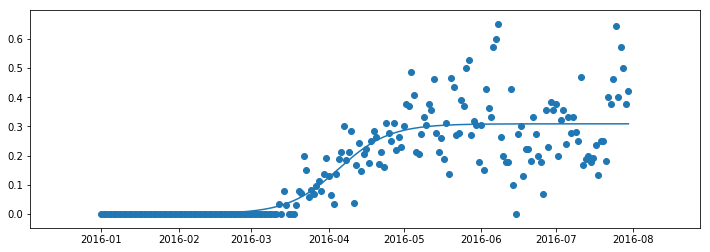

0.7127059968884413
95.96451583821549
2016-04-05
0.0077183516815732146
0.30101571558135537
58.557682919354
133.37134875707702
74.81366583772302
---
272
87 2017
[0.6062420185545424, 0.038696604151087, 0.5653797628606644]
1366.1207469224332 0.06766695598262418 0.4054195200152827


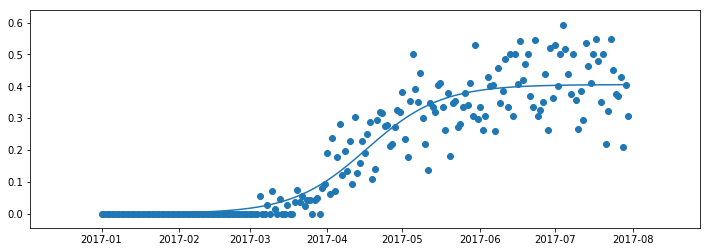

0.8724750452694143
106.69506742115048
2017-04-17
0.010135488000382067
0.39528403201490064
52.5539937917945
160.8361410505065
108.28214725871202
---
273
87 2018
[0.8689152838677242, 0.36204123520355147, 0.37117405686906846]
1794.6858213407393 0.07746944332497843 0.32803507714438723


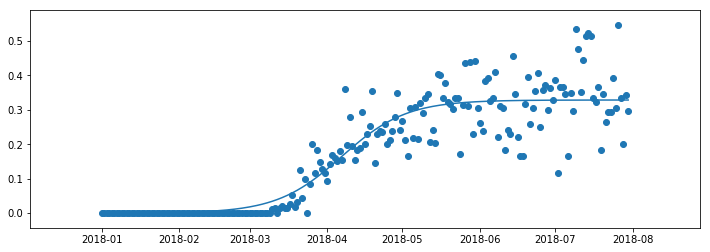

0.838971801511635
96.71665283921423
2018-04-07
0.008200876928609682
0.3198342002157775
49.42624401619889
144.00706166222952
94.58081764603062
---
274
87 2019
[0.7311806009342696, 0.39624680572285265, 0.3045468124070556]
39139.59212325036 0.10486715068698513 0.29479844116947124


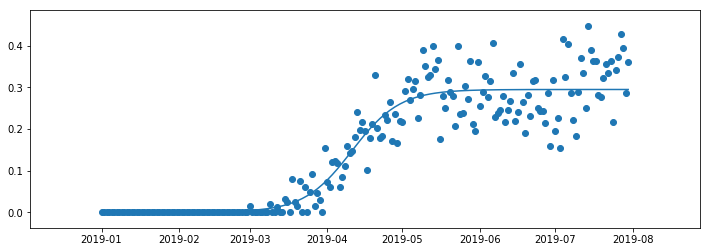

0.8842578488534373
100.84082337176166
2019-04-11
0.007369961029236781
0.2874284801402345
65.90555887635352
135.77608786716982
69.8705289908163
---
275
88 2010
[0.12422367041577775, 0.8956415437136904, 0.2385611301826932]
400.0439440411457 0.04289734921624854 0.47755823116906476


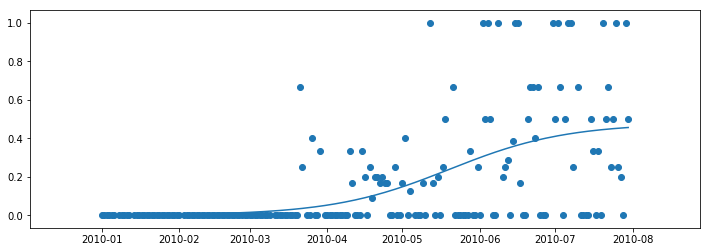

0.333539575185375
139.67236928726578
2010-05-20
0.01193895577922662
0.4656192753898381
54.26938488229996
225.07535369223146
170.8059688099315
---
276
88 2011
[0.4198188815783451, 0.4219422259912099, 0.26330940491449306]
999999.9999702252 0.1556232597061506 0.3035477175533853


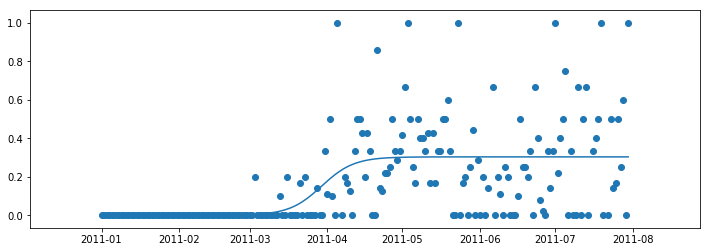

0.3283434872986505
88.7753577712039
2011-03-30
0.007588692938834633
0.29595902461455065
65.2341361501736
112.31657939223423
47.082443242060634
---
277
88 2012
[0.7686955668068781, 0.26510547211479674, 0.3553146433298686]
497073.3641360144 0.13233033626167826 0.31273362528028287


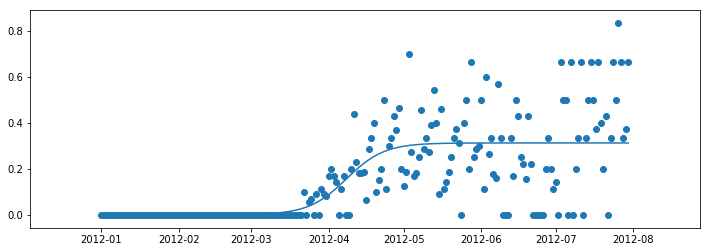

0.4985912244249171
99.11931971670721
2012-04-08
0.007818340632007072
0.3049152846482758
71.43434777735469
126.80429165605972
55.36994387870503
---
278
88 2013
[0.5636373661793965, 0.32295301888676264, 0.9243137419963305]
919.382809105011 0.06522188966520037 0.29997500621878576


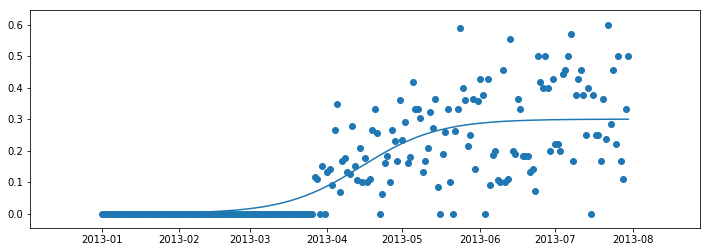

0.6193011651697254
104.6228899572718
2013-04-15
0.007499375155469644
0.2924756310633161
48.452152419068156
160.79362749547536
112.3414750764072
---
279
88 2014
[0.41326920847177917, 0.9747575436835726, 0.3975551911127023]
2114.537782667991 0.08104890064804152 0.24949907864086285


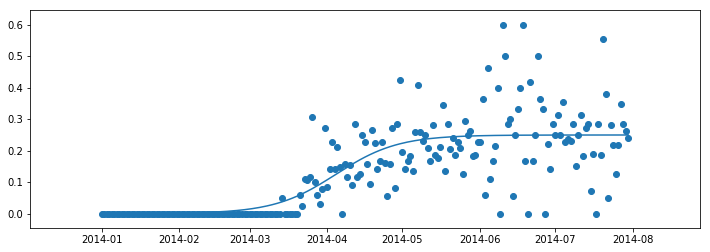

0.6171550611933401
94.46878938397722
2014-04-04
0.006237476966021571
0.24326160167484126
49.26692215521829
139.67065661273608
90.4037344575178
---
280
88 2015
[0.47667915567178376, 0.11285759228237979, 0.9783135581422595]
350.24554468228735 0.04989727789279616 0.3402929698175997


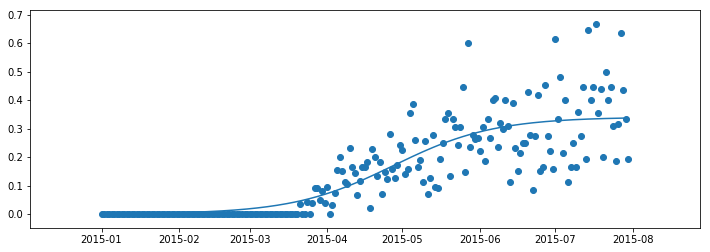

0.7163867874481535
117.41390937858874
2015-04-27
0.008507324245439993
0.3317856455721597
43.991835052194126
190.83598370498342
146.8441486527893
---
281
88 2016
[0.8155212828055233, 0.7318645707263984, 0.6955906784775531]
614.0745696007107 0.060235055682847635 0.2829389543574027


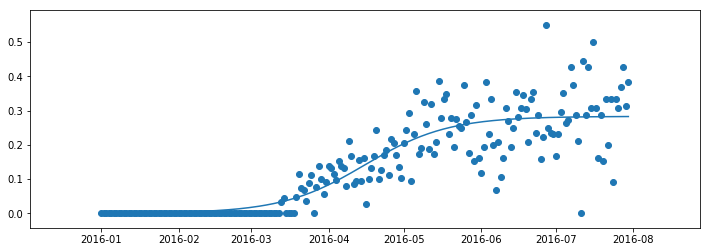

0.7707855572806018
106.58438507033858
2016-04-16
0.007073473858935067
0.2758654804984676
45.76329667591261
167.40547346476447
121.64217678885186
---
282
88 2017
[0.5680623166964808, 0.022876796520466924, 0.12817932032874169]
110.98951234090147 0.040307046306373294 0.2944742988799699


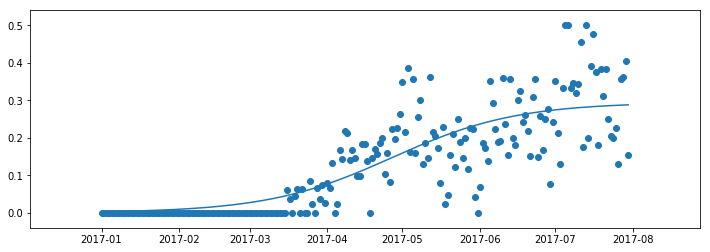

0.69318778947086
116.83901811204022
2017-04-27
0.007361857471999248
0.28711244140797065
25.947673251814894
207.73036297226562
181.78268972045072
---
283
88 2018
[0.3654614526064587, 0.9898908497948763, 0.6297671358855639]
116.84358844865693 0.04383429402197278 0.2817205838921106


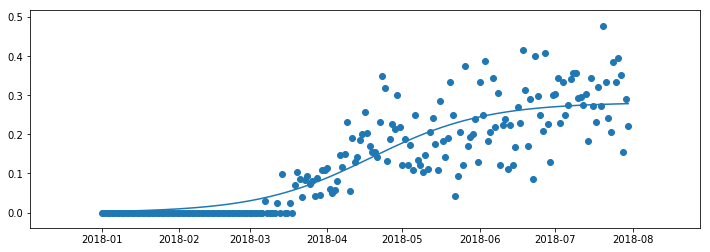

0.7652717768623435
108.60985207524509
2018-04-19
0.007043014597302765
0.2746775692948078
25.0323306876937
192.18737346279636
167.15504277510266
---
284
88 2019
[0.21383745134660448, 0.8057210831136669, 0.014671834177933163]
1023.6662857929198 0.06273107683813525 0.2999455910210859


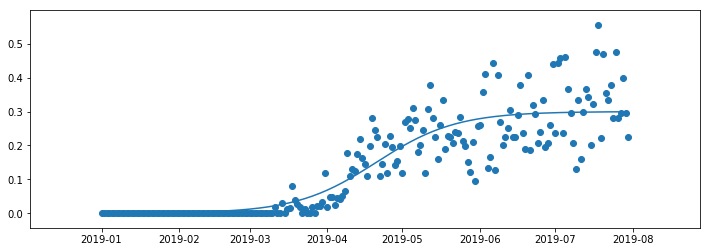

0.7957989858493164
110.48982751545805
2019-04-20
0.007498639775527148
0.29244695124555875
52.08876330955066
168.89089172136536
116.8021284118147
---
285
89 2010
[0.5403328370529329, 0.7267847385889323, 0.24753940804491636]
999999.997096333 0.13291054341690461 0.14199037088392832


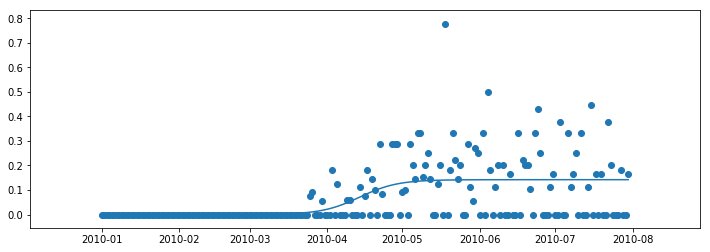

0.28415966372675483
103.9459338581219
2010-04-14
0.003549759272098208
0.1384406116118301
76.38181778466611
131.51004993157767
55.12823214691156
---
286
89 2011
[0.3641727667793222, 0.9269768621699296, 0.813994424684506]
999999.9988454684 0.14800427500980734 0.13453984718288958


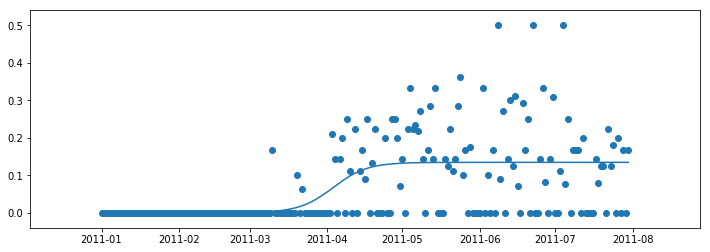

0.3084134494099472
93.34534800359161
2011-04-03
0.0033634961795722396
0.13117635100331734
68.59226809500866
118.09842791217457
49.50615981716591
---
287
89 2012
[0.14520125361565017, 0.06608564994924049, 0.36565593890039605]
999999.9997666787 0.14687933202850462 0.18922955192469915


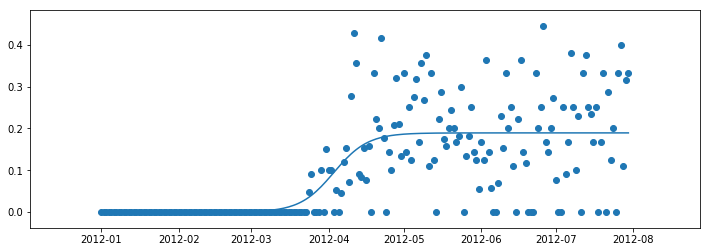

0.5065276025088268
94.06027632975483
2012-04-03
0.004730738798117479
0.18449881312658167
69.11761356343271
119.00293909607697
49.88532553264426
---
288
89 2013
[0.31237602874618, 0.36987350917269934, 0.9885177188390563]
999999.999999996 0.1517537525338252 0.1949298074947231


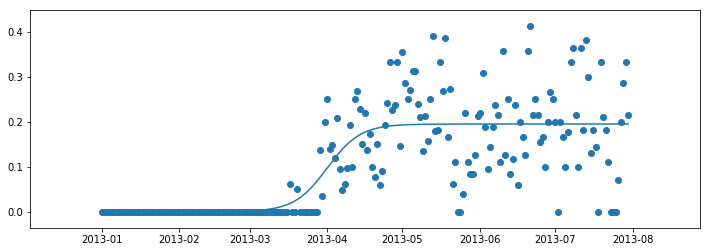

0.5967320012461924
91.03900448777935
2013-04-01
0.004873245187368078
0.19005656230735501
66.89751483787396
115.18049413768472
48.28297929981076
---
289
89 2014
[0.4640889352249702, 0.6280430192919134, 0.9685440105500659]
13879.533769855036 0.10225769451161797 0.22341799310149918


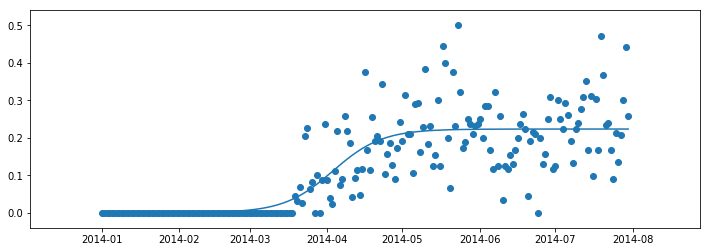

0.6626950132590559
93.27582329117425
2014-04-03
0.00558544982753748
0.2178325432739617
57.44906557258113
129.1025810097674
71.65351543718626
---
290
89 2015
[0.5782573968762912, 0.9654874113841218, 0.7038868154631106]
999999.9999999999 0.14142039151177435 0.18848317437307846


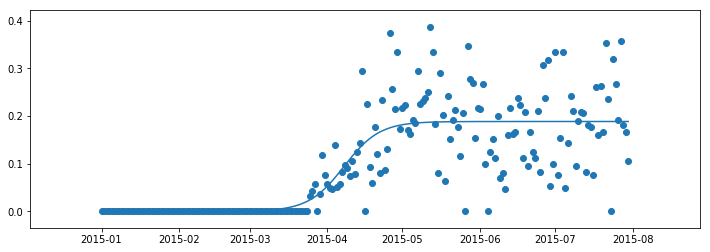

0.6569209860517284
97.69107842424566
2015-04-08
0.0047120793593269615
0.1837710950137515
71.78560887373445
123.59654797475692
51.81093910102247
---
291
89 2016
[0.4265863957690691, 0.7364574759899909, 0.6998538361173843]
114558.76733387962 0.11487899294466508 0.18972336678650495


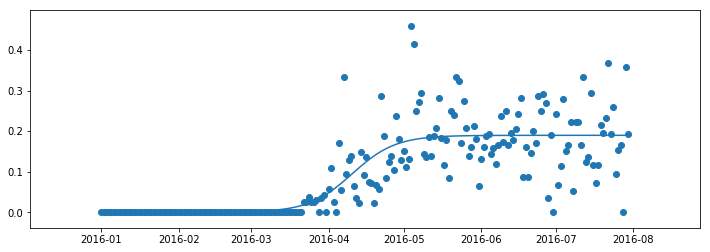

0.6594756758976793
101.40098658196852
2016-04-10
0.004743084169662624
0.18498028261684232
69.5103723606695
133.29160080326758
63.78122844259808
---
292
89 2017
[0.4011591312583589, 0.26971176957803855, 0.7923759689009875]
999980.6567693107 0.13886906740429036 0.19723702159143577


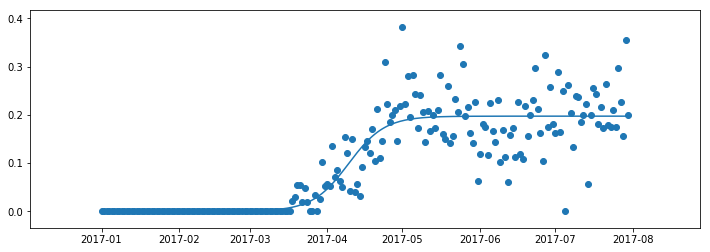

0.7819758319250846
99.48573482045055
2017-04-09
0.004930925539785895
0.1923060960516499
73.10432595375241
125.8671436871487
52.76281773339629
---
293
89 2018
[0.0061994170157414485, 0.015712008241939524, 0.5777887205260025]
999999.9999996477 0.14963779886461054 0.20461097108092324


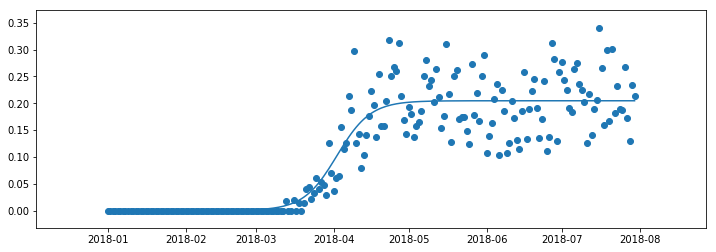

0.8304888358717528
92.32634175850137
2018-04-02
0.005115274277023081
0.19949569680390017
67.84347931380337
116.8092042031994
48.96572488939603
---
294
89 2019
[0.582884494928243, 0.9022556296210799, 0.8727121594566387]
999999.9999999995 0.1422335774739608 0.18578768513710833


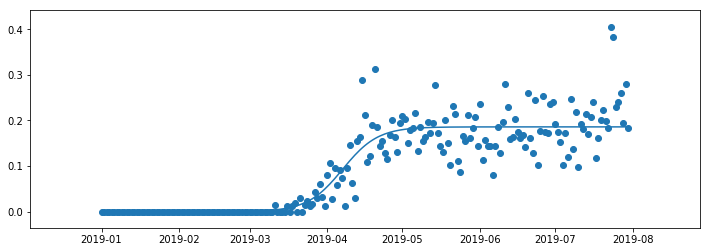

0.8116735141215781
97.13255339087235
2019-04-07
0.004644692128427708
0.18114299300868061
71.37519207581755
122.88991470592708
51.51472263010953
---
295
90 2010
[0.17181979091135913, 0.41141887380381015, 0.4021013299777444]
2021.3336669382568 0.06524438632183761 0.3205746641121764


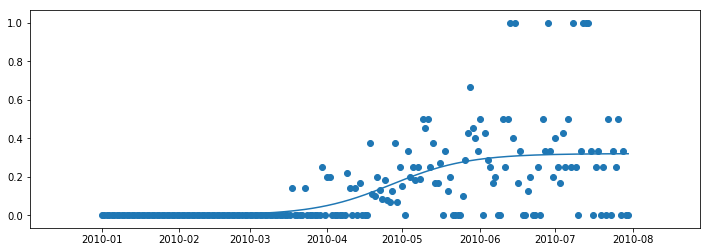

0.3677730397453699
116.6615740111343
2010-04-27
0.00801436660280441
0.312560297509372
60.51020448091874
172.81294354134994
112.30273906043121
---
296
90 2011
[0.8086755336062028, 0.4198687644622663, 0.9035610445892088]
46198.03632715831 0.10250064104070199 0.26952652356265316


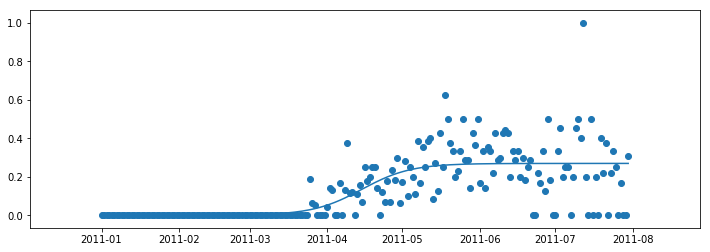

0.526561199151028
104.78658926786942
2011-04-15
0.006738163089066329
0.26278836047358684
69.04474795904402
140.52843057669486
71.48368261765084
---
297
90 2012
[0.11364860303066049, 0.31116908559188816, 0.8439357273979682]
100127.47666123144 0.11503554858828118 0.2433989382196923


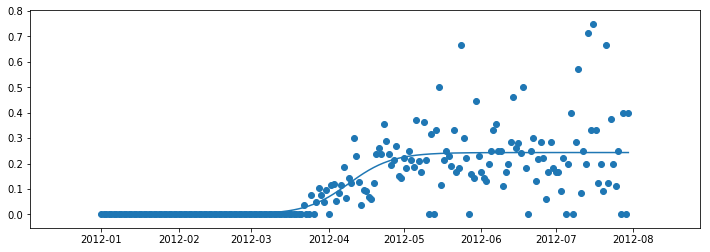

0.5336330470886146
100.0925327958179
2012-04-09
0.0060849734554923075
0.2373139647642
68.24531955531131
131.9397460363245
63.69442648101318
---
298
90 2013
[0.17606229117483163, 0.5912346995150723, 0.7712519111195588]
4607.054972774996 0.08313072515453196 0.24414776786393322


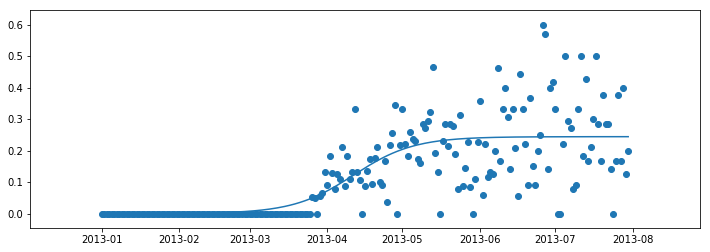

0.5788923091551972
101.47083502073909
2013-04-11
0.006103694196598331
0.23804407366733488
57.400948233159156
145.54072180831895
88.1397735751598
---
299
90 2014
[0.11471080841034831, 0.9457409283769012, 0.16960446234285242]
3565.444364573781 0.07667688855603343 0.2648896730607838


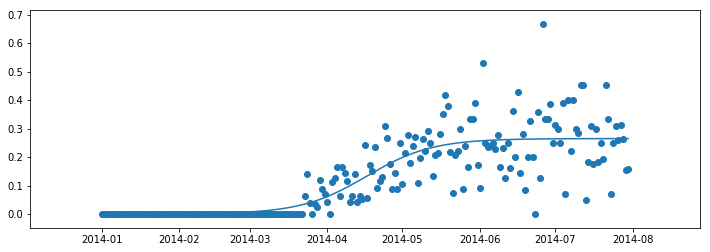

0.6938960116999384
106.66896017237194
2014-04-17
0.006622241826519596
0.2582674312342642
58.88974383846433
154.4481765062795
95.55843266781518
---
300
90 2015
[0.5216345119485376, 0.4902509926112797, 0.17302442180972]
196949.75753162842 0.12576045251222212 0.23725256201956657


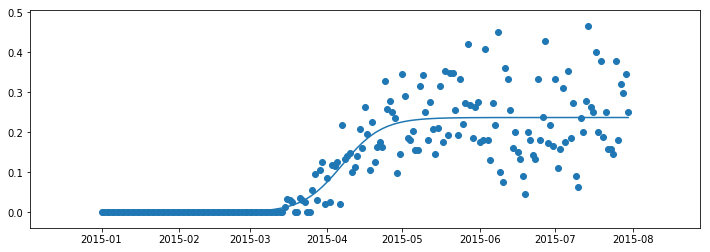

0.736405209035184
96.93591024648349
2015-04-07
0.005931314050489165
0.2313212479690774
67.80464065460919
126.06717983835779
58.2625391837486
---
301
90 2016
[0.3545456033728662, 0.8506830879120478, 0.6453114394142813]
17813.149654910812 0.09049585758298394 0.2512324819526864


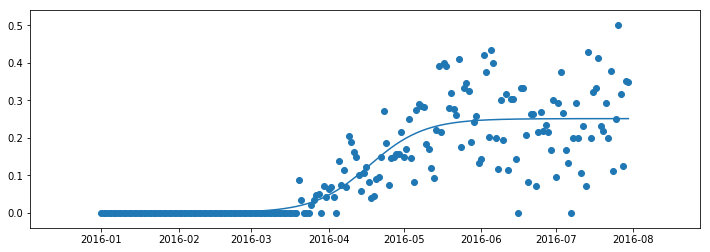

0.7106835697605229
108.15624570688591
2016-04-17
0.00628081204881716
0.2449516699038692
67.67304853103519
148.6394428827366
80.96639435170141
---
302
90 2017
[0.3139073722409035, 0.5242444511910338, 0.3312244421392415]
408612.47958513256 0.1288352543449164 0.197354157938471


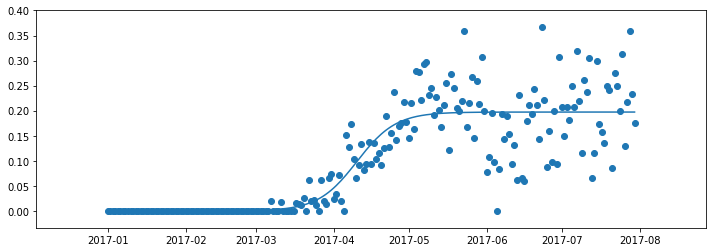

0.7530515005231583
100.28716572105235
2017-04-10
0.0049338539484617755
0.19242030399000923
71.85114745293455
128.7231839891702
56.87203653623564
---
303
90 2018
[0.9238915534471994, 0.3310844326264235, 0.46084039975569346]
801988.1391835768 0.14113833625373465 0.1783611476171635


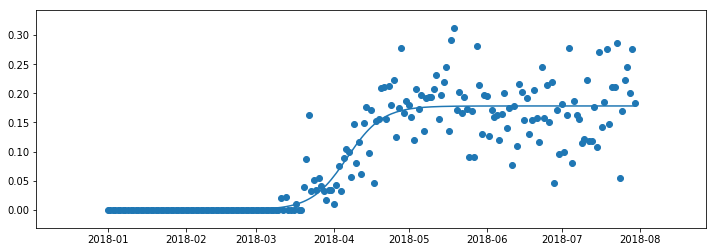

0.802504032036069
96.3228663348485
2018-04-06
0.004459028690429088
0.17390211892673443
70.36562648512123
122.28010618457579
51.91447969945456
---
304
90 2019
[0.2446557331779159, 0.4233398498936516, 0.1456133506956957]
730828.4295360816 0.13366926335021267 0.1795077725412896


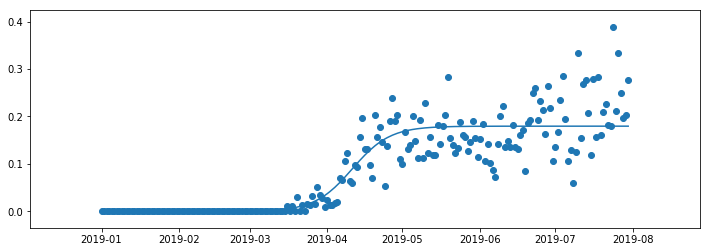

0.7875024887313026
101.01001282016536
2019-04-11
0.0044876943135322405
0.17502007822775736
73.60235339040447
128.41767224992628
54.81531885952181
---
305
91 2010
[0.8647060976579265, 0.2677545147280481, 0.3618785687445497]
999999.9999745315 0.15478640905719795 0.10309253172945179


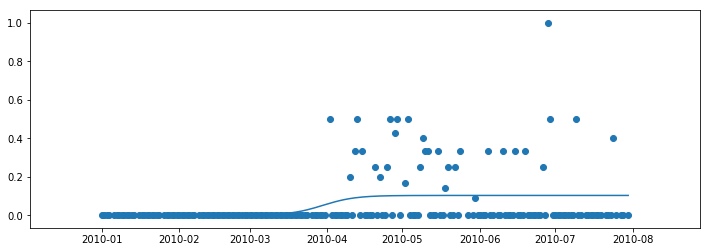

0.11190528443811065
89.25532055487885
2010-03-30
0.002577313293236295
0.1005152184362155
65.58682363422312
112.92381747553459
47.33699384131147
---
306
91 2011
[0.9393655319083013, 0.2772881770142377, 0.4585120878718717]
153.32583099440805 0.032749264116139425 0.34067640533685556


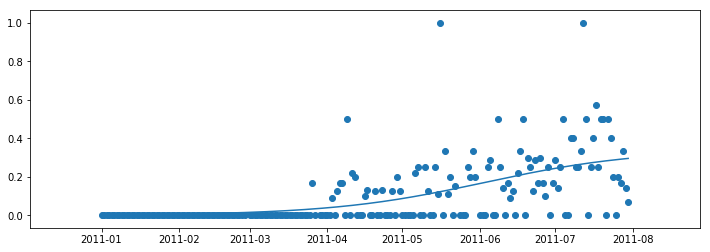

0.3647846387016822
153.66956806948605
2011-06-03
0.00851691013342139
0.3321594952034342
41.802576703283776
265.53655943568845
223.73398273240468
---
307
91 2012
[0.6062418624131918, 0.3893173084166738, 0.8597998177324158]
6927.56750972862 0.08939647446688279 0.22971794434669485


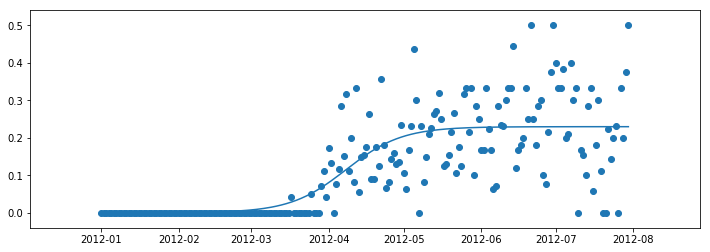

0.6061883792134827
98.92184311076858
2012-04-08
0.005742948608667371
0.22397499573802748
57.94079024512313
139.90289597641404
81.9621057312909
---
308
91 2013
[0.6436791764629793, 0.25646532245203124, 0.4911228651760038]
999999.9999999986 0.14374709494532406 0.21205564899085258


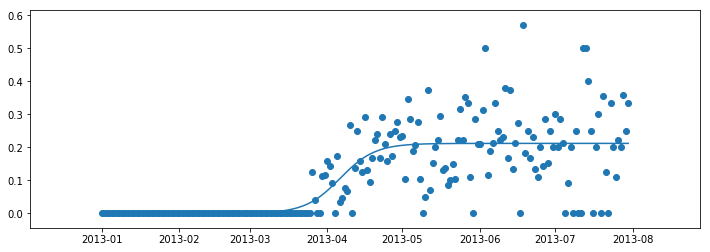

0.5721238961391317
96.10984182476291
2013-04-06
0.005301391224771315
0.20675425776608125
70.62368053904702
121.59600311047879
50.972322571431775
---
309
91 2014
[0.9275747030500235, 0.812298058007915, 0.9845966177769303]
999999.9997292858 0.15489215319035687 0.14608925598560338


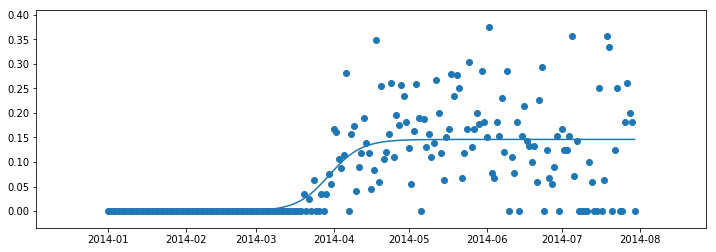

0.4850513031204555
89.19438637227023
2014-03-30
0.0036522313996400846
0.1424370245859633
65.54204782141245
112.84672492312804
47.30467710171558
---
310
91 2015
[0.5246655109422141, 0.22498851381427876, 0.866637030335834]
999999.9999998814 0.14383199028884722 0.16047451845908922


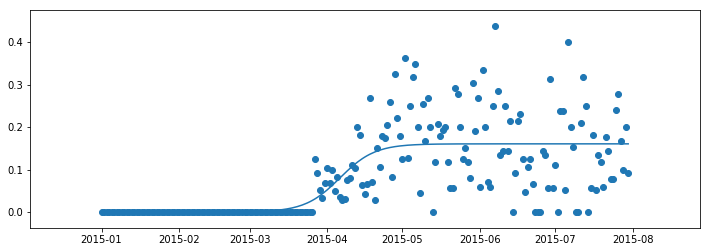

0.5181710972976248
96.05311398541785
2015-04-06
0.004011862961477231
0.15646265549761199
70.58199564260424
121.52423232823143
50.94223668562719
---
311
91 2016
[0.013717635795883143, 0.5441887782594228, 0.7399810935687297]
463780.01573906804 0.1262201366411125 0.19538879475744414


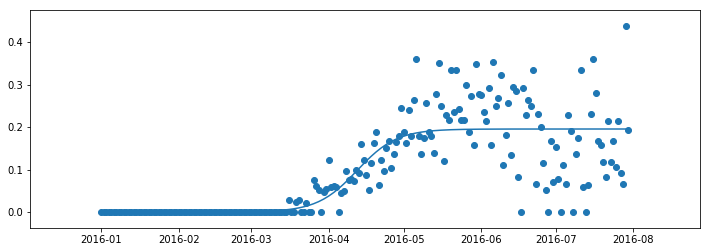

0.6538146401419458
103.36833695460595
2016-04-12
0.004884719868936104
0.19050407488850804
74.34316122890998
132.39351268030194
58.05035145139196
---
312
91 2017
[0.7475299034617925, 0.3240668776919089, 0.5144548497420873]
999999.999998376 0.1472539331982536 0.19080022906465677


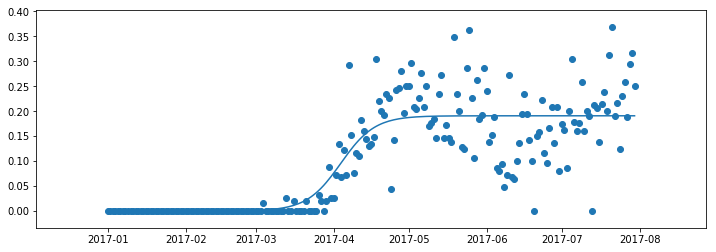

0.7264009585552735
93.82099518769593
2017-04-04
0.00477000572661642
0.18603022333804034
68.9417843811686
118.70020599422323
49.75842161305462
---
313
91 2018
[0.8469387799349888, 0.5954415169515946, 0.79085553898686]
999998.5635802579 0.14251686552720502 0.18290982276662884


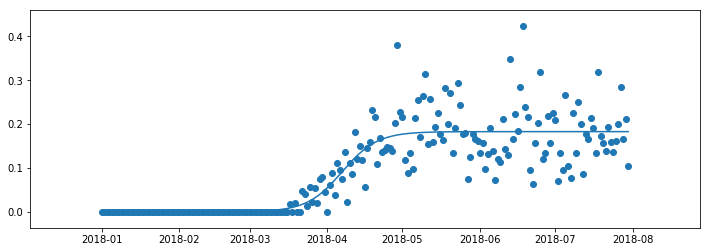

0.7466491746744912
96.93946797409926
2018-04-07
0.004572745569165721
0.1783370771974631
71.23330588179368
122.64563006640478
51.412324184611094
---
314
91 2019
[0.17701727367382147, 0.9412632278403411, 0.5659526741069014]
999999.9999128378 0.1415544451450449 0.1594483332504179


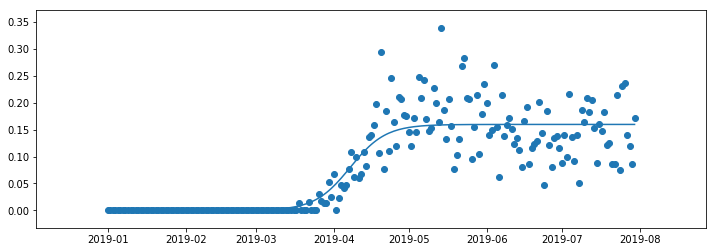

0.7732357945363273
97.5985638862908
2019-04-08
0.003986208331260448
0.15546212491915745
71.71762710344554
123.47950066913606
51.76187356569052
---
315
92 2010
[0.5614634363758478, 0.29337674856509544, 0.09917185023517949]
999999.9999506313 0.12128259603934653 0.22990324338921123


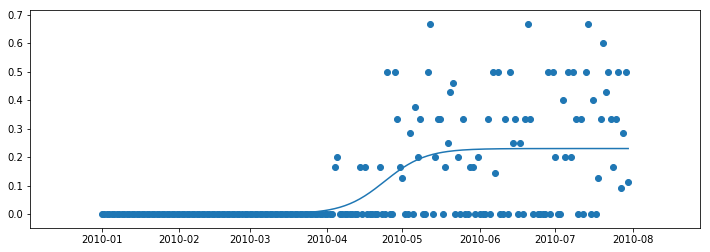

0.3566211178196863
113.91173184842509
2010-04-24
0.005747581084730281
0.22415566230448095
83.70491103679676
144.11855266005347
60.41364162325671
---
316
92 2011
[0.25967731389408044, 0.7650797500501072, 0.9827564037004735]
308304.4500730998 0.11617311734901412 0.31473350307920395


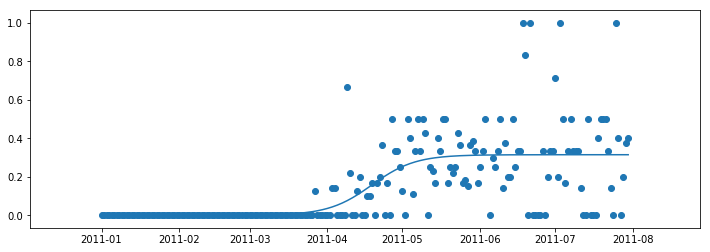

0.4376379253742755
108.79318155877391
2011-04-19
0.007868337576980099
0.3068651655022238
77.25781666774358
140.3285464498042
63.070729782060624
---
317
92 2012
[0.7213068252665517, 0.12170062782567692, 0.16292708469325168]
22506.974029811692 0.09762675789088307 0.3442962888260062


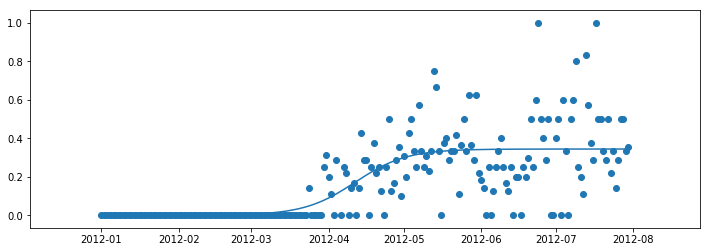

0.5258421852207092
102.65198510686373
2012-04-12
0.008607407220650155
0.33568888160535604
65.12578096696605
140.17818924676138
75.05240827979533
---
318
92 2013
[0.3271551891042389, 0.6077604833086135, 0.6056494668532024]
225197.24840213088 0.1135972094701316 0.29072619271405764


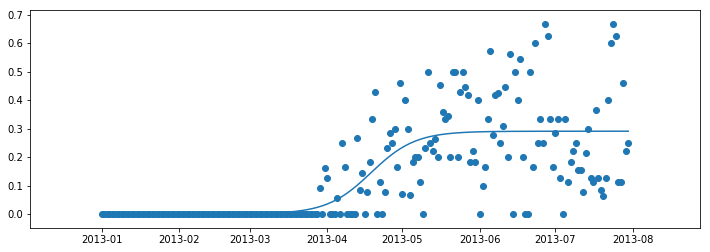

0.547953906500005
108.49502390241894
2013-04-18
0.007268154817851442
0.2834580378962062
76.24456930746769
140.74547849737024
64.50090918990256
---
319
92 2014
[0.6486995439119247, 0.31665881760655257, 0.6050917196603725]
2495.469684636037 0.07067591015551862 0.3547992947214233


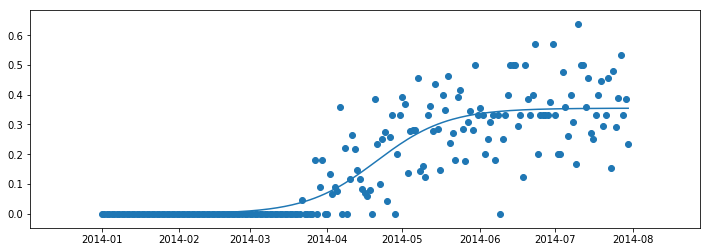

0.7576166639430394
110.67748860412918
2014-04-21
0.008869982368035583
0.3459293123533877
58.841415491407
162.51356171685126
103.67214622544427
---
320
92 2015
[0.25879673343635146, 0.40633979532064435, 0.4204199444635033]
378353.3158786472 0.11738117426476617 0.35698625596206324


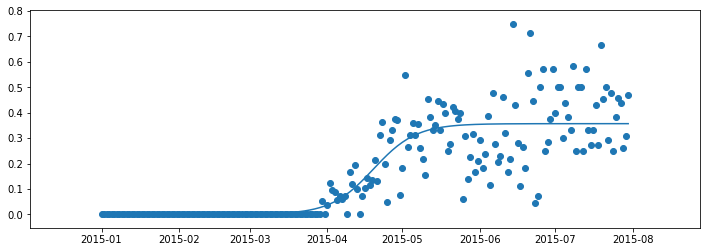

0.7379457442910512
109.41774791897222
2015-04-19
0.008924656399051581
0.34806159956301164
78.20693690880053
140.62855892914388
62.42162202034335
---
321
92 2016
[0.9339136964342363, 0.7368993251418074, 0.0538928869418035]
137978.29726705697 0.1061711695138661 0.3409450020168406


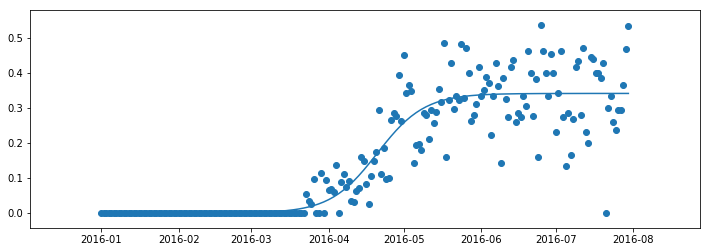

0.8302590366471185
111.4695424358618
2016-04-20
0.008523625050421015
0.33242137696641955
76.96336092816746
145.9757239435561
69.01236301538863
---
322
92 2017
[0.08546602292310024, 0.7608884510575182, 0.27791494774012515]
2276.6983922948216 0.06954482204192286 0.382736311691542


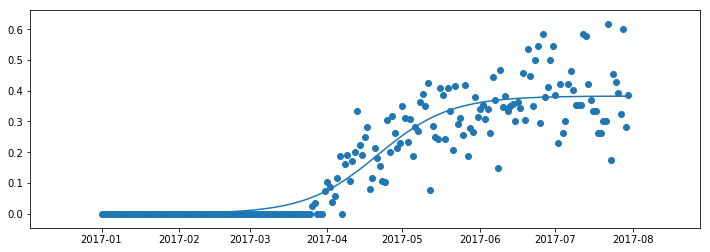

0.8488344478975709
111.15826271381839
2017-04-21
0.00956840779228855
0.3731679038992534
58.47911941367182
163.8374060139649
105.3582866002931
---
323
92 2018
[0.6208982404875681, 0.5252205741800555, 0.7419054992849317]
417858.8753395832 0.11934189095190129 0.3038133745348981


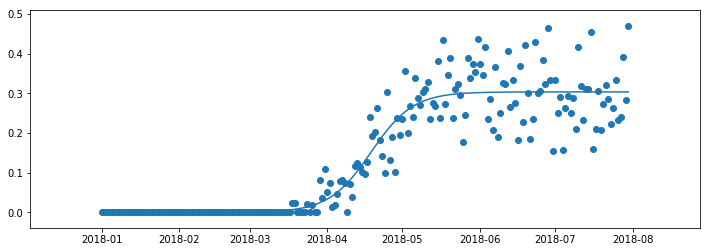

0.8734695465156876
108.45227046814955
2018-04-18
0.007595334363372452
0.29621804017152564
77.754234624171
139.15030631212815
61.396071687957146
---
324
92 2019
[0.5110240759578033, 0.043605795868419284, 0.19328954376633634]
999999.8732678576 0.13070303297808236 0.274344482281161


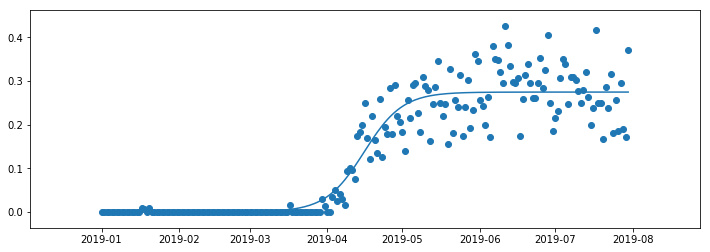

0.8910282267897288
105.70152900391264
2019-04-16
0.006858612057029025
0.26748587022413195
77.67186846233982
133.73118954548542
56.059321083145605
---
325
99 2010
[0.8686354642775218, 0.5294635594429826, 0.297158635250917]
999999.9995533837 0.13561457344802177 0.22938403198382745


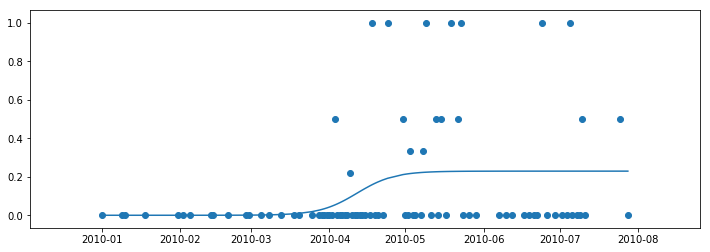

0.10693445957694991
101.87334743056103
2010-04-12
0.005734600799595687
0.22364943118423175
74.85883451367445
128.88786034744754
54.02902583377309
---
326
99 2011
[0.22489436614655167, 0.5999440831146358, 0.11959505203420406]
105.57322695677531 0.04197055849838345 0.3142508682948643


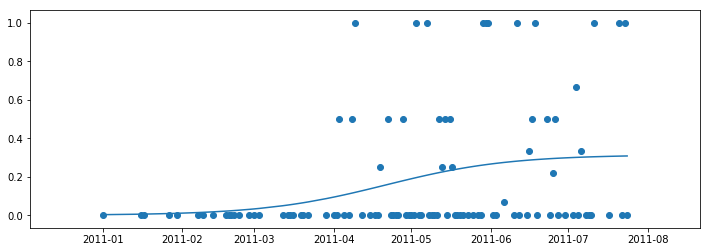

0.10387549938775831
111.01603059917598
2011-04-21
0.007856271707371609
0.3063945965874927
23.727183912259644
198.3048772860922
174.57769337383255
---
327
99 2012
[0.5954927165892612, 0.08628535152897043, 0.23808449691722577]
999999.9930712188 0.13178244661410451 0.45991667706607003


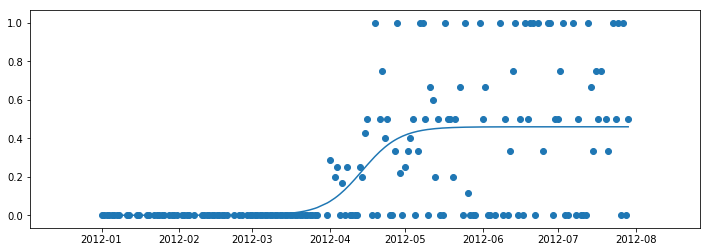

0.3715577568034323
104.83574183055754
2012-04-14
0.011497916926651752
0.4484187601394183
77.03566875362061
132.6358149074945
55.600146153873894
---
328
99 2013
[0.7418455968440468, 0.41634108994814434, 0.07719994823703291]
15040.302351472686 0.09158563202285183 0.3944304645309011


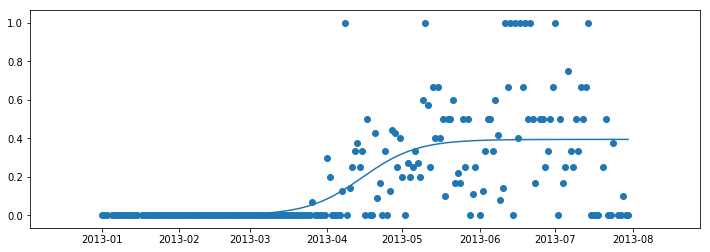

0.4129739249974438
105.02180842141541
2013-04-15
0.009860761613272527
0.38456970291762854
65.0203194846405
145.0232973581903
80.0029778735498
---
329
99 2014
[0.256507229940823, 0.30971125049481185, 0.230283469025233]
1200.708478482973 0.06428995477917576 0.3387391866303093


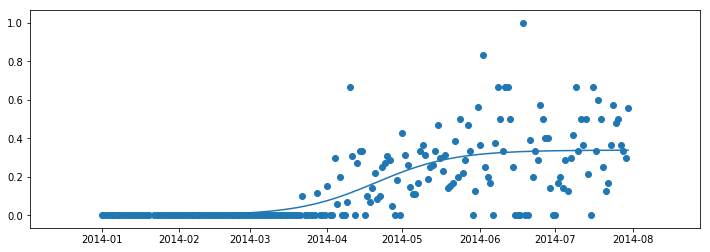

0.5019011646803037
110.2919901662753
2014-04-20
0.008468479665757733
0.3302707069645515
53.30701236199296
167.27696797055756
113.9699556085646
---
330
99 2015
[0.3326373989476654, 0.4336115646248553, 0.8260681967652547]
342.4272888703533 0.04746055984134129 0.4057713857084931


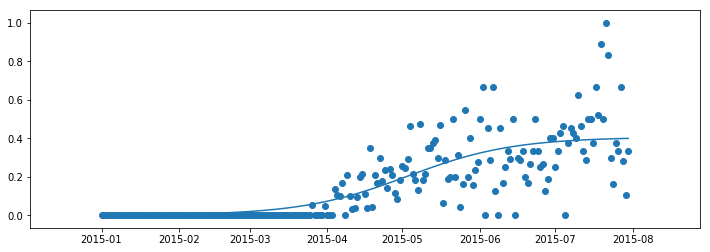

0.6269193662854531
122.9665086000906
2015-05-03
0.010144284642712328
0.39562710106578075
45.774801246094285
200.15821595408698
154.3834147079927
---
331
99 2016
[0.16264003575821895, 0.9866633416022721, 0.5662667376352453]
29054.9621527766 0.09742119771347253 0.24994889222905659


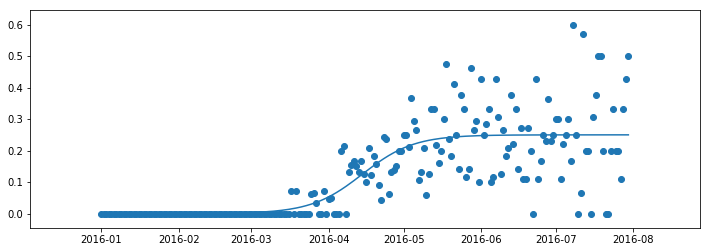

0.6177522439414911
105.48981949624432
2016-04-14
0.006248722305726415
0.24370016992333016
67.88443450698745
143.09520448550117
75.21076997851372
---
332
99 2017
[0.5085433649911865, 0.813345941544053, 0.46369327565051155]
11894.390606860139 0.08275220372982436 0.33463075122328473


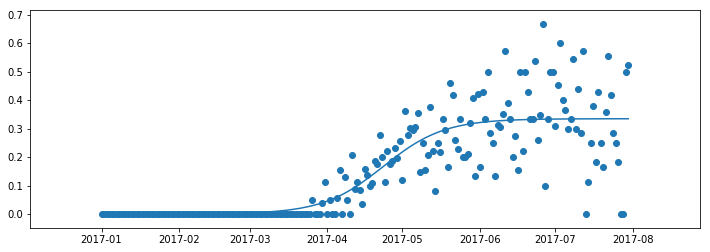

0.721745121688687
113.39664404622407
2017-04-23
0.008365768780582119
0.3262649824427026
69.12517475592311
157.66811333652493
88.54293858060181
---
333
99 2018
[0.4395698332090119, 0.9781543442397176, 0.21136659185032247]
999999.9999509284 0.134066257451345 0.2523531655372253


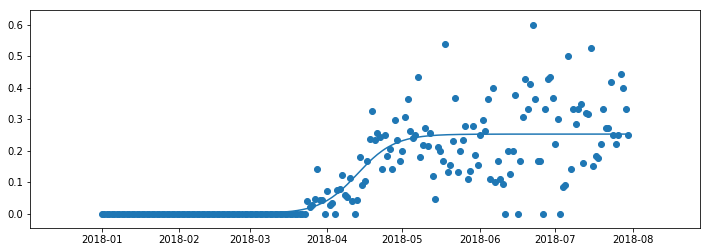

0.6536454755613959
103.04987116485363
2018-04-13
0.0063088291384306334
0.24604433639879467
75.72337070325004
130.3763716264572
54.65300092320716
---
334
99 2019
[0.29079322896978355, 0.1959056402127548, 0.12849761500003587]
999999.9999974684 0.13172367709884966 0.2910143023371481


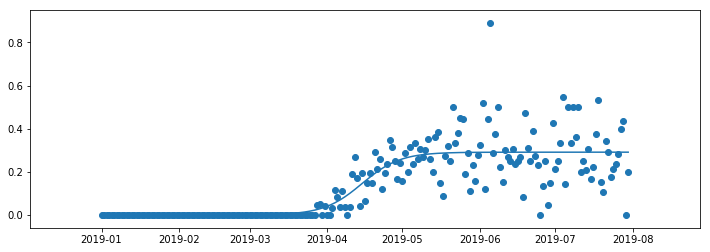

0.6828520159008362
104.88251514262042
2019-04-15
0.007275357558428702
0.28373894477871936
77.07003885272464
132.6949914325162
55.624952579791554
---
335
100 2010
[0.23803148523292927, 0.32313687453087425, 0.5195908031907344]
999999.9998923001 0.14231542759928548 0.23978471150074418


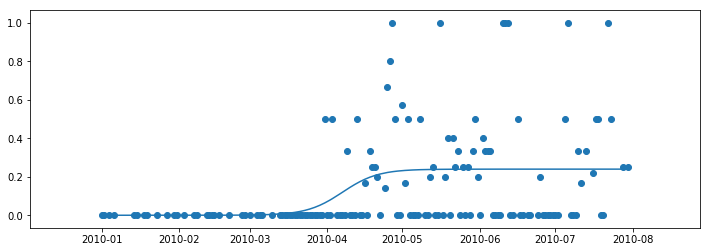

0.16117722363487375
97.07668937170054
2010-04-07
0.005994617787518605
0.23379009371322557
71.33414193373015
122.8192368096709
51.485094875940746
---
336
100 2011
[0.09871482694769174, 0.5415692894521467, 0.6869794063129355]
999999.9992083419 0.14105402865657934 0.28796255008750726


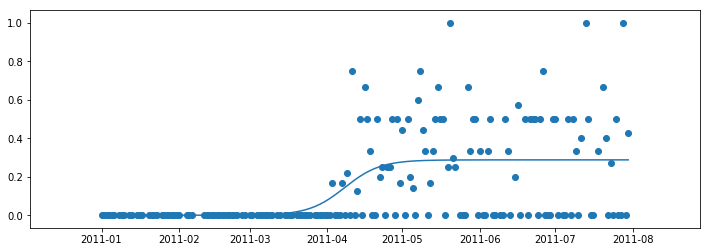

0.3031920883881388
97.94481369127632
2011-04-08
0.007199063752187682
0.28076348633531956
71.97205927212232
123.91756811043031
51.94550883830799
---
337
100 2012
[0.2926301544354635, 0.4428550110783669, 0.0030429986913126372]
225.16497216310117 0.04499498076308204 0.35372686009955556


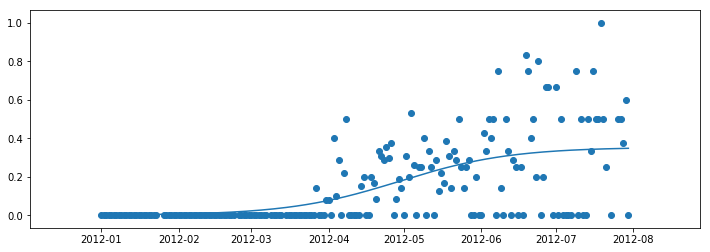

0.3896240519345634
120.3875021454796
2012-04-29
0.00884317150248889
0.34488368859706664
38.96593947341453
201.80906481754454
162.84312534413002
---
338
100 2013
[0.21113523933988543, 0.14041102251215087, 0.7940380017077434]
1381.0079683030945 0.06697526715336928 0.23626072805712148


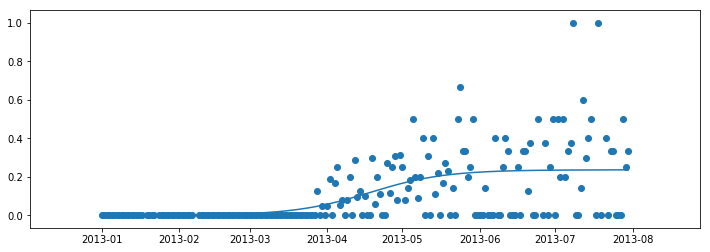

0.3159524863743979
107.95879181469537
2013-04-18
0.005906518201428037
0.23035420985569344
53.258574826529966
162.6590088028608
109.40043397633083
---
339
100 2014
[0.6500709862389027, 0.24771550744065474, 0.27791789365124253]
72.63089702678353 0.02365617385684473 0.5743775007285146


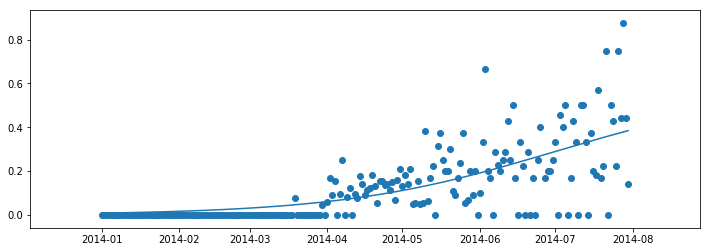

0.5172053447880836
181.15314996043261
2014-06-30
0.014359437518212864
0.5600180632103017
26.286108979939357
336.02019094092566
309.7340819609863
---
340
100 2015
[0.45496537891371747, 0.7383090230659789, 0.6631481073383532]
999999.9999994456 0.1418229215385278 0.25779867761121356


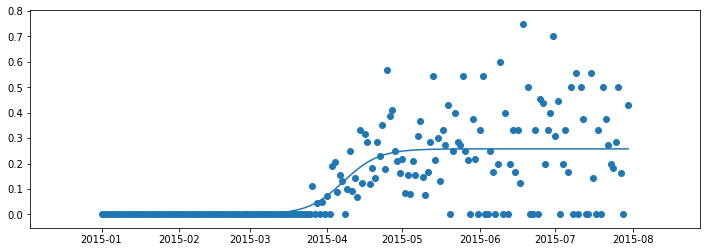

0.46953097926718856
97.4138059496298
2015-04-07
0.00644496694028034
0.2513537106709332
71.58186280259487
123.2457490966647
51.663886294069826
---
341
100 2016
[0.09207775403747454, 0.5248169768719944, 0.26120006165554943]
5454.159650137267 0.08106121244779836 0.2932913053671687


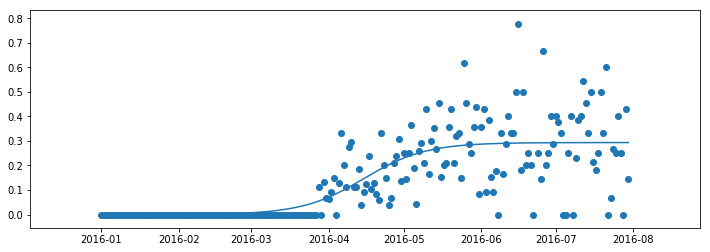

0.5858672470913351
106.14366076299477
2016-04-15
0.007332282634179218
0.28595902273298945
60.94865891807542
151.33866260791405
90.39000368983864
---
342
100 2017
[0.10435756211903913, 0.6698012372918118, 0.8834850082018832]
1324.0160117581463 0.062348079943059284 0.30971547885940204


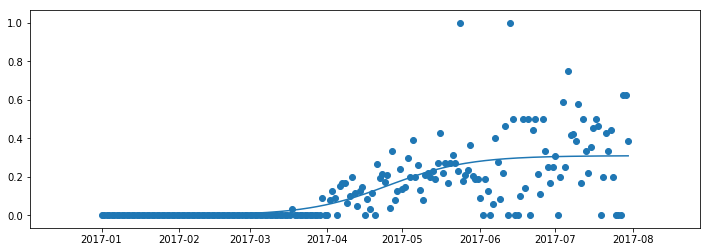

0.49015323974811353
115.2950473609088
2017-04-25
0.007742886971485051
0.301972591887917
56.53523231166474
174.0548624101528
117.51963009848805
---
343
100 2018
[0.40721078698256663, 0.158161153885491, 0.6360089351316182]
999999.9999957745 0.13666099471708476 0.22535213869727694


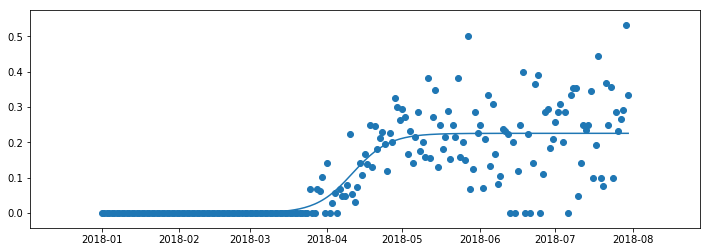

0.6488630528737125
101.09329722471934
2018-04-11
0.005633803467431924
0.21971833522984502
74.28563602106762
127.9009584283711
53.61532240730348
---
344
100 2019
[0.5286667565841083, 0.34426172270384514, 0.6149631208612479]
105738.93033051112 0.10835672436007801 0.23821398897988963


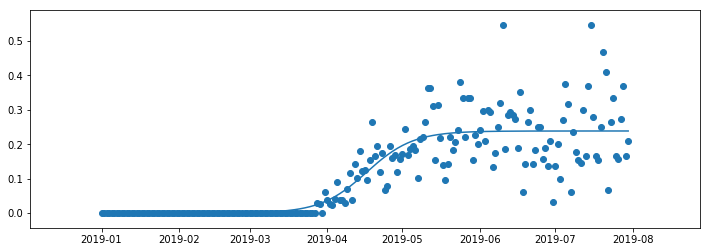

0.7332445416099442
106.76520983838495
2019-04-17
0.005955349724497241
0.2322586392553924
72.95501792121938
140.57540175555053
67.62038383433115
---
345
101 2010
[0.06600891459857561, 0.13873211732648982, 0.04068820197102074]
999999.9996808543 0.11505966080003595 0.32782579257793965


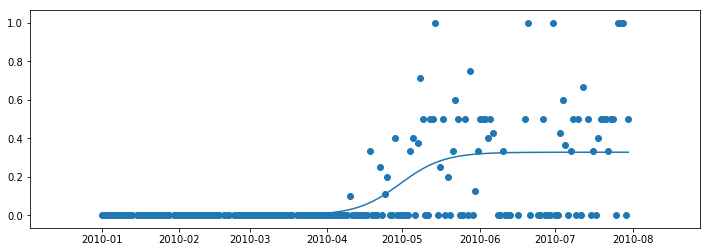

0.3576879635781611
120.07258201165158
2010-04-30
0.008195644814448491
0.31963014776349113
88.23204275874512
151.913121264558
63.68107850581286
---
346
101 2011
[0.08318063083118699, 0.17367310632089883, 0.26070385135010044]
999999.9981439362 0.13280281156821355 0.36807940757443935


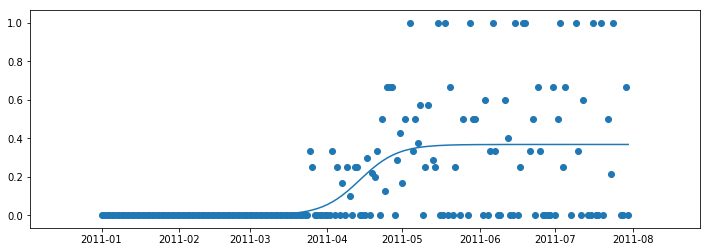

0.32913055348116704
104.03025653573559
2011-04-14
0.009201985189360985
0.35887742238507836
76.44377999304677
131.61673307842437
55.1729530853776
---
347
101 2012
[0.4320131840201845, 0.35734406885882564, 0.11994281561801612]
999999.7954226644 0.1336396528048455 0.23938302799131592


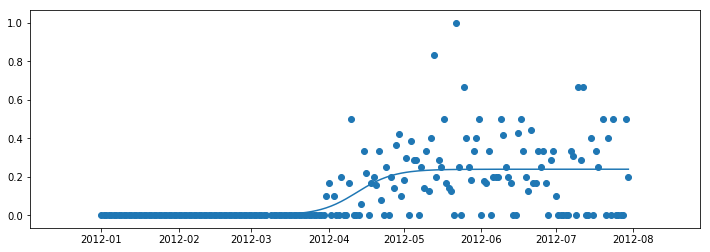

0.373933513346721
103.37882554635009
2012-04-12
0.005984575699782898
0.23339845229153303
75.9650933999522
130.792557692748
54.82746429279581
---
348
101 2013
[0.4356348739559692, 0.5058885447396138, 0.8951128100136223]
999999.9998912826 0.13978598635728567 0.1493752563101941


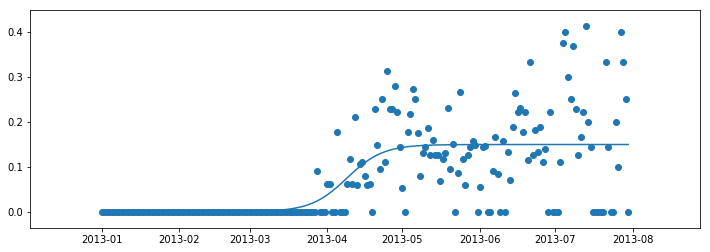

0.45959555821077247
98.83330166261327
2013-04-09
0.0037343814077548526
0.14564087490243924
72.62494028391414
125.04166304131233
52.41672275739819
---
349
101 2014
[0.851332780731589, 0.7173641183914491, 0.3134338466499704]
128296.34781083994 0.10434878050888924 0.23856614044462776


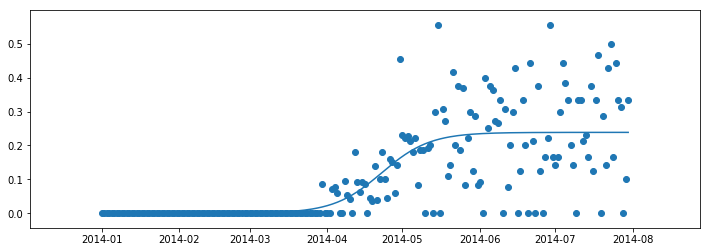

0.5614003054384974
112.71907565020346
2014-04-23
0.005964153511115695
0.23260198693351206
77.6102643323984
147.82788696800847
70.21762263561007
---
350
101 2015
[0.9168917406183087, 0.7403655467827485, 0.42512655056793835]
2338.3556996460943 0.0692292714289247 0.45658422471052384


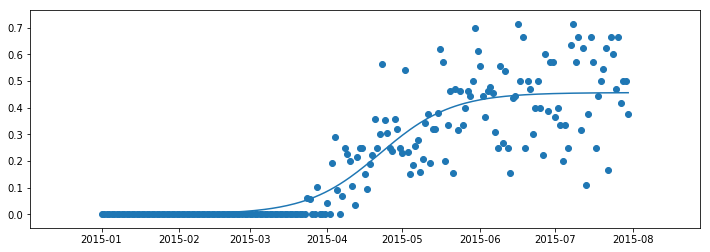

0.7841545560565842
112.0509158738266
2015-04-22
0.011414605617763097
0.44516961909276076
59.13165830384193
164.97017344381132
105.83851513996939
---
351
101 2016
[0.010233559405384729, 0.28081195342117604, 0.46587939467738804]
999999.9999733955 0.12261214292409423 0.32950656091019714


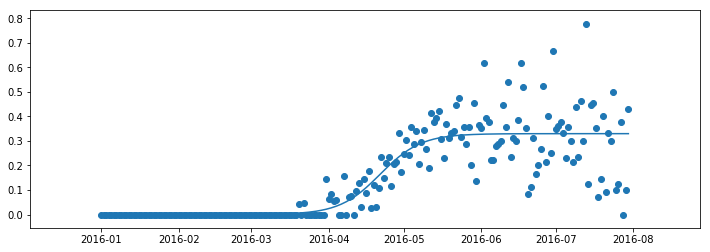

0.7339768352498695
112.6765280212945
2016-04-22
0.008237664022754929
0.3212688968874422
82.7972553916851
142.55580065090388
59.75854525921878
---
352
101 2017
[0.6763289278630642, 0.9143136470950681, 0.8032408141321008]
686716.4702716818 0.13590435710166648 0.2625249543834766


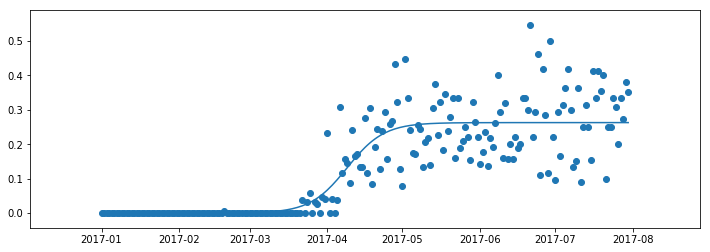

0.7398894173598577
98.8906983234946
2017-04-09
0.006563123859586916
0.2559618305238897
71.93378741747391
125.84760922951533
53.91382181204142
---
353
101 2018
[0.26138650357641213, 0.07261019914414224, 0.7257926484297077]
999999.9868007145 0.141409481251119 0.24130141946805214


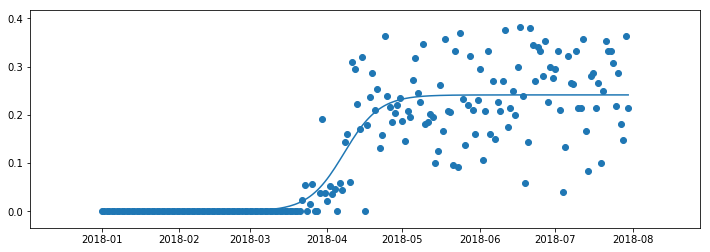

0.7674006724021657
97.69861555627243
2018-04-08
0.006032535486701304
0.23526888398135085
71.79114730367493
123.60608380886995
51.81493650519502
---
354
101 2019
[0.8282538737810353, 0.12359354606464856, 0.914570732577213]
71310.27011196967 0.10302482134015362 0.30349890519919015


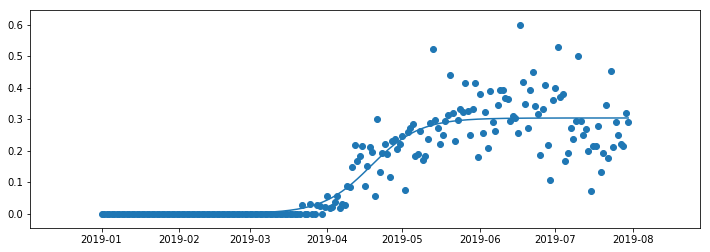

0.8180668852023807
108.46702271848783
2019-04-18
0.007587472629979754
0.2959114325692104
72.90703243193553
144.02701300504003
71.1199805731045
---
355
102 2010
[0.6835016867792143, 0.8561147746097294, 0.7673344208934846]
999999.548870081 0.14616177520822624 0.13300980175391192


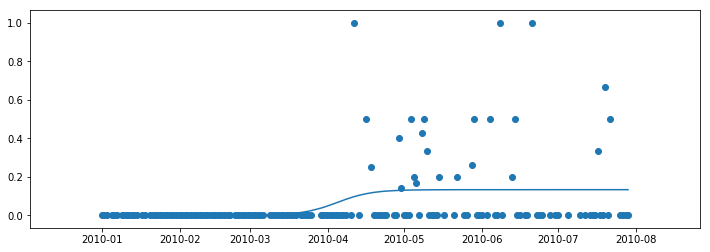

0.12095511030230455
94.5220464594952
2010-04-05
0.003325245043847798
0.12968455671006412
69.45693185678576
119.58716106220467
50.130229205418914
---
356
102 2011
[0.12293325048550674, 0.9717424257101002, 0.9378492427320947]
21095.106614783417 0.09990967351296812 0.3025700253216132


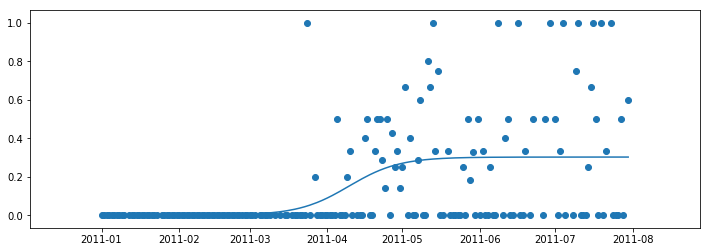

0.233104193271078
99.65798133935716
2011-04-10
0.00756425063304033
0.29500577468857286
62.98924329514644
136.32671938356785
73.33747608842141
---
357
102 2012
[0.851649909914492, 0.5216986855988566, 0.9992057289574893]
256008.8186813019 0.12852607769208624 0.3425021410776187


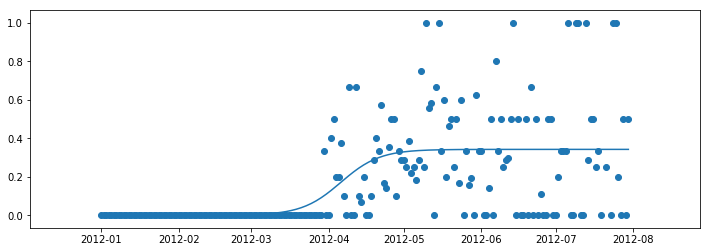

0.35404194478065576
96.8905874547589
2012-04-06
0.00856255352694047
0.33393958755067826
68.38616475770475
125.39501015181307
57.00884539410832
---
358
102 2013
[0.7218783702787309, 0.028208372402159676, 0.025331691958864755]
41846.71959483196 0.10710847135907087 0.2145190538319133


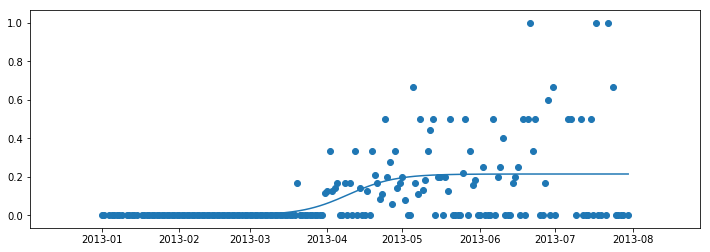

0.23863375469257864
99.35506083677625
2013-04-09
0.005362976345797833
0.20915607748611548
65.15084150992294
133.5592801636296
68.40843865370667
---
359
102 2014
[0.6476896902874009, 0.08200098081782958, 0.33886778385673977]
193.34730544093887 0.04331897421710797 0.3376704768402754


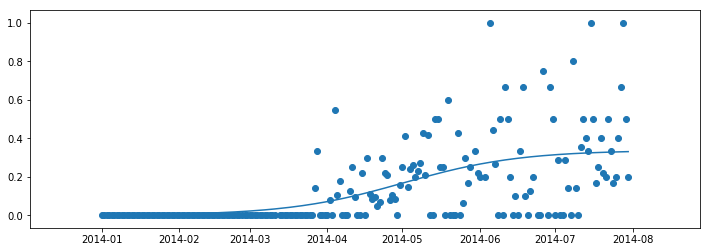

0.3746823064533794
121.52845668501615
2014-05-02
0.008441761921006886
0.32922871491926853
36.95670233625331
206.1002110337791
169.1435086975258
---
360
102 2015
[0.5367507482384646, 0.11935711008948435, 0.8377005912901603]
19518.572112538895 0.08555767693123686 0.33101692828561086


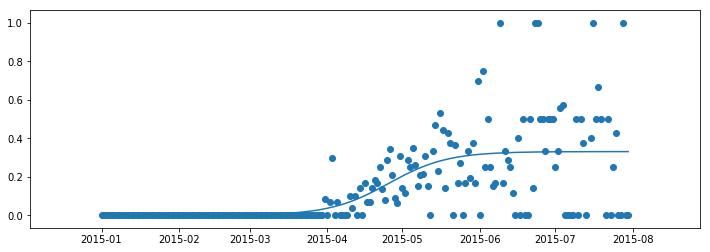

0.42357581001035705
115.46739067329985
2015-04-25
0.008275423207140272
0.3227415050784706
72.64760199350587
158.28717935309388
85.639577359588
---
361
102 2016
[0.25840617893185014, 0.2931513431132823, 0.06247134616889971]
230.50270575234117 0.0389992618499321 0.4275560854363726


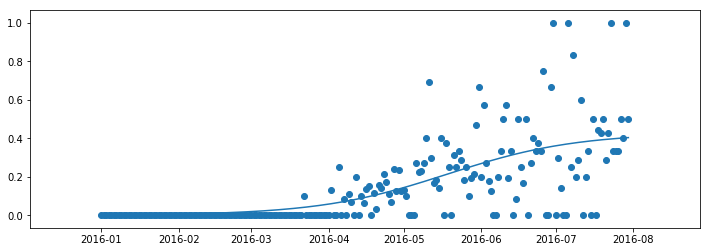

0.47495932145620956
139.49655308666178
2016-05-18
0.010688902135909315
0.41686718330046324
45.557296999536
233.43580917378745
187.87851217425145
---
362
102 2017
[0.496810936397323, 0.41796189329656697, 0.47256568206231575]
13486.335606534383 0.08878492952946719 0.2816238465271287


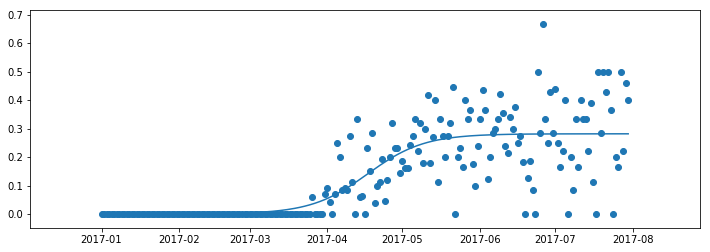

0.6425535690538483
107.1063785817309
2017-04-17
0.007040596163178217
0.2745832503639505
65.84305083517081
148.36970632829104
82.52665549312023
---
363
102 2018
[0.2911100226138079, 0.7659096568453697, 0.050787887987223]
312473.3028416515 0.12183426178463103 0.24765426565028617


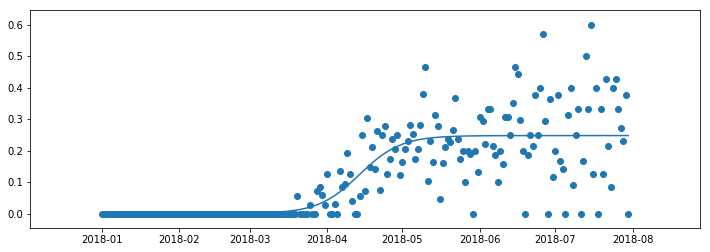

0.6213039854282687
103.84824538082843
2018-04-14
0.0061913566412571544
0.241462909009029
73.77820110538643
133.9182896562704
60.14008855088396
---
364
102 2019
[0.5126726482612155, 0.9942511535139357, 0.2409722860400697]
1627.7078460348966 0.06578211156492263 0.3306852269645957


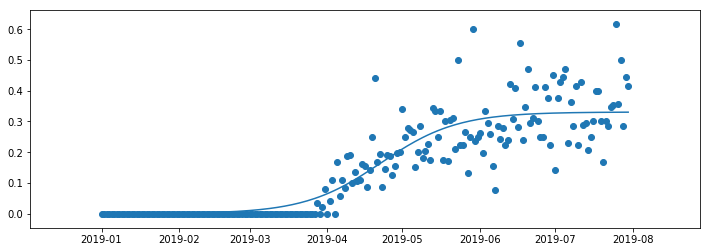

0.8015927521814051
112.41548650209482
2019-04-22
0.008267130674114892
0.3224180962904808
56.723117270165375
168.1078557340243
111.38473846385892
---
365
103 2010
[0.0947100553950736, 0.38771951042865704, 0.21963720678441256]
3395.9719716594327 0.03639444338132792 0.9999999999977808


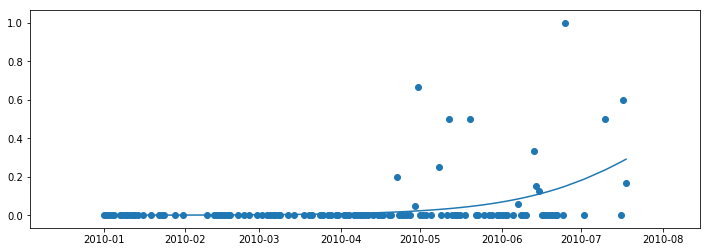

0.15613284164516972
223.395236708828
---
366
103 2011
[0.008463511456300088, 0.26972213025120295, 0.1425509661888148]
75064.95961605817 0.12359723430118216 0.13038451965923495


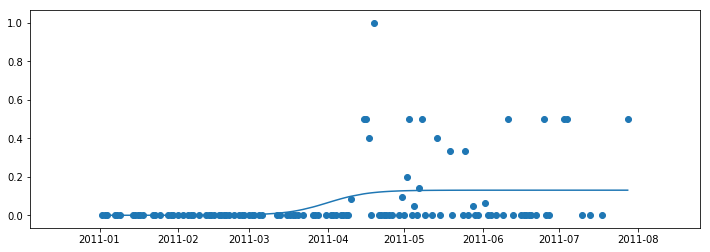

0.12888955600190566
90.82815816496458
2011-04-01
0.003259612991480874
0.12712490666775408
61.18702851636525
120.46928781356391
59.28225929719866
---
367
103 2012
[0.6097457927662953, 0.7330619798636786, 0.2713883403377254]
999999.962610583 0.12847657180144717 0.1612637628173834


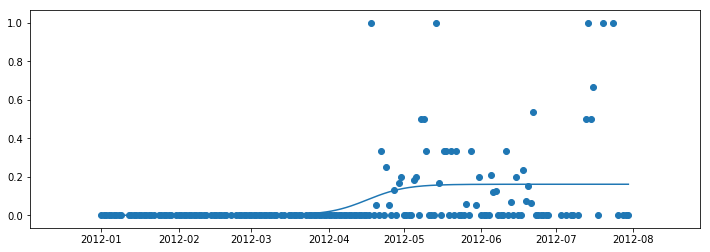

0.1478984506241383
107.53330608732227
2012-04-17
0.004031594070434585
0.15723216874694879
79.01789977813573
136.0487123965088
57.03081261837306
---
368
103 2013
[0.47395492624479796, 0.9877659637475663, 0.8020694704831233]
52835.45622608152 0.11204697095493658 0.11232093313655718


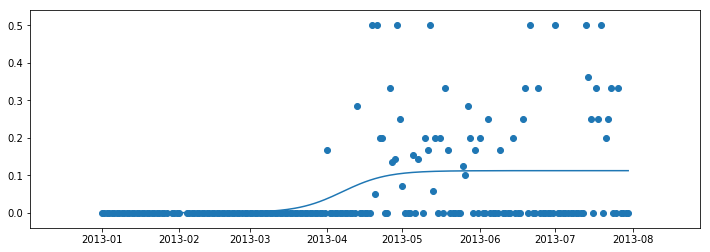

0.173953722423131
97.05695451716537
2013-04-07
0.0028080233284139295
0.10951290980814325
64.36029511703691
129.75361391729382
65.3933188002569
---
369
103 2014
[0.3952609428709253, 0.3678596492014735, 0.144699235108237]
999999.9998934024 0.13626001225517517 0.13213142730114077


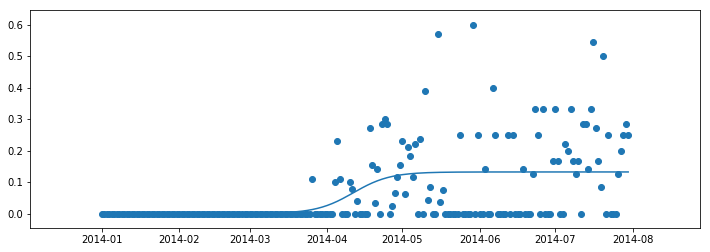

0.2526511322587779
101.39079198074093
2014-04-11
0.0033032856825285194
0.12882814161861225
74.50424188070964
128.2773420807722
53.77310020006256
---
370
103 2015
[0.6970337008309777, 0.8384547409884229, 0.9208126093572054]
248.5569833779599 0.02688749548323774 0.9999999999999999


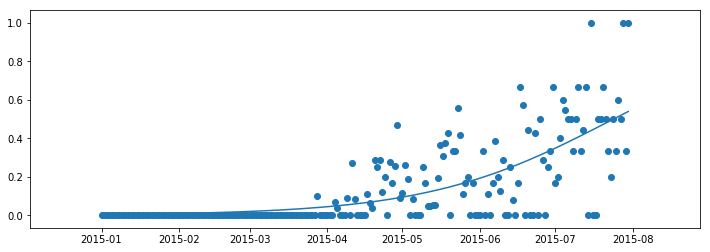

0.536703984454038
205.1389327821905
2015-07-24
0.024999999999999998
0.9749999999999999
68.88371152465119
341.39415403972964
272.51044251507847
---
371
103 2016
[0.6506410444620426, 0.3869195943938919, 0.29309028829370876]
50272.8232956125 0.09587813169339492 0.2676178533786095


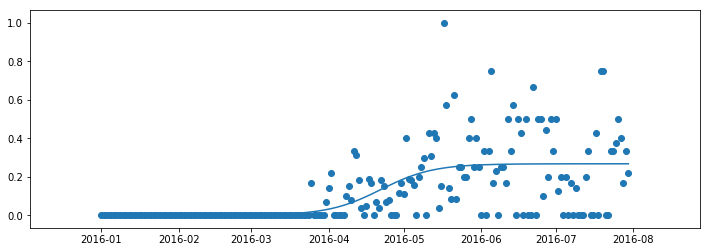

0.388799926970111
112.90603734708922
2016-04-22
0.006690446334465238
0.26092740704414424
74.69542997057908
151.1166447235993
76.42121475302022
---
372
103 2017
[0.07407742998850675, 0.47185721474673137, 0.7580861979440631]
999999.9999512249 0.12943296544596758 0.17673789100399606


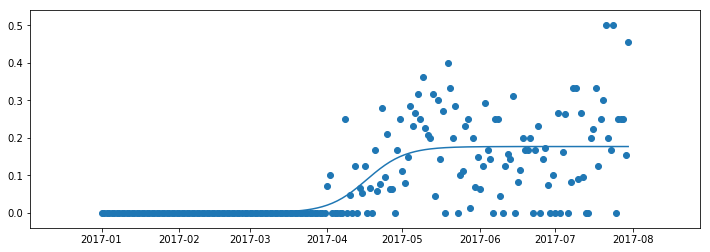

0.48764421438755523
106.73873159216808
2017-04-17
0.004418447275099902
0.17231944372889615
78.4340285862015
135.04343459813464
56.60940601193313
---
373
103 2018
[0.2758644883034772, 0.06198290466157619, 0.844669648250514]
999999.9997843916 0.13011146299792997 0.21022839055460343


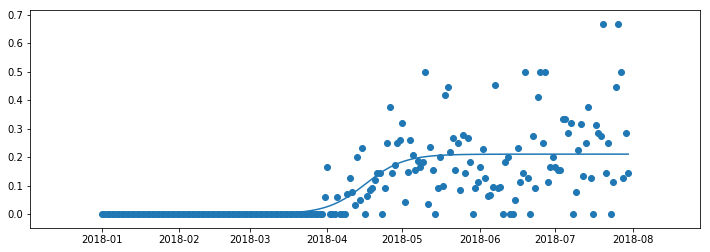

0.47948987460818715
106.18211677451099
2018-04-16
0.0052557097638650865
0.20497268079073835
78.02501545755837
134.33921809146364
56.31420263390527
---
374
103 2019
[0.32940503426755696, 0.49773887979397724, 0.26004646791072095]
999999.9999958803 0.12728602263137906 0.22898319397610997


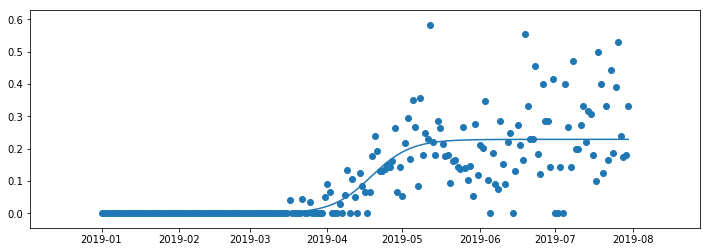

0.6031023580458903
108.53910172030389
2019-04-19
0.00572457984940275
0.22325861412670722
79.75698118269122
137.3212222579166
57.56424107522537
---
375
104 2010
[0.10128538164547662, 0.5179769616967105, 0.5410099982112702]
999999.9997716501 0.14002230846748165 0.17910311391565517


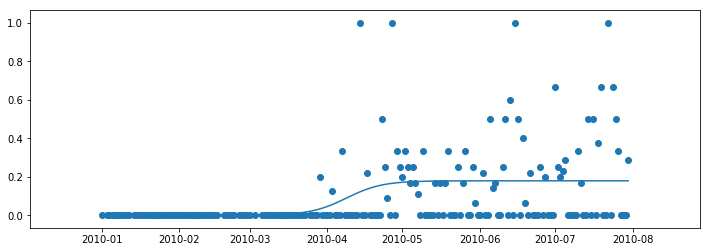

0.1758780998603512
98.66649613868061
2010-04-09
0.0044775778478913794
0.1746255360677638
72.50236782065292
124.83062445670834
52.328256636055414
---
376
104 2011
[0.2053987128626592, 0.013136891405509776, 0.2485201282747148]
999999.9996888891 0.1478432560593592 0.2168034581979773


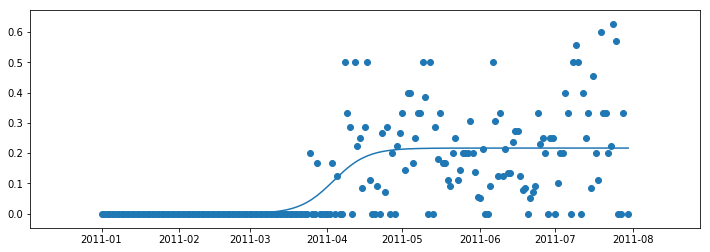

0.4158474560624398
93.44701223372829
2011-04-03
0.005420086454949433
0.21138337174302788
68.66697326692739
118.22705120052923
49.560077933601846
---
377
104 2012
[0.8012248797689667, 0.16399355114354774, 0.657881221373165]
999999.9999922339 0.14941214891747787 0.22821549238485203


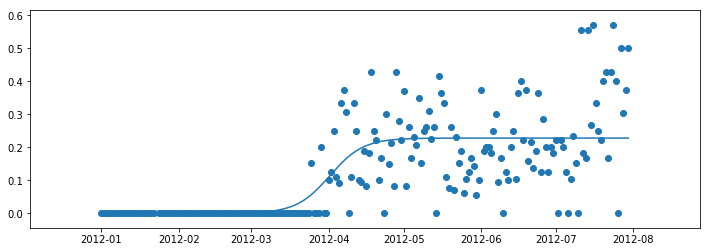

0.5305290016065493
92.46577777009941
2012-04-01
0.005705387309621301
0.22251010507523072
67.94594004155516
116.98561549864364
49.03967545708848
---
378
104 2013
[0.12121933187147127, 0.013855457886436828, 0.3350960771737236]
999999.9999978049 0.1384369442786864 0.22745033679429835


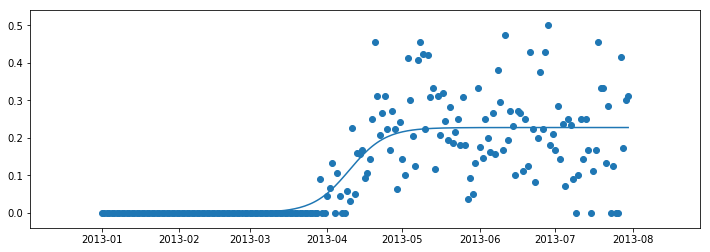

0.6177962740710494
99.79641366650058
2013-04-10
0.005686258419857459
0.2217640783744409
73.33265671767225
126.26017061532892
52.92751389765667
---
379
104 2014
[0.7239123835653628, 0.5247621131340086, 0.08080032319313857]
656944.4357296323 0.1282526743031059 0.23242987257266484


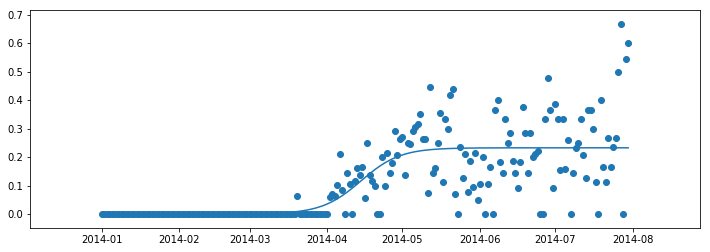

0.5579689964658876
104.44503238601109
2014-04-14
0.005810746814316621
0.22661912575834822
75.87984521906462
133.01021955295758
57.13037433389296
---
380
104 2015
[0.4215643192531804, 0.9217577082998996, 0.6356837225307203]
30431.249457531503 0.096882296458019 0.2731101630331122


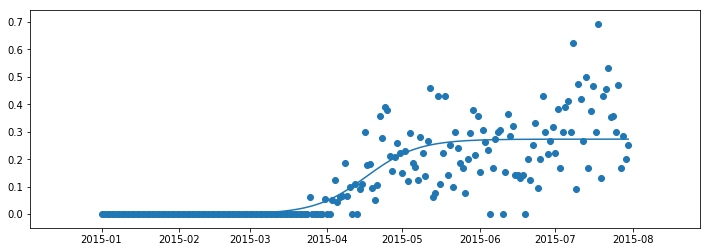

0.6408170152553188
106.55430021292106
2015-04-17
0.006827754075827805
0.2662824089572844
68.73973779988889
144.36886262595328
75.6291248260644
---
381
104 2016
[0.5773129637955543, 0.5411269495753416, 0.7969163903174445]
999999.9999998258 0.12222972868396816 0.23814529119732153


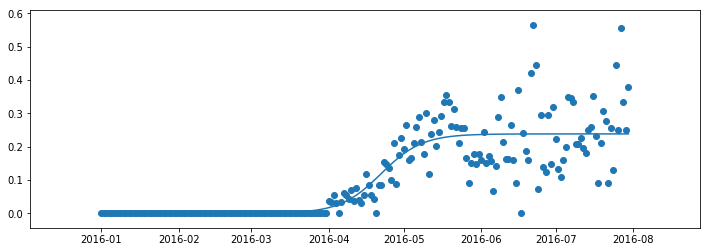

0.7268330794980302
113.02905362479271
2016-04-22
0.005953632279933039
0.2321916589173885
83.05629916010768
143.00180808947778
59.94550892937009
---
382
104 2017
[0.9021578407965847, 0.17483413417417237, 0.08647300939380742]
661315.0241255439 0.12163806798044002 0.2299941343375119


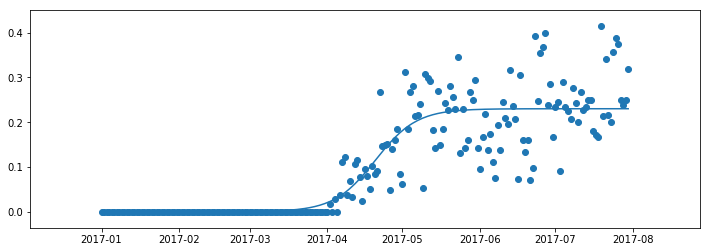

0.7813863872224347
110.17920470947193
2017-04-20
0.005749853358437798
0.2242442809790741
80.06065952903744
140.29774988990638
60.23709036086895
---
383
104 2018
[0.408926543542124, 0.7036130737421578, 0.6376963532344733]
999999.9999910023 0.1404219187298142 0.19930534142936324


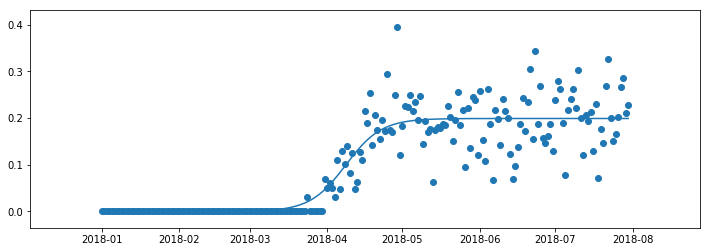

0.8153942181508371
98.38571273575673
2018-04-08
0.004982633535734081
0.19432270789362915
72.29604184058326
124.47538363093021
52.17934179034695
---
384
104 2019
[0.6830791244437335, 0.9031353825184057, 0.5260794029392981]
999999.9999840795 0.12660739159865209 0.23844801798884346


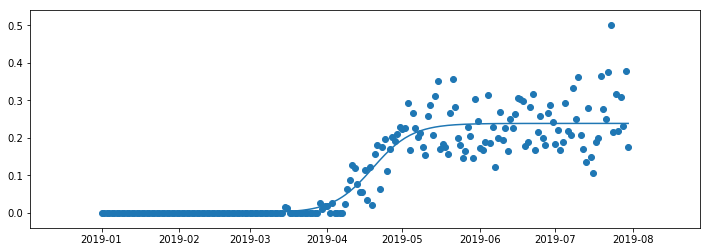

0.8448736912498396
109.12088451947413
2019-04-19
0.005961200449721087
0.23248681753912237
80.18448831171393
138.05728072723429
57.87279241552035
---
385
105 2010
[0.9494292389677902, 0.7303199809274535, 0.40710872007418153]
999999.9984127557 0.1293096130269502 0.24232778338186212


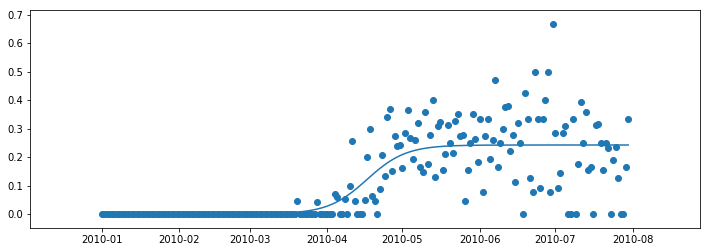

0.6087985678407988
106.84055294092988
2010-04-17
0.006058194584546553
0.23626958879731555
78.50884920776582
135.17225667409392
56.663407466328096
---
386
105 2011
[0.26134711101668473, 0.423330413513759, 0.5196554302495593]
999999.9705752836 0.14432406133188122 0.25677607487416093


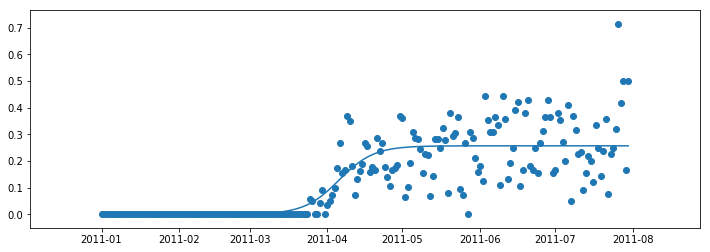

0.6619494873735703
95.72562191670882
2011-04-06
0.006419401871854024
0.2503566730023069
70.34134702643199
121.10989680698567
50.768549780553684
---
387
105 2012
[0.051470745019830955, 0.42687111131777233, 0.31472756815621006]
999999.9999922904 0.14178428334737703 0.2866474993328968


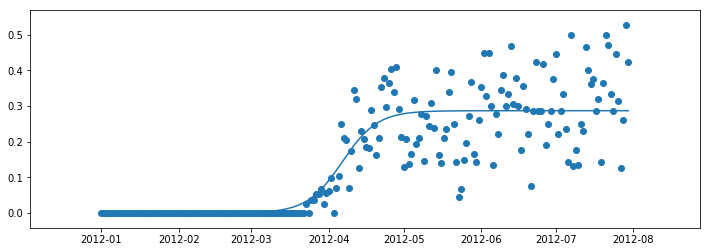

0.749258538573055
97.44035256790785
2012-04-06
0.00716618748332242
0.27948131184957437
71.6013698567298
123.27933527908587
51.67796542235607
---
388
105 2013
[0.5185951101392621, 0.6968364468871152, 0.256567232702672]
999999.9999264874 0.13372788588923526 0.25289879464658677


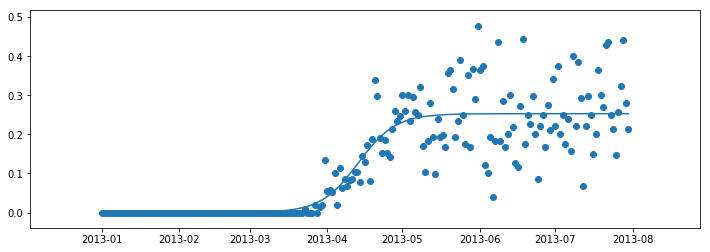

0.769284445743316
103.31061817079748
2013-04-13
0.006322469866164669
0.2465763247804221
75.91497348705428
130.70626285454074
54.791289367486456
---
389
105 2014
[0.872631948917162, 0.6215618665866945, 0.8925720335089552]
2563.7542511456395 0.07326925458093211 0.2533351412556193


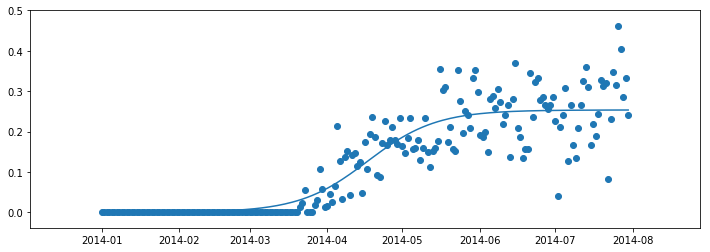

0.813503029719518
107.12853587025204
2014-04-17
0.006333378531390483
0.2470017627242288
57.12718582126346
157.12988591924054
100.00270009797708
---
390
105 2015
[0.22733865937918418, 0.044407210769911054, 0.8972990514412718]
34537.85209551085 0.09972981093370423 0.2787278344877012


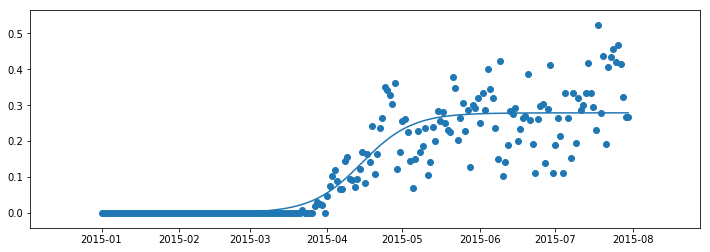

0.7929373868179279
104.78121903502021
2015-04-15
0.006968195862192531
0.27175963862550867
68.04634897129361
141.5160890987468
73.46974012745318
---
391
105 2016
[0.8271635749280798, 0.502862264482247, 0.553357506330806]
28156.15906371977 0.09393909289172797 0.2235014158854645


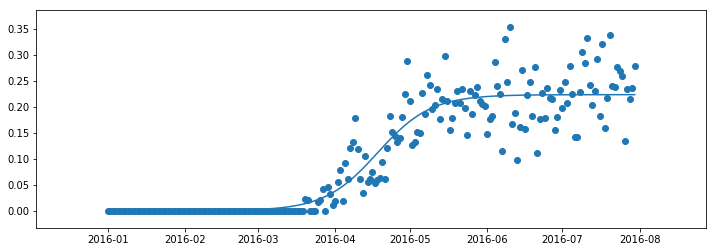

0.8708660773484315
109.06557737248833
2016-04-18
0.005587535397136613
0.21791388048832788
70.06624777120953
148.0649069737672
77.99865920255766
---
392
105 2017
[0.4464620651692929, 0.67394809062534, 0.4957053289622442]
23007.380223158038 0.09157488774526652 0.24118910583257672


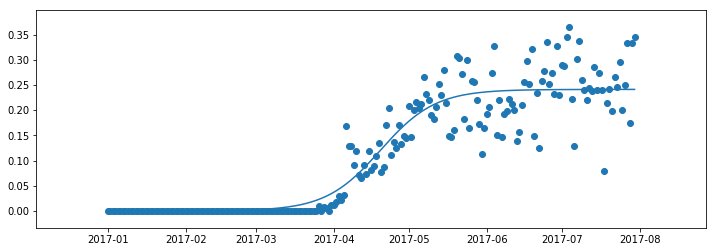

0.8728692651071589
109.67603204326542
2017-04-20
0.006029727645814418
0.2351593781867623
69.66984982090159
149.6822142656293
80.01236444472772
---
393
105 2018
[0.08082161180371406, 0.8835213996791218, 0.9801034004499186]
165596.9071769915 0.11560435625588596 0.21425634070666222


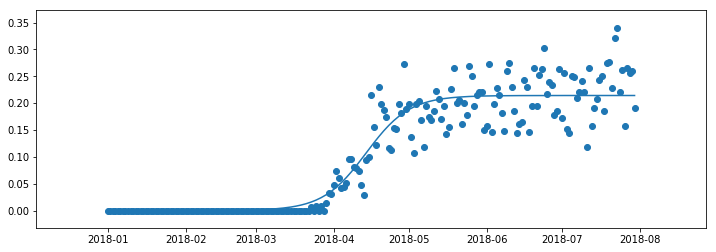

0.8954616082813879
103.95206749554984
2018-04-14
0.0053564085176665555
0.20889993218899566
72.26155197535189
135.64258301574782
63.381031040395925
---
394
105 2019
[0.08370478191787467, 0.9456603021889373, 0.741853754334383]
999999.9999999987 0.13194021001639553 0.19271108683851496


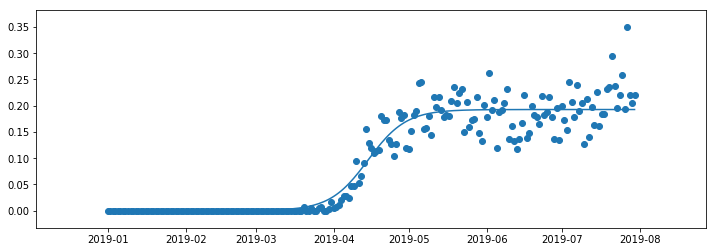

0.9119507151321189
104.71038780556353
2019-04-15
0.004817777170962875
0.18789330966755208
76.94355580132165
132.47721980980538
55.533664008483726
---
395
106 2010
[0.1980992401608409, 0.08049974269633664, 0.26495214531085176]
7152.753643589085 0.07868630960859127 0.4792316348449936


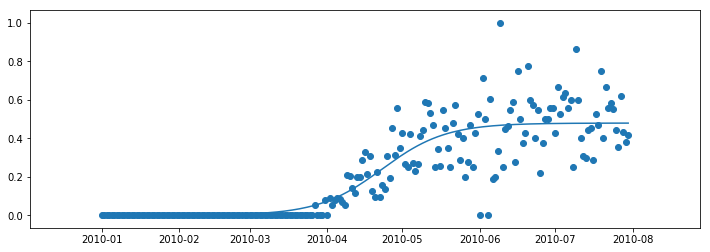

0.7757162620975387
112.79284453257578
2010-04-23
0.01198079087112484
0.46725084397386873
66.23377136783753
159.35191769731395
93.11814632947642
---
396
106 2011
[0.9272497504762411, 0.5553593693638651, 0.27971914694896705]
661.1078060354179 0.0595288006601073 0.5310531958246867


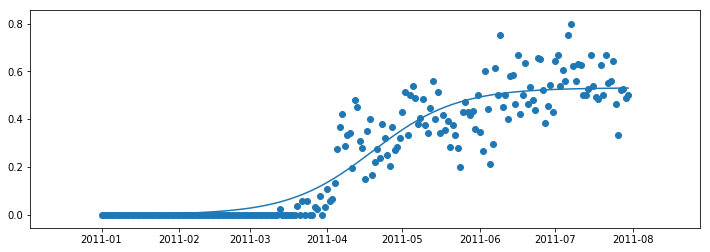

0.8689368193861753
109.08865708542055
2011-04-19
0.013276329895617167
0.5177768659290695
47.54598185083028
170.63133232001073
123.08535046918044
---
397
106 2012
[0.7569689304792518, 0.6286841928297295, 0.9952288817172075]
49105.16435851034 0.10662370543264657 0.42990017843780404


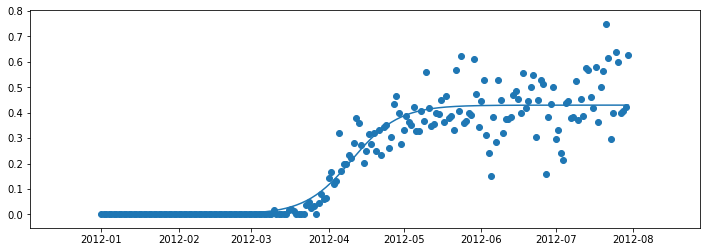

0.8755601281437193
101.30692274142201
2012-04-10
0.010747504460945101
0.4191526739768589
66.9471935305113
135.6666519523327
68.7194584218214
---
398
106 2013
[0.04292110165786278, 0.29890648142326826, 0.8474658296554008]
2831.0010398809945 0.06906147764951748 0.48459842492099436


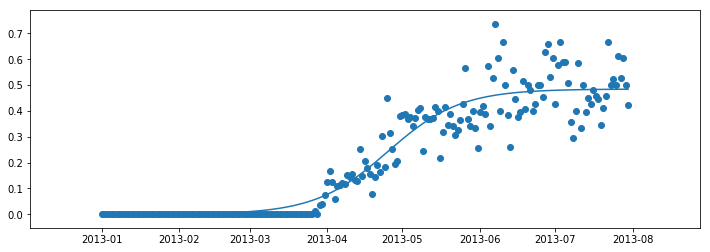

0.9040335490412004
115.09145073276152
2013-04-25
0.01211496062302486
0.4724834642979695
62.04361899185982
168.13928247366326
106.09566348180343
---
399
106 2014
[0.412823511319389, 0.6069498622631795, 0.46839969239318313]
1303.953637931208 0.0623724711082291 0.46722052792923957


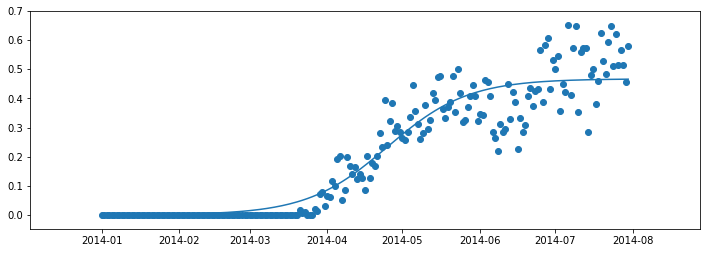

0.8956854109540966
115.00516270509641
2014-04-25
0.01168051319823099
0.4555400147310086
56.26832606810297
173.7419993420899
117.47367327398695
---
400
106 2015
[0.9522939179569038, 0.746773204712265, 0.33019339328975117]
88035.16468291571 0.10421663435534793 0.43386200423158633


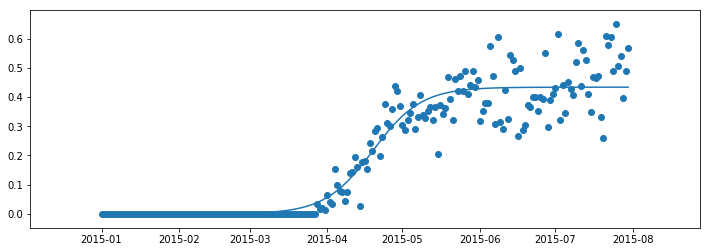

0.9097063641835663
109.24831417497509
2015-04-19
0.010846550105789658
0.42301545412579666
74.09498506593879
144.40164328401144
70.30665821807266
---
401
106 2016
[0.16811951488349186, 0.207803324823988, 0.5435814429410556]
300986.32881392085 0.11252242282786509 0.39778405931484256


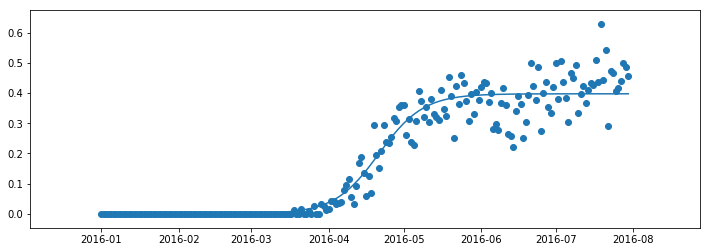

0.9282450115564856
112.10938945719835
2016-04-21
0.009944601482871065
0.3878394578319715
79.55088641346191
144.66789250093478
65.11700608747287
---
402
106 2017
[0.5839113581107483, 0.03285513442130261, 0.5817085718557002]
39204.907525008406 0.09632795529186654 0.41546049978560445


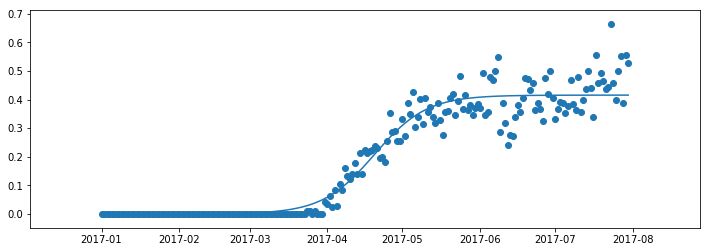

0.9370516786109606
109.79738101842828
2017-04-20
0.010386512494640112
0.40507398729096433
71.76520609029524
147.82955594656124
76.064349856266
---
403
106 2018
[0.6374362518861236, 0.24194245053551622, 0.957086366236667]
52288.17062923662 0.09908639479148137 0.3814011474033694


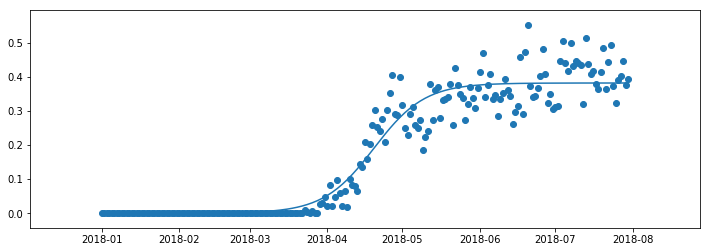

0.9302045089188189
109.64699507269222
2018-04-20
0.009535028685084235
0.3718661187182851
72.67358763528075
146.62040251010364
73.94681487482289
---
404
106 2019
[0.32827066102463653, 0.5724873976010866, 0.2172067701951107]
999999.9999999999 0.12859617262384765 0.3378442694333202


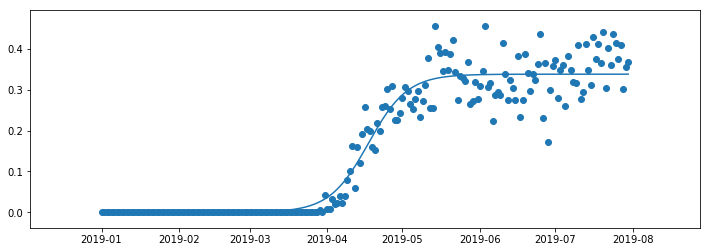

0.9372161471528453
107.43329506684123
2019-04-17
0.008446106735833006
0.3293981626974872
78.94440950066029
135.92218063302212
56.97777113236184
---
405
107 2010
[0.4123198972437663, 0.6400040438366911, 0.689992773879606]
6329.758695081074 0.07935981108513446 0.6663830547272193


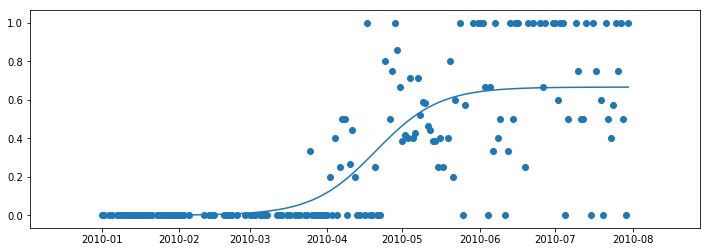

0.5868018859856567
110.2953405998081
2010-04-20
0.01665957636818048
0.6497234783590388
64.13139948105336
156.45928171856275
92.32788223750939
---
406
107 2011
[0.3808539542099907, 0.3593780499041632, 0.7631367403784682]
999999.9997475414 0.1460686993423301 0.5415594808988088


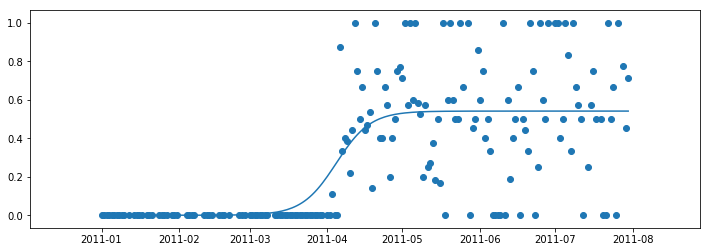

0.5145756421934315
94.58227957061118
2011-04-05
0.01353898702247022
0.5280204938763385
69.5011933240387
119.66336581718363
50.162172493144936
---
407
107 2012
[0.5964864900567901, 0.8121545031595585, 0.8068969284324237]
165297.80052167503 0.12209972262555761 0.5253365888549573


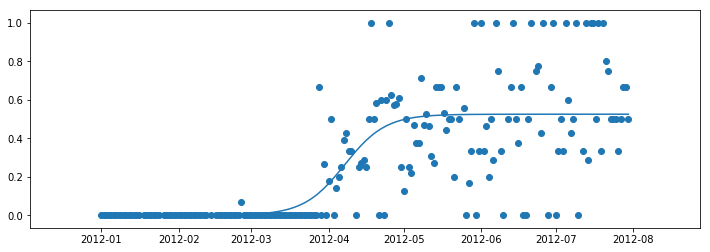

0.5652334157114669
98.4072995365393
2012-04-07
0.013133414721373932
0.5122031741335833
68.40263148856455
128.411967584514
60.00933609594945
---
408
107 2013
[0.0005775683780814278, 0.8681645910281306, 0.4462391770314975]
999999.9976040667 0.13895764198885077 0.526285114905764


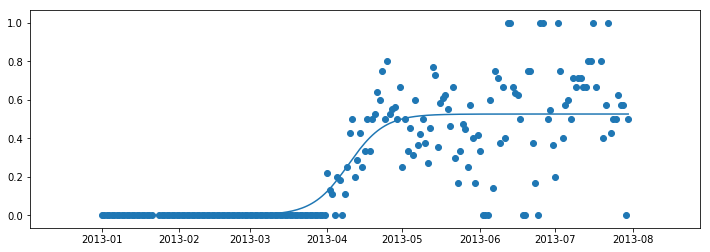

0.6696303873997824
99.42245966347662
2013-04-09
0.0131571278726441
0.5131279870331199
73.05786687322481
125.78705245372838
52.72918558050357
---
409
107 2014
[0.7488041031315538, 0.047095221670521936, 0.6091259387779125]
999999.999999013 0.13706184855227224 0.5527829551454269


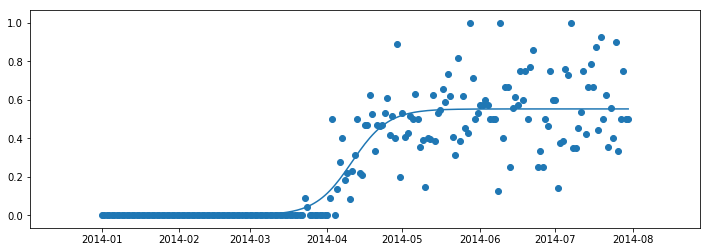

0.784555032558907
100.79763773720278
2014-04-11
0.013819573878635673
0.5389633812667912
74.06837875794386
127.52689671646169
53.45851795851783
---
410
107 2015
[0.6356390352348618, 0.08180640036139353, 0.6536254732780754]
999999.9999998533 0.1370767415179704 0.5399900108908596


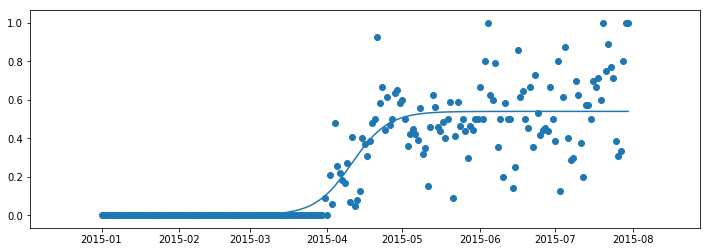

0.7574618377979231
100.78668638437799
2015-04-11
0.013499750272271491
0.5264902606185882
74.06033145676714
127.51304131198887
53.45270985522173
---
411
107 2016
[0.325949604735591, 0.9248452361584282, 0.1718927184053215]
4442.612211021097 0.07570562917892552 0.5772056727102706


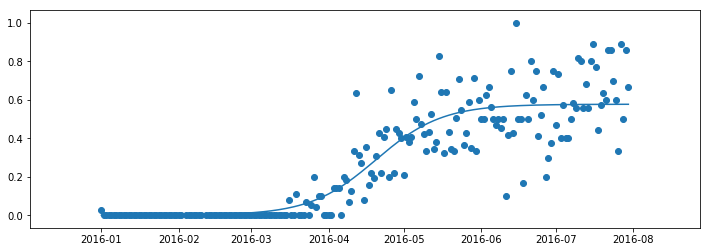

0.8056491224497248
110.94284413632785
2016-04-20
0.014430141817756766
0.5627755308925138
62.55064812840556
159.33504014425012
96.78439201584456
---
412
107 2017
[0.6899185209657512, 0.7108845183766925, 0.8492856358765459]
999999.9998465764 0.1418225764013285 0.5094348189545957


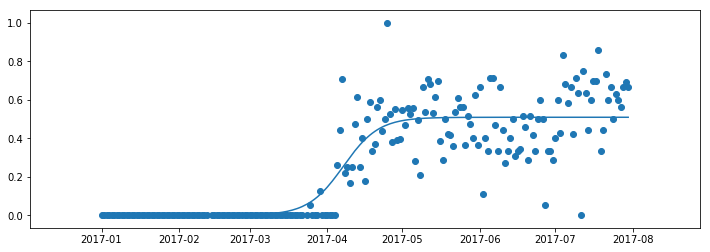

0.7749696750406668
97.4140430132634
2017-04-07
0.012735870473864895
0.4966989484807308
71.58203700201646
123.24604902451033
51.664012022493864
---
413
107 2018
[0.20760814609178158, 0.39325365145639546, 0.3239741703403509]
999999.9999952817 0.1387436272135541 0.4619275216413954


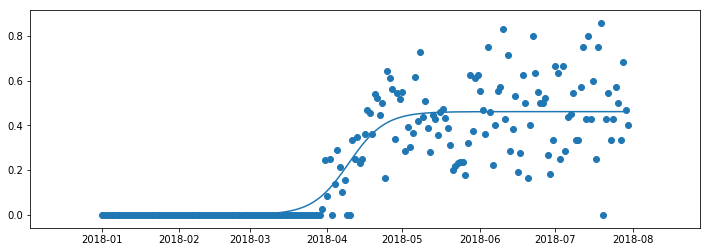

0.7538240066939005
99.57582078126536
2018-04-10
0.011548188041034885
0.4503793336003605
73.17056008780884
125.98108147472186
52.810521386913024
---
414
107 2019
[0.9273319440042402, 0.05830728878009295, 0.9682380557920703]
999999.999988766 0.14135837521282824 0.47880213547824946


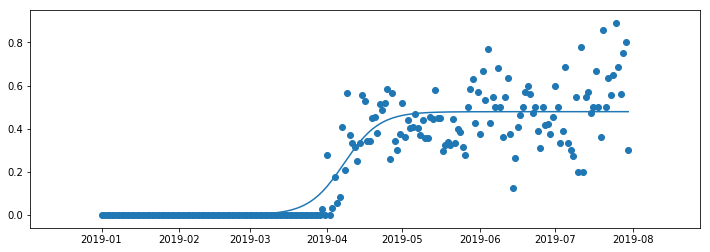

0.8146303636183524
97.73393714488087
2019-04-08
0.011970053386956237
0.46683208209129323
71.81710242876439
123.65077186099738
51.833669432232995
---
415
112 2016
[0.7221009908818982, 0.031743595614347364, 0.9575986660490513]
999999.9999980173 0.12301676091556968 0.5201297095017788


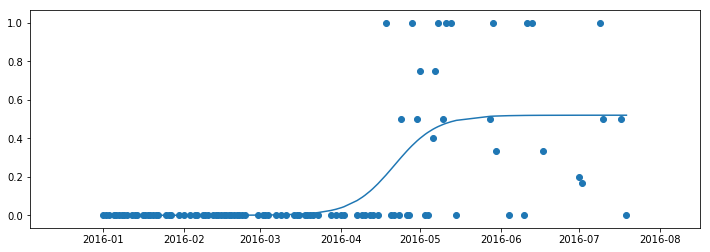

0.4635106742967212
112.30592038953388
2016-04-21
0.013003242737544472
0.5071264667642343
82.52492454097577
142.08691623809193
59.561991697116156
---
416
112 2017
[0.7724794844279936, 0.6117585518926122, 0.8094007983712563]
999999.9999584255 0.11730818174139794 0.6654357626514353


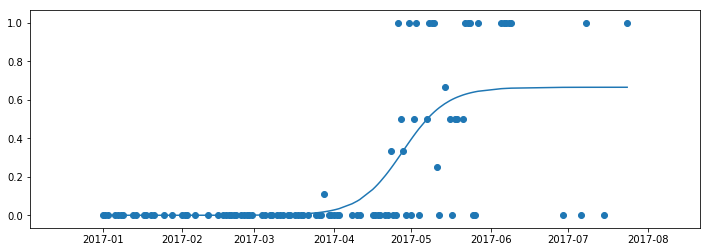

0.5196368863892985
117.77107404476307
2017-04-28
0.016635894066285885
0.6487998685851495
86.54084277064914
149.00130531887703
62.460462548227895
---
417
112 2018
[0.3944889353726143, 0.06297013904368254, 0.7244086349757186]
999999.9999431547 0.12701914303662354 0.4247962635669341


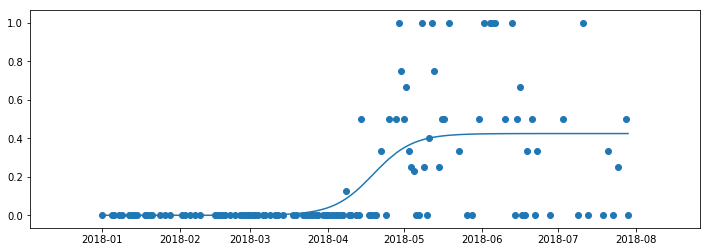

0.3910076119817347
108.76715294736314
2018-04-19
0.010619906589173354
0.41417635697776073
79.92455837031322
137.60974752441302
57.6851891540998
---
418
112 2019
[0.9140303410217605, 0.4621690609646897, 0.1383252203361045]
999999.5132153734 0.1345656348168555 0.3042244485170226


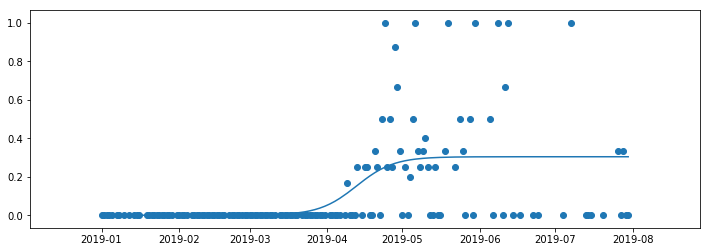

0.30429910405623195
102.6674461870039
2019-04-13
0.007605611212925566
0.29661883730409705
75.44235524074728
129.89253713326048
54.4501818925132
---
419
113 2010
[0.6596465809878548, 0.829526612552937, 0.06729127479715968]
999999.9996375103 0.12179297436461092 0.6577236427579911


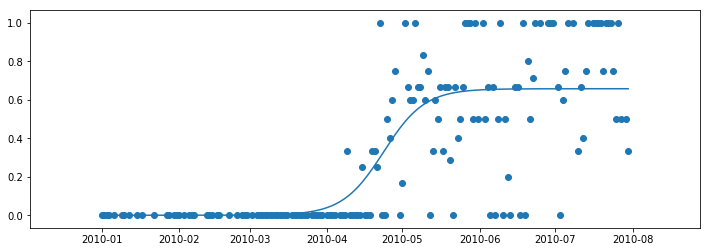

0.6060593309898618
113.43438018224575
2010-04-23
0.01644309106894978
0.6412805516890413
83.35414226012993
143.5146181043615
60.160475844231556
---
420
113 2011
[0.31130684996695734, 0.738093692313318, 0.021690116853571917]
107182.57160207834 0.09848940581576796 0.6659220658166622


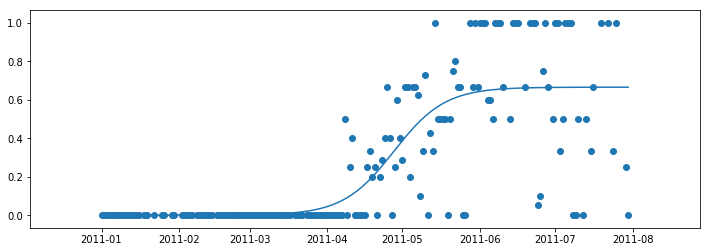

0.6322823877772552
117.5993381230088
2011-04-28
0.016648051645416558
0.6492740141712456
80.40181808737552
154.79685815864207
74.39504007126655
---
421
113 2012
[0.5815261238017068, 0.5418230469888604, 0.27934806770895604]
999999.9999757052 0.13451282898786177 0.38899288956553874


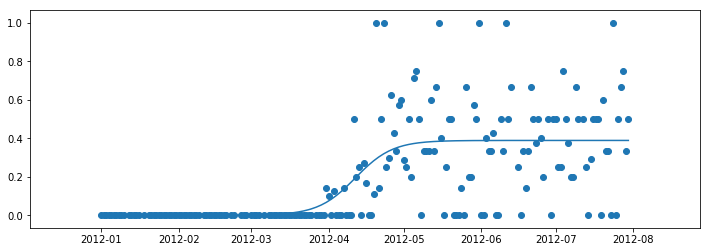

0.46873808287768215
102.7077540625264
2012-04-12
0.009724822239138469
0.3792680673264003
75.4719753364672
129.94353278858566
54.47155745211846
---
422
113 2013
[0.9127517671214248, 0.2850118891753628, 0.41529752579301815]
38481.69746394607 0.0914326581825011 0.436184687268399


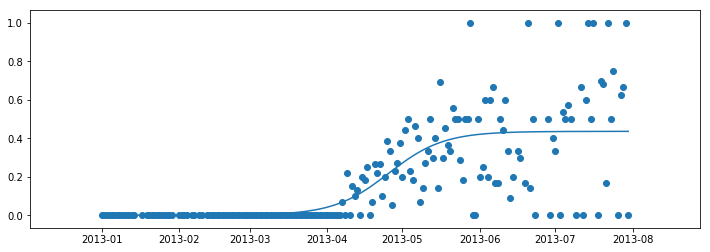

0.5359649493718337
115.47228557679347
2013-04-25
0.010904617181709975
0.425280070086689
75.40387108514524
155.54070006844165
80.13682898329641
---
423
113 2014
[0.752231153151076, 0.7172202509390418, 0.5883206442725694]
999999.9999883401 0.12916646418874078 0.29937000513905776


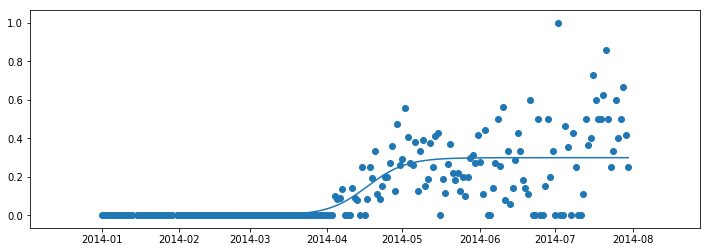

0.4965323092020515
106.95895908217396
2014-04-17
0.007484250128476444
0.2918857550105813
78.59585671547627
135.3220614488716
56.726204733395335
---
424
113 2015
[0.18636025908410025, 0.6878538866013364, 0.9482876113484338]
999999.9993943112 0.12607179453425216 0.3643809577655722


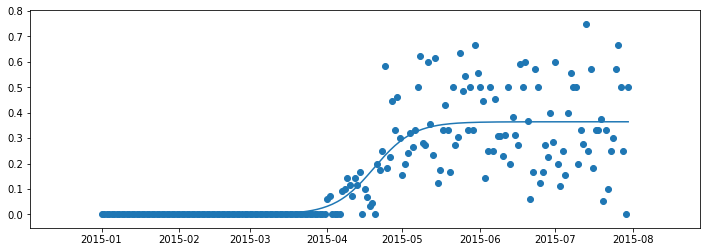

0.685620539467338
109.58446818653859
2015-04-20
0.009109523944139306
0.3552714338214329
80.52514005002743
138.64379632304968
58.11865627302225
---
425
113 2016
[0.8541112289401555, 0.10074526159368025, 0.5484750510548725]
999999.9999888241 0.12511422220886073 0.3480714283572934


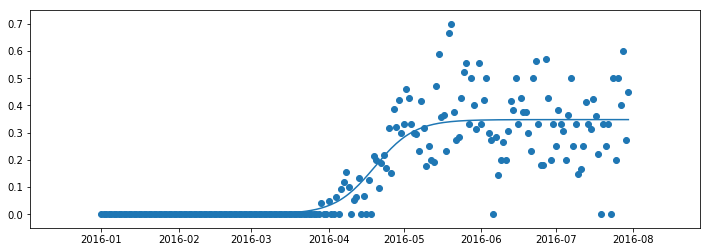

0.7462187772213109
110.4231822253591
2016-04-19
0.008701785708932335
0.33936964264836106
81.14144605300099
139.70491839771722
58.56347234471623
---
426
113 2017
[0.7221846143795985, 0.8097530763224039, 0.5296148822845435]
45731.689304889565 0.09555400916900932 0.34437690002985294


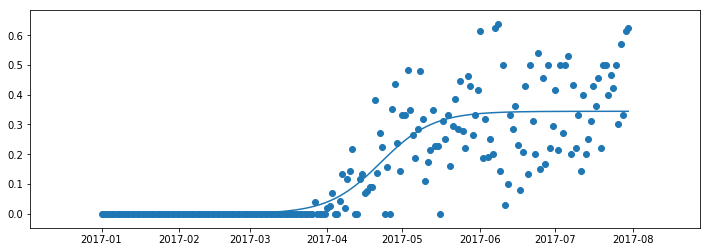

0.7039476573910091
112.29823688335672
2017-04-22
0.008609422500746323
0.33576747752910663
73.9580177968944
150.6384559698191
76.6804381729247
---
427
113 2018
[0.47195489124624734, 0.9527819691948909, 0.81061018452257]
999999.9999019982 0.12303585612015652 0.29564166297194916


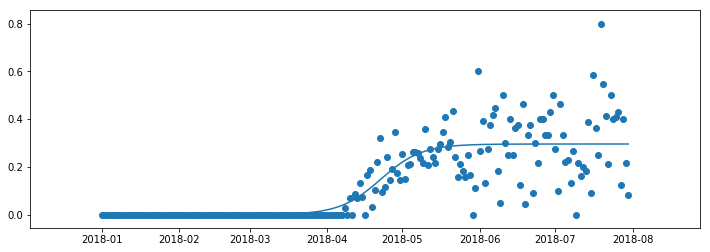

0.6818455232120519
112.28849047365573
2018-04-22
0.007391041574298729
0.2882506213976504
82.51211664526686
142.06486430204453
59.55274765677767
---
428
113 2019
[0.5006844914671262, 0.34541885717189846, 0.036862726629834586]
999999.9999972719 0.12958503109870273 0.1948689964730219


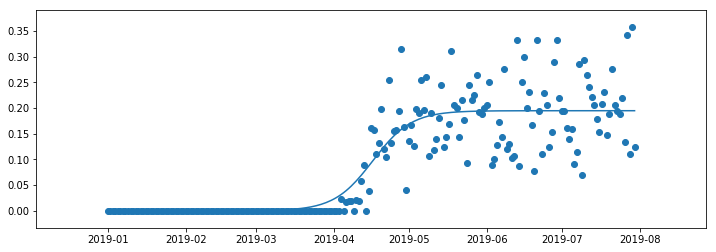

0.7809528343140844
106.61347565243476
2019-04-17
0.004871724911825547
0.18999727156119633
78.34198769531746
134.88496360955205
56.54297591423459
---
429
114 2010
[0.4494880513905596, 0.006378608709483258, 0.8782321812290462]
999999.9999875149 0.12278507125109113 0.445995302808157


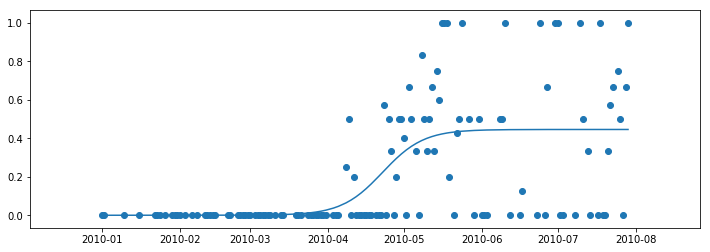

0.37359709458486046
112.51783638826547
2010-04-23
0.011149882570203926
0.4348454202379531
82.68064519881058
142.3550275777203
59.674382378909726
---
430
114 2011
[0.42580990375100325, 0.4406823111316095, 0.7519594557072515]
445.8126368694301 0.048592399488950805 0.4455754127499634


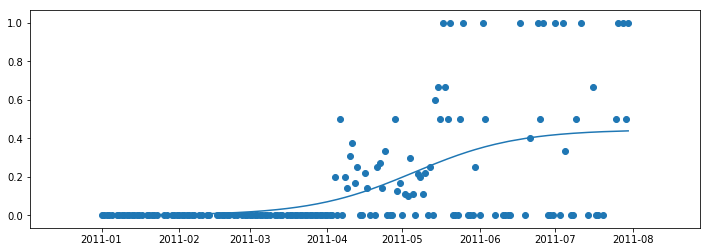

0.31237513738138
125.5319521407136
2011-05-06
0.011139385318749084
0.4344360274312143
50.138234508747594
200.9256697726797
150.7874352639321
---
431
114 2012
[0.865662410434444, 0.45785936297040297, 0.10391323284642207]
1045.1005523327508 0.058074177017612964 0.42602528548305696


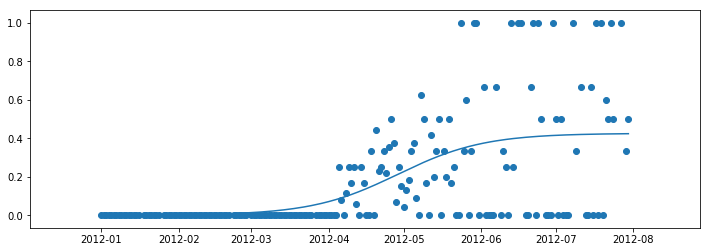

0.35489699801930275
119.70670509871266
2012-04-29
0.010650632137076425
0.4153746533459805
56.622528373857016
182.7908818235682
126.16835344971119
---
432
114 2013
[0.1395511835424168, 0.9318469585023602, 0.18513723948022842]
45191.202292975795 0.09905842898229256 0.31027439737483375


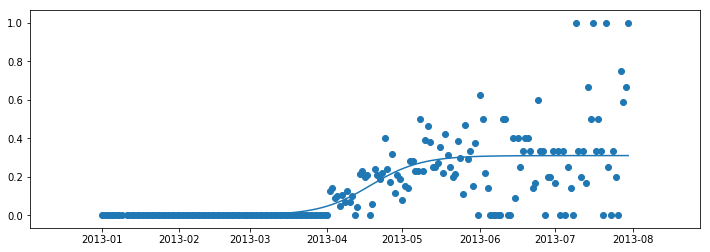

0.4540225145780078
108.2054078331456
2013-04-18
0.007756859934370844
0.3025175374404629
71.22156220013504
145.1892534661561
73.96769126602105
---
433
114 2014
[0.6195860895954404, 0.27513626973103755, 0.08090706505823464]
999999.9989891872 0.12314471564767311 0.3766194321420698


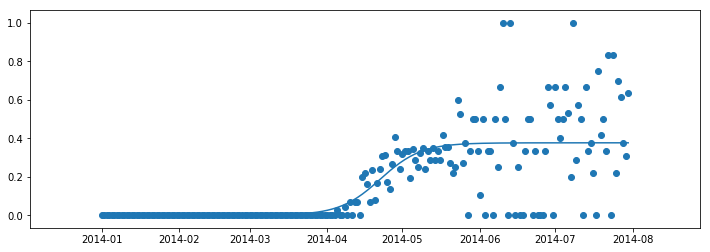

0.5490353995418349
112.18922780641877
2014-04-22
0.009415485803551745
0.36720394633851805
82.43917619550443
141.93927941733313
59.500103221828695
---
434
114 2015
[0.5768000255096933, 0.4987191989405113, 0.8164791774687034]
99031.02629090946 0.10393037769398689 0.36247583045433196


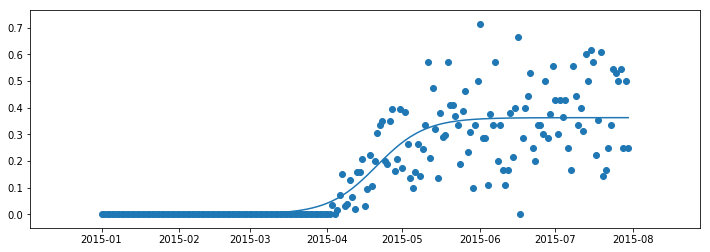

0.732282585689178
110.68167683144674
2015-04-21
0.0090618957613583
0.35341393469297366
75.43152449469054
145.93182916820297
70.50030467351243
---
435
114 2016
[0.8038577741841665, 0.881165518113729, 0.3281133086076813]
999999.9998873759 0.12416442765628231 0.3415274051230299


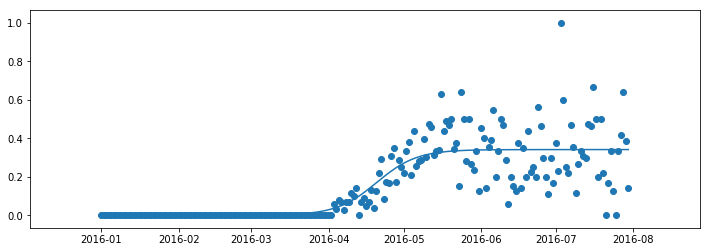

0.677837839265987
111.26786325707056
2016-04-20
0.008538185128075748
0.3329892199949542
81.76213673553183
140.7735897786093
59.01145304307748
---
436
114 2017
[0.5552593591982862, 0.32116557038924554, 0.23285403200371302]
999999.9999998576 0.12742380842627804 0.3592186618902213


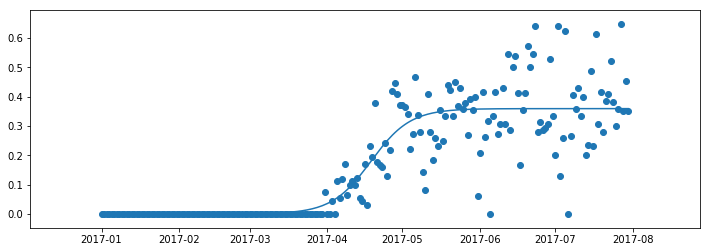

0.770390444483085
108.42173631905841
2017-04-18
0.008980466547255532
0.35023819534296574
79.67073843745588
137.1727342006609
57.50199576320502
---
437
114 2018
[0.9295823567753356, 0.7037765662868879, 0.5313778365423136]
523951.6834296325 0.1170956753785348 0.334549159379219


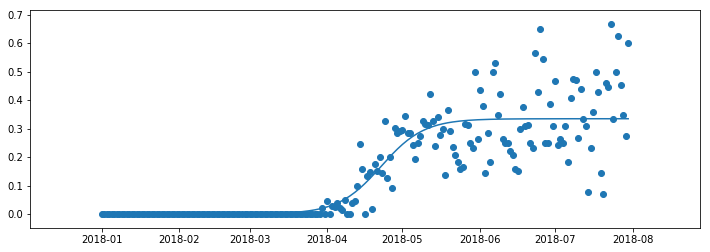

0.7654724529861341
112.46491135803772
2018-04-22
0.008363728984480475
0.3261854303947385
81.17800315851233
143.75181955756315
62.57381639905083
---
438
114 2019
[0.2756496574490187, 0.996225028150103, 0.9164509958350361]
999999.9999999948 0.12521976963955317 0.2753740190995448


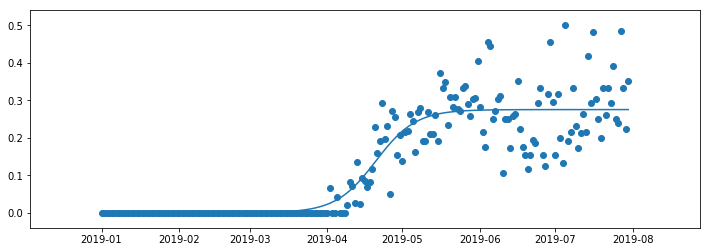

0.8253537227226725
110.3301068012855
2019-04-20
0.00688435047748862
0.26848966862205614
81.07305213112232
139.58716147144864
58.514109340326314
---
439
115 2010
[0.9011599110344509, 0.12804287538367465, 0.3219300197212325]
999999.99993685 0.13812954929658014 0.241541030551354


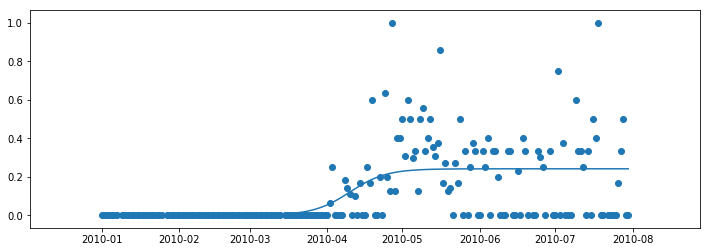

0.32046087515040367
100.0185016765502
2010-04-10
0.006038525763783851
0.23550250478757015
73.49585199886569
126.54115135423466
53.04529935536897
---
440
115 2011
[0.2498015864097024, 0.6350002271427871, 0.3629679808816142]
999999.9999830535 0.1341562813185968 0.23204825194316245


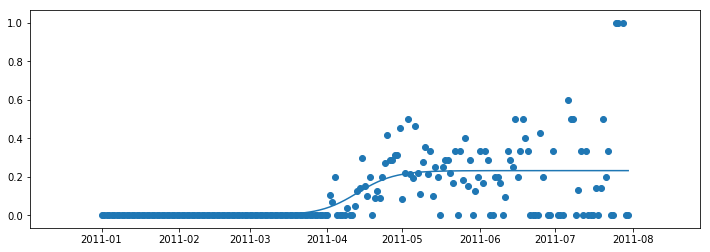

0.35754909316745187
102.98072085896597
2011-04-13
0.005801206298579061
0.2262470456445834
75.67255749813643
130.28888421979553
54.61632672165911
---
441
115 2012
[0.19405382849633646, 0.8727757830484422, 0.3795893689651977]
75.67527503879286 0.027172744665977914 0.614779464682957


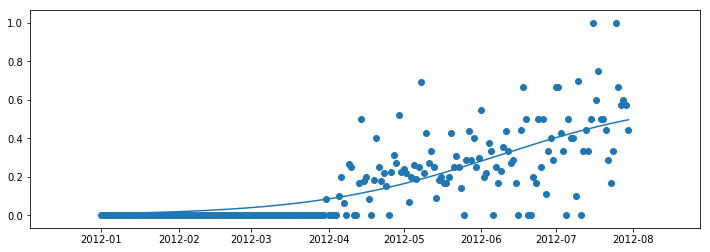

0.5975536199994058
159.2202606898163
2012-06-07
0.015369486617073925
0.599409978065883
24.39539514295571
294.0451262366771
269.6497310937214
---
442
115 2013
[0.4437986048197342, 0.3365709182340352, 0.6497423313064034]
999999.9732748234 0.1328982104121661 0.26629924584972764


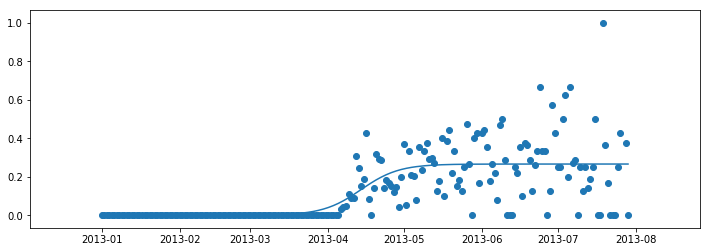

0.5070667075009526
103.95557990128032
2013-04-14
0.006657481146243191
0.25964176470348443
76.38890586731405
131.52225393524657
55.133348067932516
---
443
115 2014
[0.39039878601513367, 0.5413214567696583, 0.4235920599165549]
108573.99408502734 0.11482961497880134 0.24276738240042373


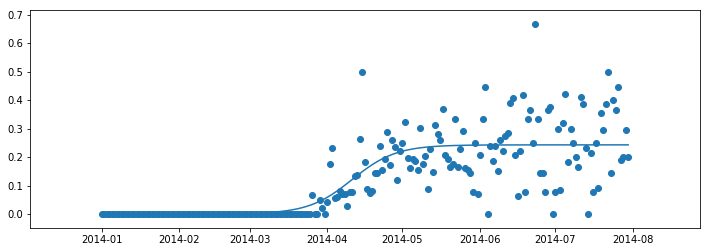

0.6332889468697402
100.97732361811995
2014-04-11
0.0060691845600105935
0.23669819784041313
69.07299609071359
132.8816511455263
63.808655054812704
---
444
115 2015
[0.9374700676943155, 0.4731531897113468, 0.10090780251824327]
143577.50050923592 0.10533253436229184 0.29909786279690515


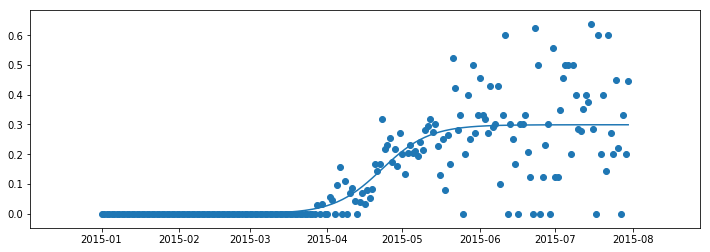

0.6380617791380409
112.73468651942797
2015-04-23
0.007477446569922629
0.29162041622698254
77.95377416115501
147.51559887770097
69.56182471654596
---
445
115 2016
[0.5379275901877584, 0.27648205368752155, 0.29253970282466424]
999999.9989674636 0.1244944013432811 0.2607305230645977


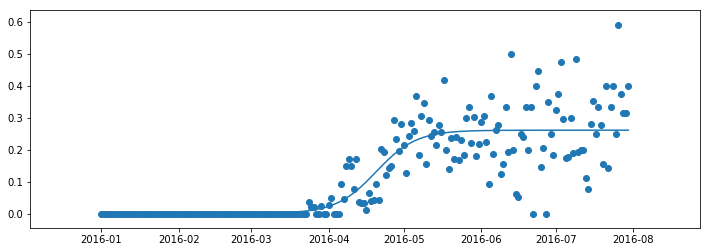

0.7231394906048823
110.97294663747024
2016-04-20
0.006518263076614943
0.25421225998798275
81.54542534655104
140.40046792838942
58.855042581838376
---
446
115 2017
[0.7826389275450986, 0.7259169145748163, 0.26148995375997297]
359061.3172965314 0.11593325032631953 0.24740287152642507


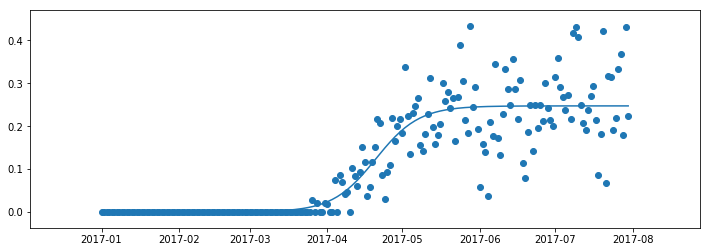

0.7891039855524712
110.33287186506743
2017-04-20
0.006185071788160627
0.24121779973826443
78.73225999730948
141.93348373282535
63.20122373551587
---
447
115 2018
[0.02212244481226966, 0.07810771312194875, 0.6278047320901174]
58134.18505977208 0.10379146956941035 0.2054066117451655


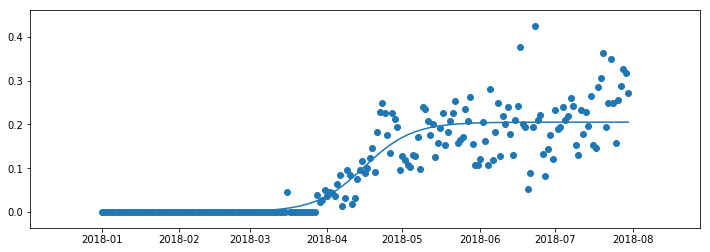

0.7958373352798309
105.69759921939074
2018-04-16
0.005135165293629138
0.20027144645153636
70.40027024497395
140.99492819380748
70.59465794883353
---
448
115 2019
[0.7987302703645615, 0.8661218319143489, 0.9821645760460747]
999999.9999993988 0.1274079833631353 0.21683488202803772


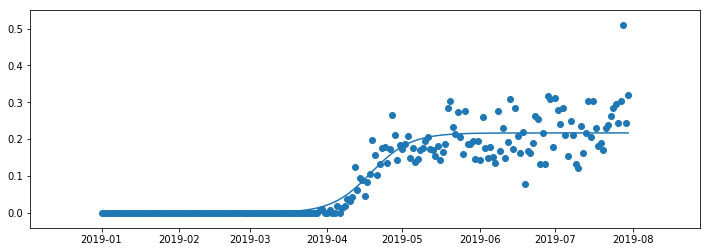

0.8462935052863267
108.4352031425458
2019-04-18
0.005420872050700944
0.21141400997733678
79.680634163239
137.18977212185263
57.50913795861362
---
449
116 2010
[0.5505344891333547, 0.8808494952349186, 0.5694025105100076]
999999.9963258305 0.11636570960454735 0.43256823345451734


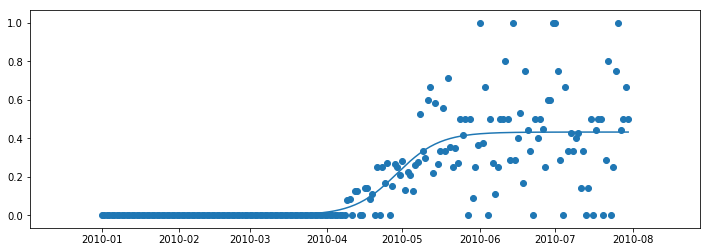

0.6043628060829933
118.72492851408025
2010-04-29
0.010814205836362934
0.4217540276181544
87.24175655062339
150.20810047753704
62.96634392691365
---
450
116 2011
[0.43857607136209775, 0.8847393442763808, 0.010780192743997774]
225.48749399363152 0.03933812803438625 0.5491320048773186


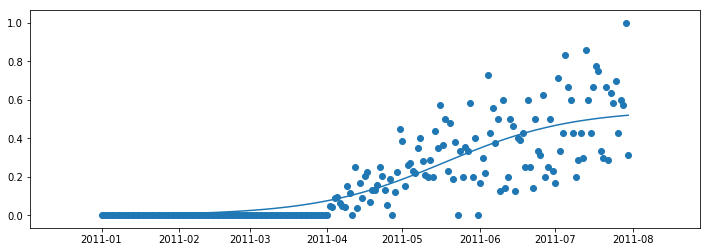

0.7082840585306593
137.73570246302327
2011-05-18
0.013728300121932966
0.5354037047553857
44.60565715615831
230.86574776988834
186.26009061373003
---
451
116 2012
[0.3160245824324124, 0.4786074662357298, 0.5947059334907986]
855.6666875295103 0.05895288754391531 0.36705818757922515


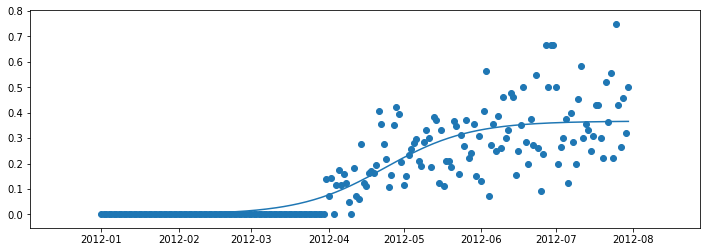

0.7303180729613521
114.53011375490946
2012-04-24
0.00917645468948063
0.3578817328897445
52.38622566460043
176.6740018452184
124.28777618061798
---
452
116 2013
[0.5396476143581119, 0.8332413938310097, 0.1155472239891574]
66474.61494653215 0.10107434559767145 0.340615105188369


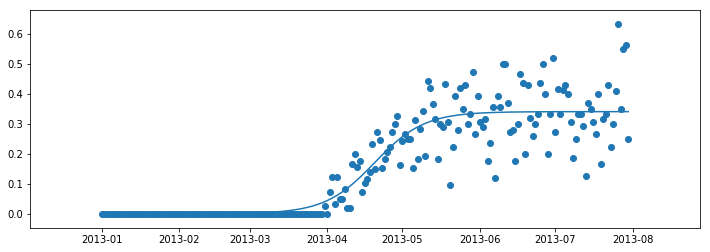

0.8330324059979508
109.86541993396735
2013-04-20
0.008515377629709225
0.3320997275586598
73.6192130011762
146.1116268667585
72.49241386558231
---
453
116 2014
[0.5032727832495145, 0.00023982282434587, 0.4147639335436071]
12784.73252215022 0.0812111360767424 0.3400617916383181


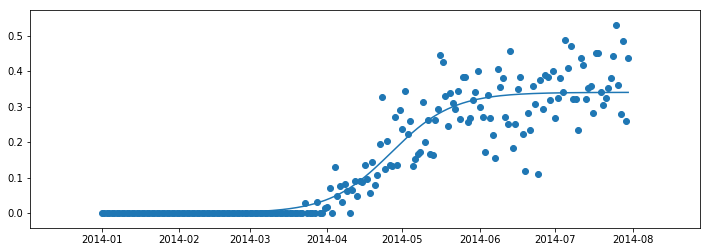

0.8668615783263095
116.43731910543256
2014-04-26
0.008501544790957953
0.3315602468473602
71.32575161464317
161.54888659622202
90.22313498157885
---
454
116 2015
[0.9966552503636867, 0.9215674012288589, 0.018088237673551055]
4645.008874987256 0.07078294825235372 0.38407252068225345


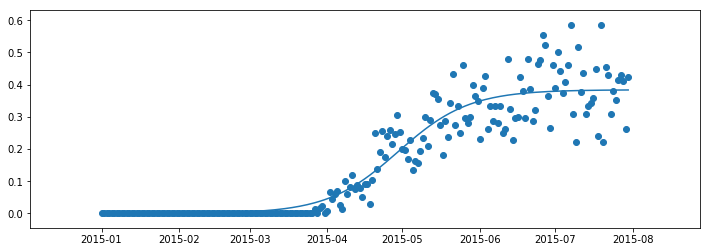

0.8900436171644597
119.28789023872312
2015-04-29
0.009601813017056336
0.3744707076651971
67.53020372546288
171.0455767519833
103.51537302652042
---
455
116 2016
[0.3851919476930086, 0.22746364515818962, 0.8650214311612345]
4431.799826620366 0.07110347323890018 0.36186487816555696


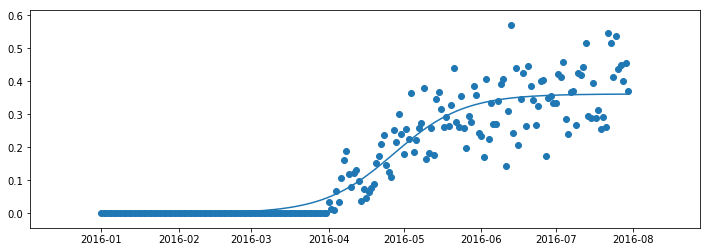

0.8720671496748642
118.0893236216721
2016-04-27
0.009046621954138924
0.35281825621141805
66.56495386521217
169.6136933781321
103.04873951291992
---
456
116 2017
[0.37260363285351095, 0.9675962013809929, 0.1787593999737488]
44202.11956030324 0.0930179701852385 0.35199748825572996


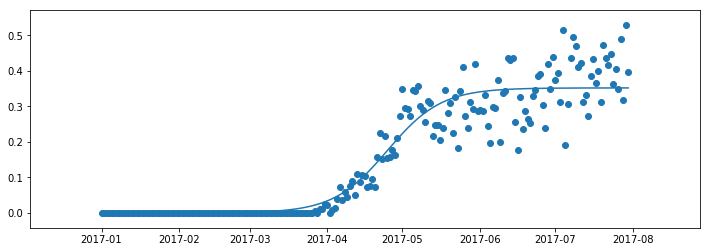

0.900288289083297
114.99421025278987
2017-04-25
0.008799937206393249
0.3431975510493367
75.60868465129661
154.37973585428307
78.77105120298646
---
457
116 2018
[0.544588367212968, 0.1320549666677141, 0.8408142806268128]
17823.992977896058 0.08718654836289193 0.3310894543953899


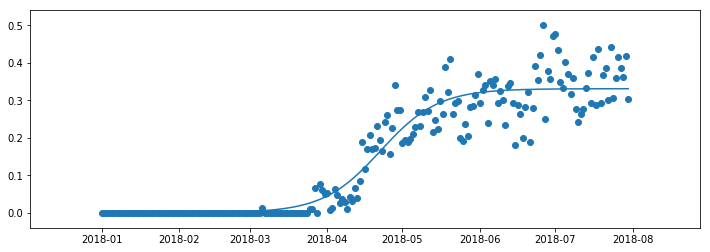

0.9069892181836986
112.26847412305602
2018-04-22
0.008277236359884747
0.32281221803550514
70.24867043865052
154.2882778074615
84.03960736881098
---
458
116 2019
[0.7359871317925427, 0.5335587156662427, 0.7941311981257695]
999999.9999998908 0.128396095902565 0.3118168493991988


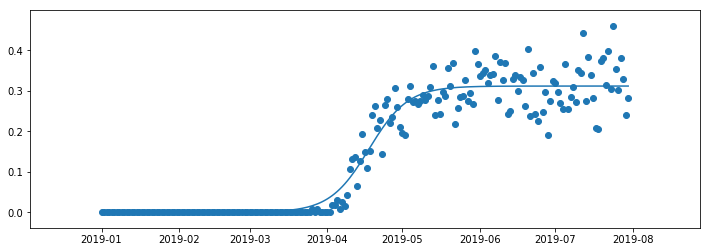

0.9352713640887604
107.60070593149685
2019-04-18
0.00779542123497997
0.30402142816421884
79.06742678171813
136.1339850812756
57.06655829955747
---
459
117 2010
[0.11645014524694819, 0.7247691102793975, 0.060178883329769284]
999999.9987462952 0.13470735308473775 0.2651606847126842


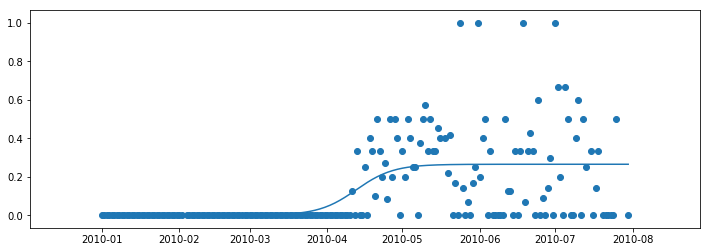

0.33732946007382514
102.55943896410697
2010-04-13
0.006629017117817106
0.2585316675948671
75.36299005292483
129.75588787528915
54.39289782236432
---
460
117 2011
[0.2775922900378588, 0.08825394575967671, 0.09516643956943249]
999999.9982649577 0.13910856193536483 0.24041230822630513


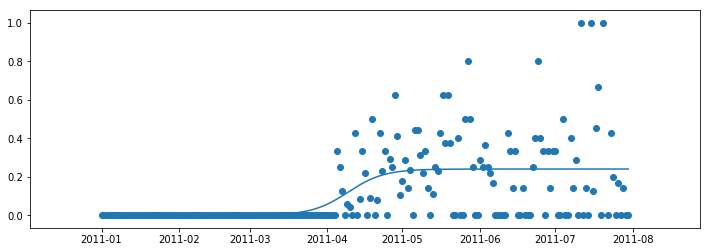

0.30090339055598925
99.31459547866254
2011-04-09
0.006010307705657629
0.2344020005206475
72.97860583747944
125.65058511984559
52.67197928236615
---
461
117 2012
[0.04402192945148764, 0.36505821616943823, 0.8273173905421805]
999999.9999824717 0.13539357264519106 0.3396014624027048


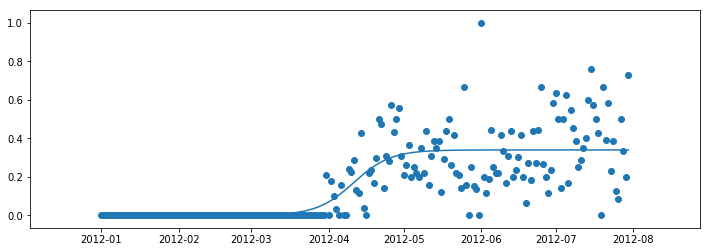

0.5937424367228914
102.03963369924007
2012-04-11
0.00849003656006762
0.33111142584263714
74.98102541707085
129.09824198140925
54.11721656433839
---
462
117 2013
[0.00539634545537182, 0.032206734374744195, 0.360057572797975]
999999.9996027531 0.13518144869948223 0.3082159234082079


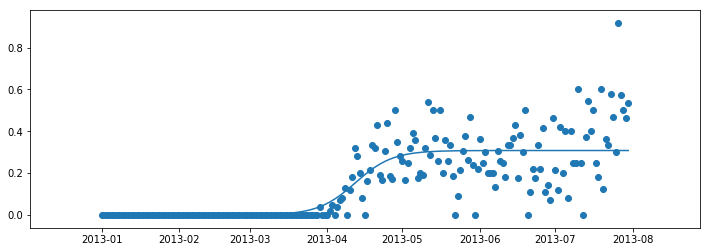

0.6354458146202275
102.19975218848164
2013-04-12
0.007705398085205198
0.3005105253230027
75.0986840953737
129.30082028158952
54.202136186215824
---
463
117 2014
[0.8298730020442022, 0.7630335744814316, 0.01765760341477618]
999999.9999748465 0.12608822234732525 0.3095367094293785


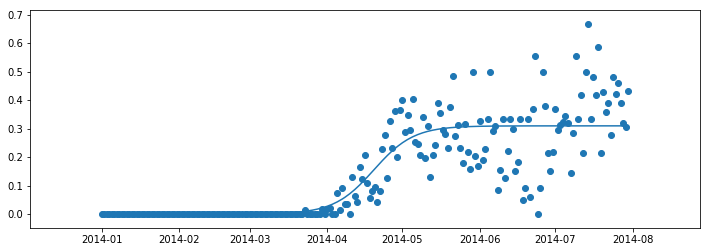

0.7297352632731195
109.57019062321797
2014-04-20
0.007738417735734463
0.301798291693644
80.51464857554026
138.62573267089564
58.11108409535538
---
464
117 2015
[0.6608988922059443, 0.2696332259236014, 0.20268856456147277]
271756.8366889764 0.110280391682384 0.3484750224539735


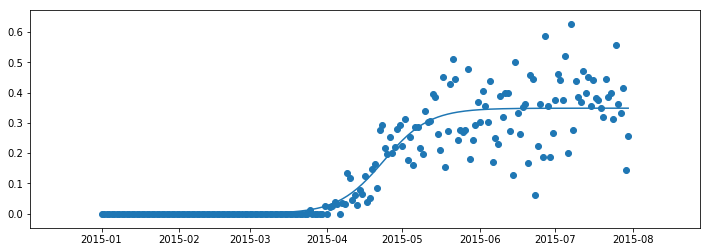

0.8334444626075269
113.46226443150059
2015-04-23
0.008711875561349338
0.33976314689262416
80.24183793282631
146.68269093017489
66.44085299734857
---
465
117 2016
[0.15872143603244482, 0.5502065833893774, 0.48253322434233104]
999999.9999072212 0.12183943432828347 0.3510054827036968


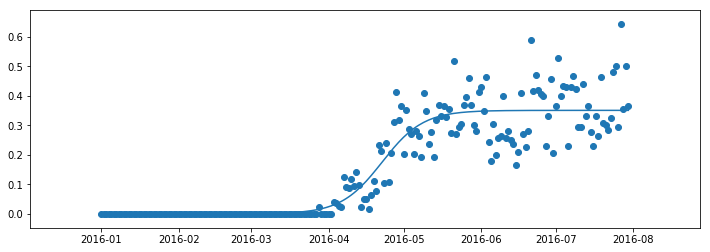

0.8551686910365447
113.39112524642114
2016-04-22
0.00877513706759242
0.3422303456361044
83.32235755780428
143.45989293503806
60.137535377233775
---
466
117 2017
[0.09272905472303916, 0.9248287475341188, 0.7842538971539335]
999999.9999963584 0.12689355526872753 0.3313169634669629


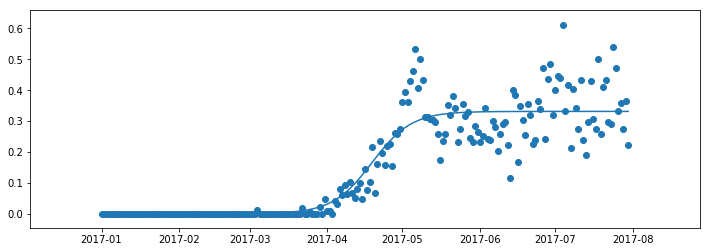

0.8486238047077758
108.87480084156343
2017-04-19
0.008282924086674073
0.3230340393802888
80.00366047221075
137.74594121091607
57.74228073870532
---
467
117 2018
[0.5592154939624511, 0.7820545116361286, 0.7275589481722494]
706997.8200017852 0.12867898199975727 0.29774154416004206


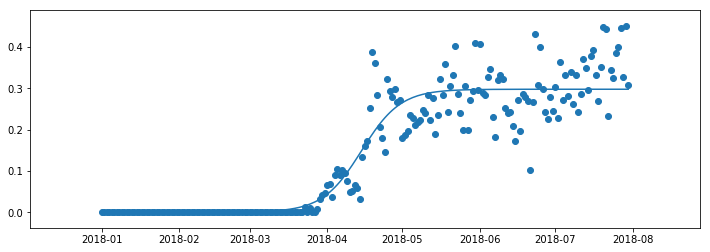

0.875428579354254
104.66964108754516
2018-04-15
0.007443538604001052
0.290298005556041
76.19908910465368
133.14019307043668
56.941103965783
---
468
117 2019
[0.5380214642992309, 0.7109027829287469, 0.16730573163296758]
999999.9999916657 0.13089599704477714 0.28658621909308235


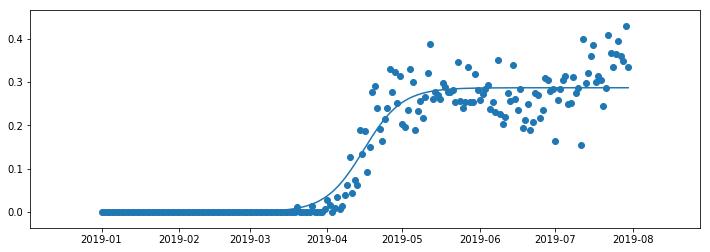

0.9149456891275106
105.54570704885577
2019-04-16
0.007164655477327059
0.27942156361575526
77.5573672306686
133.53404686704292
55.976679636374314
---
469
118 2010
[0.3680479232632643, 0.4644381548191502, 0.19781066683165183]
999999.999997146 0.12731751856400997 0.294082503279329


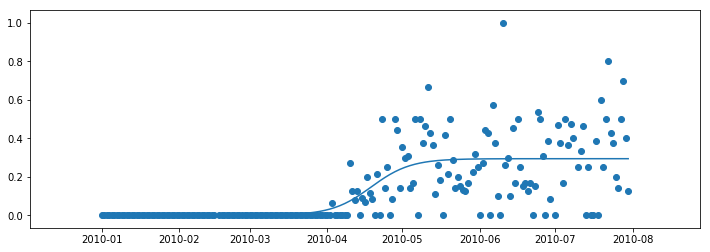

0.49461082652318
108.51225121086188
2010-04-19
0.007352062581983225
0.28673044069734577
79.73725082246081
137.2872515992629
57.550000776802094
---
470
118 2011
[0.22092145742275404, 0.040391449133767465, 0.8730449709976605]
999999.9981272129 0.14328849220965975 0.24648043004154213


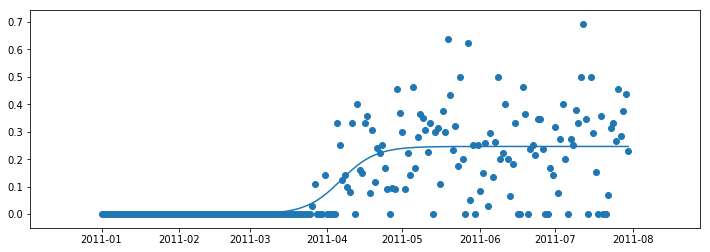

0.5002698211867094
96.41744667029248
2011-04-06
0.006162010751038553
0.24031841929050357
70.84971551733203
121.98517782325287
51.13546230592084
---
471
118 2012
[0.21590406414780883, 0.6306438624993727, 0.4348677959812195]
999999.9988975645 0.13590169690315554 0.24354227000773096


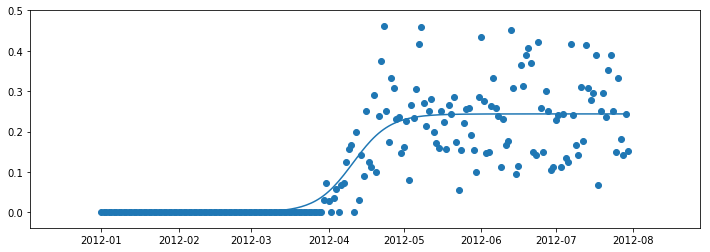

0.7231471464560469
101.65811665108835
2012-04-11
0.006088556750193274
0.23745371325753767
74.70067807885091
128.61555522332574
53.91487714447483
---
472
118 2013
[0.7555444469828204, 0.9706133808093975, 0.8181262072749879]
999999.9999630203 0.13753664096965285 0.21413682776934756


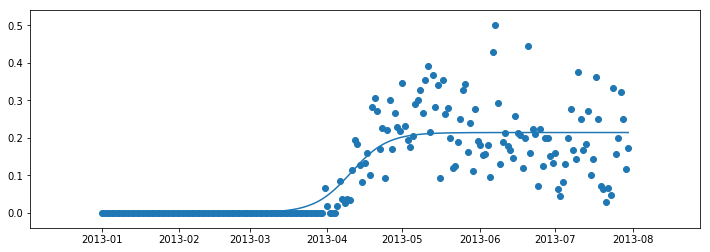

0.6851615524194021
100.44967261470096
2013-04-10
0.005353420694233689
0.20878340707511386
73.81268613385471
127.08665909554716
53.27397296169245
---
473
118 2014
[0.5392860667229242, 0.9685008905770729, 0.6052429055842815]
999999.9999982624 0.13107338270610575 0.2658307898277326


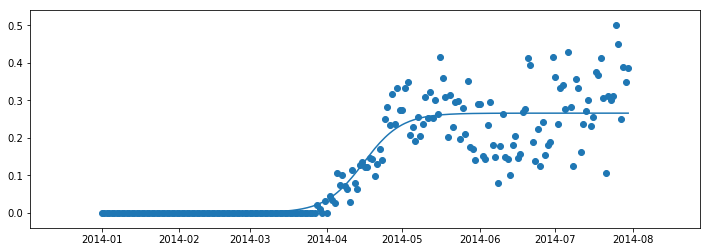

0.8012119439942145
105.40286878030632
2014-04-15
0.006645769745693315
0.2591850200820393
77.45240644773551
133.35333111287716
55.900924665141645
---
474
118 2015
[0.2899314302020274, 0.18446478603955685, 0.4269340506889412]
999999.9989722682 0.13173168880141345 0.19334568729177792


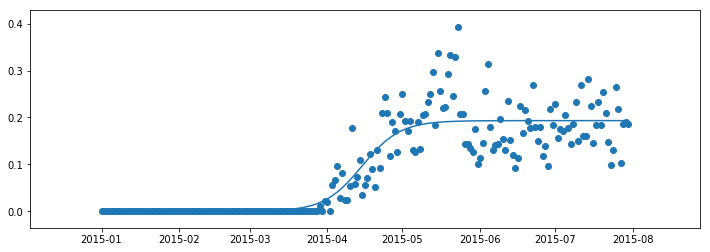

0.8121670298504797
104.87613635443127
2015-04-15
0.004833642182294449
0.18851204510948347
77.06535157315896
132.68692113570353
55.621569562544565
---
475
118 2016
[0.5377765621641047, 0.6585267469148246, 0.6638696092537447]
999999.9997762137 0.1270758975016209 0.20502323217421567


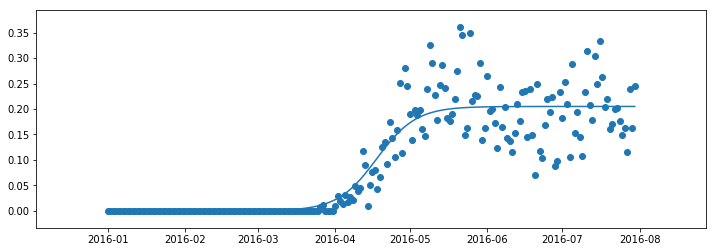

0.8272998933749489
108.71857550771394
2016-04-18
0.005125580804355392
0.19989765136986026
79.88886257113666
137.54828844429113
57.659425873154476
---
476
118 2017
[0.013419785239696114, 0.6929640941445726, 0.9213251355408459]
999999.999991799 0.12942201673561363 0.19705074717517146


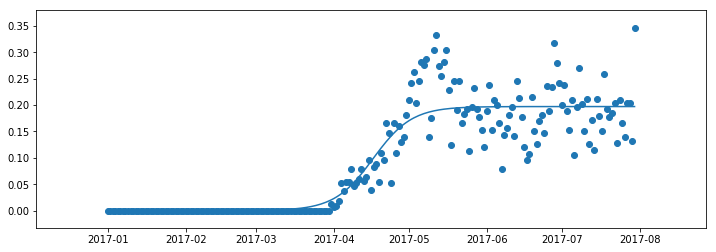

0.8418638974125652
106.7477613656626
2017-04-17
0.0049262686793792865
0.19212447849579217
78.44066386760971
135.0548588637155
56.614194996105795
---
477
118 2018
[0.915698489979835, 0.43558451902692485, 0.9936670134690065]
999999.9998680853 0.12998807267244605 0.1978237040034503


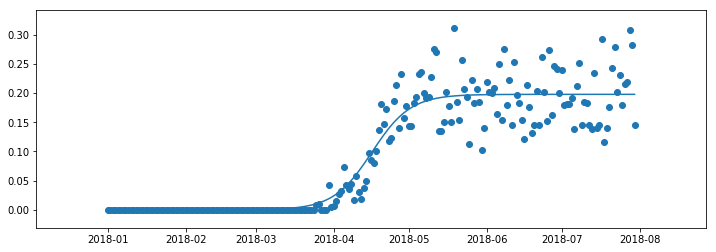

0.8839993819937588
106.28290945312918
2018-04-16
0.004945592600086258
0.19287811140336406
78.09908019241408
134.4667387138443
56.36765852143023
---
478
118 2019
[0.09924103543860041, 0.8858615703706072, 0.7792631973807789]
999999.9999946696 0.13045236942504904 0.23968642415883007


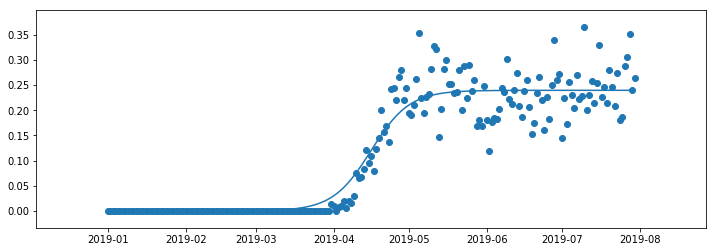

0.9080787201502476
105.90463491655166
2019-04-16
0.005992160603970752
0.2336942635548593
77.8211155272428
133.98815430586046
56.167038778617666
---
479
119 2010
[0.5252665250934808, 0.6188186102773116, 0.030768127309756865]
999999.9999927356 0.12587091210506918 0.3147171863147543


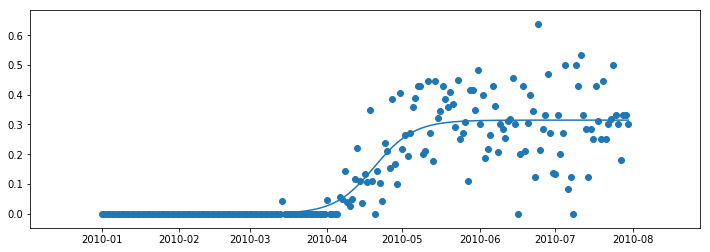

0.7551244223289941
109.75935843242866
2010-04-20
0.007867929657868858
0.30684925665688545
80.65365335045121
138.86506351440605
58.21141016395484
---
480
119 2011
[0.008990777366434388, 0.9210320579886736, 0.13305804495257667]
69521.57232312822 0.10754497081475096 0.35371630233547074


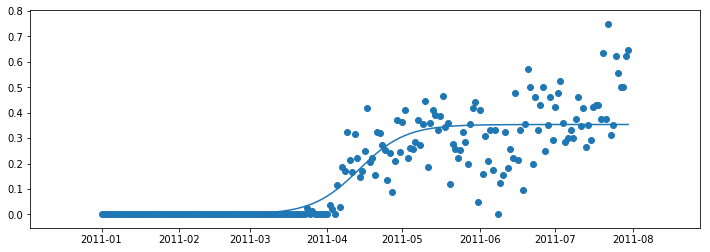

0.7500266365216042
103.6719085240588
2011-04-14
0.00884290755838677
0.34487339477708395
69.60651598757072
137.73730106054683
68.13078507297611
---
481
119 2012
[0.14478339814083296, 0.457740082165244, 0.8928133116182518]
999999.9999985221 0.1307249150383152 0.3706929387363661


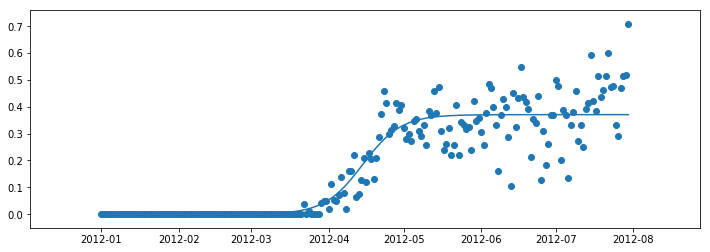

0.8431020739759993
105.68383658091112
2012-04-15
0.009267323468409153
0.36142561526795697
77.65886792779811
133.70880523402417
56.049937306226056
---
482
119 2013
[0.6184390511865916, 0.28581882122099656, 0.43392494779421587]
999999.9999995827 0.13268997524580936 0.3108653700757829


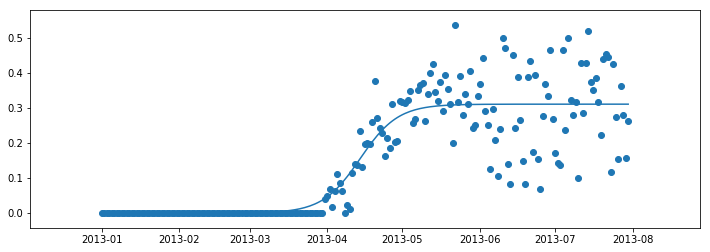

0.7848306031499451
104.11872134553118
2013-04-14
0.007771634251894573
0.3030937358238883
76.50878593524217
131.7286567558202
55.21987082057802
---
483
119 2014
[0.8670992745672753, 0.16406822741238847, 0.14038515307148447]
328224.6057405073 0.1160316059940909 0.2983039176009857


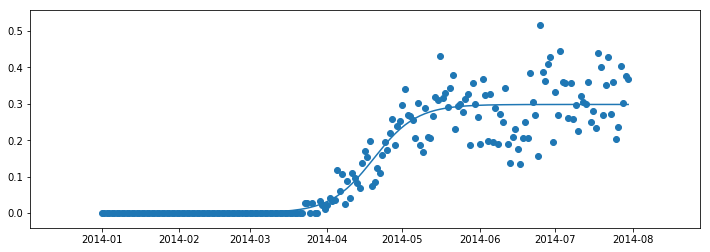

0.8702570586649805
109.46546260216175
2014-04-19
0.007457597940024642
0.29084631966096103
77.8916373952934
141.03928780903007
63.14765041373667
---
484
119 2015
[0.28696322153957665, 0.5848979476003751, 0.7668447966170481]
999999.999977776 0.13032430961226701 0.2719850721260683


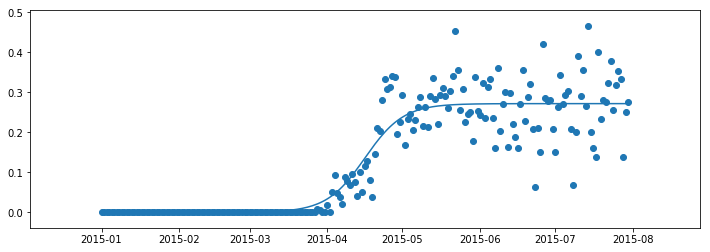

0.8471660268668711
106.00869936733307
2015-04-16
0.006799626803151708
0.2651854453229166
77.8975844339085
134.1198143007576
56.222229866849105
---
485
119 2016
[0.8457822197945234, 0.8497551281787811, 0.8992786306322228]
999999.9999811158 0.1261942430026993 0.29920958672124515


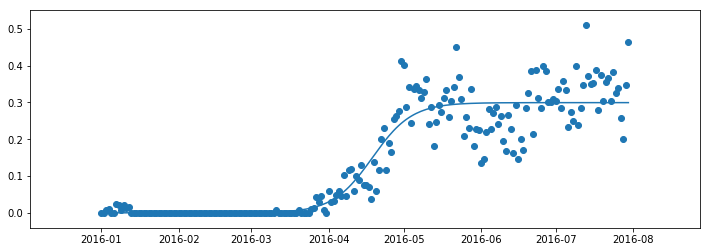

0.8691755137118107
109.47813647608216
2016-04-18
0.007480239668031129
0.291729347053214
80.44700511099063
138.50926784117374
58.06226273018311
---
486
119 2017
[0.31029923162683115, 0.14707443893858896, 0.8671085556141781]
999999.9999999597 0.12548405118064843 0.2996507177399105


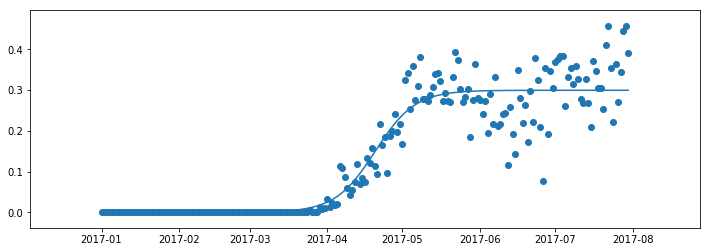

0.88667073948708
110.09774093183565
2017-04-20
0.007491267943497762
0.29215944979641273
80.90230444679949
139.29317741687183
58.39087297007234
---
487
119 2018
[0.6673433175212706, 0.3209904222251383, 0.4028397119933703]
999999.9999999778 0.13184621296250107 0.2815948997666365


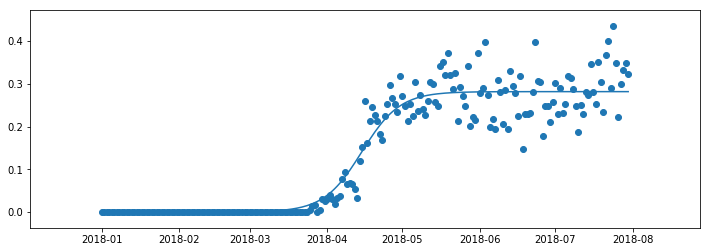

0.9169241650961574
104.78503892935916
2018-04-15
0.007039872494165912
0.27455502727247055
76.99841113162623
132.57166672709204
55.57325559546581
---
488
119 2019
[0.6182801718509215, 0.32537845112017905, 0.16968975026833522]
999999.9999973809 0.13098685495740037 0.28045850735729083


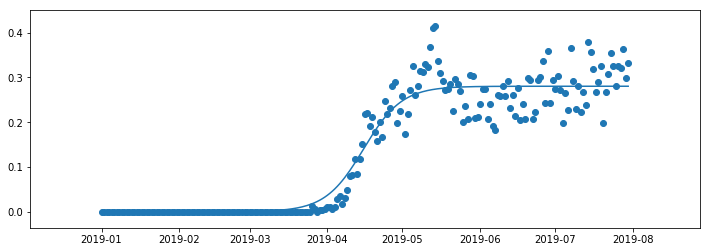

0.9270236285817105
105.47249617112148
2019-04-15
0.0070114626839322715
0.27344704467335856
77.50357022568129
133.4414221165617
55.937851890880424
---
489
120 2010
[0.7043837010654805, 0.8522273813368133, 0.9176729882067624]
999999.9999911179 0.13043446489284125 0.40446064139513915


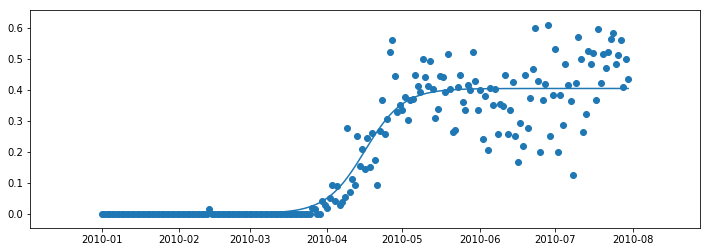

0.8608010981951928
105.91917227786044
2010-04-16
0.01011151603487848
0.3943491253602607
77.83179790836805
134.00654664735288
56.17474873898483
---
490
120 2011
[0.16320611689557962, 0.8956486161356011, 0.48534057399775454]
101739.76719229374 0.11008795656019914 0.3898195320750425


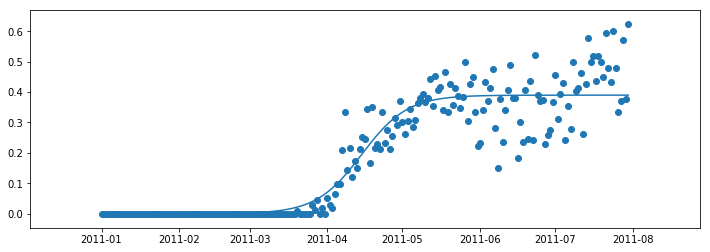

0.876355429027493
104.73601191614276
2011-04-15
0.009745488301876062
0.38007404377316645
71.45751569729151
138.014508134994
66.55699243770249
---
491
120 2012
[0.6353397651775318, 0.4379163044083957, 0.6773793273588098]
999999.999999999 0.13381411495999007 0.4019225492713868


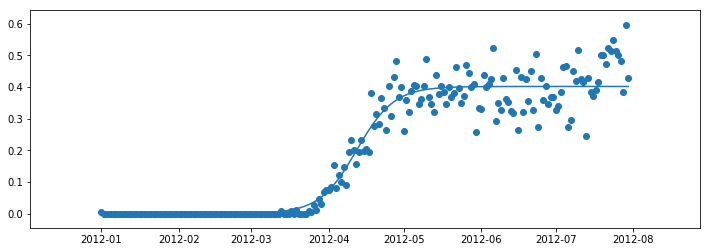

0.9339663045845664
103.24404538411407
2012-04-12
0.01004806373178467
0.39187448553960214
75.86605430129715
130.62203646693095
54.755982165633796
---
492
120 2013
[0.22214369567512482, 0.8613027096373719, 0.5314880353645428]
105897.24655364764 0.10815039869399004 0.40957416549857717


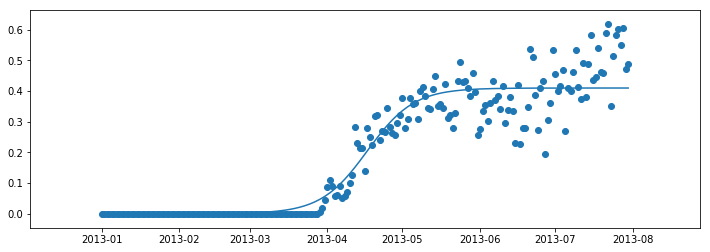

0.902143149757798
106.98272655981197
2013-04-17
0.01023935413746443
0.3993348113611127
73.10803270412272
140.85742041550114
67.74938771137842
---
493
120 2014
[0.2082518469336878, 0.9593757060381493, 0.7219614536521886]
185996.16532087934 0.1120587045669651 0.3558314177099877


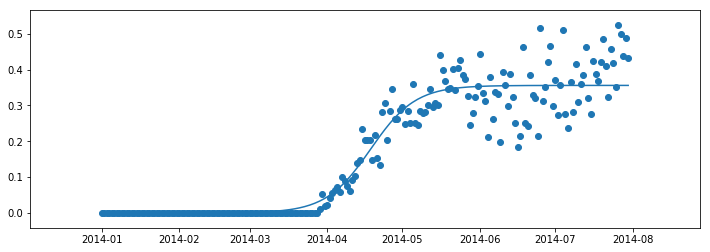

0.9082158291169764
108.27790114847849
2014-04-18
0.008895785442749693
0.346935632267238
75.58466539952924
140.9711368974277
65.38647149789846
---
494
120 2015
[0.8917394017464572, 0.0394888790280169, 0.9088579809449814]
738701.8347989719 0.12312506978728988 0.35431051983470224


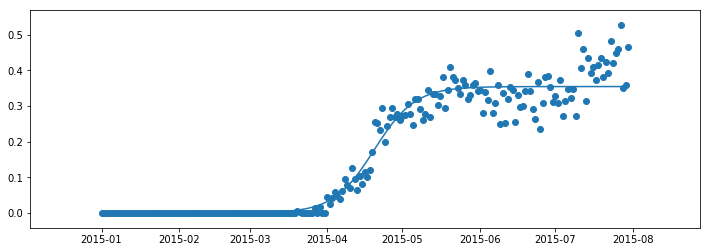

0.9461976606887162
109.74734609839943
2015-04-20
0.008857762995867557
0.3454527568388347
79.99254756339114
139.50214463340774
59.509597070016596
---
495
120 2016
[0.04887880711880055, 0.4709429131794799, 0.5618821179922681]
653066.467642066 0.11806510013982276 0.36293282296689383


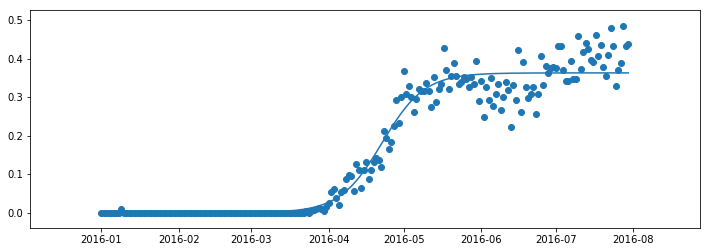

0.9545446156879014
113.40721496311059
2016-04-22
0.009073320574172346
0.35385950239272146
82.37720150620467
144.43722842001648
62.06002691381181
---
496
120 2017
[0.6121237031553584, 0.3925422951626354, 0.8505255937200088]
999999.9994441762 0.12586782286407108 0.34196401533620346


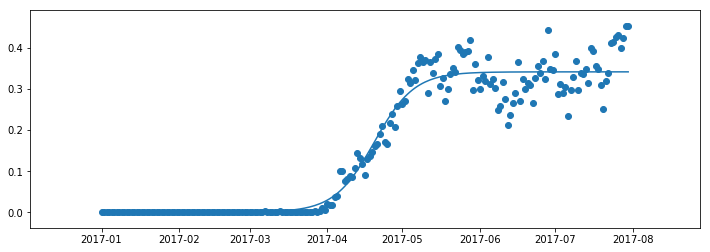

0.9511600207837189
109.76205231044861
2017-04-20
0.008549100383405088
0.33341491495279835
80.65563287165328
138.8684717492439
58.21283887759061
---
497
120 2018
[0.8093061809991909, 0.33962615173081945, 0.8905820484595128]
999999.9999995057 0.1296965742878588 0.30708574032855795


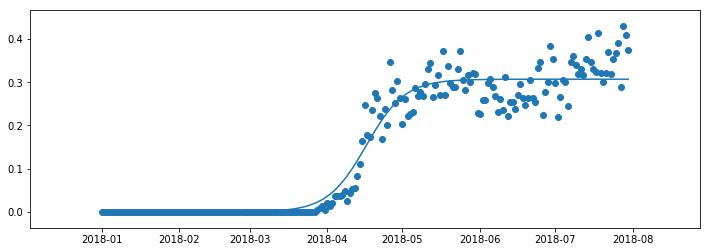

0.9411357933072769
106.52178466410798
2018-04-17
0.007677143508213949
0.299408596820344
78.27461108804692
134.768958240169
56.49434715212209
---
498
120 2019
[0.2571304812084003, 0.7955587790866365, 0.030440524100874722]
999999.999994918 0.12936020447272967 0.28900402338232295


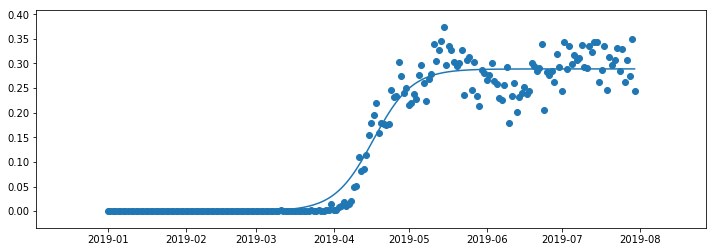

0.955632489430734
106.79876871152928
2019-04-17
0.007225100584558074
0.2817789227977649
78.47814521636498
135.11939220669362
56.64124699032864
---
499
121 2010
[0.26076527101250435, 0.16447001554974217, 0.3270348824955521]
11609.662466966898 0.07891813659549601 0.4190984336606347


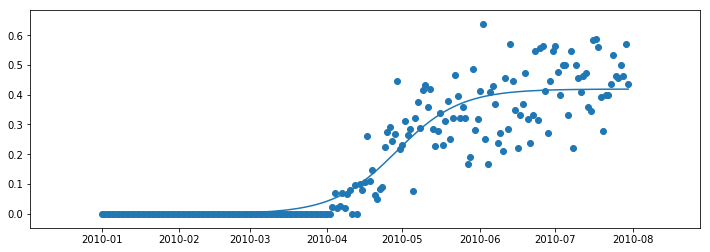

0.8595756049805842
118.59875822499866
2010-04-29
0.010477460841515868
0.40862097281911886
72.17645526430341
165.02106118569395
92.84460592139054
---
500
121 2011
[0.5716838057214871, 0.7332644286459343, 0.8671921995377995]
26167.41166424106 0.09180019475654494 0.4130022458601334


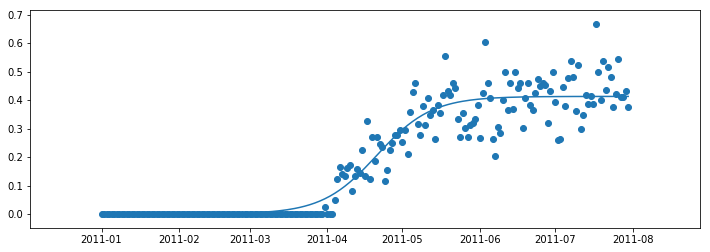

0.908222287844242
110.80880724620397
2011-04-21
0.010325056146503336
0.40267718971363003
70.90081297837644
150.71680151403146
79.81598853565502
---
501
121 2012
[0.35712590355834595, 0.8420477919847005, 0.7053481162480532]
1412.3796627390784 0.059218321519582034 0.5536371046793531


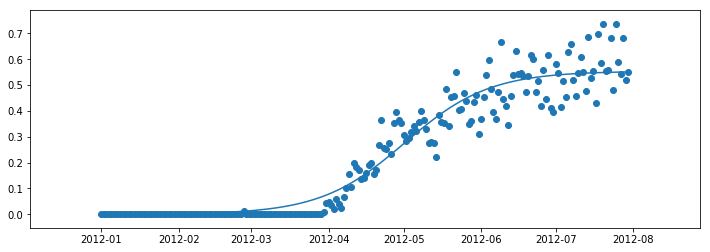

0.9363534249235427
122.47951442649268
2012-05-01
0.013840927616983828
0.5397961770623693
60.61417356372951
184.34485528925578
123.73068172552627
---
502
121 2013
[0.42952828579788027, 0.24762194093422785, 0.6163888991069467]
7855.797940588224 0.07850491216016464 0.5088418366667892


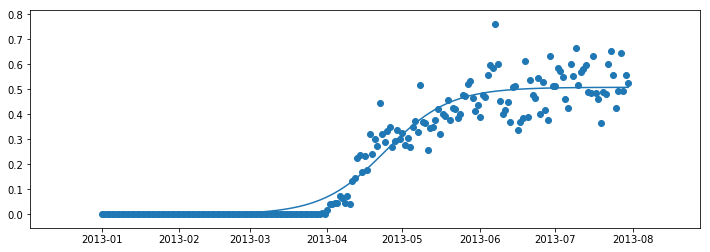

0.9346682487071158
114.24771880530896
2013-04-24
0.01272104591666973
0.49612079075011944
67.58106387478311
160.9143737358349
93.33330986105177
---
503
121 2014
[0.21887255905981817, 0.47585736257784195, 0.8300873399682756]
1207.9617266665944 0.05560186303473848 0.5308775433286921


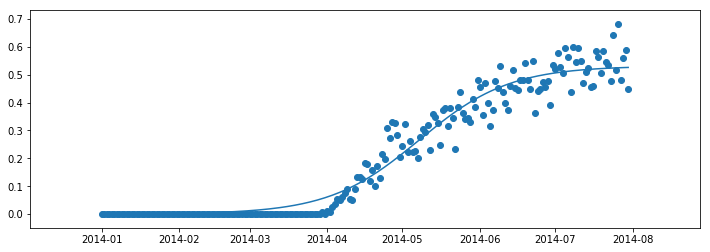

0.9582594336809478
127.6340271248826
2014-05-08
0.013271938583217303
0.5176056047454748
61.74483841477129
193.523215834994
131.7783774202227
---
504
121 2015
[0.8483902240567686, 0.221973395173659, 0.5528952985521028]
6790.830267371768 0.07331363181924379 0.4773792729242374


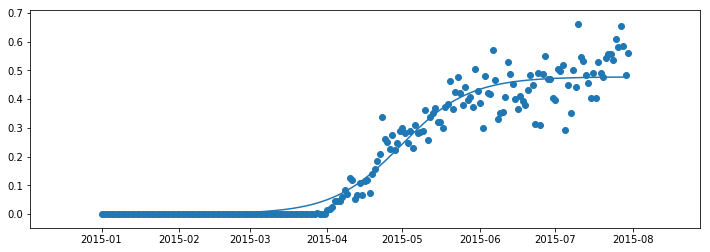

0.9451492366870686
120.35044877867915
2015-04-30
0.011934481823105934
0.4654447911011314
70.37936488581965
170.32153267153862
99.94216778571896
---
505
121 2016
[0.11619772262256844, 0.441661746888127, 0.7658283068083297]
44805.74821036321 0.08803661507787489 0.43709535649168857


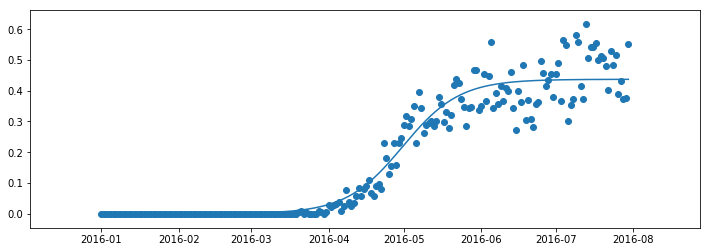

0.935896949435727
121.65496945748588
2016-05-01
0.010927383912292215
0.42616797257939637
80.04090191423748
163.26903700073433
83.22813508649685
---
506
121 2017
[0.27770238823646476, 0.015205355261668108, 0.06396934335426141]
4002.415482762847 0.06877721616716481 0.42506652519428517


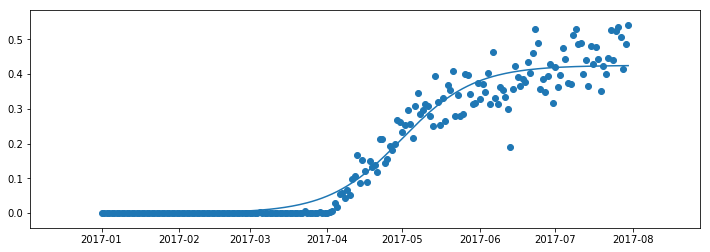

0.9481765928427629
120.601760158129
2017-05-01
0.01062666312985713
0.414439862064428
67.33467768091352
173.8688426353444
106.53416495443089
---
507
121 2018
[0.605914355547865, 0.9027929416228221, 0.8589472978379185]
164980.60225756431 0.10651127073003569 0.3728828530192027


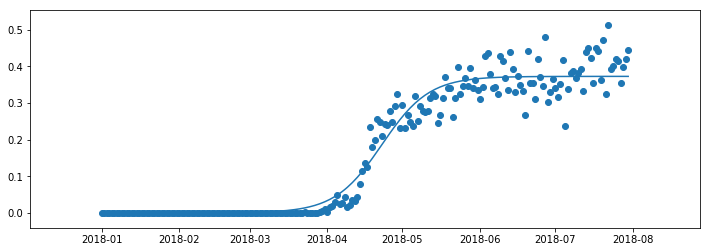

0.9553305573836042
112.79166140404155
2018-04-23
0.009322071325480068
0.36356078169372263
78.39566160965981
147.18766119842334
68.79199958876353
---
508
121 2019
[0.9726066772538502, 0.8881925293113795, 0.8232470962789317]
11754.669780325223 0.08023855312879229 0.34854961296180864


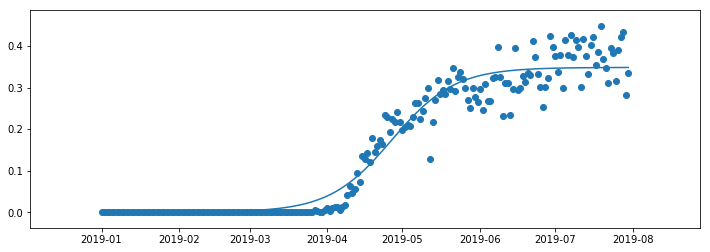

0.9508174738332774
116.80178048186248
2019-04-27
0.008713740324045217
0.33983587263776344
71.14340924666335
162.46015171706162
91.31674247039827
---
509
122 2010
[0.19335993268640572, 0.006517035280964145, 0.6869732180842653]
999999.9999231794 0.11914732422531225 0.4386072525738744


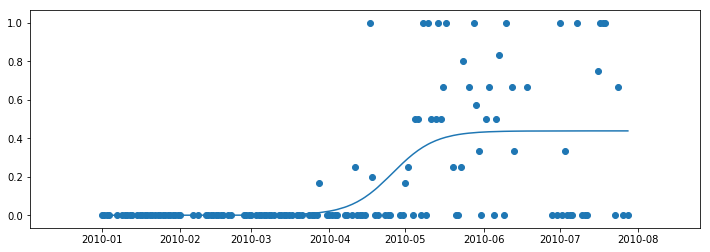

0.3662021757026108
115.95317517799882
2010-04-26
0.01096518131434686
0.4276420712595275
85.20500966148492
146.70134069451265
61.49633103302773
---
510
122 2011
[0.5673388849241718, 0.32289500964231554, 0.8021094877603043]
293.98048604310264 0.035024698667075756 0.8803683721462753


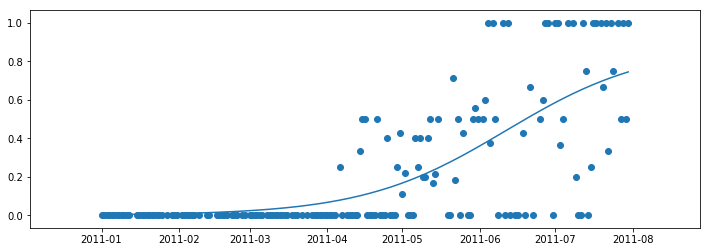

0.5359391921833134
162.27158569319678
2011-06-11
0.022009209303656883
0.8583591628426184
57.67220909460516
266.8709622917882
209.19875319718304
---
511
122 2012
[0.9875325472689894, 0.13398916701307106, 0.8902034562755228]
999999.9999975986 0.12664745440792546 0.5232986919027842


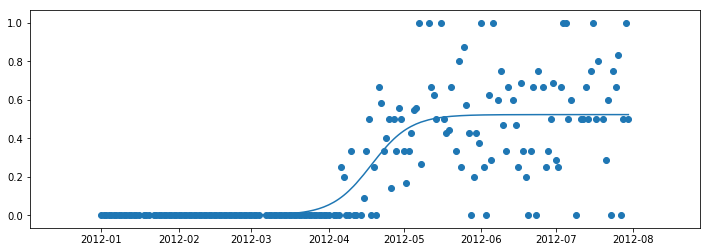

0.6310241637469288
109.08636594828639
2012-04-18
0.013082467297569607
0.5102162246052147
80.15912328670483
138.01360860986796
57.85448532316313
---
512
122 2013
[0.4420318563747172, 0.7882667487023646, 0.676530673608919]
22237.782336570395 0.08197271408035016 0.567733147530183


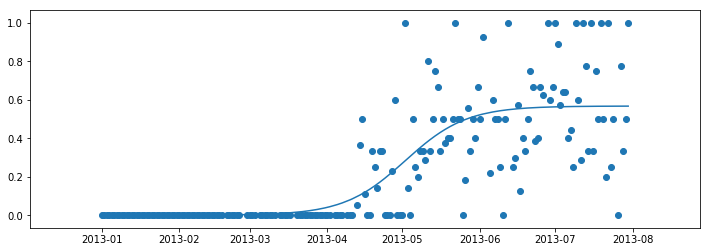

0.6402030321998411
122.10829104058885
2013-05-02
0.014193328688254576
0.5535398188419284
77.4158383478721
166.80074373330555
89.38490538543346
---
513
122 2014
[0.003027152094508101, 0.5475148856435489, 0.06309003875032437]
999999.9999633926 0.1115943336632327 0.526901697378093


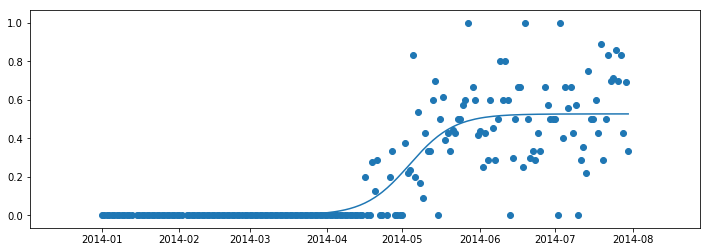

0.7211631802696098
123.801183307567
2014-05-04
0.013172542434452325
0.5137291549436407
90.97190312936841
156.63046348576566
65.65856035639725
---
514
122 2015
[0.8177696247785523, 0.07909757424422448, 0.031303371835216365]
999999.9989836162 0.11732428635344352 0.36931162989424604


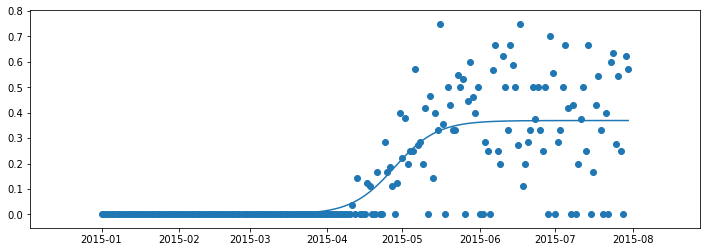

0.5965985004001035
117.75490809573886
2015-04-28
0.009232790747356152
0.3600788391468899
86.52896366431024
148.98085252716743
62.45188886285719
---
515
122 2016
[0.428256017362337, 0.07483964663466336, 0.1729959923998936]
999999.9998161822 0.1175225710620434 0.44644078774409346


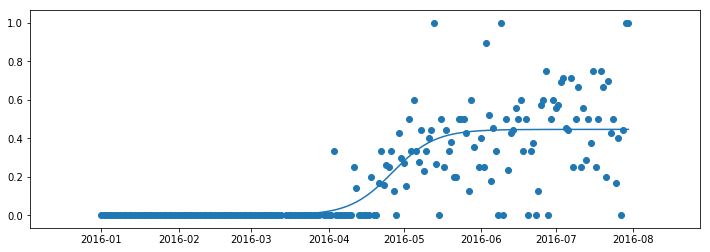

0.6287737561260173
117.55623139394106
2016-04-27
0.011161019693602336
0.4352797680504911
86.38297154247344
148.7294912454087
62.346519702935254
---
516
122 2017
[0.4267165132655024, 0.8675632066764979, 0.21024592554617205]
15296.299276053649 0.07547953482198543 0.5168507562602574


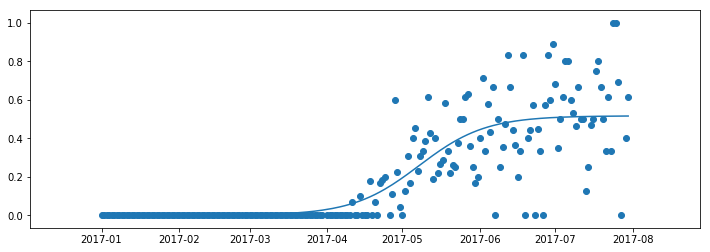

0.6963867610560139
127.65534688927102
2017-05-08
0.012921268906506437
0.503929487353751
79.11819500074962
176.19249877779237
97.07430377704274
---
517
122 2018
[0.2787420131266979, 0.12356470803598474, 0.5701094025310376]
2802.0010180746776 0.06276369714108984 0.5488501664128137


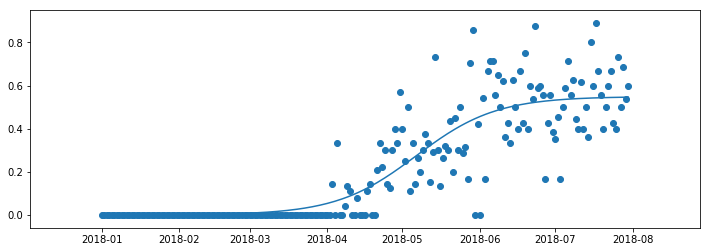

0.7771727037767763
126.47580451468636
2018-05-06
0.013721254160320343
0.5351289122524934
68.1050932117156
184.84651581765718
116.74142260594158
---
518
122 2019
[0.4511665070453583, 0.1498764977732373, 0.7161674381800887]
568731.1482954168 0.1149885311454805 0.37544017806017677


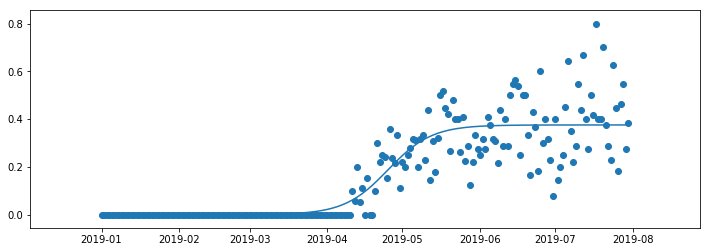

0.7764154338292395
115.23899793170436
2019-04-25
0.00938600445150442
0.3660541736086723
83.37876274446987
147.09923311893883
63.72047037446896
---
519
126 2013
[0.6928931661374295, 0.9254399741979688, 0.6443803244083482]
999999.9722363524 0.13443188278025267 0.2708291655786431


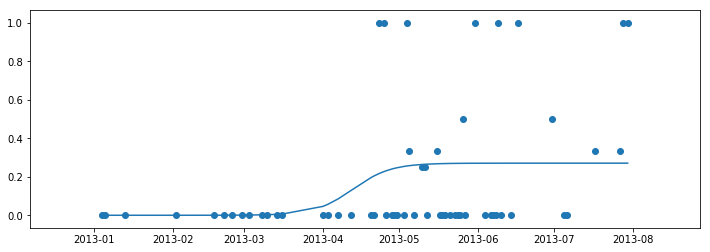

0.11180060236618483
102.76959784000029
2013-04-13
0.006770729139466078
0.26405843643917704
75.51741948497241
130.0217761950282
54.50435671005579
---
520
126 2014
[0.38085352410129214, 0.6530683943816926, 0.6140738544591897]
999999.9997710176 0.10431909720419326 0.2575531832264766


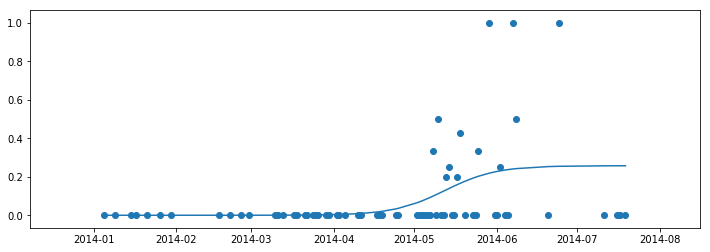

0.19129010632048404
132.43510467400745
2014-05-12
0.0064388295806619145
0.25111435364581464
97.31630337764821
167.55390597036663
70.23760259271842
---
521
126 2016
[0.18242929149714893, 0.6690172908173255, 0.5532696675507783]
166233.66802475153 0.11156074375925275 0.2516379238127697


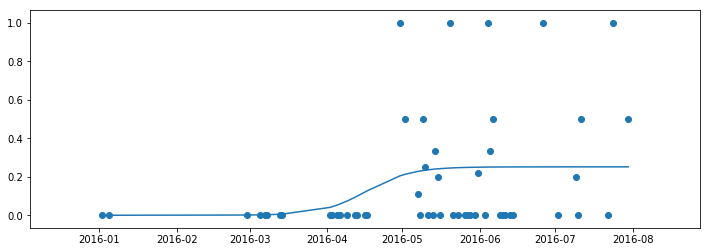

0.12009195283943308
107.75429878980489
2016-04-17
0.006290948095319243
0.24534697571745048
74.91513402020114
140.59346355940872
65.67832953920758
---
522
126 2017
[0.3088142071458111, 0.10221237835067742, 0.4748726826103338]
41387.61677044724 0.10093424847566723 0.18661133121475315


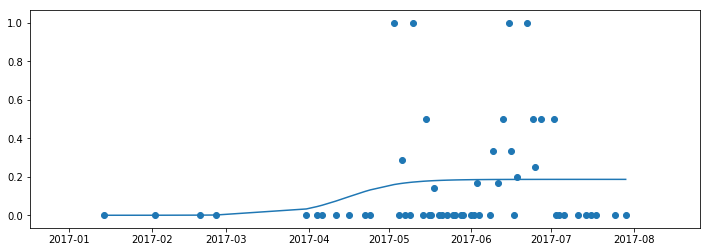

0.05094983283084242
105.32338788660427
2017-04-15
0.004665283280368829
0.18194604793438432
69.02687108029109
141.6199046929175
72.5930336126264
---
523
126 2018
[0.04257837663527597, 0.41329045346788473, 0.6315547678883974]
999999.997326926 0.12177657546013733 0.15293378824632273


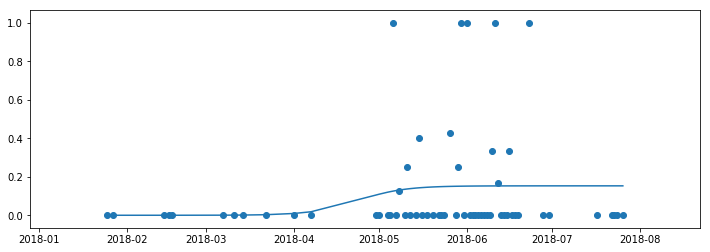

0.04113326054238997
113.449655675476
2018-04-23
0.0038233447061580684
0.14911044354016464
83.36536703222305
143.5339443187289
60.168577286505865
---
524
126 2019
[0.8587983090250998, 0.7928291479061873, 0.5143353020636525]
999999.9999920807 0.08021315736914855 0.5531980791480569


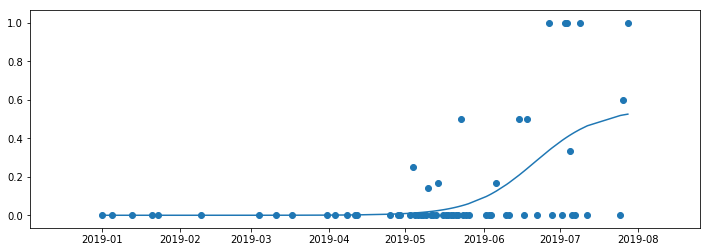

0.3375990660686373
172.2349675674287
2019-06-21
0.013829951978701422
0.5393681271693554
126.56214073592038
217.90779439893706
91.34565366301668
---
525
127 2010
[0.5357321604669553, 0.9597546492999851, 0.9789187286497938]
999999.9998732794 0.11105071336151365 0.36089394104326183


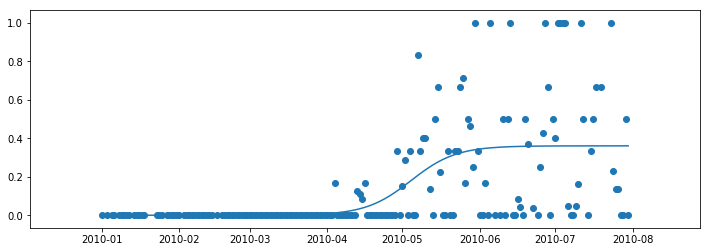

0.34682721652327
124.40722026577754
2010-05-04
0.009022348526081546
0.35187159251718025
91.41723276157019
157.39720776998485
65.97997500841466
---
526
127 2011
[0.40744717526381036, 0.8946911192051282, 0.5944610536586731]
999999.999425165 0.11042186514890273 0.382714119828206


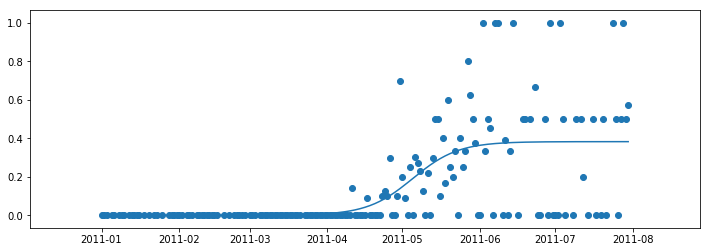

0.4036215361837098
125.1157145259172
2011-05-05
0.009567852995705152
0.37314626683250085
91.93785033036704
158.2935787214673
66.35572839110026
---
527
127 2012
[0.8206217355005653, 0.42120515199188924, 0.4743551751417042]
3504.928450398256 0.06650712268810065 0.5149818322589563


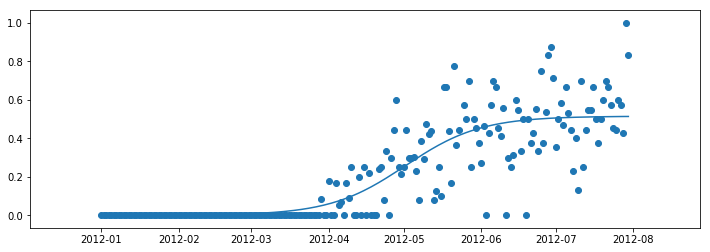

0.7311855430811935
122.72257550452643
2012-05-02
0.01287454580647391
0.5021072864524824
67.6373230074262
177.80782800162655
110.17050499420034
---
528
127 2013
[0.15875392301914415, 0.04612269017852455, 0.4134476406807084]
78709.14508288789 0.0970947847273866 0.3936691358917503


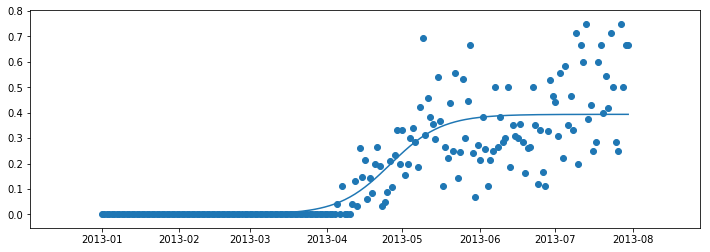

0.7177915437971505
116.10834362651794
2013-04-26
0.009841728397293758
0.38382740749445654
78.37653695517258
153.84015029786332
75.46361334269073
---
529
127 2014
[0.37259540435454785, 0.030087722135865302, 0.5834826486864475]
999999.9999997747 0.11953701921179165 0.3617083987060499


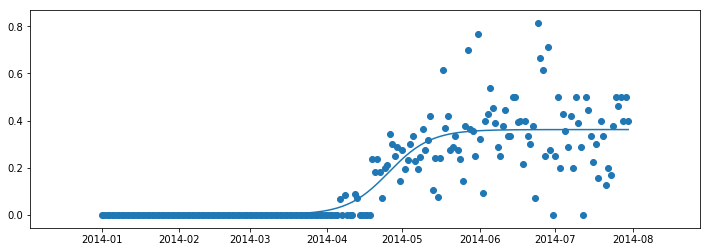

0.7229951034198678
115.57516365274421
2014-04-26
0.009042709967651249
0.35266568873839865
84.92723826288092
146.22308904260748
61.295850779726564
---
530
127 2015
[0.7363393739294615, 0.6377799717258756, 0.2292136158134438]
999999.9999998922 0.11763736982761826 0.40573187131675575


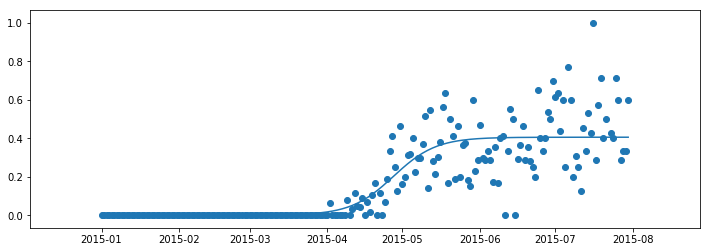

0.719090818735071
117.44151181048113
2015-04-27
0.010143296782918894
0.39558857453383683
86.29867300425737
148.58435061670485
62.285677612447486
---
531
127 2016
[0.2816499738626562, 0.11281378663909902, 0.52820627025643]
999999.9999879969 0.11863100744102038 0.38185248893591217


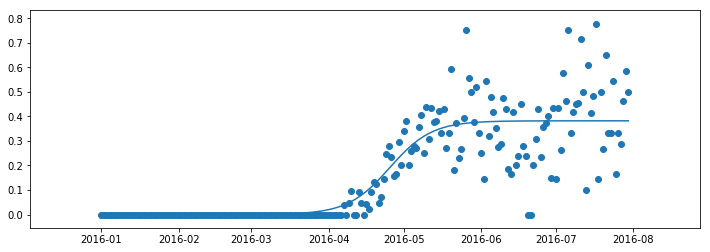

0.7485831569094021
116.45783725490917
2016-04-25
0.009546312223397805
0.37230617671251437
85.57584674369268
147.3398277661257
61.763981022433015
---
532
127 2017
[0.04544301717630683, 0.04275506281859964, 0.8279627365066429]
22295.647843204308 0.08397071950631639 0.4427764782771771


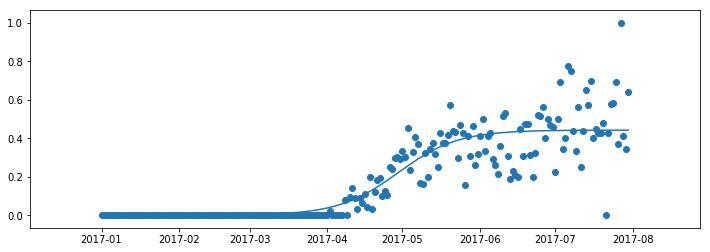

0.7952834948706484
119.23378569676595
2017-04-29
0.011069411956929428
0.43170706632024763
75.60474848393049
162.86282290960136
87.25807442567087
---
533
127 2018
[0.7085813964104231, 0.5411213623971398, 0.752480624569978]
999999.9999989117 0.11773817669319106 0.3966015171476251


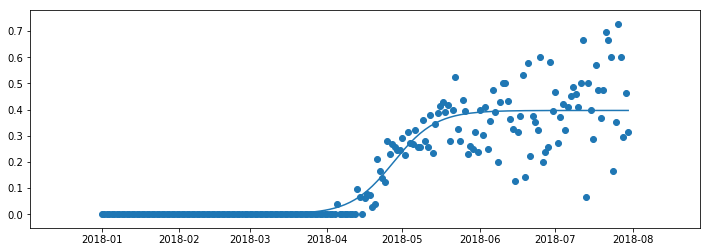

0.8261237186221054
117.34095894795824
2018-04-27
0.009915037928690628
0.38668647921893445
86.22478449184817
148.45713340406826
62.23234891222009
---
534
127 2019
[0.7400542368538789, 0.9480106340764884, 0.9106801702800681]
999999.9999100188 0.12215678896439396 0.3353435138633106


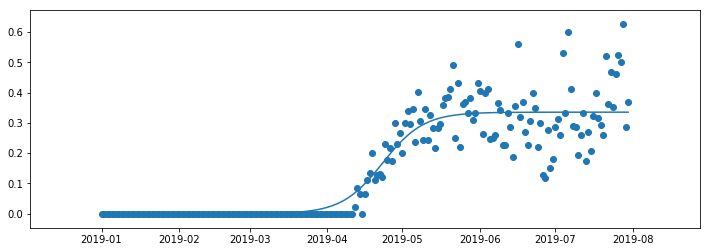

0.8440419370441515
113.09654318026658
2019-04-23
0.008383587846582765
0.32695992601672785
83.10589200821019
143.0871943523229
59.98130234411272
---
535
128 2010
[0.8187490178584753, 0.5014810941918136, 0.19650165896318295]
999999.9999929892 0.12628486670295916 0.3048384619211829


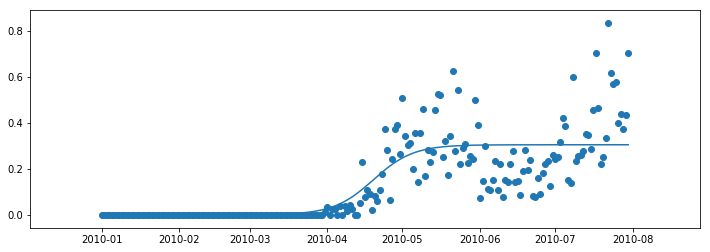

0.6274087603957665
109.39957350909991
2010-04-19
0.007620961548029573
0.2972175003731533
80.38927527006474
138.40987174813503
58.02059647807029
---
536
128 2011
[0.2834491117418675, 0.15912814154072408, 0.2523590050640273]
999999.9999625983 0.12929620840223122 0.34602416936606256


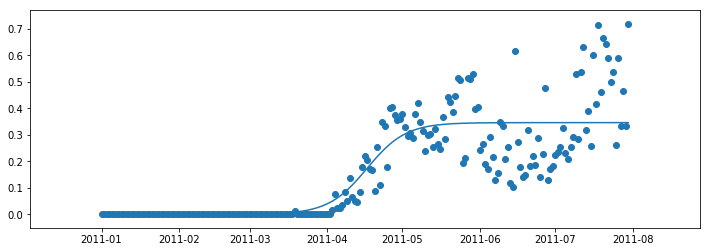

0.7185147029434302
106.8516295152895
2011-04-17
0.008650604234151564
0.33737356513191097
78.51698852773193
135.18627050284704
56.66928197511511
---
537
128 2012
[0.053098969697489506, 0.49134069473626174, 0.6062491857685849]
999999.9995221848 0.12835102528332543 0.37204859980771865


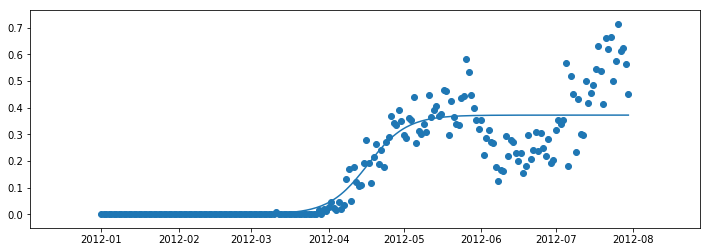

0.7861536108128409
107.63849004703887
2012-04-17
0.009301214995192967
0.36274738481252566
79.09519140144876
136.18178869262894
57.08659729118018
---
538
128 2013
[0.2738260212904522, 0.976293407892096, 0.6939728128353734]
999999.999998932 0.13137611239247324 0.3529038451952094


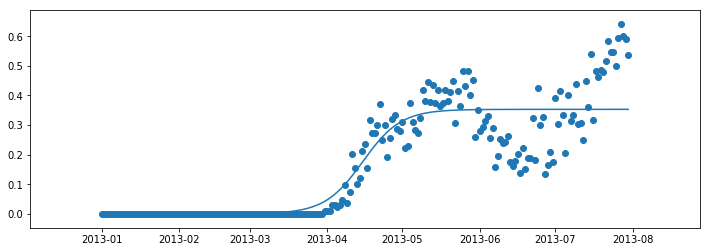

0.7998475394091452
105.159989181981
2013-04-15
0.008822596129880235
0.34408124906532916
77.27393303818893
133.0460453257731
55.772112287584164
---
539
128 2014
[0.4349275894347042, 0.5069769444132153, 0.21801662857631143]
999999.9999972992 0.12512475501559361 0.36221798308779174


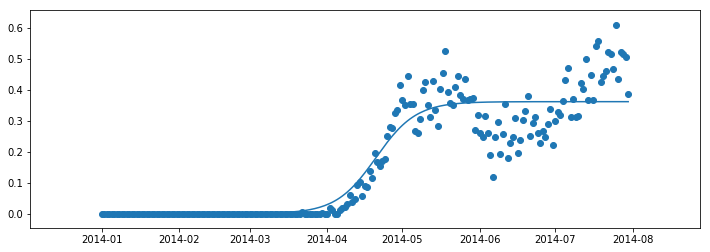

0.8645891897048815
110.41388697416288
2014-04-20
0.009055449577194794
0.35316253351059695
81.13461569268803
139.69315825563777
58.55854256294974
---
540
128 2015
[0.8794747955747877, 0.3285296092482616, 0.6664917709725042]
999999.9999989605 0.12471260324990677 0.3634350794382276


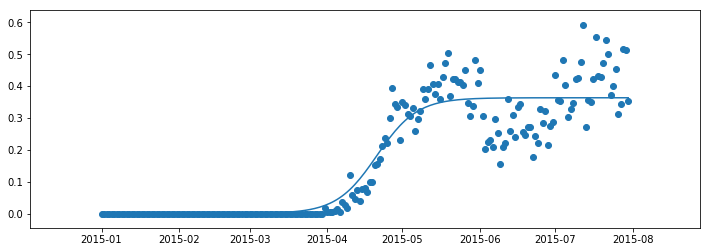

0.874699341247461
110.77878416409018
2015-04-21
0.00908587698595569
0.3543492024522719
81.40275038193604
140.1548179462443
58.75206756430825
---
541
128 2016
[0.5170533551642453, 0.6018484302970002, 0.3309263369474802]
999999.999982426 0.12349518239956951 0.36579764898481554


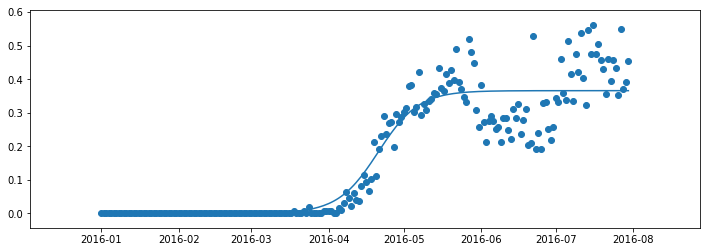

0.8799116395517245
111.87084621039322
2016-04-21
0.009144941224620388
0.35665270776019514
82.20522221644528
141.53647020434113
59.33124798789585
---
542
128 2017
[0.5336479340500992, 0.4690930856901201, 0.9960611779198022]
999999.9999998931 0.12582751145527865 0.3757930167732153


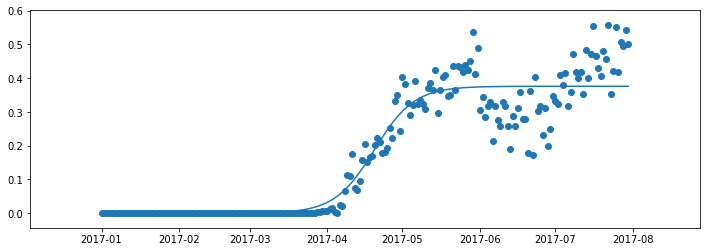

0.8973436118719809
109.79721682626177
2017-04-20
0.009394825419330384
0.3663981913538849
80.6814725525483
138.9129610999752
58.231488547426906
---
543
128 2018
[0.9081534498717522, 0.5838186535414629, 0.24557340674448414]
999999.9999888627 0.12346441454555983 0.36726440857164944


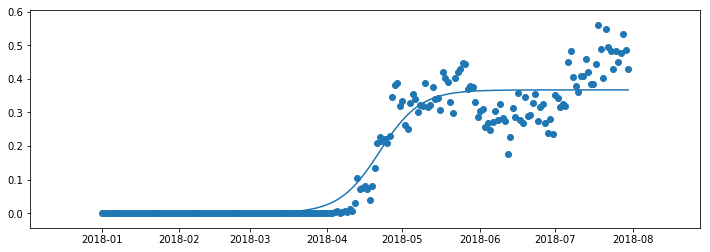

0.9053088491808526
111.89872489821795
2018-04-22
0.009181610214291236
0.3580827983573582
82.22570810536911
141.57174169106673
59.346033585697626
---
544
128 2019
[0.9753225270892174, 0.942758341705983, 0.1367624314035255]
999999.9999958284 0.1270376893218278 0.33422175963896994


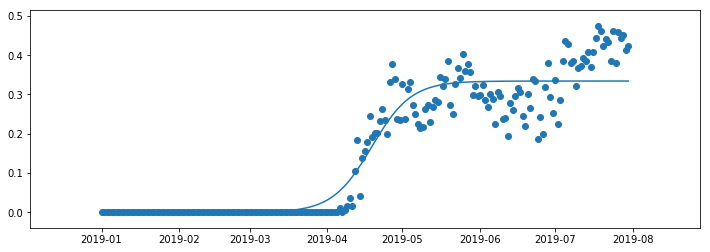

0.9048068816419397
108.75127398579268
2019-04-19
0.008355543990974249
0.32586621564799567
79.91289015114457
137.58965782044072
57.676767669296154
---
545
129 2010
[0.5648985494382792, 0.8688965407409702, 0.7293071245526519]
469.39825882000105 0.0480259384971471 0.33499551744483097


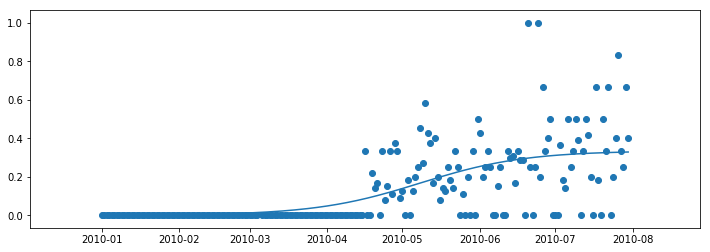

0.4440603255900467
128.08602531321264
2010-05-08
0.008374887936120774
0.3266206295087102
51.80304655690424
204.36900406952097
152.56595751261673
---
546
129 2011
[0.48308892997998876, 0.8442026784294122, 0.6306537939058947]
999999.999999993 0.12499333536399429 0.25240430246615575


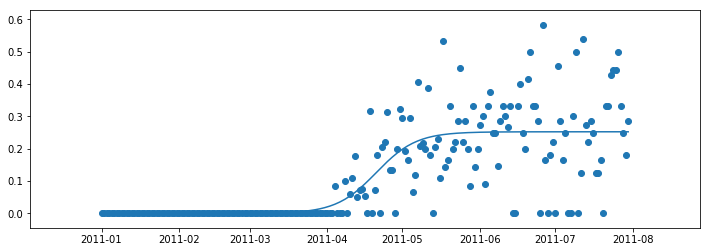

0.5959035747578747
110.52997760026153
2011-04-21
0.006310107561653894
0.24609419490450185
81.21992170439354
139.8400334961295
58.620111791735965
---
547
129 2012
[0.5733526499275932, 0.020225925567751823, 0.44966999433588717]
115.64506344607015 0.0369516289690628 0.34323772623977616


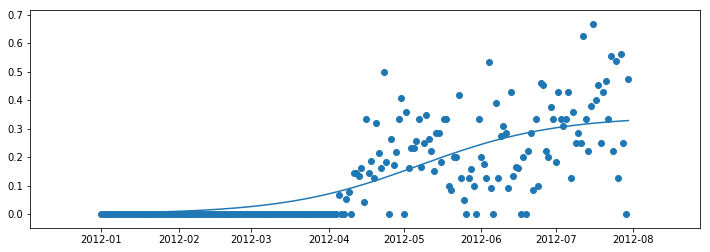

0.5803310816638106
128.56065713510193
2012-05-08
0.008580943155994404
0.3346567830837818
29.415863026108568
227.70545124409537
198.28958821798682
---
548
129 2013
[0.5805500487703247, 0.32531828148228215, 0.9992554499081746]
999999.9999993793 0.13225853947808802 0.2489666759912762


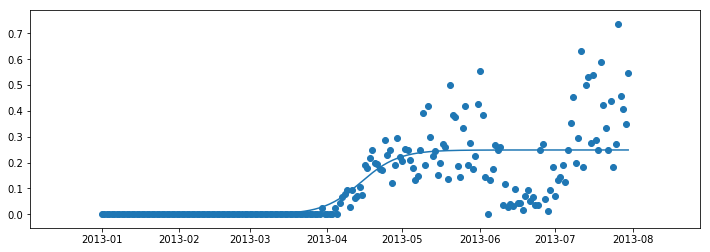

0.549108792948011
104.45836323674618
2013-04-14
0.006224166899781905
0.24274250909149428
76.75836246109412
132.1583640123982
55.400001551304086
---
549
129 2014
[0.2764605136094337, 0.49587409844333996, 0.5093241986997425]
999999.9999999673 0.1263862755364778 0.2599100599524309


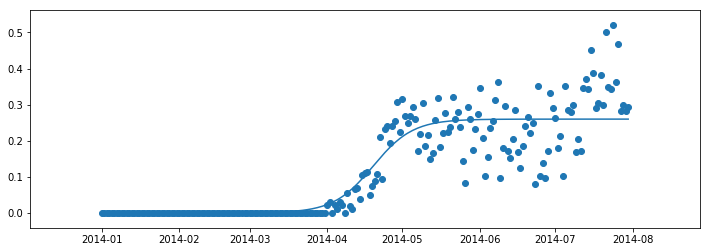

0.7936704080224166
109.31179433305468
2014-04-19
0.006497751498810773
0.2534123084536201
80.32477315074075
138.29881551536863
57.97404236462788
---
550
129 2015
[0.47477728620026094, 0.18730707938640356, 0.41824621439142284]
999999.9999950244 0.12207153781375776 0.2704637601403611


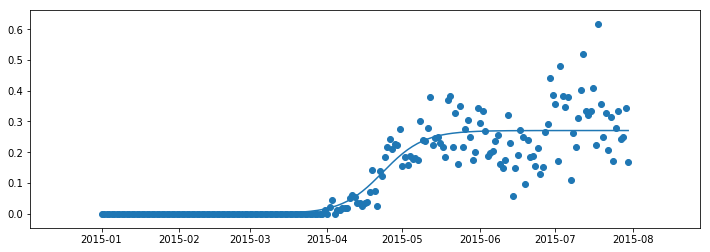

0.7981329976891589
113.17552646086396
2015-04-23
0.006761594003509028
0.2637021661368521
83.16393070527455
143.18712221645342
60.023191511178865
---
551
129 2016
[0.9589837591892126, 0.5282572084438418, 0.4964880703220139]
287.6433330798863 0.04152995412157116 0.39161245147800855


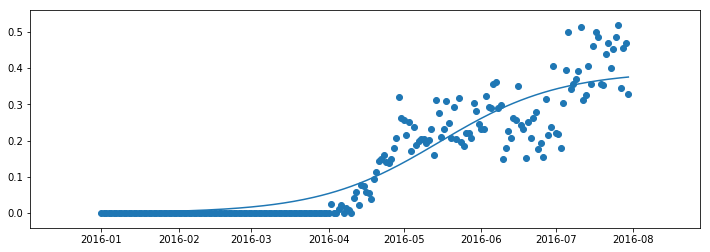

0.8563632014904039
136.32861883911977
2016-05-15
0.009790311286950215
0.3818221401910583
48.113697257331914
224.54354042090748
176.42984316357555
---
552
129 2017
[0.8615786008806963, 0.49655170464671583, 0.1253727602081237]
1947.1730921970168 0.06251599852044502 0.33056102983151336


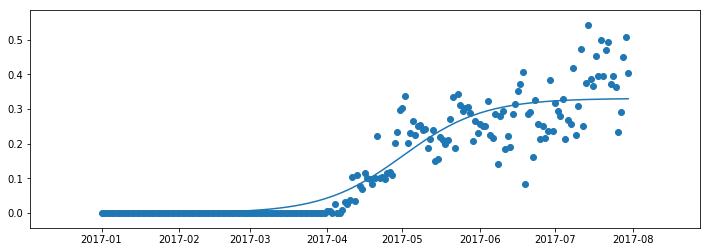

0.8517202616682105
121.15512960966593
2017-05-01
0.008264025745787834
0.32229700408572554
62.5531439926318
179.7571152267001
117.2039712340683
---
553
129 2018
[0.34754243406757956, 0.3745638260980324, 0.5611593003049651]
259859.24012827576 0.10897781915241475 0.2964060863712646


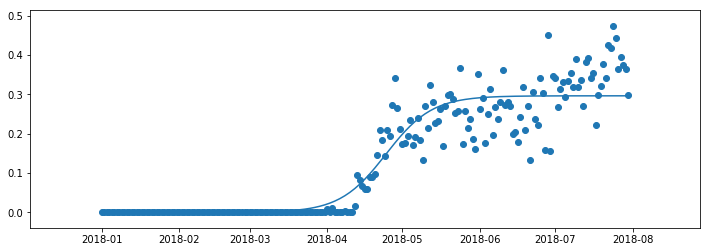

0.8800402147950827
114.40764254822294
2018-04-24
0.007410152159281615
0.28899593421198294
80.79014428460064
148.02514081184518
67.23499652724453
---
554
129 2019
[0.03516885881501408, 0.6464314621096225, 0.001590218698775292]
999999.9999926444 0.1258931644353122 0.2440119163256393


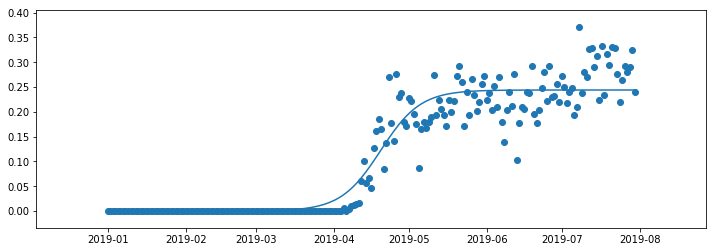

0.9085796301277588
109.73995784382522
2019-04-20
0.006100297908140983
0.2379116184174983
80.63939736016134
138.84051832748915
58.20112096732781
---
555
130 2010
[0.6572852309321002, 0.674780922932249, 0.12268244162049069]
999999.9999717962 0.1225149901363726 0.34705046335849776


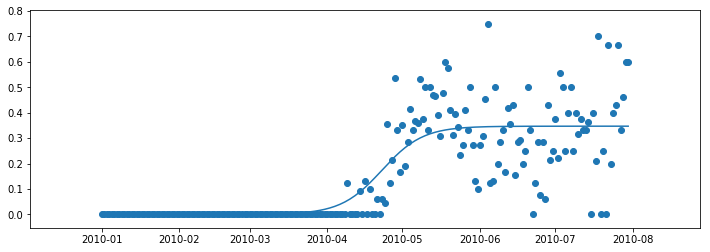

0.6737380225752249
112.76587903698882
2010-04-23
0.008676261583962444
0.3383742017745353
82.8629125342637
142.66884553971389
59.805933005450186
---
556
130 2011
[0.8944343407288556, 0.3616037333724359, 0.4805748689199745]
617948.6048187935 0.1238951659438911 0.3205259359242453


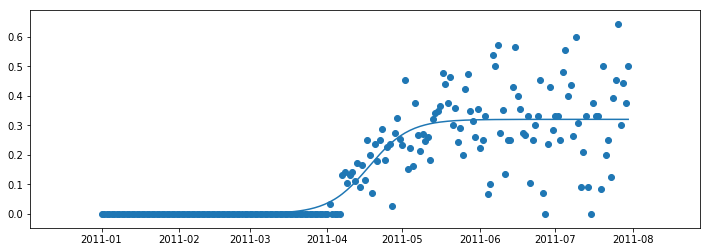

0.7265770154295064
107.62454263386347
2011-04-18
0.008013148398106133
0.31251278752613915
78.05469123394059
137.19439403378638
59.13970279984579
---
557
130 2012
[0.7617123139104902, 0.2773940533440822, 0.20194823626487468]
999999.9999904672 0.12957133271425922 0.3657018137806578


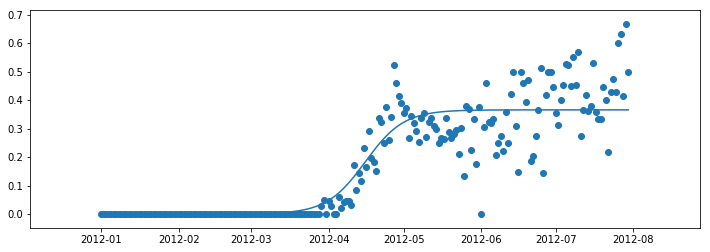

0.8162951855943729
106.62474691390094
2012-04-16
0.009142545344516445
0.35655926843614133
78.35027007257047
134.89922375523136
56.548953682660894
---
558
130 2013
[0.14762237045316373, 0.9760835604068756, 0.8946842608667449]
999999.9999507513 0.13211416405650458 0.30572619533964623


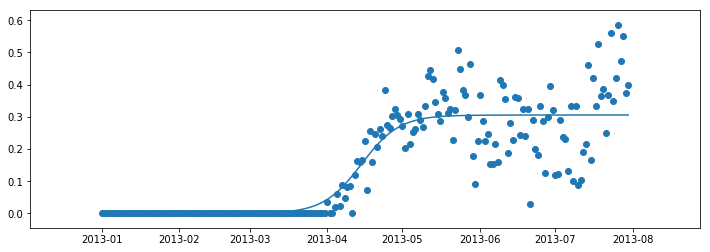

0.7737489437482856
104.57251617628371
2013-04-15
0.007643154883491156
0.2980830404561551
76.84224461688635
132.3027877356811
55.46054311879476
---
559
130 2014
[0.40680224306877766, 0.044809896370821, 0.9181735095508867]
999999.9999994702 0.12472680987100898 0.3310388592480438


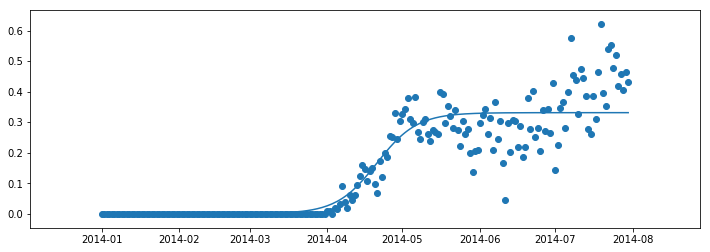

0.8365829062430459
110.76616624967467
2014-04-21
0.008275971481201096
0.3227628877668427
81.39347845369512
140.13885404565417
58.745375591959046
---
560
130 2015
[0.8484310024023194, 0.9838013182636419, 0.24571333761668923]
18236.848750062254 0.08294994209445261 0.4031458086894137


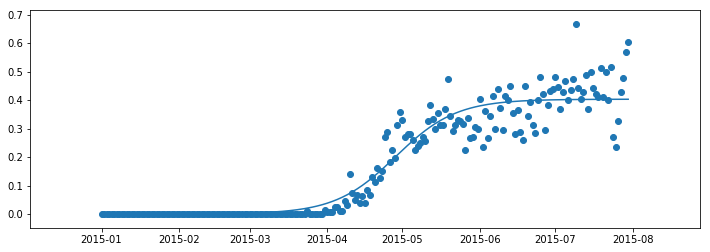

0.9136098663313738
118.278557345286
2015-04-28
0.010078645217235343
0.39306716347217835
74.11262360710377
162.44449108346825
88.33186747636448
---
561
130 2016
[0.4987755910929894, 0.37571471266835255, 0.5436591033956245]
999999.9999105354 0.12454682047494513 0.3313696684915494


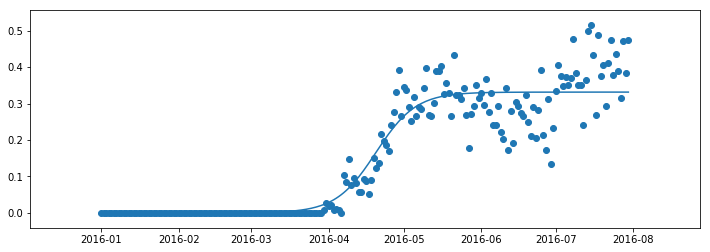

0.8860831452021648
110.92624047077985
2016-04-20
0.008284241712288736
0.32308542677926066
81.51110460332798
140.34137633823164
58.83027173490366
---
562
130 2017
[0.9862134824028439, 0.13551590238166655, 0.024181670054693183]
999999.9999968606 0.12440600738372198 0.34671356369628287


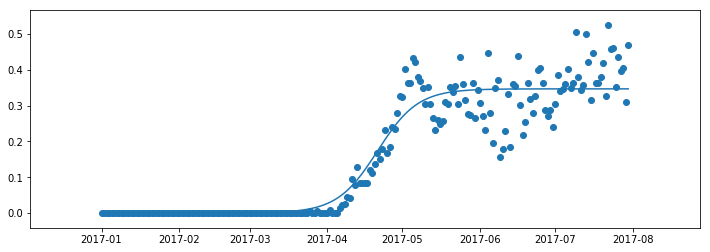

0.906277666200659
111.05179603866009
2017-04-21
0.008667839092407072
0.3380457246038758
81.60336566801378
140.50022640930635
58.89686074129257
---
563
130 2018
[0.8364716735045657, 0.5107684493016114, 0.7631101113367366]
999999.9999994936 0.12148292937144656 0.3451459656718594


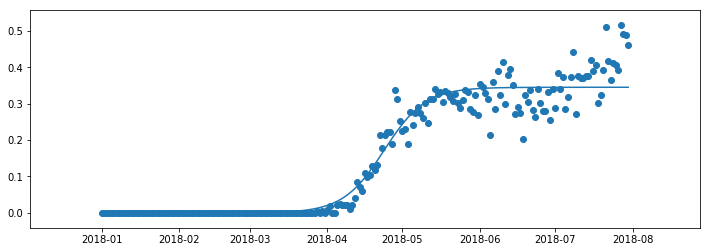

0.9398041580733468
113.72388391887903
2018-04-24
0.008628649141796485
0.3365173165300629
83.56687613939151
143.8808916983665
60.31401555897499
---
564
130 2019
[0.741797601795002, 0.9558918035407216, 0.12133302497462095]
999999.9999976342 0.12670882201985123 0.32992286198070125


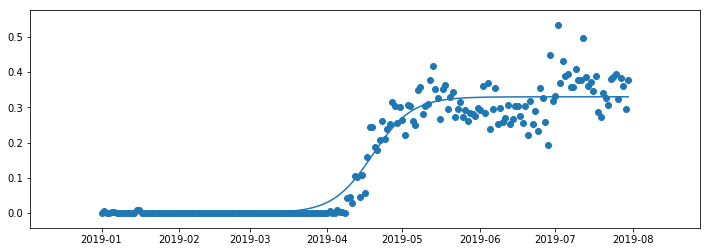

0.9308297440345769
109.03353324362418
2019-04-19
0.008248071549517531
0.3216747904311837
80.12030062312296
137.94676586412538
57.826465241002424
---
565
131 2010
[0.23686119022175944, 0.2549021411791672, 0.6711971633864856]
999999.9999923198 0.1294714025098189 0.3016143476653694


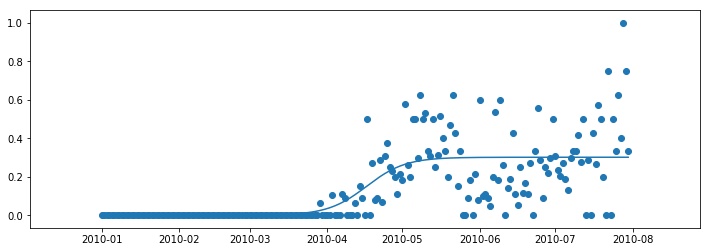

0.5057192999516027
106.70704333266838
2010-04-17
0.007540358691634235
0.29407398897373516
78.41074333814404
135.00334332719274
56.59259998904869
---
566
131 2011
[0.7150120704595142, 0.6091455806413139, 0.19476543639262234]
999999.9999861863 0.13315514264260622 0.3355459397068845


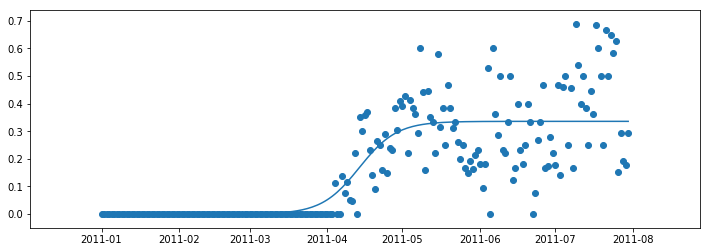

0.669989944016693
103.75499048528565
2011-04-14
0.008388648492672113
0.3271572912142124
76.24150829133993
131.26847267923128
55.026964387891354
---
567
131 2012
[0.12459630866082771, 0.7243496527842601, 0.9905053001701075]
999999.9985414075 0.1291948661072131 0.34012495635899676


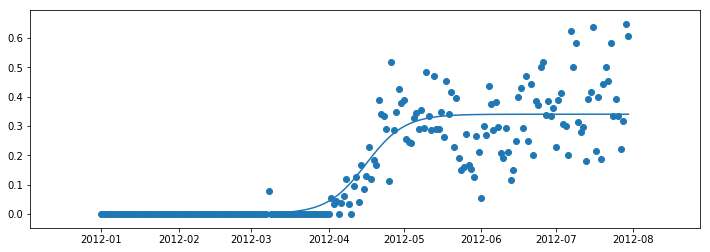

0.7681385568680694
106.9354454459576
2012-04-16
0.00850312390897492
0.3316218324500218
78.57857836201775
135.2923125298974
56.71373416787965
---
568
131 2013
[0.5370268987346167, 0.6003135521534996, 0.5094015209040668]
873928.2948610861 0.12578682309713946 0.3862228784807119


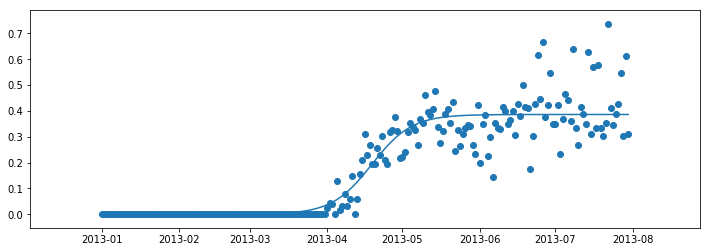

0.8587607613829796
108.76142088598534
2013-04-19
0.009655571962017799
0.3765673065186941
79.63625852060433
137.88658325136632
58.25032473076199
---
569
131 2014
[0.0859094068118923, 0.6591066888801121, 0.7747881958013907]
999999.9999993293 0.12423300135324451 0.36477182568432587


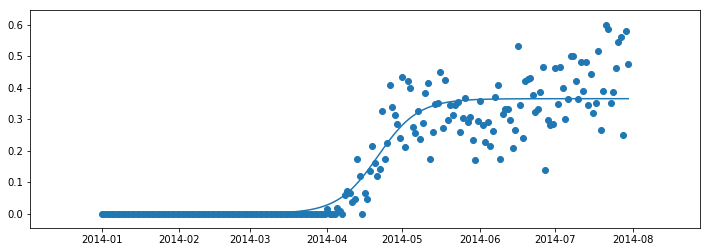

0.8578913227390613
111.20644601252559
2014-04-21
0.009119295642108147
0.3556525300422177
81.7170059585687
140.69588606648242
58.97888010791371
---
570
131 2015
[0.7329847475010856, 0.14218537803932896, 0.7290711639123814]
999999.9999744302 0.12211990065785569 0.3853558691395221


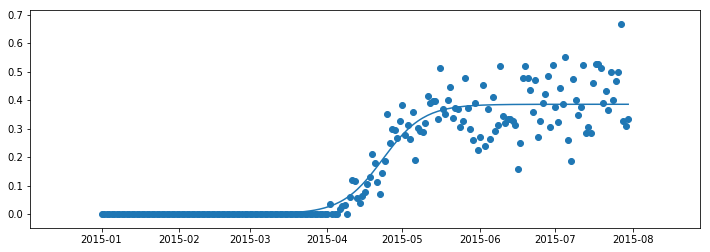

0.8909631248608828
113.13070583512618
2015-04-23
0.009633896728488052
0.375721972411034
83.13099549803808
143.13041617221424
59.999420674176164
---
571
131 2016
[0.34158326873692757, 0.05414533942693822, 0.11942927812492699]
999999.9999999208 0.12299373290730874 0.37531352049022926


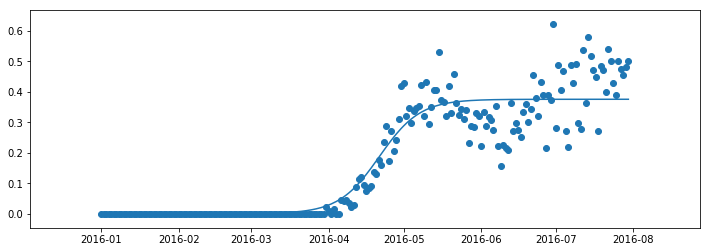

0.8783286561889032
112.32694732808802
2016-04-21
0.009382838012255732
0.3659306824779735
82.54037560991274
142.11351904626326
59.57314343635052
---
572
131 2017
[0.9528023312179887, 0.812893268066408, 0.31057612881893437]
999999.9999674862 0.12490556479016643 0.3718895894267573


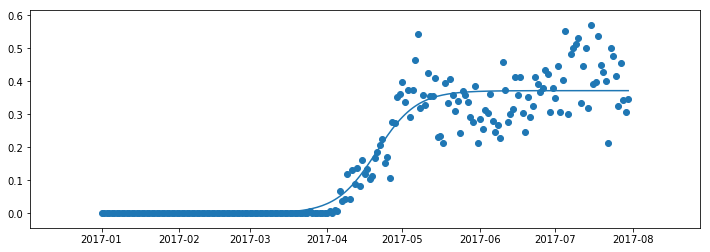

0.8964188041628937
110.607646513916
2017-04-21
0.009297239735668933
0.3625923496910884
81.27699457471535
139.93829845311666
58.66130387840131
---
573
131 2018
[0.3617143656793246, 0.3616679647633372, 0.11399709321422447]
999999.9999997983 0.12456903180242757 0.34576569647799155


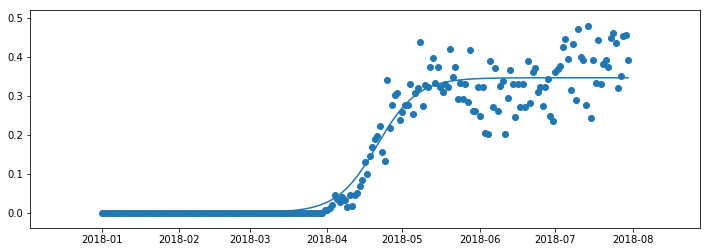

0.9276809518392412
110.90646172698952
2018-04-21
0.008644142411949789
0.3371215540660418
81.49657073626373
140.31635271771532
58.819781981451584
---
574
131 2019
[0.7704403747766512, 0.9146815178436227, 0.7312492652522049]
999999.9999999898 0.12638199996953525 0.32862897701935473


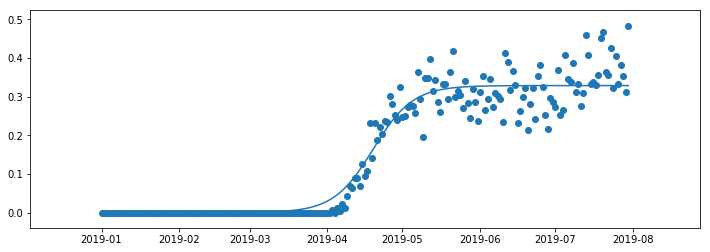

0.9360572094116058
109.31549240631207
2019-04-19
0.00821572442548387
0.3204132525938709
80.32749057841919
138.30349423420498
57.97600365578579
---
575
132 2010
[0.9032425606201996, 0.4824620559837587, 0.38869813955430166]
999999.9999983222 0.12096606384065549 0.40040548900611556


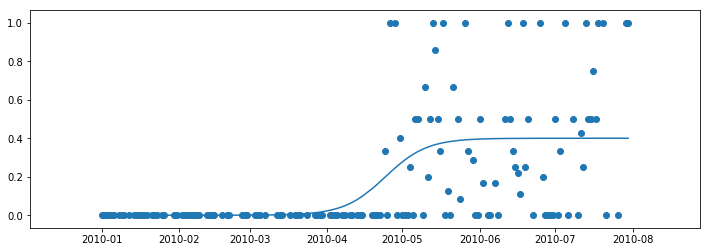

0.3338520384087029
114.20980495952404
2010-04-24
0.01001013722515289
0.3903953517809627
83.92394188510399
144.49566803394413
60.57172614884014
---
576
132 2011
[0.276684776509146, 0.019964357692239476, 0.26225164976437554]
399.59382459115653 0.02919480485151644 0.9999999999727948


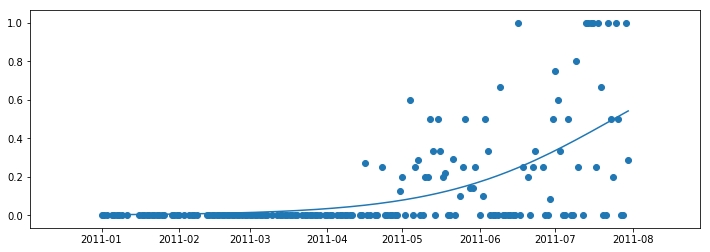

0.37212366283006215
205.1888554537724
2011-07-24
0.024999999999319872
0.9749999999734749
79.70208940884187
330.67562149870275
250.9735320898609
---
577
132 2012
[0.5400761177590204, 0.785106152999753, 0.1468042362658939]
10166.913588678619 0.07999155730076125 0.38762947133333886


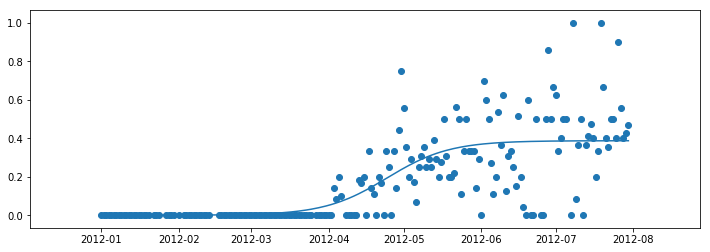

0.5525587759129955
115.34834765563018
2012-04-24
0.009690736783333473
0.3779387345500054
69.54899370187509
161.14770160938517
91.59870790751008
---
578
132 2013
[0.9087555468314683, 0.09518466685797289, 0.3302390929563661]
6007.816505868921 0.07521777035270369 0.3301825865952938


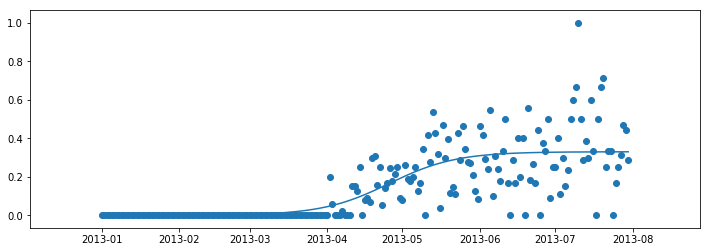

0.5910993661437045
115.675014169465
2013-04-26
0.008254564664882346
0.3219280219304115
66.9689487151071
164.38107962382293
97.41213090871582
---
579
132 2014
[0.0693020401525345, 0.29036739447274484, 0.7899696532683325]
78472.35041335998 0.09557909843353445 0.41047606181166435


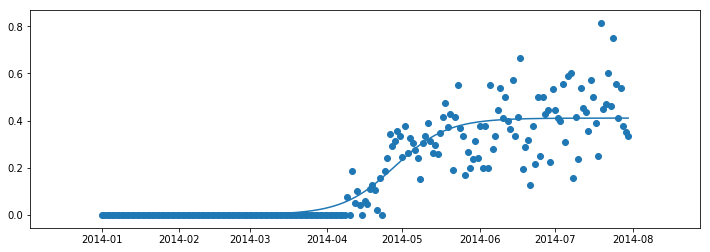

0.8130507444306764
117.9180574247507
2014-04-28
0.010261901545291609
0.40021416026637274
79.58790254599045
156.248212303511
76.66030975752055
---
580
132 2015
[0.9347099308419882, 0.8688537538586438, 0.10095906041334268]
204568.2538226217 0.10806637367952311 0.28746932230824623


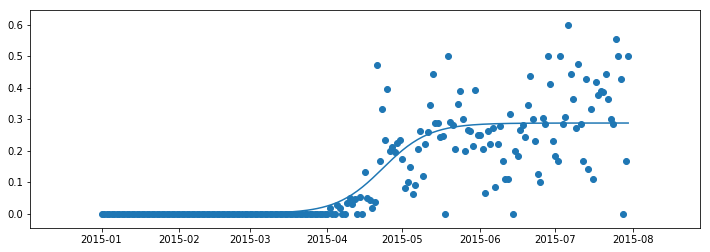

0.6832364197085417
113.15876106445714
2015-04-23
0.0071867330577061565
0.28028258925054006
79.25772856572499
147.05979356318926
67.80206499746427
---
581
132 2016
[0.7246137526437755, 0.8945368339685539, 0.427744697420104]
15545.917102161222 0.0784615330977286 0.32679329293591464


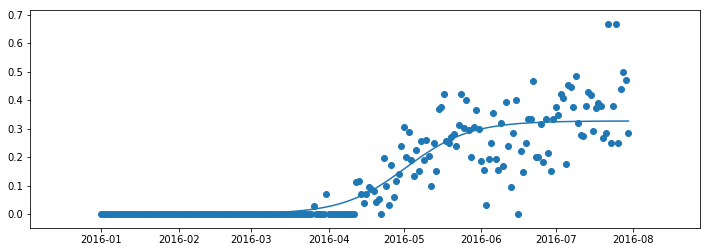

0.7779369918703284
123.01000166963273
2016-05-02
0.008169832323397866
0.3186234606125168
76.31754612499714
169.70245721426835
93.38491108927121
---
582
132 2017
[0.4327141997866255, 0.5249244110314799, 0.9050152045767647]
999999.999867559 0.12381178942253646 0.2592938879747246


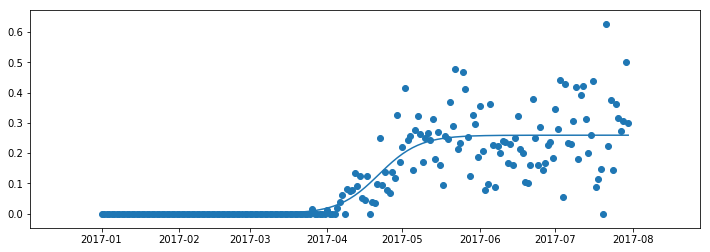

0.7113005799481324
111.58477413393322
2017-04-22
0.006482347199368115
0.25281154077535645
81.99500999905837
141.17453826880805
59.17952826974968
---
583
132 2018
[0.3329371339650262, 0.17888127060961845, 0.12369368943871195]
7128.959480838424 0.07410183775804137 0.27735021786121455


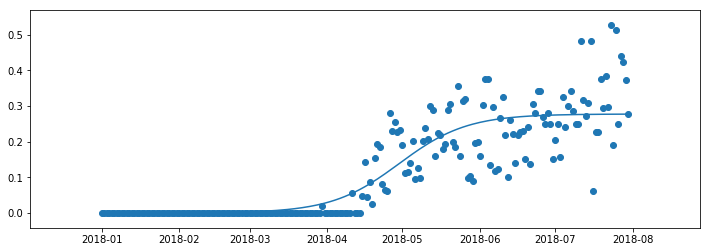

0.7755131055432163
119.72605316970966
2018-04-30
0.0069337554465303645
0.2704164624146842
70.28650137219591
169.16560496722346
98.87910359502754
---
584
132 2019
[0.6663086508869736, 0.7940763862465205, 0.028543231207105002]
999999.9999922287 0.12819780192004737 0.23421928815956472


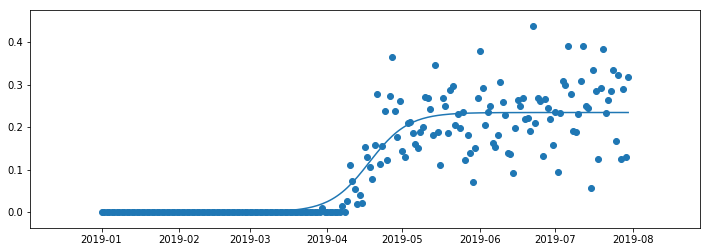

0.8045616956837482
107.76714070786306
2019-04-18
0.0058554822039891185
0.2283638059555756
79.18972681105939
136.34455460466668
57.154827793607296
---
585
133 2010
[0.48009613191945855, 0.054231750099366205, 0.4693206939823573]
999999.9971736647 0.11918311723087245 0.22736723133566222


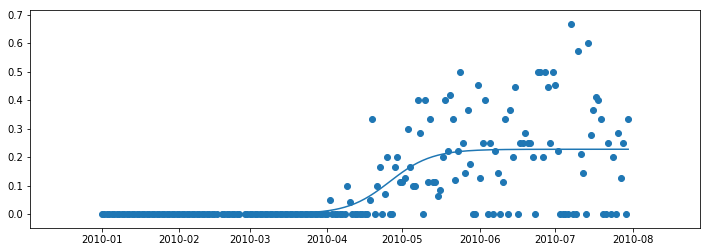

0.44842935756476987
115.91835216371783
2010-04-26
0.005684180783391556
0.22168305055227067
85.17942091867518
146.6572834087605
61.477862490085315
---
586
133 2011
[0.3346015297235434, 0.3164674913340977, 0.2358131998265799]
340899.3799184666 0.1116259915920512 0.2642953481641716


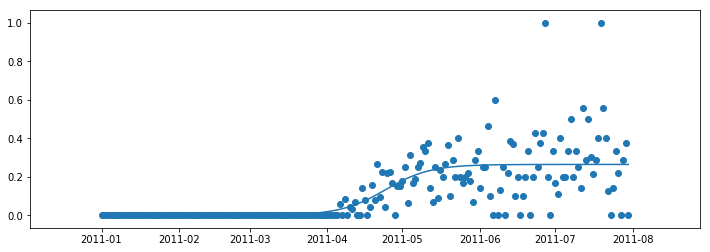

0.5120419440842721
114.12523604473103
2011-04-24
0.00660738370410429
0.2576879644600673
81.30526648496655
146.94520560449547
65.63993911952892
---
587
133 2012
[0.5433670087543914, 0.023631311704421565, 0.3391701198286614]
999999.9954820102 0.13147507923629814 0.22297876039904457


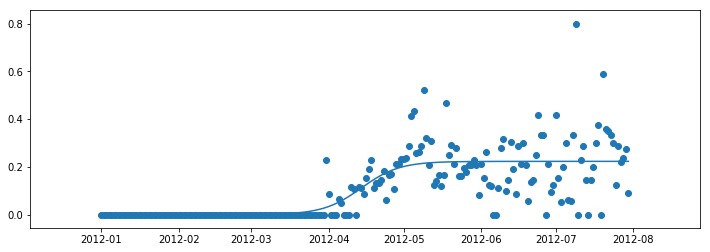

0.5680412615268575
105.08083078326867
2012-04-14
0.005574469009976115
0.21740429138906844
77.21576565145625
132.94589591508102
55.73013026362477
---
588
133 2013
[0.2516233552900551, 0.31925526471539545, 0.22750489792989925]
999999.9999948324 0.1281315795241292 0.2694377817699276


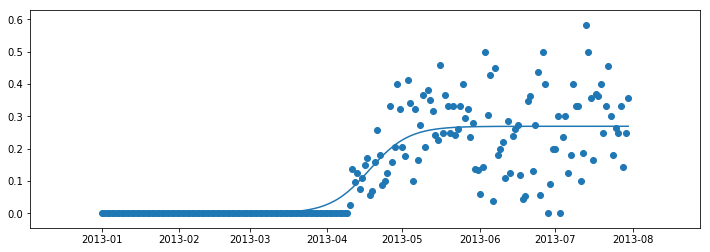

0.6891360824802069
107.82283812678222
2013-04-18
0.006735944544248191
0.2627018372256794
79.23065453132644
136.41502172223798
57.184367190911544
---
589
133 2014
[0.9574010391889216, 0.7646674863659174, 0.7149639513199338]
999999.9999994622 0.12777605268127756 0.2934597546929536


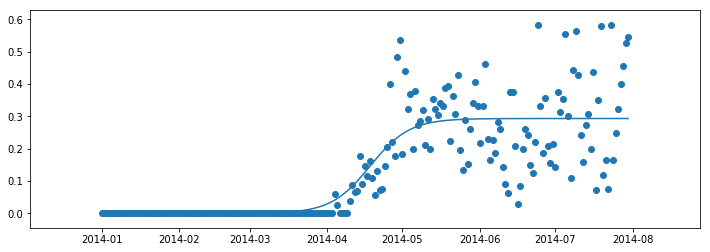

0.6916057698302864
108.12284671545545
2014-04-18
0.007336493867323841
0.2861232608256298
79.45110761213559
136.79458581877537
57.34347820663979
---
590
133 2015
[0.3844491390711259, 0.3116224791128662, 0.8312846990478141]
999999.9999563585 0.12078677343100323 0.30877032122799897


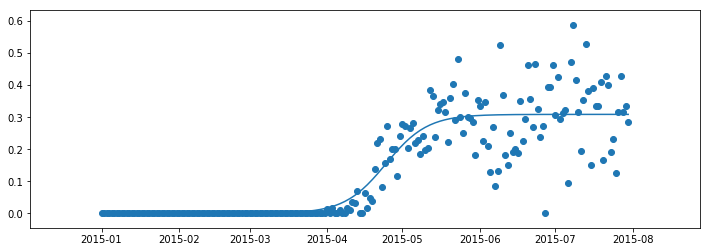

0.8010755683898277
114.37933281504895
2015-04-24
0.007719258030699974
0.30105106319729896
84.04851477873164
144.71015085136622
60.66163607263458
---
591
133 2016
[0.05528782276791089, 0.04572527745803023, 0.6065122646112864]
999999.999987099 0.12215649648972815 0.35471835577508826


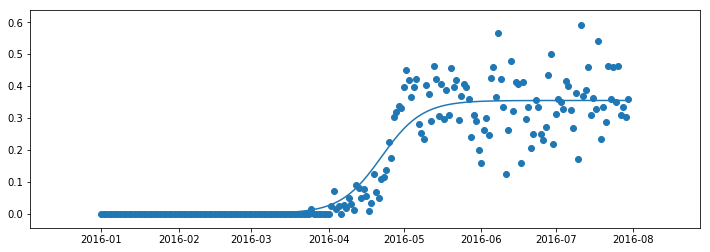

0.8632858321169653
113.09681396366085
2016-04-22
0.008867958894377206
0.34585039688071106
83.10609098612598
143.08753694119574
59.98144595506976
---
592
133 2017
[0.150785014689928, 0.9985781775823354, 0.9507624505986139]
999999.9999999983 0.1228010729306909 0.316048715955101


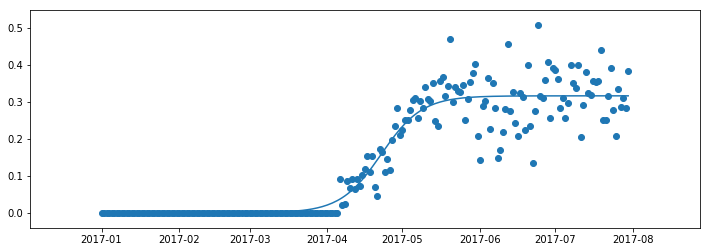

0.9030076640230313
112.5031746730891
2017-04-23
0.007901217898877525
0.30814749805622343
82.66987143967708
142.3364779065011
59.66660646682402
---
593
133 2018
[0.13380773358270748, 0.01762540531888601, 0.5402209963767353]
999999.9999928083 0.12445292783178374 0.28262536902699004


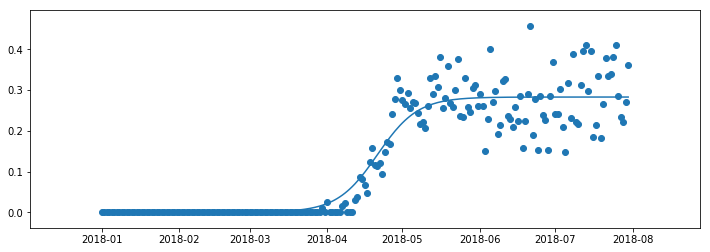

0.8860634005251479
111.00992799969124
2018-04-21
0.007065634225674751
0.2755597348013153
81.57260008819779
140.4472559111847
58.87465582298691
---
594
133 2019
[0.9793990114962987, 0.050995321782530634, 0.518138440695484]
999999.9999951121 0.12679944246996142 0.2585370260505005


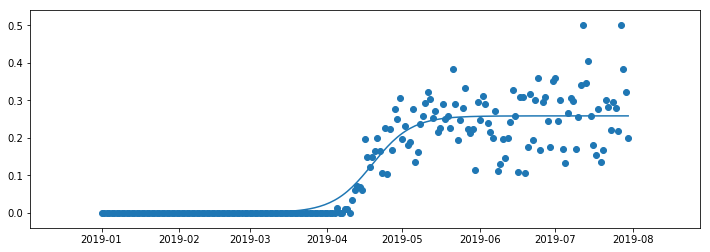

0.8359499442100653
108.95560965287571
2019-04-19
0.006463425651262513
0.252073600399238
80.06304061025126
137.84817869550017
57.7851380852489
---
595
134 2010
[0.4715278699830997, 0.04798552236630649, 0.9743285303194084]
128.68100511166148 0.033448731790794224 0.3789089297396151


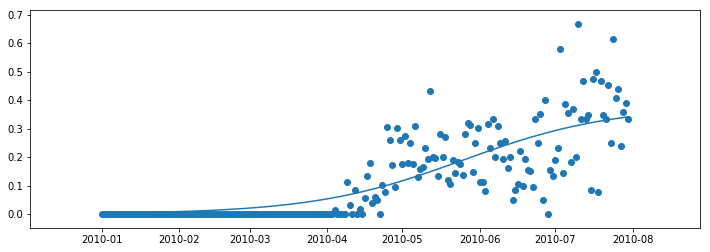

0.6584602824511074
145.21735961948787
2010-05-25
0.009472723243490378
0.3694362064961247
35.68968995944014
254.74502927953546
219.05533932009533
---
596
134 2011
[0.5242620834242666, 0.24308514517409707, 0.9217555641134304]
999999.9982218684 0.12584652877431604 0.23647310324650744


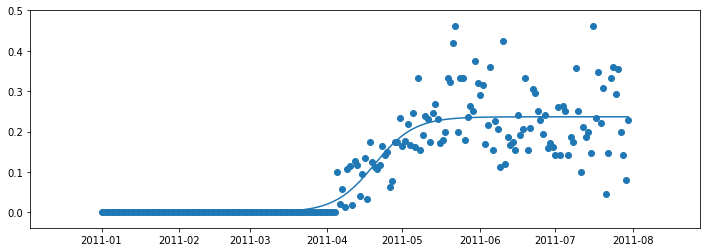

0.7854175264785098
109.78062478752885
2011-04-20
0.005911827581162686
0.23056127566534476
80.66928034433322
138.89196923072453
58.22268888639131
---
597
134 2012
[0.9825822764482195, 0.7739481172022701, 0.2201092969604409]
999999.9999994583 0.12945834889417632 0.2651708048757545


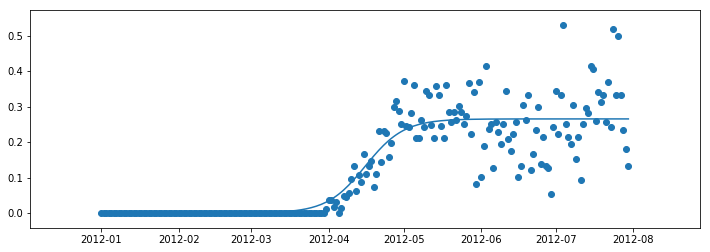

0.7947009066651396
106.7178028761745
2012-04-16
0.006629270121893863
0.25854153475386066
78.4186496935214
135.01695605882765
56.59830636530624
---
598
134 2013
[0.8133388024152755, 0.6496654670819145, 0.11006982445384228]
999999.9999997315 0.12876811404536856 0.21768881182738414


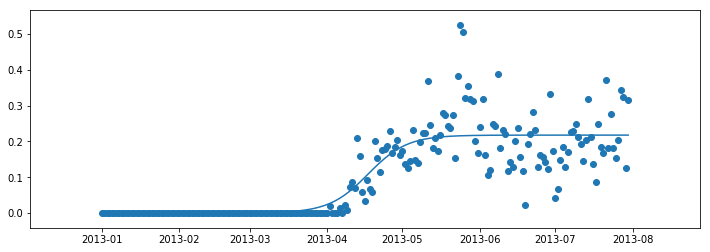

0.7390473167261379
107.2898415915016
2013-04-17
0.005442220295684604
0.21224659153169953
78.83899664988142
135.74068653312176
56.90168988324034
---
599
134 2014
[0.023751426945072818, 0.16238033847775957, 0.6713940586785458]
999999.9999673393 0.12530309916857846 0.20764030848081422


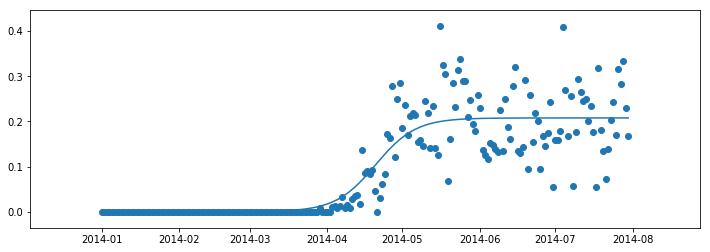

0.765960366449005
110.25673466659195
2014-04-20
0.005191007712020356
0.20244930076879386
81.01913663080181
139.4943327023821
58.4751960715803
---
600
134 2015
[0.762004088160295, 0.5154620267164373, 0.40456639153341123]
711496.0933549473 0.11722167151063972 0.2174077286373961


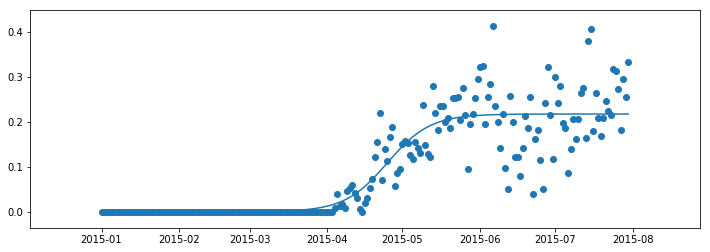

0.7963889645220336
114.95421479770505
2015-04-25
0.005435193215934903
0.2119725354214612
83.70093544315223
146.2074941522578
62.50655870910556
---
601
134 2016
[0.45961479710064923, 0.31212406103678425, 0.9200698871053903]
999999.9999939727 0.12234146908172074 0.2230506167479227


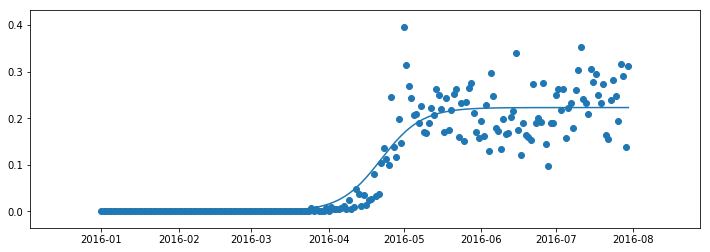

0.8612073101067137
112.92581870771771
2016-04-22
0.005576265418698068
0.21747435132922463
82.98043981348123
142.87119760195415
59.890757788472925
---
602
134 2017
[0.28434962673703257, 0.21784838316431032, 0.33902132661289064]
999999.9999915584 0.126637441532224 0.22609085920765198


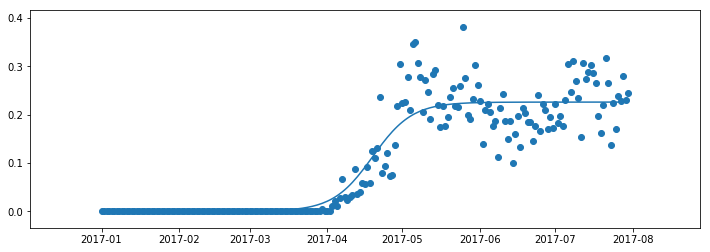

0.8668374193935007
109.09499110845788
2017-04-19
0.0056522714801913
0.22043858772746067
80.16546124901721
138.0245209678985
57.859059718881284
---
603
134 2018
[0.0005142023645944294, 0.9962469561353479, 0.7343214531096187]
999999.9999978659 0.12747262384888183 0.22031261568229865


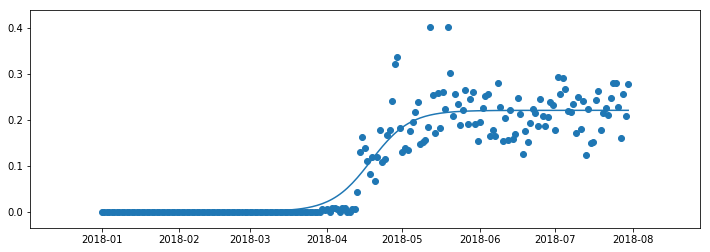

0.8736564827823134
108.38021640113378
2018-04-18
0.0055078153920574665
0.21480480029024118
79.64022866484319
137.1202041374244
57.4799754725812
---
604
134 2019
[0.5558827121768701, 0.44239536625017895, 0.32221658315585633]
999999.999999997 0.12900606137917056 0.2156652446311911


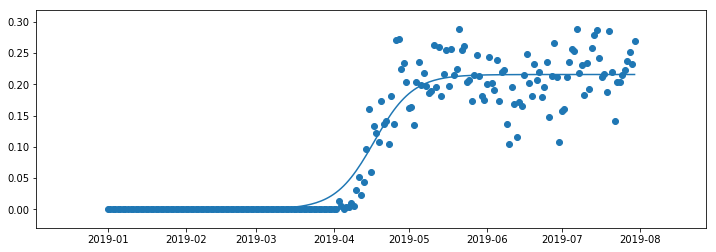

0.9150176965273693
107.0919490934473
2019-04-17
0.005391631115779778
0.21027361351541132
78.69358077676937
135.49031741012521
56.79673663335585
---
605
135 2010
[0.6674293573442105, 0.19978277225264107, 0.4389256808209361]
999999.9999987795 0.11503151270835471 0.34670335440675093


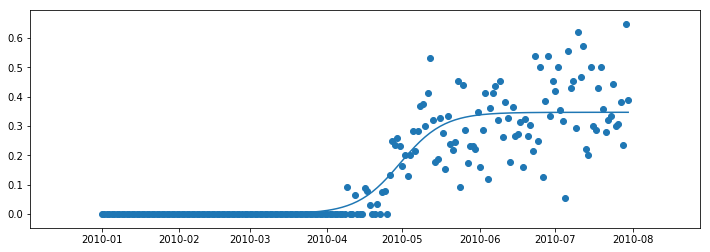

0.7947138601761001
120.10196365051918
2010-04-30
0.008667583860168774
0.3380357705465821
88.25363305072901
151.95029425030933
63.69666119958032
---
606
135 2011
[0.9886214884132468, 0.6607738006205386, 0.5291964843920692]
19911.135621563662 0.08247537442487923 0.3294835903493497


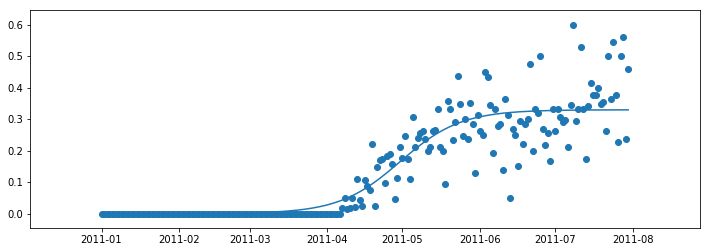

0.8256959983045667
120.02412237844406
2011-04-30
0.008237089758733744
0.32124650059061594
75.6040555199842
164.44418923690387
88.84013371691967
---
607
135 2012
[0.7833662435331818, 0.07183830755870946, 0.6175988180225507]
999999.9999998034 0.12370006707602133 0.29902691677590204


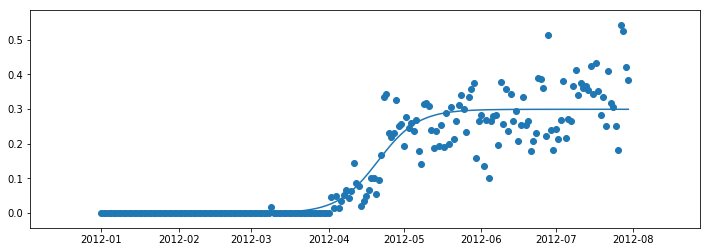

0.849708742559663
111.68555429702067
2012-04-21
0.007475672919397551
0.2915512438565045
82.06906553733259
141.30204305670878
59.23297751937619
---
608
135 2013
[0.8633990851739807, 0.6691321981850081, 0.6787551925201609]
999999.9999992885 0.12487606903887859 0.2644626046420138


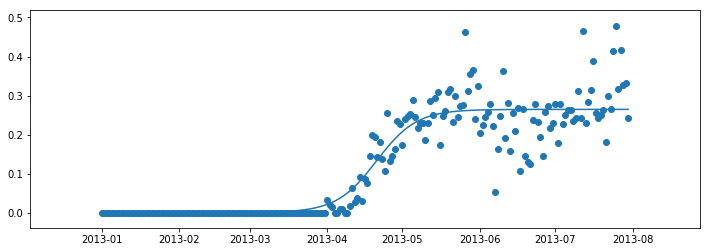

0.8581119182601434
110.6337720613409
2013-04-21
0.006611565116050346
0.25785103952596344
81.29619221656661
139.97135190611513
58.67515968954852
---
609
135 2014
[0.7101520999076628, 0.5063752206378769, 0.5797793395333075]
247099.20355666327 0.10738986423005283 0.28692612792476807


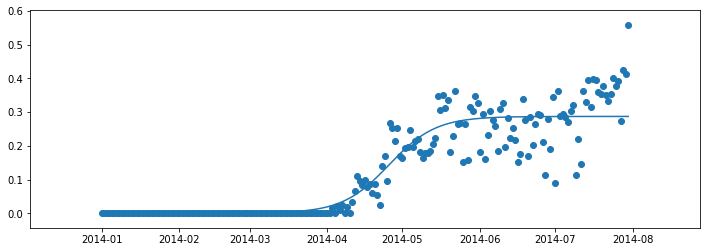

0.8487703143315883
115.63051371597187
2014-04-26
0.007173153198119202
0.27975297472664884
81.51591945331886
149.74510797862484
68.22918852530599
---
610
135 2015
[0.9926916153259092, 0.17089963090012894, 0.047233051045614705]
45114.851306424105 0.088910257557431 0.30051548854089644


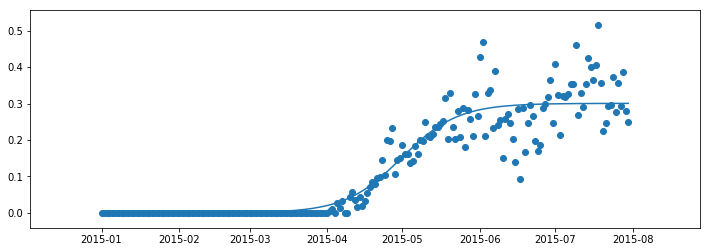

0.8807562514440131
120.5368993743127
2015-05-01
0.007512887213522411
0.29300260132737405
79.33173647437178
161.74206227425364
82.41032579988186
---
611
135 2016
[0.3806931172866376, 0.13714235173435552, 0.493116598466696]
999999.9999986059 0.11879624661793896 0.2983665116047761


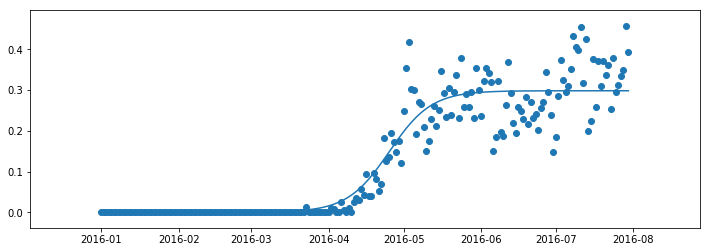

0.8870976325319593
116.29585067948311
2016-04-25
0.007459162790119403
0.2909073488146567
85.45681535278597
147.1348860061802
61.67807065339424
---
612
135 2017
[0.07086891958867225, 0.7282796314608397, 0.9555493284055543]
999999.9999999752 0.12035227408484105 0.2954294783527354


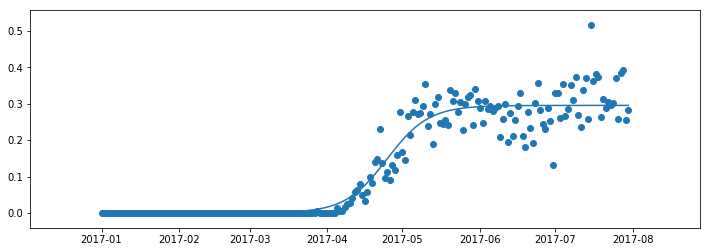

0.9221872373625378
114.79226847201203
2017-04-25
0.007385736958818386
0.28804374139391703
84.35194921766161
145.23258772636248
60.88063850870087
---
613
135 2018
[0.7604472804276545, 0.5213844698384633, 0.3107955591285564]
999999.9999992959 0.12039107234481222 0.2581211185320808


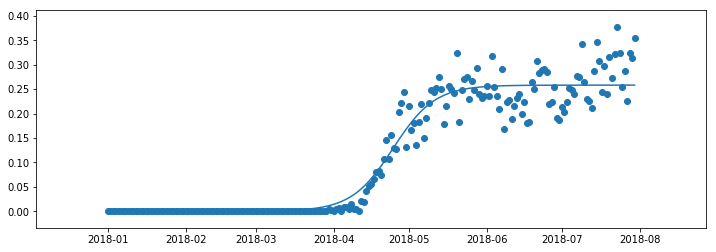

0.9388964208104256
114.75527453061095
2018-04-25
0.006453027963302021
0.25166809056877876
84.32476523473197
145.18578382648988
60.86101859175791
---
614
135 2019
[0.5615550421630657, 0.046374023631782, 0.4512434103504914]
999999.9999980935 0.12499647309513785 0.23765607570085154


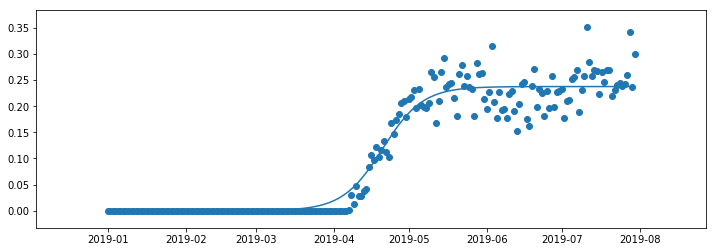

0.9478836028750078
110.52720301513665
2019-04-21
0.0059414018925212884
0.23171467380833025
81.21788287662984
139.83652315364347
58.618640277013625
---
615
136 2010
[0.6713818404436337, 0.6068214659583925, 0.592020383211883]
999999.9999970318 0.1208882347564261 0.1909008099442846


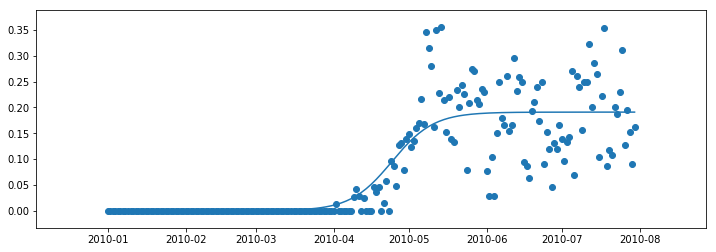

0.7379228921281564
114.28333440220831
2010-04-24
0.0047725202486071155
0.1861282896956775
83.97797297881388
144.58869582560277
60.61072284678889
---
616
136 2011
[0.62985443466213, 0.7775998878230299, 0.6689361741327448]
999999.9023390325 0.1200487954893039 0.1890518867956886


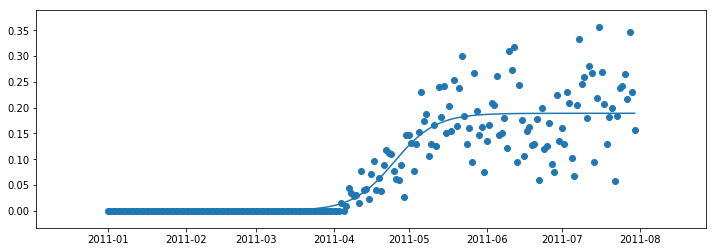

0.7886838704763806
115.08245796213951
2011-04-25
0.004726297169892216
0.18432558962579637
84.56518678755234
145.5997291367267
61.03454234917436
---
617
136 2012
[0.7501933084823389, 0.2741914452732027, 0.5838233721183462]
999999.99997608 0.1278420572275955 0.20076726106033202


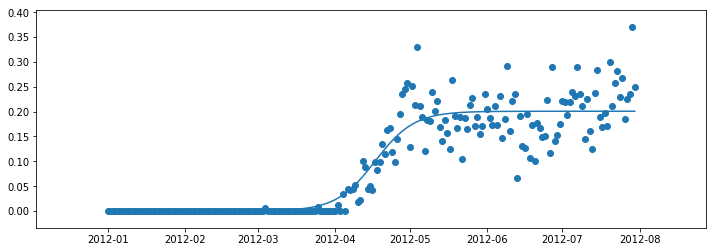

0.8618130859435693
108.0670231498605
2012-04-17
0.005019181526508301
0.19574807953382373
79.41008719640148
136.72395910331954
57.31387190691807
---
618
136 2013
[0.8056046898216228, 0.7015751699747552, 0.9091671509077607]
273375.6319770341 0.1086544104939448 0.20614056678317977


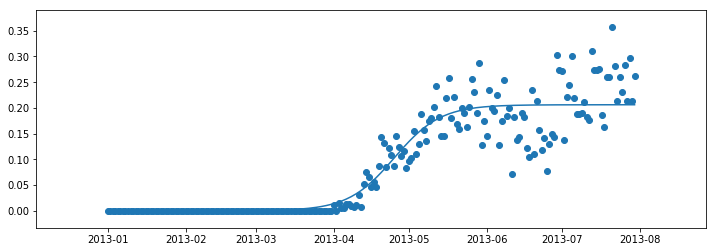

0.8643365560195236
115.21485425971498
2013-04-25
0.005153514169579494
0.20098705261360028
81.4972938820457
148.9324146373843
67.43512075533862
---
619
136 2014
[0.6629046901358817, 0.2930717099072768, 0.20230323469216505]
232370.81565131666 0.10440317752690466 0.22311698327073637


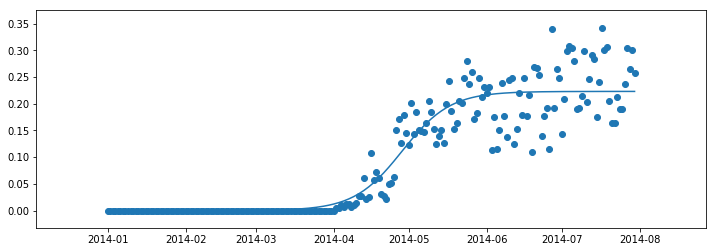

0.883464593232069
118.34974768653669
2014-04-28
0.005577924581768409
0.21753905868896795
83.25922905566887
153.44026631740442
70.18103726173555
---
620
136 2015
[0.3227824697226096, 0.8975040901629634, 0.3109762517243778]
35719.27130547287 0.08566025141632888 0.24378948440383386


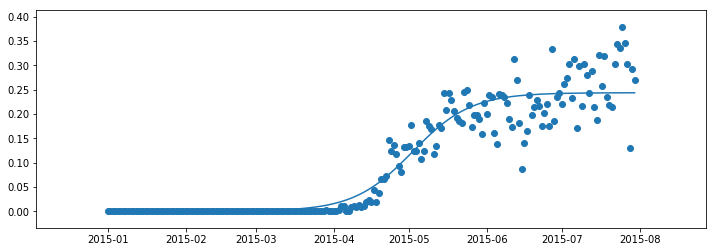

0.9028892698712918
122.38401663856457
2015-05-02
0.006094737110095847
0.23769474729373802
79.61550282316752
165.15253045396165
85.53702763079413
---
621
136 2016
[0.21337788905576416, 0.9023995762778276, 0.16043281495634643]
999999.9999999033 0.1149425798000728 0.22316228231902818


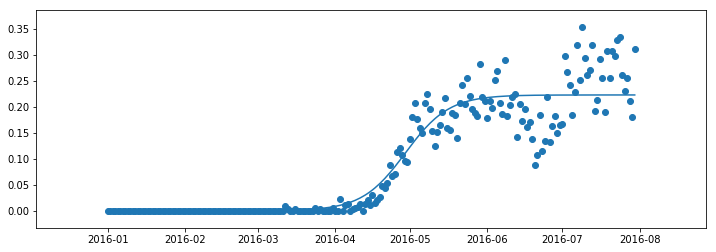

0.886942663366791
120.19488845643107
2016-04-29
0.005579057057975705
0.21758322526105248
88.32191629500994
152.06786061785223
63.74594432284229
---
622
136 2017
[0.3844919472471886, 0.3164595492592265, 0.19856988923859475]
999999.9999755153 0.115905717794279 0.2349039681885719


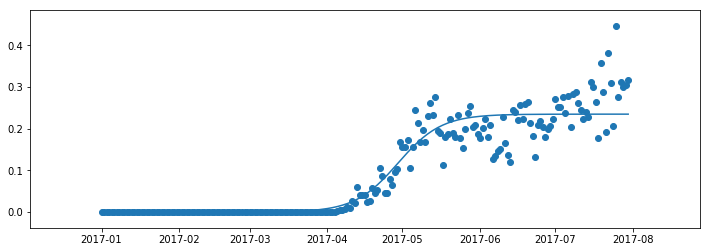

0.8906012723143318
119.19610887929561
2017-04-29
0.005872599204714298
0.2290313689838576
87.58799052371887
150.80422723487231
63.21623671115344
---
623
136 2018
[0.702350437589699, 0.866656492148389, 0.7399253025082593]
8731.551335031441 0.07327985015161852 0.23994665578524588


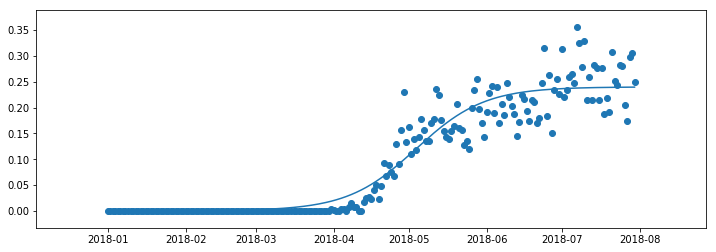

0.9146320459983799
123.83620211938198
2018-05-04
0.005998666394631147
0.23394798939061473
73.84208179094773
173.8303224478163
99.98824065686856
---
624
136 2019
[0.8441947019252191, 0.6351479812972808, 0.8143341286607667]
999999.9999999591 0.12176507317587758 0.20766638855980066


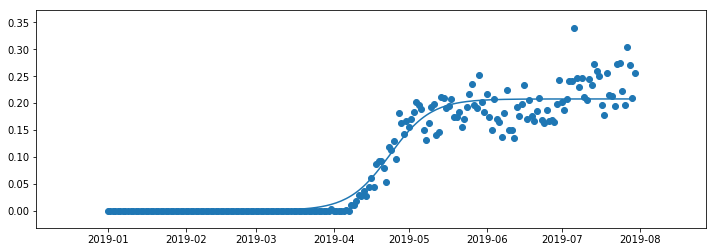

0.9335755270980316
113.4603724830773
2019-04-23
0.005191659713995017
0.20247472884580564
83.37324199009927
143.54750297605534
60.17426098595607
---
625
137 2010
[0.7944079649692696, 0.6996684196250474, 0.08695949374518586]
999999.9999992356 0.11849629668497759 0.2844154662988259


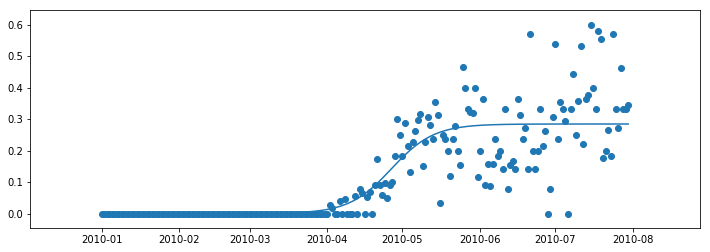

0.6992116760539442
116.59023061870064
2010-04-27
0.007110386657470648
0.27730507964135526
85.67313237495362
147.50732886244762
61.834196487494
---
626
137 2011
[0.7920511713421716, 0.7650154115351598, 0.7494701984096761]
827915.4768340598 0.1131655828471423 0.35890797854189477


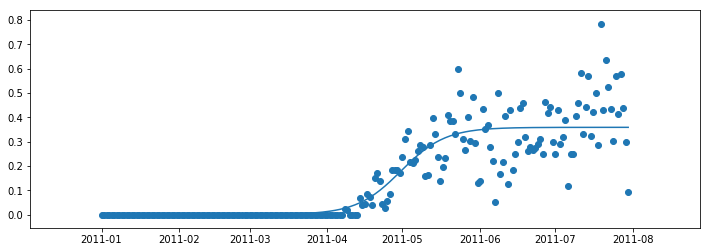

0.7850829233423731
120.41352153370353
2011-04-30
0.00897269946354737
0.34993527907834737
88.04005997447504
152.78698309293193
64.74692311845689
---
627
137 2012
[0.9288558638352508, 0.3616999070440091, 0.4586367173934125]
999999.9999921982 0.12076809298810254 0.32482292228516235


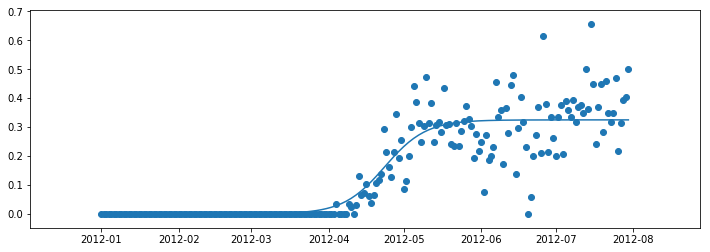

0.8053707800561467
114.39702504300955
2012-04-23
0.00812057305712906
0.3167023492280333
84.06151542714966
144.73253465886947
60.67101923171981
---
628
137 2013
[0.4997100436240326, 0.6148990294739701, 0.1963026523023278]
4665.126322087134 0.0679471978573619 0.32710648385785185


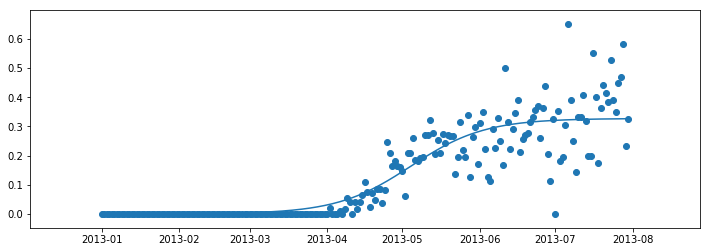

0.7992228529834802
124.3299276202477
2013-05-04
0.008177662096446296
0.3189288217614055
70.41215379504338
178.24770144545195
107.83554765040857
---
629
137 2014
[0.5533161213375827, 0.002384582443193395, 0.8824986159202954]
55320.96912079743 0.08731334381040266 0.3357558157705833


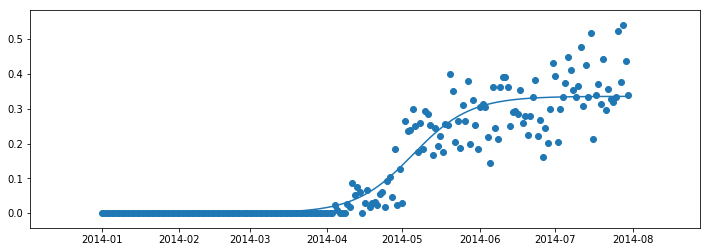

0.8799947219913333
125.07718554213366
2014-05-05
0.008393895394264583
0.32736192037631867
83.1184025400198
167.03596854424745
83.91756600422765
---
630
137 2015
[0.7373644855686813, 0.3425492236829122, 0.38748804687180793]
297044.84692371974 0.10369842830697863 0.3151385005632201


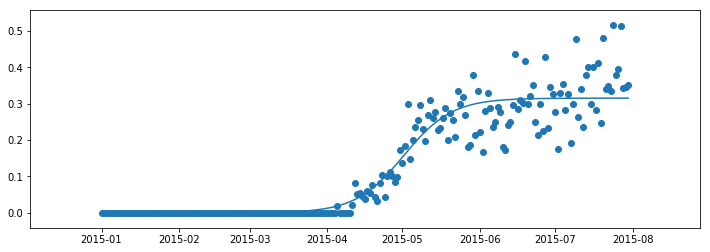

0.8951031132266225
121.52198072688273
2015-05-02
0.007878462514080503
0.3072600380491396
86.19298195667572
156.85097949708967
70.65799754041394
---
631
137 2016
[0.5586627090084824, 0.7586591959810748, 0.14166291466393777]
1956.968837923551 0.0577171808576933 0.3524997660096194


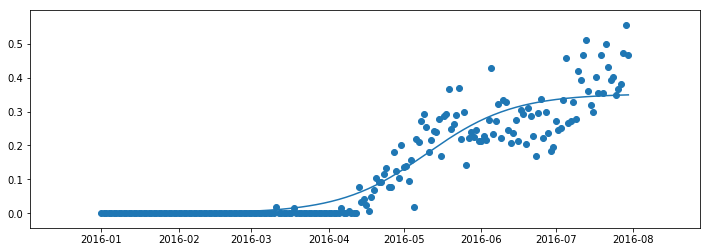

0.8735524578105208
131.31535413285724
2016-05-10
0.008812494150240486
0.3436872718593789
67.84098494697349
194.78972331874104
126.94873837176755
---
632
137 2017
[0.2238620949920307, 0.8509312247016861, 0.8546801327785386]
953397.4153525007 0.11595246304496638 0.3448212830431825


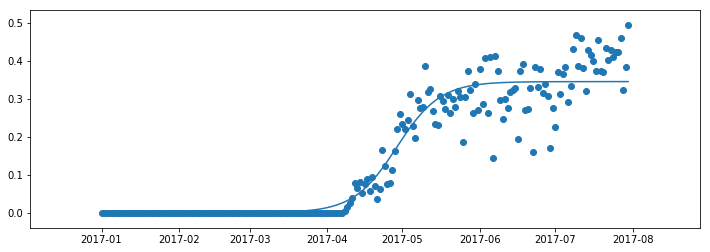

0.9173732833356649
118.73647828792487
2017-04-29
0.008620532076079563
0.33620075096710295
87.1411024768141
150.33185409903567
63.19075162222157
---
633
137 2018
[0.42950465623385614, 0.011655760486483202, 0.23753856996281386]
999999.9999999985 0.1157398922524218 0.31214941778772665


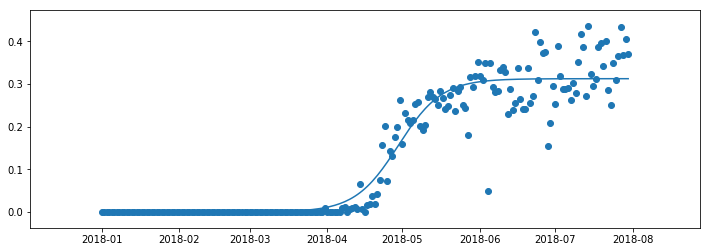

0.9214495363311483
119.36688629218236
2018-04-29
0.007803735444693167
0.3043456823430335
87.71348162044104
151.02029096392374
63.3068093434827
---
634
137 2019
[0.07022879905070212, 0.3179092864937586, 0.2799668525116793]
999999.9999905964 0.12150182582838936 0.2612162274097971


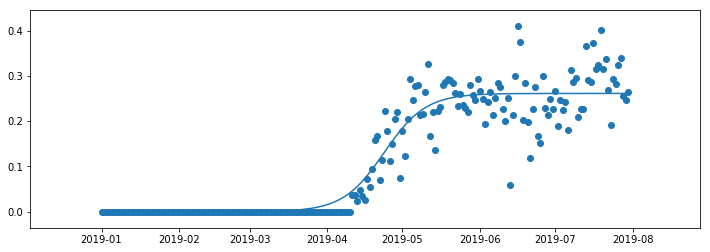

0.8964940249978057
113.70619711894753
2019-04-24
0.006530405685244928
0.2546858217245522
83.55387947967101
143.858514758224
60.30463527855299
---
635
140 2010
[0.3589641749437331, 0.4318291686766821, 0.32825622215175965]
316371.4425903968 0.11913608961883473 0.10383099031446665


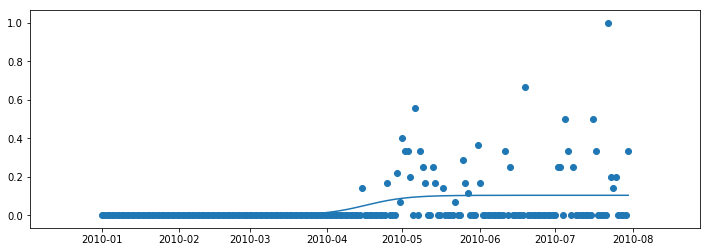

0.1400483043122016
106.30424663107591
2010-04-16
0.002595774757861666
0.10123521555660497
75.55318154365459
137.05531171849717
61.50213017484258
---
636
140 2011
[0.05111028335128376, 0.5276759104096265, 0.6161393602233509]
4302.766519209325 0.08475482221137827 0.09620738619169528


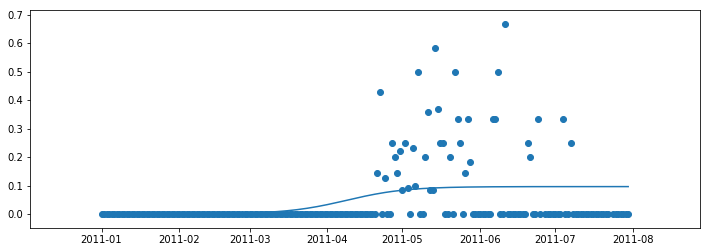

0.14107873640242352
98.72020556537403
2011-04-09
0.002405184654792382
0.0938022015369029
55.494799027528494
141.94561210321962
86.45081307569112
---
637
140 2012
[0.37337626756900644, 0.9124658872228445, 0.5848778069194389]
999999.9999140672 0.123940485616547 0.3071582116249143


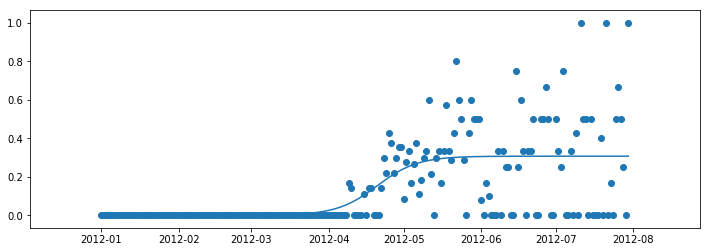

0.4089447505802112
111.46890775159159
2012-04-20
0.007678955290622858
0.29947925633429145
81.90986876683121
141.027946736352
59.11807796952078
---
638
140 2013
[0.08015839251020795, 0.5131445508140782, 0.4085459487937565]
999999.9999980227 0.11935576950338733 0.23193212131531774


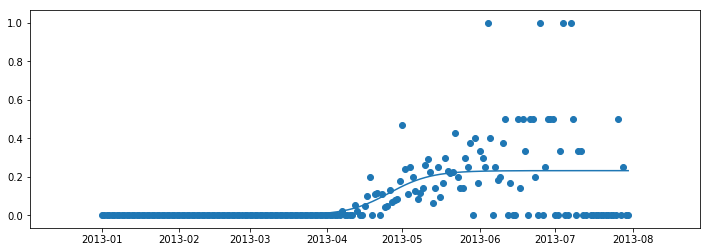

0.31872374446740015
115.75067225862266
2013-04-26
0.005798303032882944
0.22613381828243478
85.05620594691518
146.4451385703301
61.38893262341492
---
639
140 2014
[0.134228812753455, 0.5735494291891048, 0.9779903046429774]
999999.9999509999 0.12274994573580462 0.20848695038229423


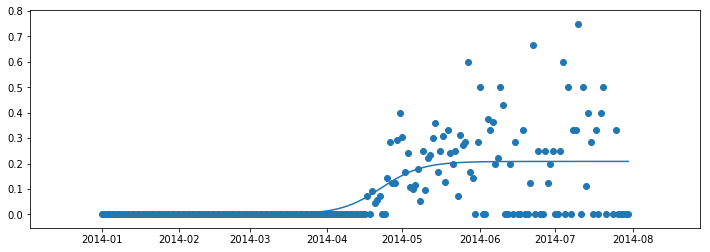

0.3931071749041495
112.55003393362367
2014-04-23
0.005212173759557356
0.20327477662273688
82.70430468161446
142.39576318563292
59.691458504018456
---
640
140 2015
[0.2951667307115857, 0.2899611742787047, 0.7020280561177024]
999999.9999590622 0.1273243517290126 0.15860766622671285


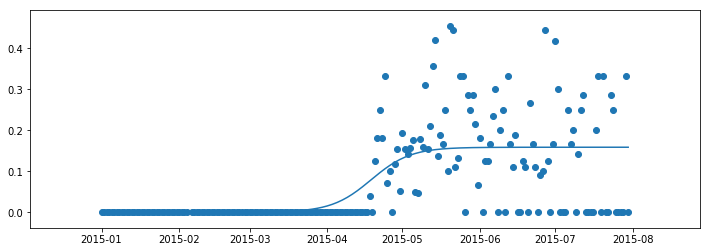

0.4149782454808886
108.50642764180108
2015-04-19
0.003965191655667821
0.15464247457104502
79.7329715324239
137.27988375117823
57.54691221875433
---
641
140 2016
[0.9120963745047883, 0.6514287321227168, 0.46922498046463235]
999999.999999835 0.11714026933998307 0.22682369649104808


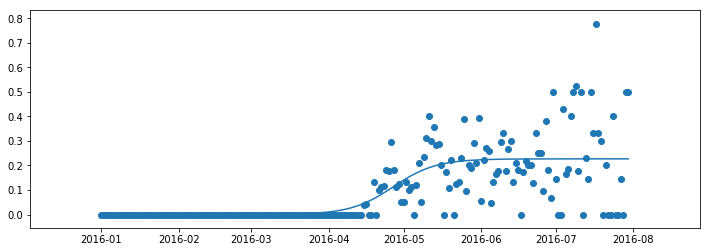

0.5155039748283474
117.93989066105476
2016-04-27
0.005670592412276202
0.22115310407877187
86.6648930298245
149.214888292285
62.5499952624605
---
642
140 2017
[0.5552898709062617, 0.28881114914445016, 0.052477330553381885]
999999.9999748849 0.11863601864540196 0.22570690989659334


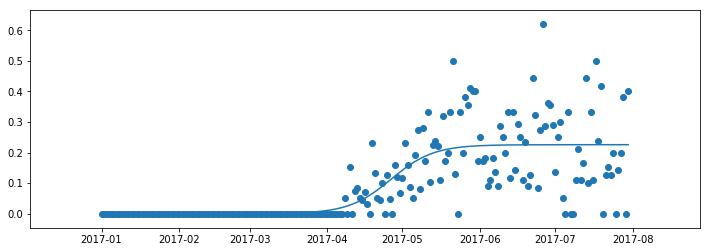

0.5789286095094728
116.452918057147
2017-04-26
0.005642672747414834
0.2200642371491785
85.57223200614358
147.33360410815038
61.7613721020068
---
643
140 2018
[0.9512922233021649, 0.9059532293583558, 0.8044744285475615]
999999.9999829119 0.11435769209396839 0.2749499061473011


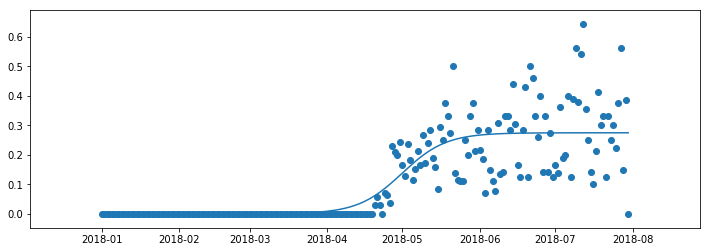

0.6948387756849828
120.80963077319626
2018-05-01
0.006873747653682528
0.26807615849361854
88.77364282129464
152.84561872509786
64.07197590380322
---
644
140 2019
[0.44703246209989056, 0.32694028922717033, 0.9023715671394722]
999999.9999989382 0.1177398676494965 0.22824944329862368


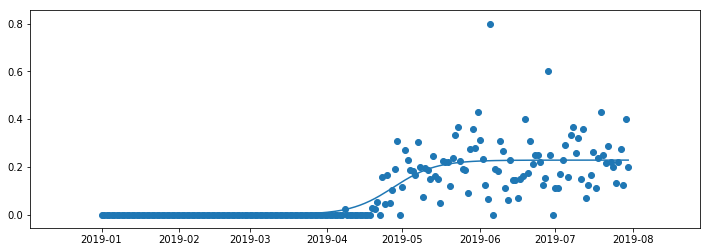

0.638061490026502
117.3392737206996
2019-04-27
0.0057062360824655925
0.22254320721615808
86.22354614883058
148.45500129256862
62.231455143738046
---
645
141 2010
[0.8187307951653623, 0.42943789255619524, 0.5474785265881515]
999999.9999934608 0.12103628488434894 0.5300674015708167


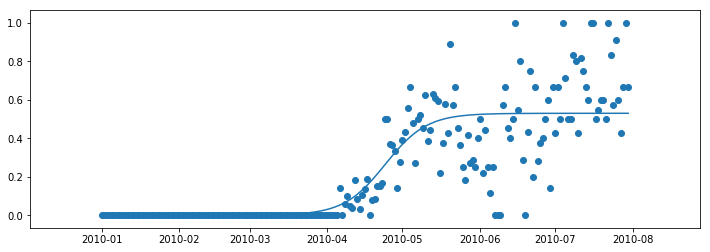

0.7014920453665621
114.14354440206553
2010-04-24
0.013251685039270418
0.5168157165315462
83.8752521322705
144.4118366718605
60.536584539589995
---
646
141 2011
[0.8270578220428968, 0.29141580956106183, 0.1466457807587075]
999999.9999999999 0.12404020336752625 0.4495124780129162


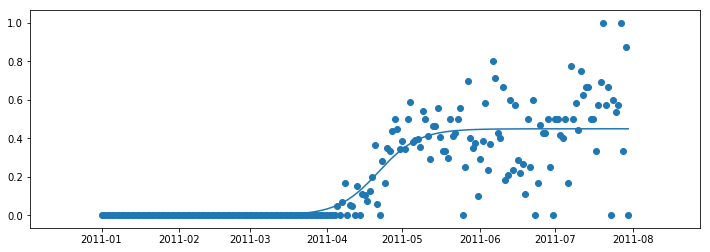

0.693134017829738
111.37929625146985
2011-04-21
0.011237811950322906
0.4382746660625933
81.8440202145977
140.91457228834196
59.07055207374425
---
647
141 2012
[0.07847438954687136, 0.9779672178731289, 0.022294382345358077]
127523.76723978732 0.10416297035174725 0.43303769535472864


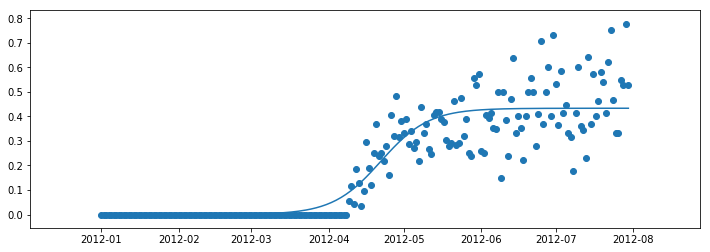

0.8341586478549783
112.86216201624579
2012-04-22
0.010825942383868217
0.4222117529708604
77.69072216810986
148.0336018643817
70.34287969627184
---
648
141 2013
[0.5250182731567024, 0.828549334449451, 0.4865071601629669]
796844.7963683973 0.11514830930962656 0.384448487433727


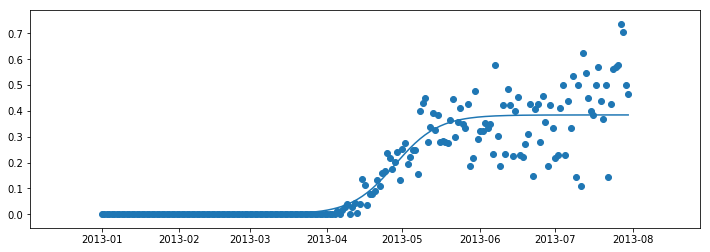

0.8202434755056326
118.00794371609652
2013-04-28
0.009611212185843175
0.3748372752478838
86.19191734024625
149.82397009194676
63.63205275170051
---
649
141 2014
[0.1553512419762373, 0.13488194564630707, 0.938478655550626]
9661.28304699832 0.07486307851366397 0.4196641053747296


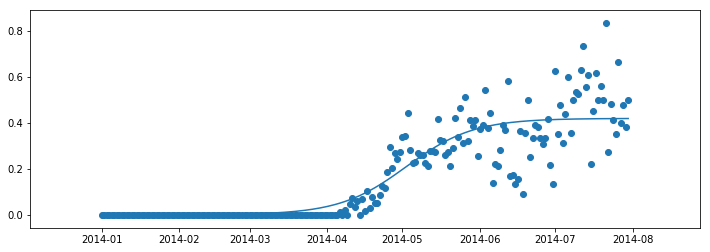

0.7986877313394396
122.56885398203536
2014-05-03
0.010491602634368241
0.4091725027403613
73.63202532275209
171.5056826413186
97.87365731856652
---
650
141 2015
[0.5061056502506041, 0.2568269496807346, 0.7458864759660461]
999999.9998252274 0.11906603747054047 0.3301404633402394


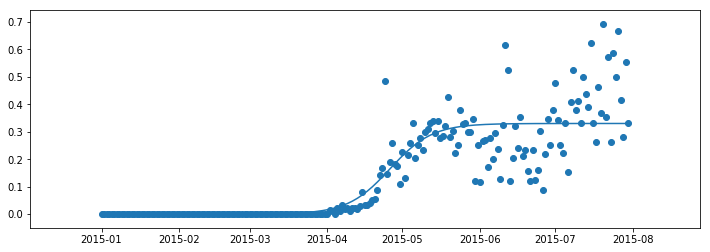

0.7537237141901898
116.03233677116164
2015-04-26
0.008253511583505985
0.3218869517567334
85.26317938624328
146.80149415607994
61.53831476983666
---
651
141 2016
[0.17347635316206855, 0.6400517057383591, 0.4920773172350853]
999999.9999990759 0.1220105806155815 0.34187500857039316


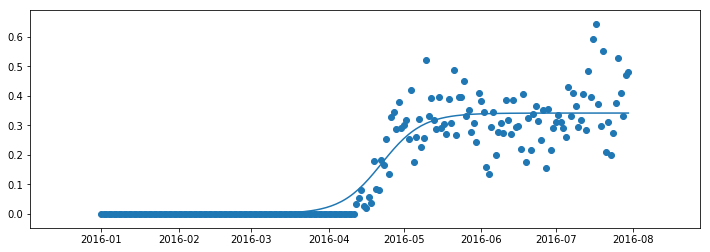

0.8527643923850934
113.23206961445297
2016-04-22
0.00854687521425983
0.3333281333561333
83.20547989046483
143.25865933844105
60.05317944797622
---
652
141 2017
[0.10331752745938305, 0.9058356903592053, 0.5179070209848369]
939419.137548528 0.12117711517057249 0.3354309751477425


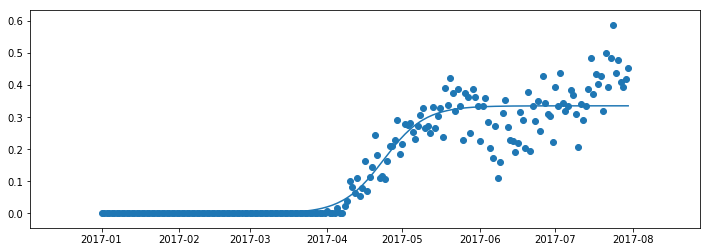

0.885427531596493
113.49516783846533
2017-04-23
0.008385774378693563
0.3270452007690489
83.26205293906615
143.72828273786448
60.466229798798324
---
653
141 2018
[0.1111128974179002, 0.05575726828135885, 0.5687583372036024]
999999.9999999965 0.11931112467792562 0.3058172880448847


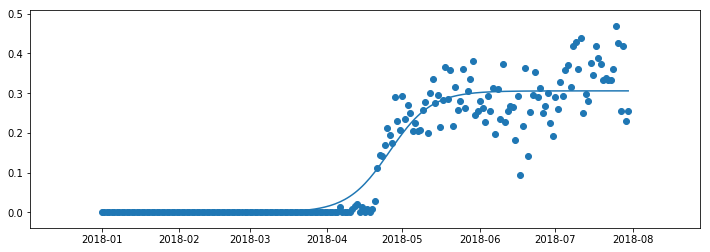

0.8999423030731307
115.79398480450625
2018-04-26
0.007645432201122119
0.2981718558437626
85.08803298300388
146.49993662600858
61.41190364300469
---
654
141 2019
[0.30818909785072746, 0.6499054594417019, 0.7931944998104303]
999999.9999969592 0.12367723142069137 0.25942450436016207


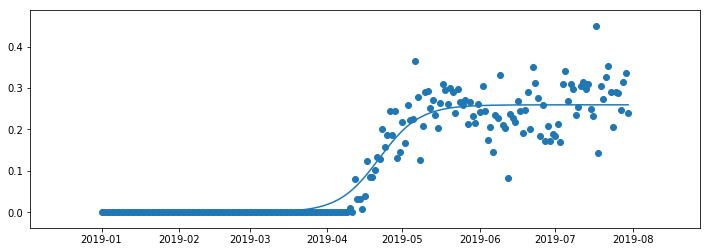

0.8977173633175342
111.70617581960101
2019-04-22
0.006485612609004052
0.252938891751158
82.08421869745341
141.32813294174866
59.243914244295254
---
655
142 2010
[0.5649660437823698, 0.6541804414328358, 0.8402330288138831]
999999.9999918432 0.12647285458570015 0.4324329568518044


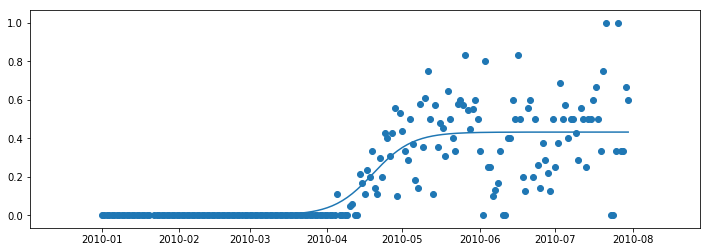

0.6565637916196478
109.23696316662554
2010-04-19
0.01081082392129511
0.42162213293050926
80.26978552102925
138.20414081222185
57.9343552911926
---
656
142 2011
[0.8963084151513904, 0.42355575300488113, 0.1013037422718045]
999999.9954808381 0.12003865358987831 0.44292852008940004


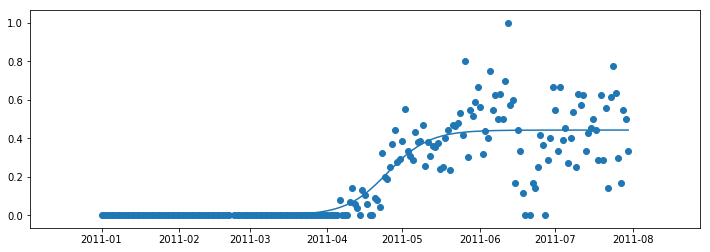

0.7399008336757569
115.09218189539939
2011-04-25
0.011073213002235002
0.431855307087165
84.57233235887846
145.6120314319203
61.03969907304183
---
657
142 2012
[0.4656048757976129, 0.8875354430302586, 0.11858327291633097]
999999.9999848121 0.11966158192471296 0.45916477512921766


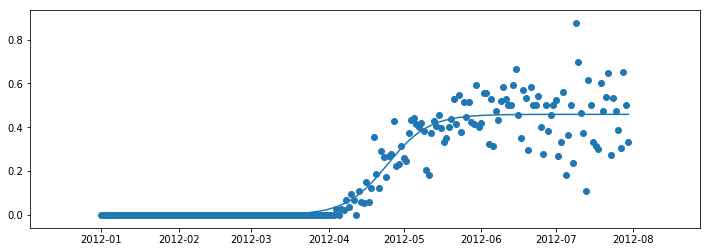

0.8684197869318877
115.45485473057961
2012-04-24
0.011479119378230443
0.44768565575098723
84.83883255201076
146.0708769091485
61.23204435713774
---
658
142 2013
[0.1739124825996654, 0.7894914428166515, 0.12464106179221945]
999999.9999999694 0.11965231108083299 0.3632341210914113


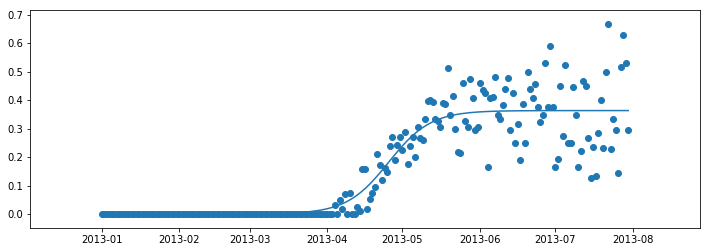

0.8330902013224429
115.46380034925492
2013-04-25
0.009080853027285283
0.354153268064126
84.84540599450928
146.08219470400059
61.23678870949131
---
659
142 2014
[0.652398370733458, 0.8240039295751538, 0.04968808691655113]
999999.9999998481 0.11737256855956542 0.38926486358720214


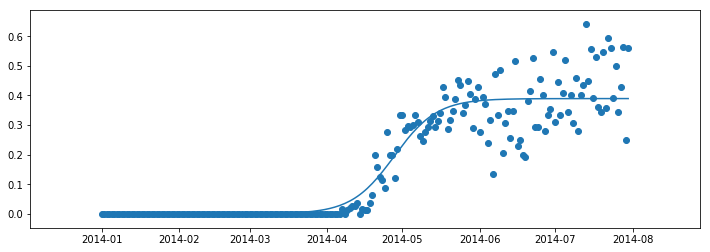

0.8814433722838332
117.7064686196493
2014-04-28
0.009731621589680054
0.3795332419975221
86.49336924651574
148.91956799278287
62.42619874626713
---
660
142 2015
[0.7079521278780427, 0.6243304647244671, 0.01949344676268916]
999999.9999971145 0.11881502693433284 0.3645771732713359


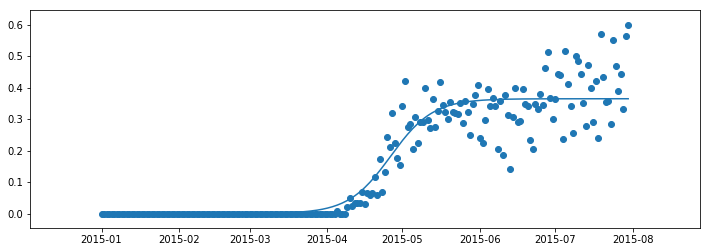

0.8881479994219831
116.27746855283718
2015-04-26
0.009114429331783398
0.35546274393955246
85.44330775132141
147.11162935435289
61.66832160303147
---
661
142 2016
[0.39596646977119343, 0.02255768154937554, 0.740419609416017]
999999.9999989907 0.12040816133718171 0.35326060353580185


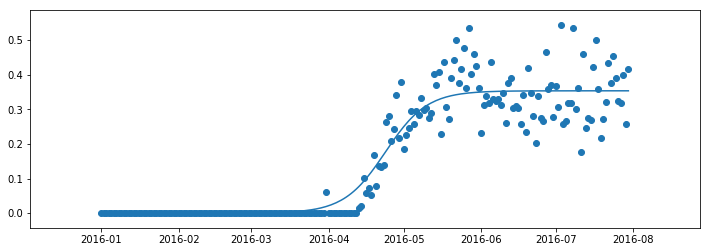

0.8981460445042797
114.73898782720697
2016-04-24
0.008831515088395046
0.3444290884474068
84.31279739755252
145.16517825686137
60.85238085930885
---
662
142 2017
[0.6217161815580231, 0.8498684589120562, 0.3127454712255472]
20300.3681559885 0.0821242770053486 0.413761324574211


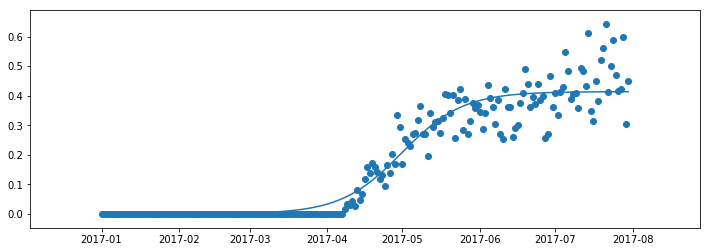

0.9209303292209449
120.77298774858549
2017-05-01
0.010344033114355276
0.4034172914598557
76.16301637689176
165.38295912027925
89.21994274338749
---
663
142 2018
[0.1828022236051906, 0.043022343967666465, 0.9144197762113081]
20192.903895997948 0.07951661509752068 0.43955389922463983


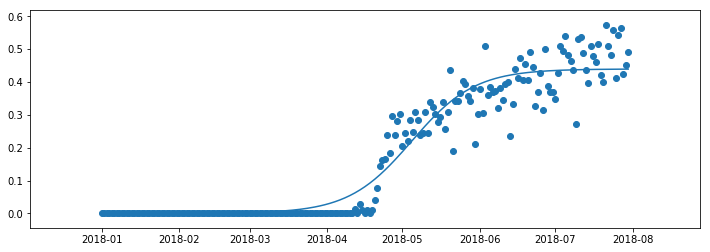

0.9338944724857934
124.66685757733504
2018-05-05
0.010988847480615996
0.4285650517440238
78.59395015243291
170.73976500223714
92.14581484980422
---
664
142 2019
[0.4753720891180201, 0.7185743634219074, 0.25475097620738696]
614186.5534454084 0.11577717552886554 0.3612595813687535


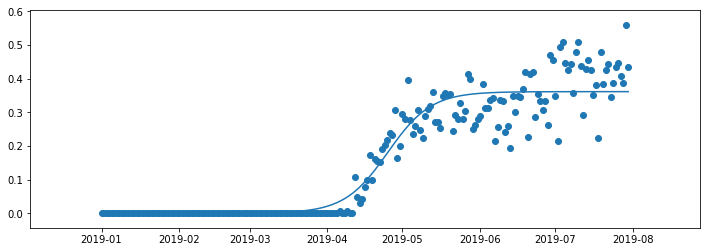

0.9109236508630524
115.1181477097912
2019-04-25
0.009031489534218838
0.3522280918345347
83.47493626163968
146.76135915794276
63.28642289630308
---
665
143 2010
[0.6025948273609425, 0.2294295871038975, 0.8357136886688143]
181.74304494960603 0.03927515103254295 0.26393658963067823


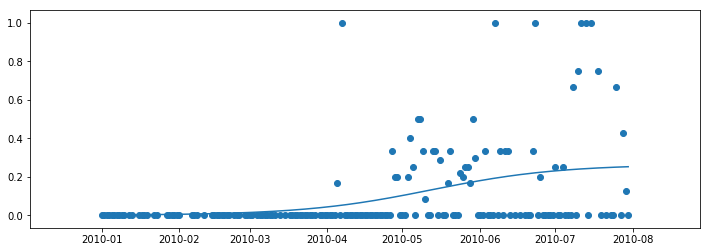

0.1656350165827256
132.46527923580163
2010-05-12
0.006598414740766956
0.2573381748899113
39.185901567869536
225.74465690373378
186.55875533586425
---
666
143 2011
[0.1356048051585772, 0.9576045344594707, 0.8569924915206526]
999999.9997094047 0.12301192382813735 0.1836643697781109


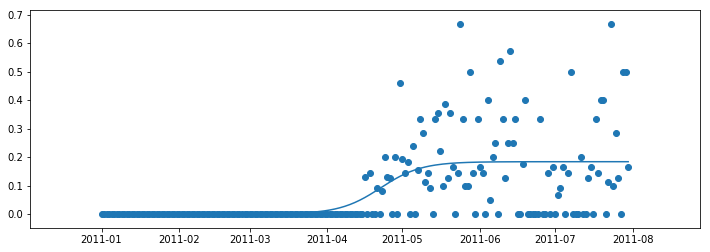

0.3525220412514125
112.31033649205935
2011-04-22
0.004591609244452773
0.17907276053365812
82.52816959214086
142.0925033919778
59.564333799836945
---
667
143 2012
[0.45299118078713807, 0.39975650489751324, 0.5647754901010205]
999999.9999728492 0.12899074750672015 0.20982345766551916


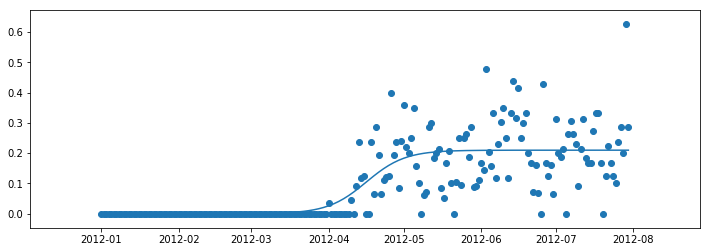

0.5995531085933264
107.10466312490641
2012-04-16
0.00524558644163798
0.20457787122388119
78.70292333392813
135.50640291588473
56.80347958195661
---
668
143 2013
[0.27906197330254856, 0.532998017439244, 0.5626080817072682]
999999.9999094512 0.12279940829878476 0.17150989680084952


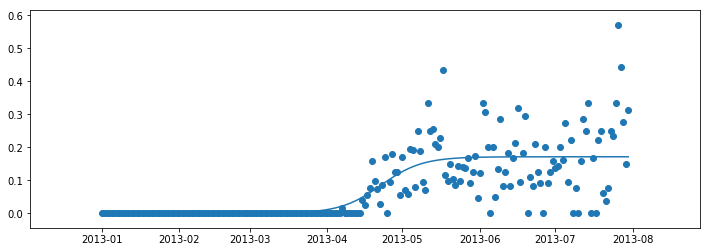

0.5574566030863131
112.5046997316065
2013-04-23
0.004287747420021238
0.16722214938082827
82.67099208689382
142.3384073763191
59.66741528942529
---
669
143 2014
[0.7308522901679428, 0.4845016696203355, 0.37753295592430947]
999999.9999305835 0.11509439876311602 0.1884346671854259


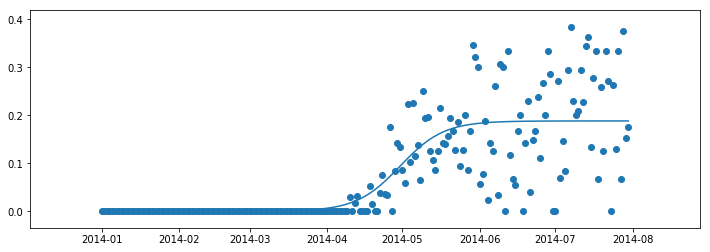

0.6305170738683625
120.03634152804902
2014-04-30
0.004710866679635647
0.18372380050579024
88.2054124341851
151.86727062191292
63.661858187727816
---
670
143 2015
[0.7161412735523531, 0.7095076821210352, 0.08022972517356042]
999999.9999698411 0.11717109336784305 0.19590272212096227


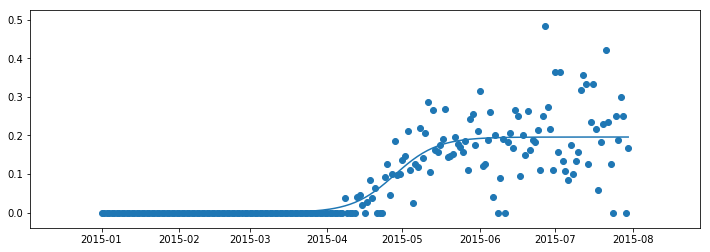

0.6962646214054219
117.90886438656126
2015-04-28
0.004897568053024057
0.19100515406793822
86.64209422313554
149.17563454998705
62.53354032685151
---
671
143 2016
[0.95836934263226, 0.21119185635808002, 0.18546080176499824]
999999.9999888643 0.11889189520820119 0.22024197041950505


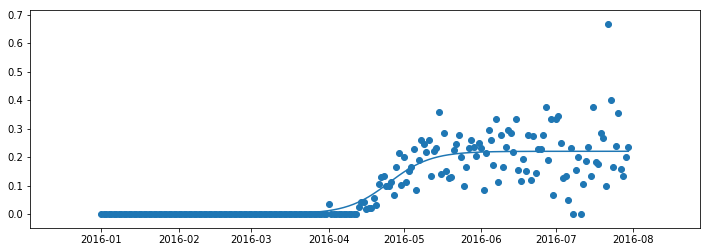

0.7232310116418057
116.2022906082848
2016-04-25
0.005506049260487627
0.2147359211590174
85.38806530121835
147.01651591535122
61.62845061413287
---
672
143 2017
[0.09694116870223535, 0.5658912597262441, 0.65859528660743]
999999.9999806723 0.11873936705255671 0.21196490127546683


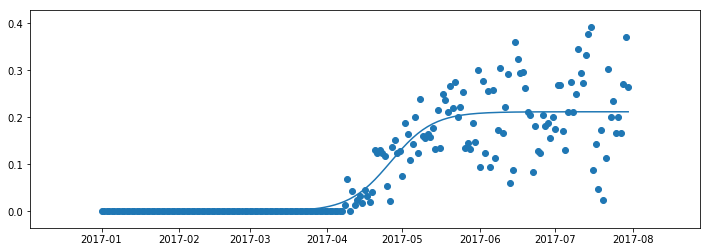

0.7811388213273804
116.3515597302274
2017-04-26
0.005299122531886671
0.20666577874358016
85.49775162033515
147.2053678401197
61.70761621978454
---
673
143 2018
[0.9020824967753112, 0.12371942604849362, 0.18029790336011864]
999999.999973651 0.11992481648909423 0.16439785398478735


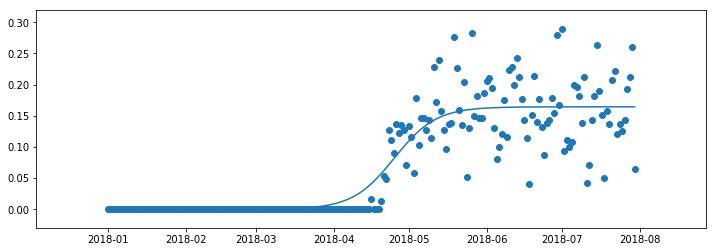

0.800030925620868
115.20143171696482
2018-04-25
0.004109946349619684
0.16028790763516765
84.65261160296609
145.7502518309635
61.0976402279974
---
674
143 2019
[0.3608274082527805, 0.9632349346169026, 0.7737208989086731]
999999.9999983185 0.12545295686892918 0.12536060135635704


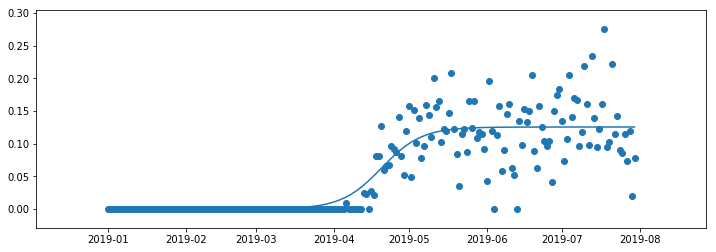

0.7449485337125099
110.12502935579884
2019-04-20
0.0031340150339089264
0.12222658632244811
80.92235659650099
139.32770211509666
58.40534551859567
---
675
144 2010
[0.11699569068596305, 0.597433808670499, 0.2811882377310543]
149.31525745908118 0.026726761754168604 0.7679299310041862


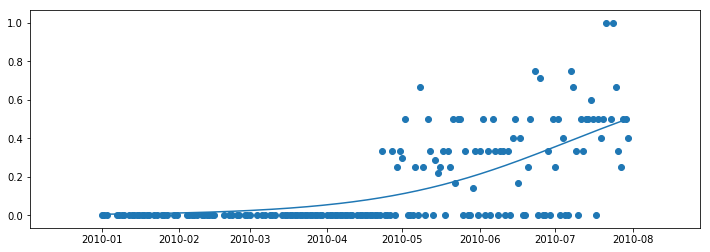

0.4618048165763382
187.30514151565282
2010-07-06
0.019198248275104655
0.7487316827290815
50.23048653773593
324.37979649356987
274.1493099558339
---
676
144 2011
[0.1785906250746887, 0.4320001958897419, 0.9822001661537]
999998.729476539 0.12554022836261458 0.1985547020309792


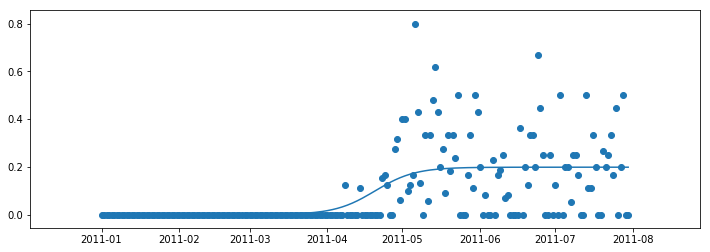

0.3621413584554025
110.04846388788484
2011-04-20
0.00496386755077448
0.1935908344802047
80.86609187922723
139.2308358965424
58.364744017315175
---
677
144 2012
[0.6096529998072766, 0.8296183534696603, 0.7371218102651094]
999999.9999945229 0.12443948081681834 0.22616634663658228


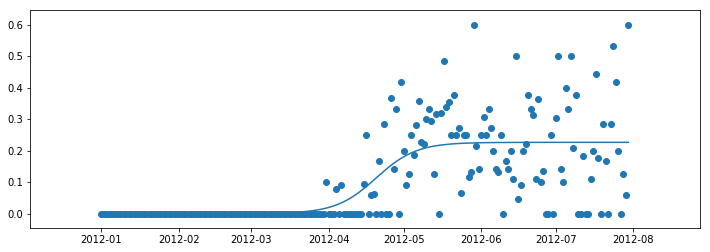

0.5075429460242101
111.02192380805556
2012-04-20
0.005654158665914557
0.2205121879706677
81.5814148788789
140.46243273723218
58.881017858353275
---
678
144 2013
[0.21247372365169404, 0.8504753499203863, 0.8396351877895913]
999999.9999906366 0.12683170941862337 0.20360081096831376


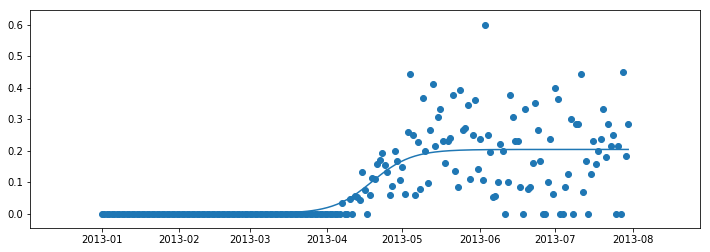

0.5524047132972878
108.9278905195163
2013-04-19
0.005090020274207845
0.1985107906941059
80.04267196555344
137.81310907347913
57.77043710792569
---
679
144 2014
[0.07716083113537653, 0.9976916299123999, 0.05030027826538297]
999999.9999991903 0.12026713835861723 0.24879582872166353


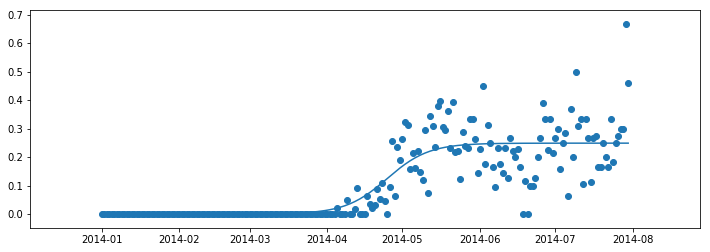

0.7117944626260005
114.87352860070419
2014-04-25
0.0062198957180415885
0.24257593300362193
84.41166099389795
145.3353962075104
60.923735213612446
---
680
144 2015
[0.7698740751718478, 0.9758049269320902, 0.15107208360694857]
999999.9998913016 0.1241143160250076 0.26041014021937603


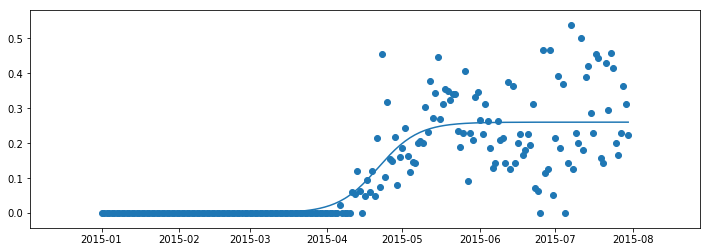

0.6907551728235762
111.31278808378488
2015-04-21
0.006510253505484401
0.25389988671389163
81.79514851196078
140.83042765560901
59.03527914364824
---
681
144 2016
[0.9509692219735911, 0.5739993426344713, 0.08214278519716822]
999999.9999987371 0.12306898926839087 0.24521915488133247


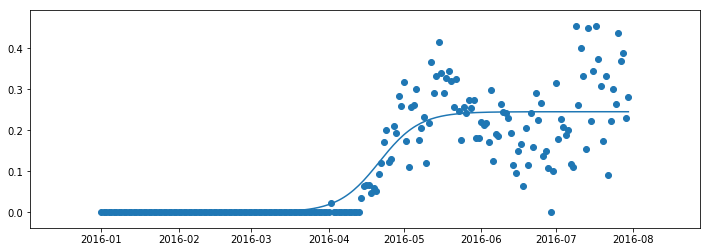

0.7622818421399871
112.25825969720056
2016-04-21
0.006130478872033312
0.23908867600929914
82.48990238876367
142.02661700563743
59.536714616873766
---
682
144 2017
[0.12337139830013966, 0.27495064393905266, 0.45250912263067744]
999999.9999743041 0.12121022170215709 0.2785088451253131


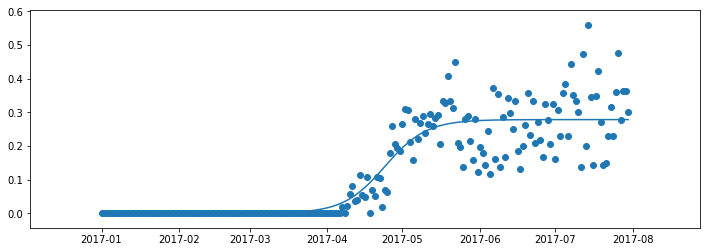

0.8120802586554391
113.9797482747506
2017-04-24
0.006962721128132828
0.27154612399718026
83.75489104173683
144.20460550776434
60.449714466027515
---
683
144 2018
[0.36831535232527945, 0.40890123251047616, 0.9174994081397437]
999999.9999998191 0.11898527020394294 0.26242360116770036


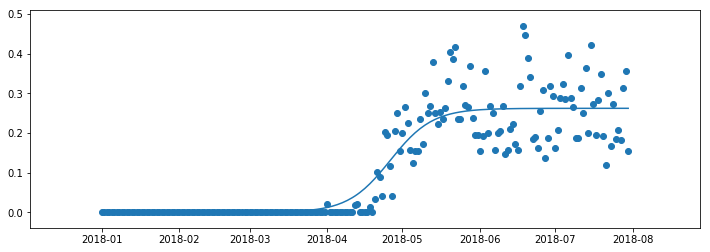

0.8272449356851104
116.11109958639463
2018-04-26
0.006560590029192509
0.25586301113850785
85.32105608058728
146.90114309220198
61.580087011614694
---
684
144 2019
[0.18354475390871217, 0.6135841165978231, 0.7451861933305203]
999999.9999940217 0.12785947789442473 0.23722162667323268


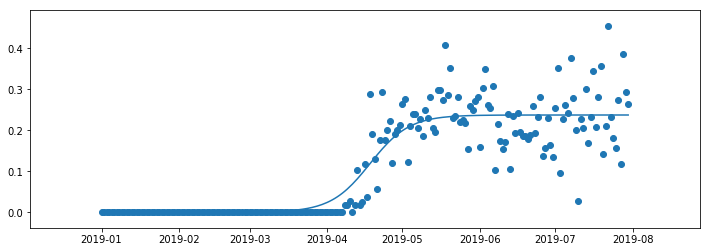

0.8189648644631426
108.05229917617798
2019-04-18
0.005930540666830818
0.23129108600640186
79.39926768832302
136.7053306640329
57.30606297570989
---
685
145 2011
[0.3201169859859463, 0.5548494399427389, 0.228521069773986]
8297.905504807639 0.09889512834646025 0.2911256412906881


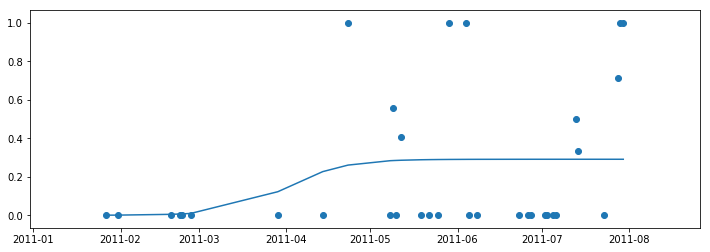

0.09472963933994816
91.24573236315537
2011-04-01
0.007278141032267202
0.28384750025842087
54.20081713441877
128.290647591892
74.08983045747323
---
686
145 2012
[0.6058427475656801, 0.3413090609835575, 0.39773481294411617]
999999.9999929427 0.11538272728934529 0.49193384213346175


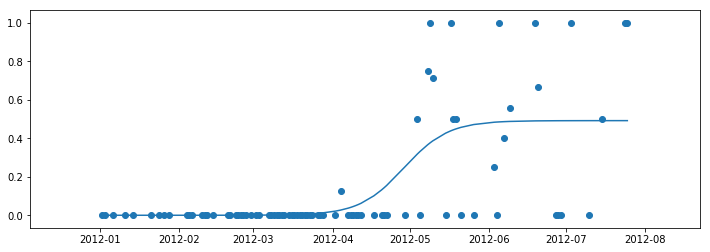

0.45636176412915763
119.73638414103402
2012-04-29
0.012298346053336545
0.4796354960801252
87.9849969776631
151.4877713044049
63.5027743267418
---
687
145 2013
[0.04053811391587281, 0.36168907707919995, 0.6762047817661908]
999999.9999958387 0.13030811875956994 0.3895880966423036


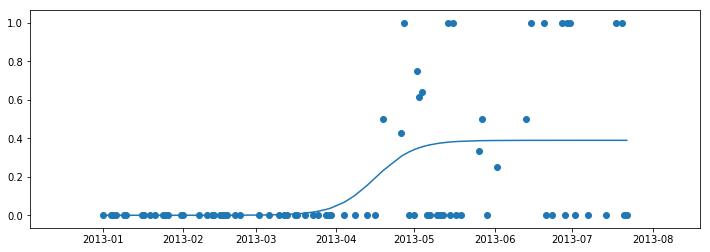

0.27822301720136833
106.02187100445336
2013-04-16
0.00973970241605759
0.379848394226246
77.90726325012577
134.136478758781
56.229215508655244
---
688
145 2014
[0.11581215998155203, 0.792300329199968, 0.20147560370878814]
999992.4291976899 0.11749223782540245 0.3326483688703411


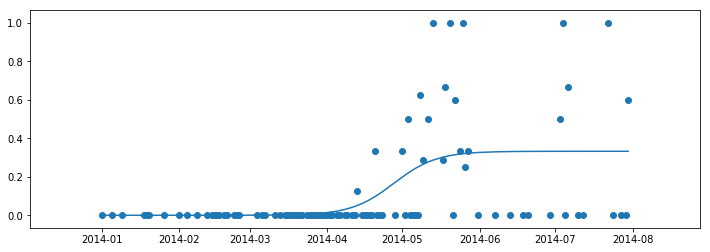

0.29715394897765135
117.58651671665002
2014-04-28
0.008316209221758528
0.3243321596485826
86.40520879421665
148.76782463908341
62.36261584486677
---
689
145 2015
[0.1780701030682308, 0.93556894333773, 0.761647287784771]
999999.9999677433 0.11428153963117113 0.33838229683142196


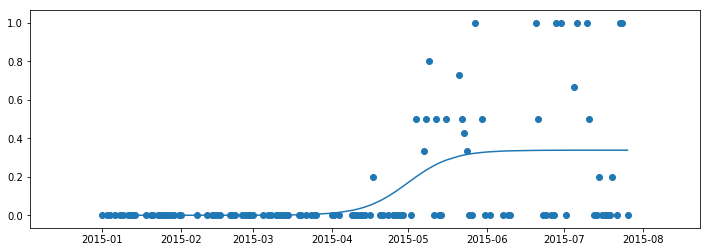

0.28026592283085505
120.89013328416635
2015-05-01
0.00845955742078555
0.3299227394106364
88.8327978828993
152.94746868543336
64.11467080253406
---
690
145 2016
[0.5990567679878351, 0.16516957692683576, 0.3317531122924877]
999999.9856303863 0.12374565490664863 0.5413509612897677


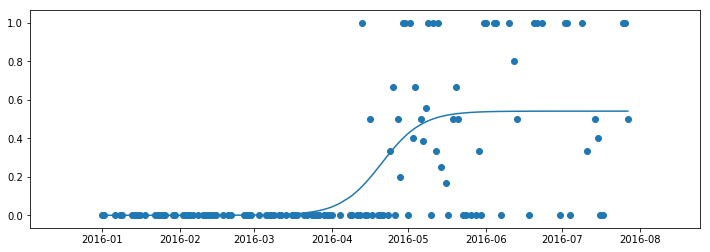

0.4194297310230283
111.64440928464776
2016-04-21
0.013533774032244192
0.5278171872575235
82.03883122299082
141.24998734630466
59.21115612331384
---
691
145 2017
[0.40263117476293575, 0.5333734082057311, 0.6036283972527106]
999999.9998368113 0.12199575540619216 0.285490666689727


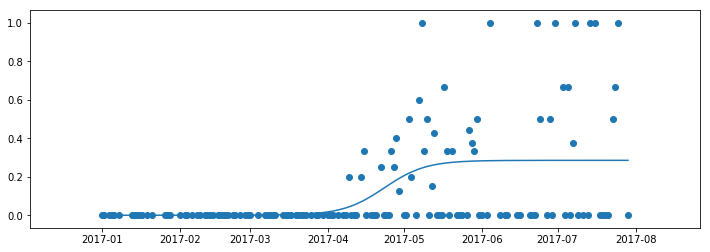

0.22628443484254268
113.24582983892773
2017-04-23
0.007137266667243175
0.2783534000224838
83.21559121356246
143.27606846429296
60.0604772507305
---
692
145 2018
[0.9995150184543716, 0.8733378148239396, 0.5626247693481884]
349.2027536275189 0.04344494851979794 0.5184525629140181


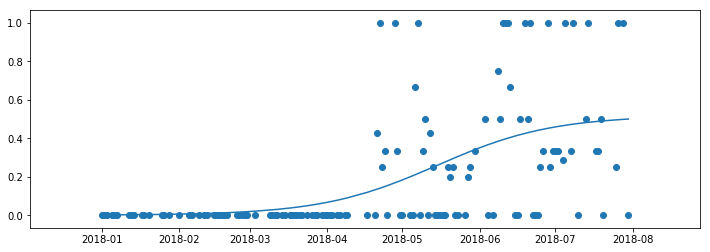

0.3294091665476172
134.7832811171866
2018-05-15
0.012961314072850453
0.5054912488411676
50.45675361629301
219.10980861808005
168.65305500178704
---
693
145 2019
[0.14681411157922597, 0.44191437178154536, 0.4512532594440093]
999811.0065451117 0.13948678112165805 0.28732906242621675


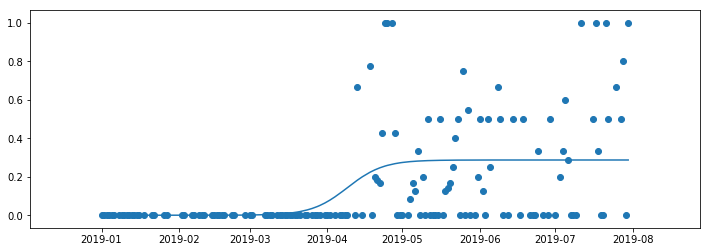

0.2433106377651879
99.04394836237836
2019-04-09
0.007183226560655419
0.28014583586556135
72.77936890424068
125.30852782051608
52.52915891627539
---
694
146 2012
[0.42673339478844396, 0.7778332209476511, 0.4728465537113311]
999930.5182603438 0.13735912048803747 0.46576825513397413


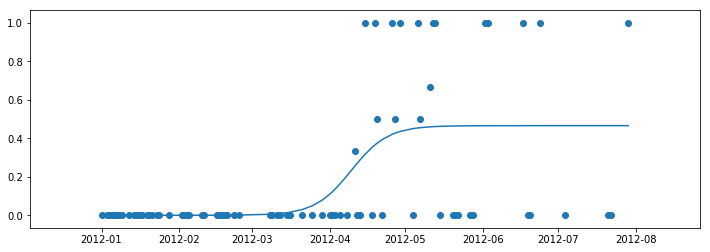

0.338218102002783
100.5789861257435
2012-04-10
0.011644206378349354
0.4541240487556248
73.90757447784566
127.25039777364137
53.34282329579571
---
695
146 2013
[0.9416963488555421, 0.3143777727624558, 0.588383658060256]
973965.5123665143 0.1308784468946946 0.35376162111375836


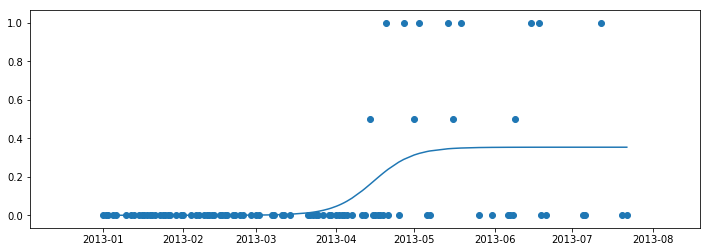

0.2646589730553264
105.35830383779424
2013-04-15
0.008844040527843959
0.3449175805859144
77.36621092216419
133.35039675342426
55.98418583126008
---
696
146 2014
[0.8626725425536225, 0.05915090283145885, 0.03934304340106176]
999999.9999689399 0.11073381448891022 0.5814588891188512


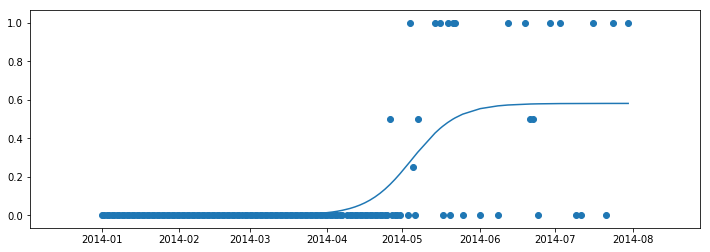

0.481833083438832
124.76324979590413
2014-05-05
0.014536472227971282
0.56692241689088
91.67885129451824
157.84764829729008
66.16879700277184
---
697
146 2015
[0.36940196020887706, 0.9543508340286103, 0.6312103761096656]
999999.995017934 0.11757058740469689 0.2970579008874633


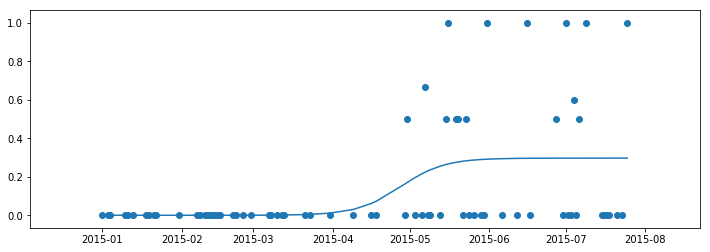

0.20569765380556693
117.50822087353357
2015-04-28
0.007426447522186583
0.28963145336527674
86.3476923178747
148.6687494291925
62.3210571113178
---
698
146 2016
[0.4157713373408831, 0.8896943550990493, 0.2979387885402639]
999999.9999991675 0.10866761851891839 0.6935593789097236


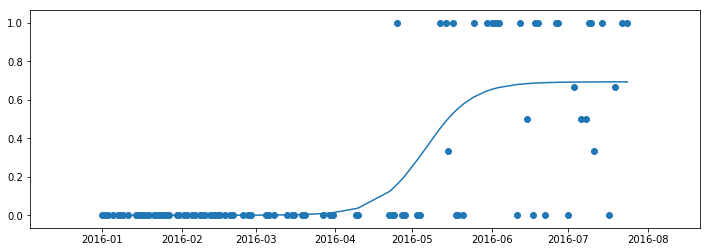

0.560977556038295
127.13548659905751
2016-05-06
0.017338984472743093
0.6762203944369806
93.42202442824677
160.8489487698683
67.42692434162151
---
699
146 2017
[0.9889561724487732, 0.32931407670640866, 0.7486870188297101]
999999.999952984 0.12100752718651678 0.43102301150871186


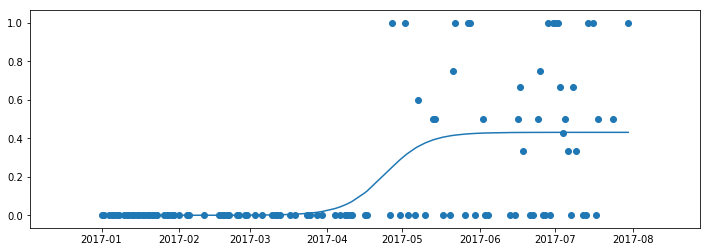

0.3553034468330164
114.17067085936326
2017-04-24
0.010775575287717797
0.42024743622099403
83.89518526512613
144.44615645360037
60.550971188474236
---
700
146 2018
[0.5711250670401953, 0.8703159143789306, 0.1926425815720284]
999818.9265673248 0.11982024995115317 0.5643683996152609


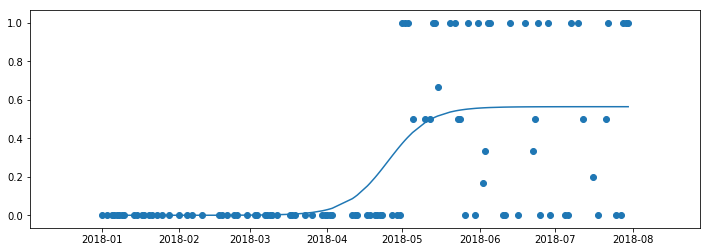

0.4291158974831262
115.30045608958325
2018-04-25
0.014109209990381523
0.5502591896248793
84.72497617176334
145.8759360074031
61.15095983563977
---
701
146 2019
[0.4648471653501377, 0.8042309339429369, 0.9039117256655002]
64173.30667960025 0.09243037033819222 0.362106702521099


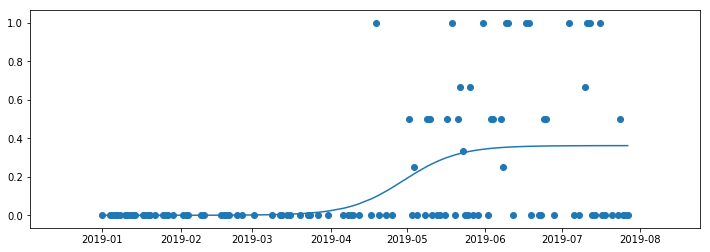

0.2377070866941975
119.75871760448088
2019-04-30
0.009052667563027476
0.3530540349580715
80.12280970186089
159.39462550710093
79.27181580524004
---
702
147 2010
[0.8318478664688655, 0.1995599721370388, 0.6842456164567274]
999999.9998979671 0.11965361870062668 0.30473794788594594


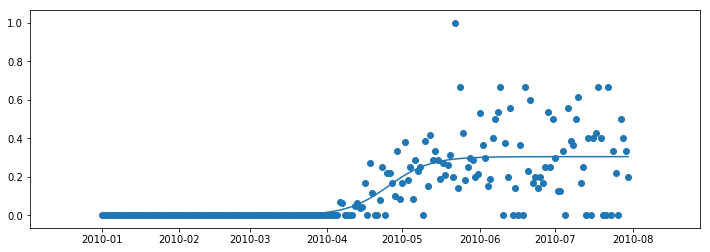

0.5346668755783055
115.46253851652114
2010-04-25
0.007618448697148649
0.29711949918879726
84.84447877111654
146.08059826192567
61.23611949080913
---
703
147 2011
[0.9151551700288226, 0.9736251756821499, 0.02876111685966043]
999999.9988913621 0.12476364245677164 0.21296146382294695


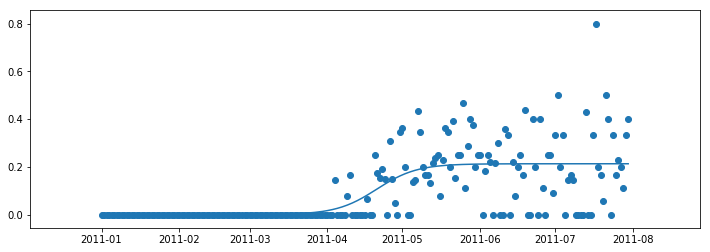

0.46262972186815643
110.73346597461246
2011-04-21
0.0053240365955736745
0.20763742722737327
81.36944955132628
140.0974823978986
58.72803284657232
---
704
147 2012
[0.8505428070160957, 0.7062659518795998, 0.49682090710904603]
709969.4892150525 0.11748356219475385 0.3567968863197345


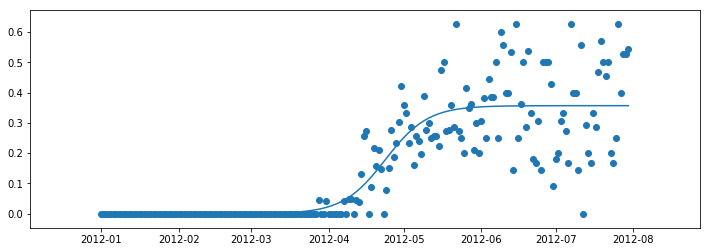

0.7469422910182236
114.67967963742264
2012-04-24
0.008919922157993363
0.34787696416174113
83.49606911617781
145.8632901586675
62.36722104248969
---
705
147 2013
[0.8279190446044771, 0.5072234430417325, 0.4544908266764792]
236482.90173568964 0.10576160028427953 0.3559591186116053


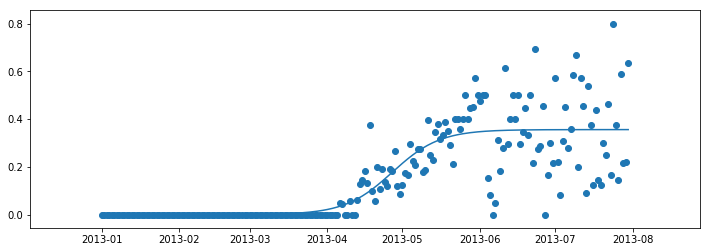

0.694183128980107
116.99549887615599
2013-04-27
0.008898977965290133
0.34706014064631513
82.3556897556221
151.63530799668985
69.27961824106775
---
706
147 2014
[0.7242135893489887, 0.25823398034146117, 0.4550405448392463]
205.05519153910748 0.03643488168832985 0.5687571518555605


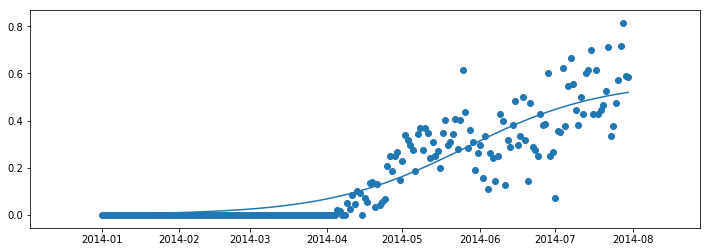

0.8089067979039511
146.10392358234031
2014-05-26
0.014218928796389014
0.5545382230591716
45.55298238625317
246.65486477842754
201.10188239217436
---
707
147 2015
[0.2682900073823484, 0.8273585955563981, 0.5111435093525996]
999999.9999989577 0.1184143557896309 0.39210080892219146


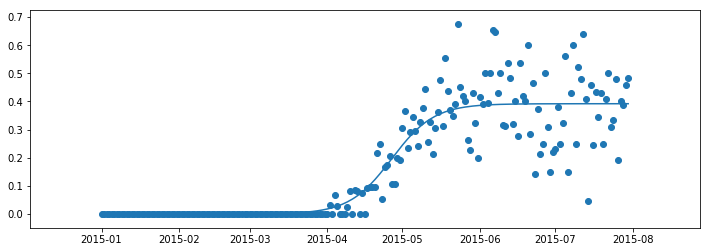

0.8238505718199611
116.6709092477536
2015-04-27
0.009802520223054787
0.3822982886991367
85.73241685213435
147.60940164337288
61.87698479123853
---
708
147 2016
[0.9195975321234746, 0.2615774928309501, 0.04678344035894333]
84053.4847104335 0.09260228069023078 0.4302200509301927


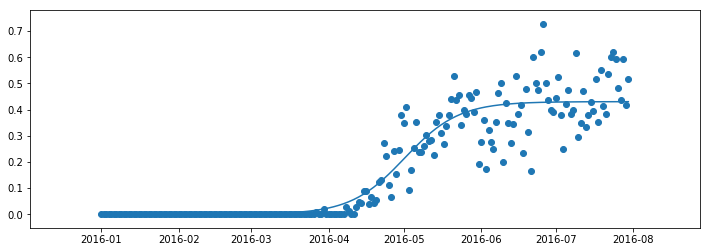

0.8726716506643062
122.45064066918852
2016-05-01
0.010755501273254819
0.4194645496569379
82.88831435473374
162.01296698364337
79.12465262890963
---
709
147 2017
[0.3542226963961881, 0.12378918001175432, 0.987194296999008]
887713.5053067575 0.11783694037348226 0.43697321896659574


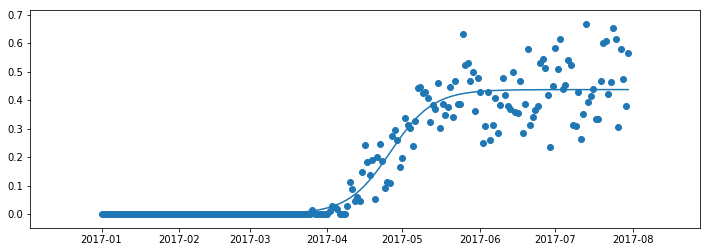

0.8963125067197277
116.23183950082831
2017-04-26
0.010924330474164894
0.42604888849243083
85.14174470951714
147.32193429213947
62.18018958262233
---
710
147 2018
[0.23700121026842957, 0.48364325529816066, 0.4374930666496608]
999999.9997573864 0.11846960526599695 0.3797165741725498


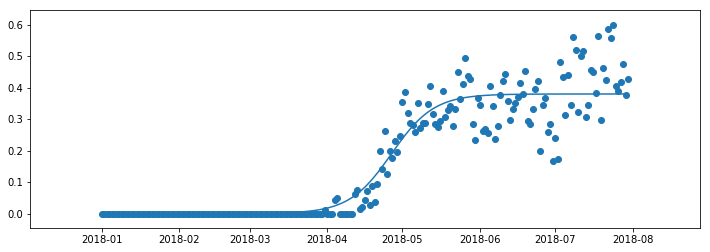

0.8927988022280536
116.61649860909073
2018-04-27
0.009492914354313745
0.370223659818236
85.69243468650113
147.54056253168028
61.84812784517915
---
711
147 2019
[0.8494503745509875, 0.21950832847064627, 0.8903072029723481]
110016.07378162071 0.10097642848994788 0.34365869693706014


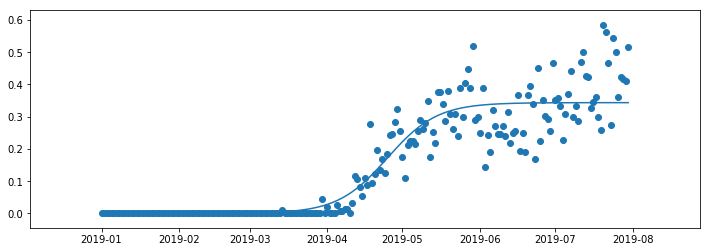

0.8589742482906955
114.96130268206464
2019-04-25
0.008591467423426504
0.3350672295136336
78.67994770728109
151.24265765684817
72.56270994956708
---
712
148 2010
[0.3123204635637413, 0.715358103065501, 0.27246225494879106]
999999.9999996349 0.11978953714032961 0.3985997539063881


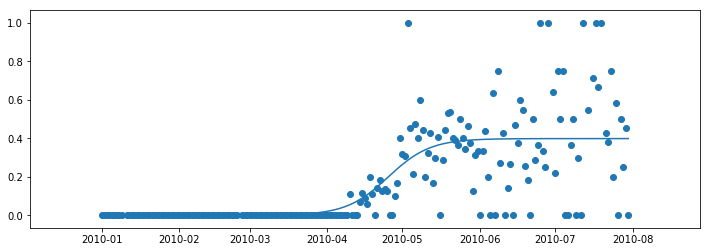

0.5268973781258016
115.33152967925305
2010-04-25
0.009964993847659703
0.3886347600587284
84.74821052143794
145.91484883706818
61.16663831563024
---
713
148 2011
[0.4150403832117644, 0.8860133788863401, 0.402354839408691]
999999.9926713464 0.1183297637612483 0.2969726281075847


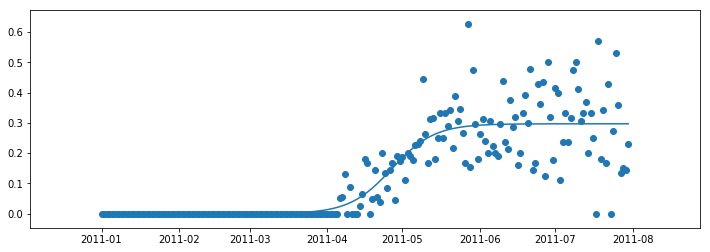

0.7487407329270264
116.75431532603167
2011-04-27
0.007424315702689617
0.28954831240489504
85.79370550413137
147.71492514793192
61.921219643800555
---
714
148 2012
[0.3314369082466273, 0.41592702569004025, 0.4383862384075452]
999999.9999332665 0.12732674500554264 0.2797836775692953


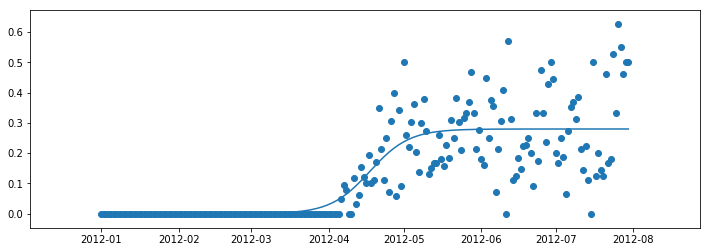

0.6626935305767864
108.50438811811408
2012-04-18
0.0069945919392323825
0.2727890856300629
79.7314728443421
137.277303391886
57.5458305475439
---
715
148 2013
[0.5559750577166562, 0.5914872167274334, 0.9772545765095063]
700794.2375798317 0.12216413449762122 0.27845651864185544


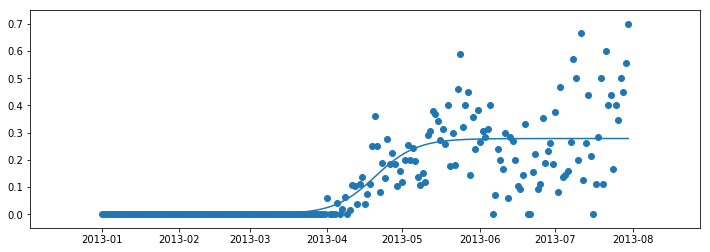

0.611150741042251
110.17938817551305
2013-04-20
0.006961412966046386
0.27149510567580903
80.19054029315048
140.16823605787562
59.97769576472514
---
716
148 2014
[0.9831462903661523, 0.08766122196820814, 0.02139089383225623]
937377.9528595933 0.11940051511328137 0.33436485745098826


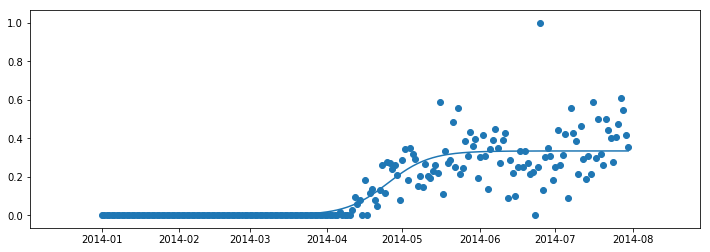

0.7280647836165481
115.16568275848324
2014-04-25
0.008359121436274706
0.32600573601471355
84.48271926662697
145.84864625033956
61.36592698371258
---
717
148 2015
[0.5801324793201154, 0.29006902687377656, 0.09774463896028285]
515165.7245832412 0.11146019681052854 0.33544936550533483


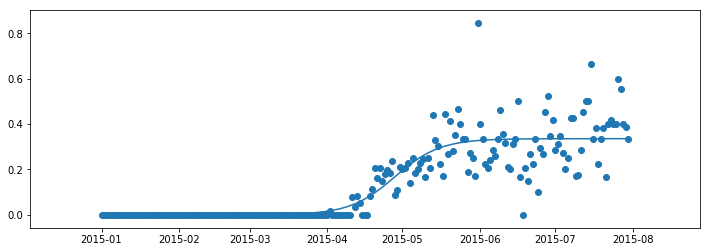

0.7719093494155465
117.99946796743652
2015-04-28
0.008386234137633371
0.32706313136770143
85.1306793687824
150.8682565660906
65.7375771973082
---
718
148 2016
[0.8162527966937455, 0.9839212146465638, 0.6498350710770298]
206775.10429762347 0.1012656832455405 0.3645758886276172


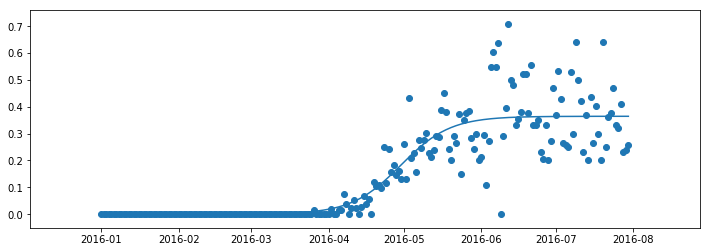

0.7935073100201689
120.86411345573465
2016-04-30
0.00911439721569043
0.35546149141192673
84.6863923491032
157.04183456236606
72.35544221326286
---
719
148 2017
[0.9810037170293372, 0.6118817319558278, 0.975424559917859]
999999.9999999853 0.12620909370831826 0.3207648825009788


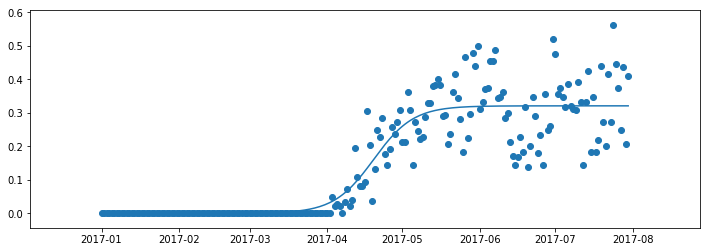

0.8293730659519354
109.4652544601364
2017-04-19
0.00801912206252447
0.3127457604384543
80.43753911502426
138.49296980524858
58.05543069022431
---
720
148 2018
[0.9351884568642801, 0.1917365267952199, 0.51212396766632]
999999.9999999184 0.12275866792789641 0.28058878917813035


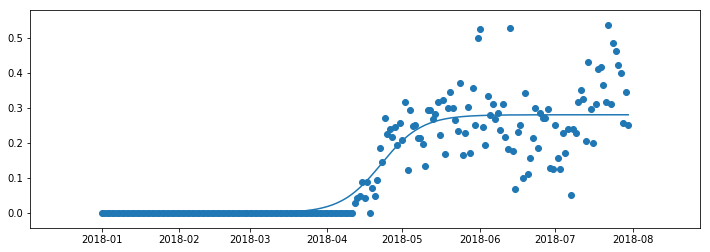

0.7884466141231578
112.54203708107094
2018-04-23
0.007014719729453259
0.27357406944867707
82.69842841401146
142.38564574813037
59.68721733411891
---
721
148 2019
[0.6196662449682893, 0.42941309207377654, 0.8343475298021134]
999999.9999962335 0.12589786076661091 0.2711061540658134


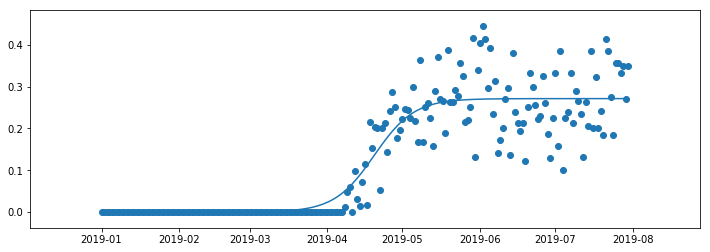

0.8400770176694068
109.73586424611027
2019-04-20
0.006777653851645336
0.26432850021416804
80.63638929219388
138.8353392000266
58.19894990783271
---
722
149 2010
[0.9857426085272737, 0.09330903566997684, 0.34131956565893795]
999999.9996553513 0.11536637806414116 0.31175249169247937


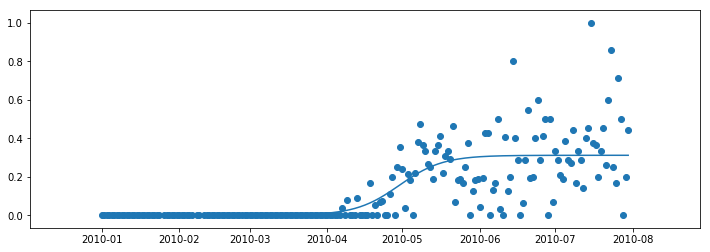

0.5586516168710869
119.75335266171315
2010-04-30
0.007793812292311984
0.3039586794001674
87.99746582878524
151.50923949464112
63.511773665855884
---
723
149 2011
[0.45605597772618, 0.030957333941739384, 0.8683486519076787]
869600.1225629428 0.11624546338665272 0.2358724439283085


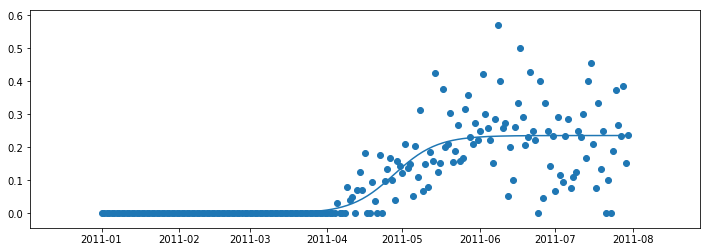

0.6651387628827716
117.64578468101428
2011-04-28
0.005896811098207713
0.22997563283010078
86.13004600703265
149.16152335499584
63.03147734796319
---
724
149 2012
[0.23552107816346834, 0.10866663030493662, 0.5143863047000091]
999999.9999999717 0.11914622378484441 0.24677365867290052


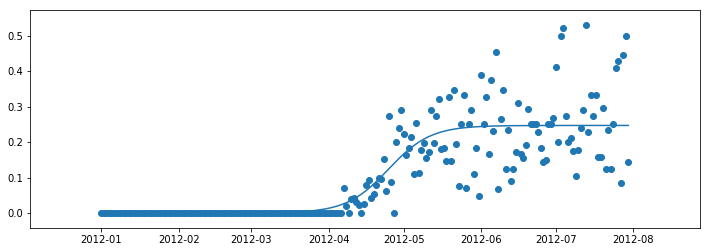

0.7146517567324555
115.95424612795492
2012-04-25
0.006169341466822513
0.240604317206078
85.2057966198501
146.7026956360597
61.496899016209596
---
725
149 2013
[0.8577851446012618, 0.9650590516816611, 0.049304579324946474]
999999.9994173457 0.120320020453838 0.22873048574776436


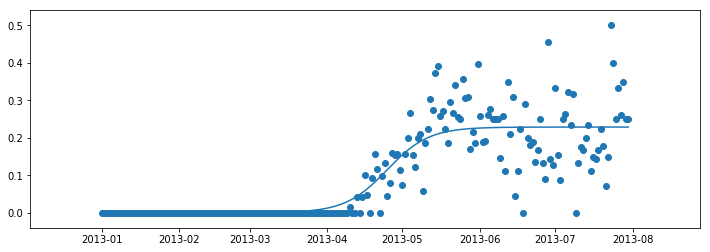

0.7387211987418207
114.8230402992832
2013-04-25
0.0057182621436941096
0.22301222360407025
84.37456104943793
145.27151954912844
60.89695849969051
---
726
149 2014
[0.47751140561362004, 0.838208833402389, 0.4133334056212382]
999999.9999426226 0.11579322920356554 0.21212928707760437


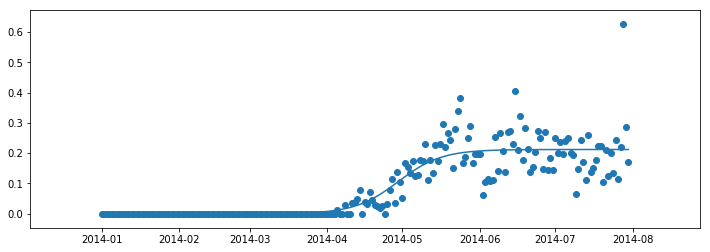

0.7726951872316781
119.31190323416152
2014-04-29
0.00530323217694011
0.20682605490066425
87.67307882855597
150.95072763976702
63.27764881121105
---
727
149 2015
[0.6233718049261289, 0.15030705405891098, 0.8928414831155563]
999999.9995377779 0.11533164593336075 0.23014319701065136


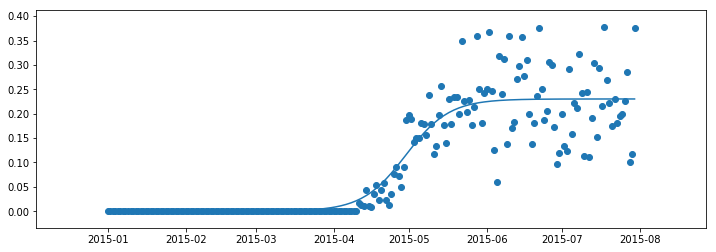

0.8297627259987863
119.78941638867036
2015-04-30
0.005753579925266285
0.22438961708538507
88.02396626887868
151.55486650846203
63.530900239583346
---
728
149 2016
[0.8183220773441002, 0.22628541030046756, 0.31027302192771855]
999999.9999956287 0.1170636715094525 0.1920081891972052


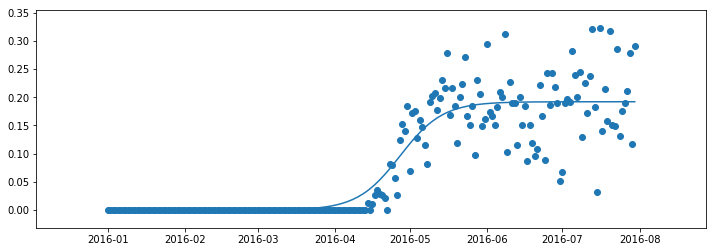

0.820376447185974
118.01706182472114
2016-04-27
0.00480020472993013
0.18720798446727505
86.72160014228257
149.31252350715965
62.590923364877085
---
729
149 2017
[0.7116055331929896, 0.017510923824879066, 0.04758311650862834]
999999.9999270871 0.12100166062870955 0.1829122979504967


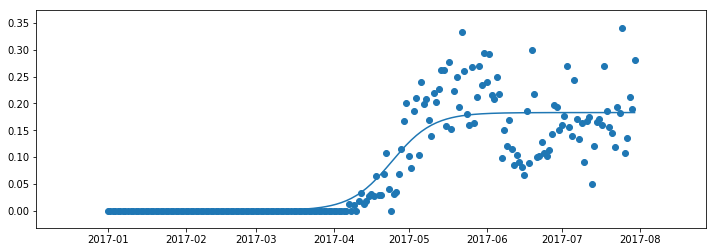

0.7813983650592029
114.1762062281434
2017-04-24
0.004572807448762418
0.17833949050173428
83.89925277895735
144.45315967732938
60.553906898372034
---
730
149 2018
[0.6615191001179823, 0.9813089680499477, 0.2913656749801551]
999999.999999933 0.11896972940837167 0.17434870792276416


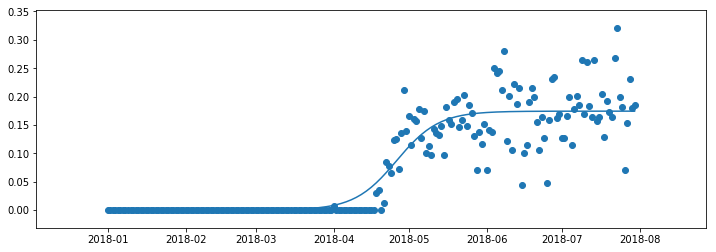

0.8367528631503744
116.1262669644438
2018-04-26
0.004358717698069104
0.16998999022469505
85.33220141223745
146.9203325166501
61.58813110441264
---
731
149 2019
[0.5624889971493, 0.2884578308721786, 0.6578063271380175]
999999.9999938407 0.12184483228512157 0.13691194052907424


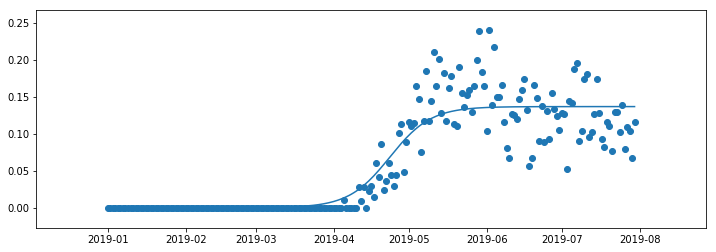

0.835281918030563
113.38610180552665
2019-04-23
0.0034227985132268563
0.13348914201584738
83.31866622026709
143.45353739078624
60.13487117051915
---
732
150 2010
[0.24903154010601103, 0.016979262439040688, 0.9976678591343052]
999999.9976438248 0.12144328050015249 0.11281901395513878


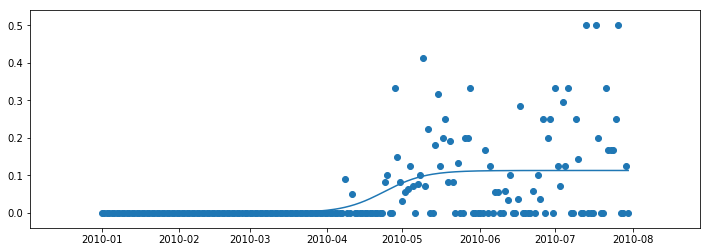

0.26471124302171367
113.76101253778921
2010-04-24
0.0028204753488784698
0.10999853860626031
83.59415908124868
143.92786599432978
60.3337069130811
---
733
150 2011
[0.9232725849656052, 0.9106754498990958, 0.20662777302255575]
999999.9999994113 0.12060102503046582 0.1277353061692344


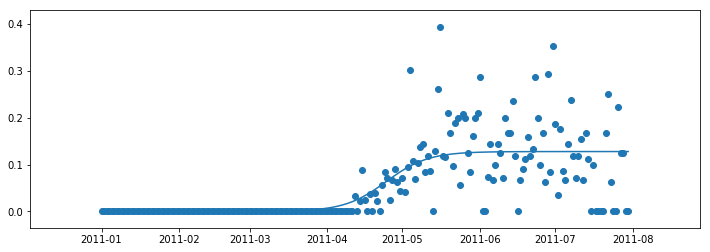

0.5240636802543254
114.55549863256682
2011-04-25
0.0031933826542308603
0.12454192351500354
84.17796539680727
144.93303186832642
60.75506647151916
---
734
150 2012
[0.7418787552542836, 0.5687974977077493, 0.4857100047144961]
997987.6825749532 0.1308679059066264 0.12860245619281013


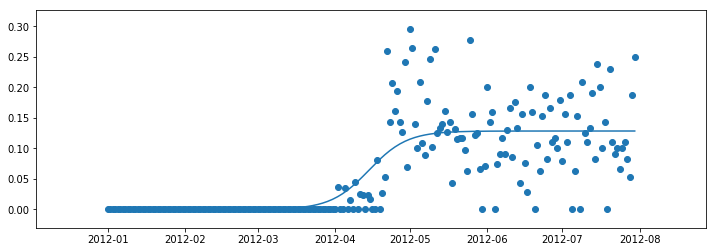

0.6099036584772823
105.55297051183835
2012-04-15
0.0032150614048202537
0.12538739478798988
77.55862292333502
133.5473181003417
55.988695177006676
---
735
150 2013
[0.8486099061022364, 0.9371711803684003, 0.38347550459528223]
999999.9999979484 0.12998332486639724 0.10255691138127944


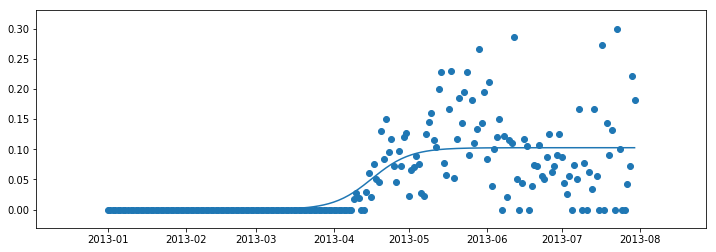

0.4953350564503828
106.28679157239924
2013-04-16
0.002563922784531986
0.09999298859674745
78.10193286152058
134.47165028327785
56.36971742175727
---
736
150 2014
[0.9028583388570269, 0.9430551667836392, 0.5209387671311039]
999999.9998024019 0.12689320365561535 0.10347147676502642


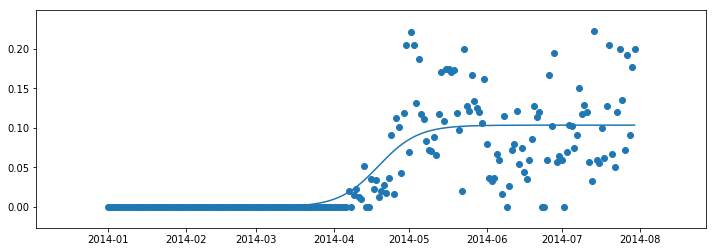

0.6058677552734635
108.87510252528251
2014-04-19
0.0025867869191256608
0.10088468984590077
80.00388215580985
137.74632289475522
57.742440738945376
---
737
150 2015
[0.2506508466221198, 0.027253773084191524, 0.5525575209425878]
999999.9968676083 0.11746134064408023 0.12481701857167914


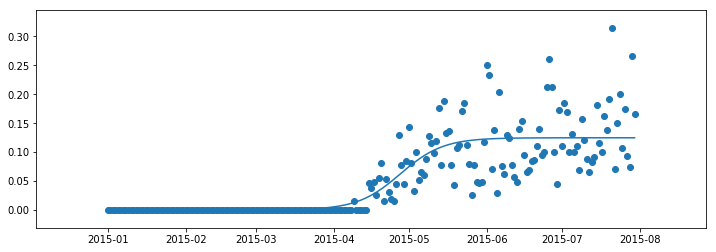

0.6926805945447853
117.61751125158939
2015-04-28
0.0031204254642919786
0.12169659310738716
86.42800135802698
148.80702114515185
62.379019787124875
---
738
150 2016
[0.015979717977333663, 0.04922062911741887, 0.2561095301725972]
999999.9999138863 0.12606733969024594 0.10684766934925498


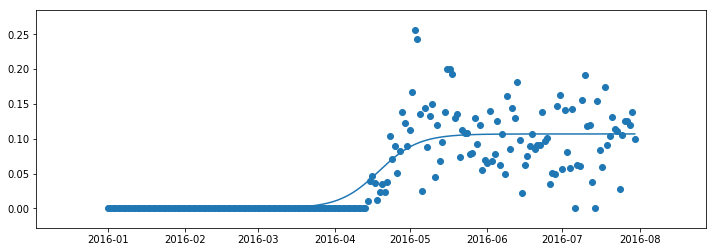

0.6862391225356594
109.58834057911902
2016-04-19
0.0026711917337313745
0.10417647761552361
80.52798557257086
138.6486955856672
58.12071001309636
---
739
150 2017
[0.29563969916684696, 0.4513154115914395, 0.9492653630394017]
999999.9999960886 0.127410114809336 0.10169963128305393


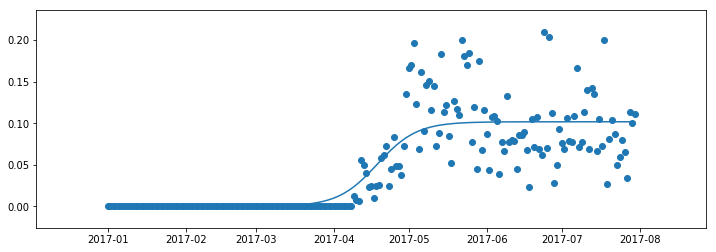

0.6988682736082978
108.43338912797233
2017-04-18
0.0025424907820763482
0.09915714050097757
79.6793011843894
137.18747707155526
57.50817588716586
---
740
150 2018
[0.11721348385413921, 0.4815984912784135, 0.16694106016972465]
999999.9999979931 0.12467782317893504 0.08897035150570408


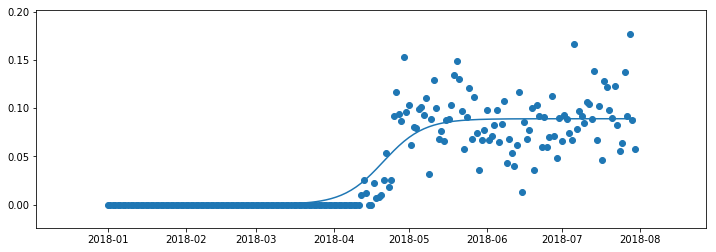

0.7849772709121629
110.80968696521538
2018-04-21
0.002224258787642602
0.08674609271806147
81.42545845753781
140.19391547289294
58.768457015355125
---
741
150 2019
[0.8016038949611385, 0.2778066059382175, 0.2942806591681678]
37863.5443209075 0.0998519556385816 0.08401058584322803


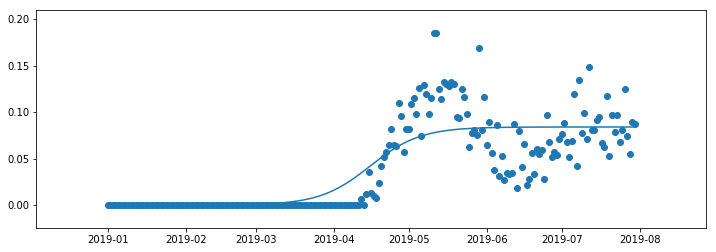

0.6937014452372032
105.57373633265229
2019-04-16
0.0021002646460807008
0.08191032119714732
68.88380249309823
142.2636701722063
73.37986767910807
---
742
151 2010
[0.09175208064388041, 0.5099644034927723, 0.31016672840421056]
1132.8526401301365 0.05191123299661739 0.2832024719327986


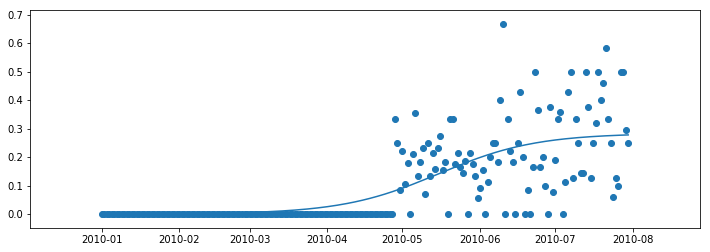

0.5531524612350813
135.47153062920862
2010-05-15
0.007080061798319966
0.27612241013447864
64.89794886958504
206.04511238883208
141.14716351924704
---
743
151 2011
[0.6130041453913843, 0.36941003003795625, 0.1690904589468436]
999999.9960188199 0.11573140677349729 0.27397901958167387


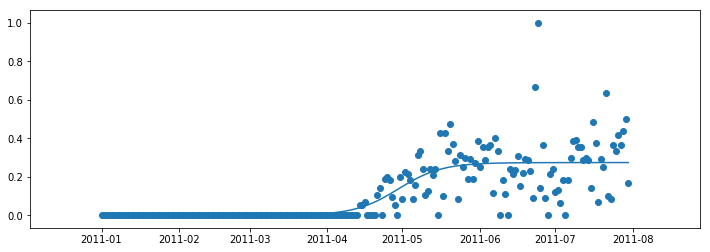

0.5992834719301431
119.37563829170416
2011-04-29
0.006849475489541847
0.267129544092132
87.71991277806073
151.03136380534764
63.31145102728691
---
744
151 2012
[0.956343440538897, 0.1310966074901534, 0.1131539200723003]
999999.9999999999 0.11741183229452835 0.2629927783192909


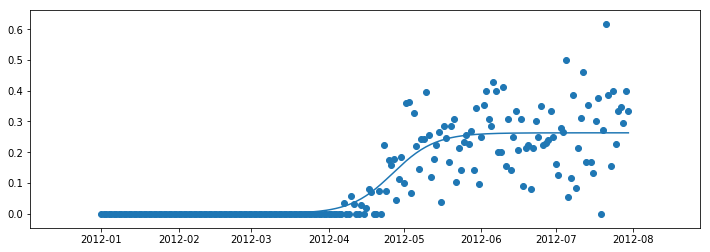

0.7268853038594829
117.66710635524343
2012-04-27
0.006574819457982273
0.25641795886130864
86.46444496640166
148.86976774408527
62.40532277768361
---
745
151 2013
[0.44895097795864836, 0.6713258860225761, 0.7805764342364719]
826920.9698846517 0.11117460079609244 0.22363822388615462


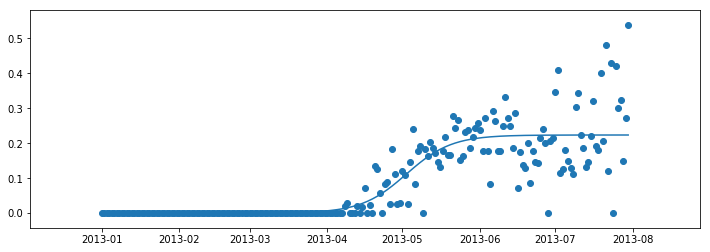

0.7228345382751648
122.5591484876787
2013-05-03
0.005590955597153866
0.21804726828900076
89.6059233814419
155.51237359391553
65.90645021247363
---
746
151 2014
[0.990280912169636, 0.8191529572344973, 0.8484495137434845]
43037.87553155053 0.0831440102097912 0.20261545961601182


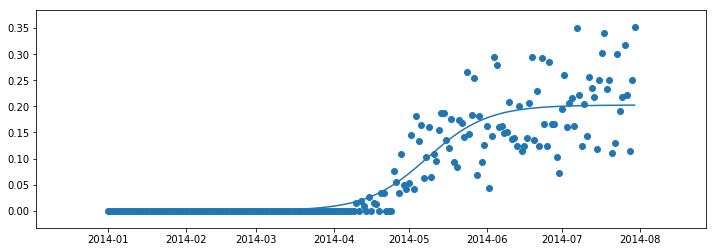

0.8031402678224713
128.32957908054422
2014-05-08
0.005065386490400296
0.19755007312561151
84.2667339413015
172.3924242197869
88.12569027848541
---
747
151 2015
[0.17690119021710882, 0.5528046081247777, 0.07811217603163556]
1200.9599011311668 0.04972696226229879 0.29907416133480025


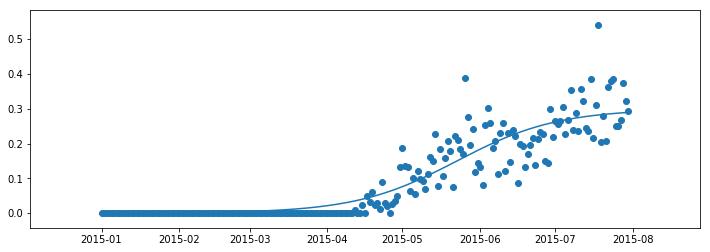

0.8431158224172643
142.59621161290738
2015-05-23
0.007476854033370006
0.29159730730143024
68.9226655232596
216.26975770255524
147.34709217929566
---
748
151 2016
[0.6355984947153255, 0.1331635793793463, 0.792329022912414]
3184.257883281172 0.06005035335987152 0.2469413669146376


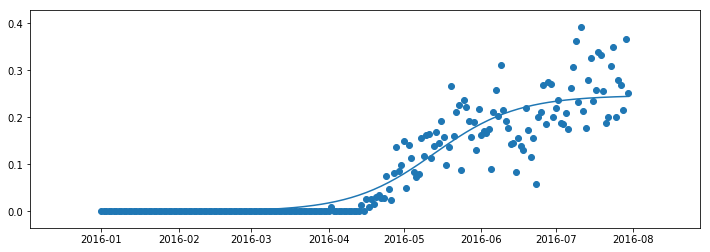

0.8574414532048779
134.32018440989512
2016-05-13
0.006173534172865941
0.24076783274177166
73.31202307278281
195.32834574700735
122.01632267422454
---
749
151 2017
[0.5480198763081046, 0.8586163624136003, 0.6199809554520618]
28110.993885007705 0.08108854178063828 0.21383518750038216


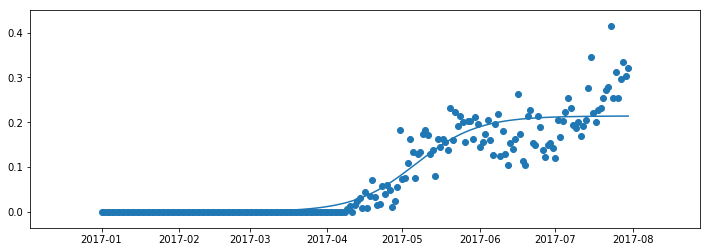

0.8589215968453252
126.33000662384794
2017-05-06
0.005345879687509554
0.20848930781287262
81.15023688473535
171.50977636296054
90.35953947822519
---
750
151 2018
[0.6914414543199472, 0.5501050278719997, 0.31107020838928134]
999999.9999999789 0.11488872783029705 0.15397263764462082


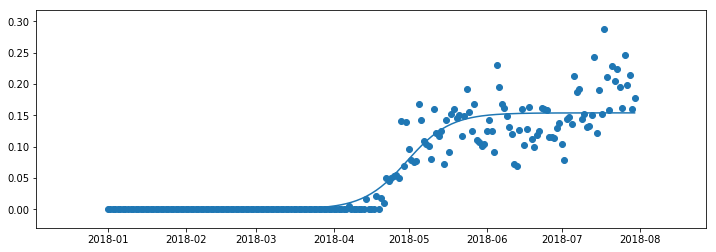

0.864192206504145
120.2512275910239
2018-04-30
0.003849315941115521
0.1501233217035053
88.36331556242943
152.13913961961842
63.775824057188984
---
751
151 2019
[0.6215122526863914, 0.10339016660803335, 0.381305376927059]
154789.04391305655 0.09846253139375304 0.16537272189953242


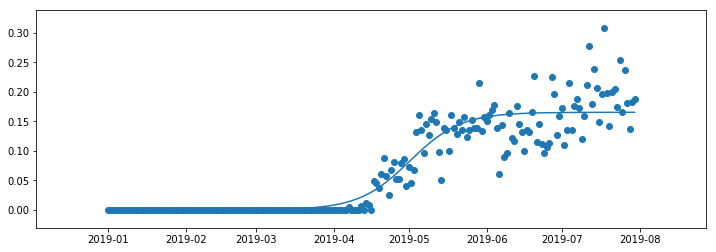

0.8716971195317714
121.36411986088497
2019-05-01
0.004134318047488311
0.1612384038520441
84.15644711195867
158.57179260981124
74.41534549785257
---
752
152 2010
[0.5883113733747453, 0.26009326494975715, 0.3596435403830094]
15255.977973363124 0.08441478581326362 0.043253232006090526


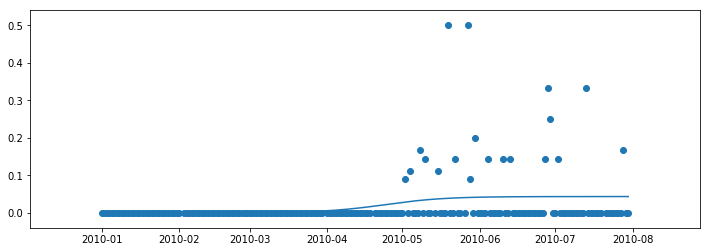

0.08303912444635564
114.11184202713572
2010-04-24
0.0010813308001522632
0.042171901205938264
70.7123165668222
157.51136748744926
86.79905092062707
---
753
152 2011
[0.6136513287360821, 0.07559217279936403, 0.06105077677866322]
136576.0451393438 0.11614993887879123 0.05343990628609497


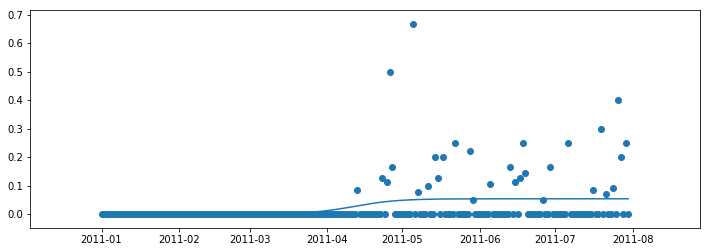

0.09391086485830535
101.80493386284182
2011-04-12
0.0013359976571523744
0.0521039086289426
70.26327588614006
133.3465918395436
63.08331595340354
---
754
152 2012
[0.7963366080055893, 0.802531873924901, 0.32784800166037265]
999999.999952382 0.13085173574926595 0.06627811420292018


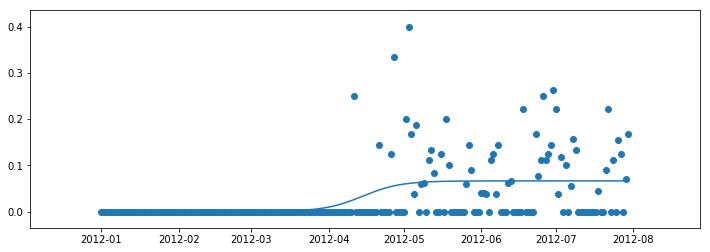

0.20993129408656153
105.58140844527665
2012-04-15
0.0016569528550730045
0.06462116134784718
77.58360142229874
133.57921546825457
55.99561404595583
---
755
152 2013
[0.9077687072692321, 0.655482341390833, 0.9145821506446536]
19645.421111346037 0.10192632513600355 0.05574859246188088


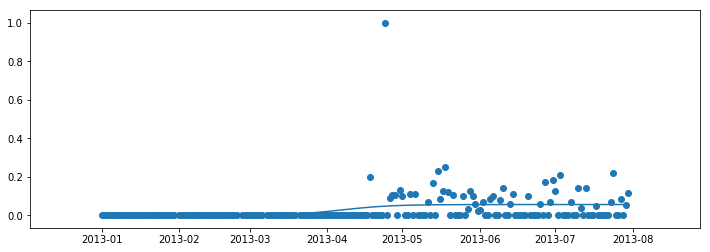

0.09522094133893155
96.98769728653964
2013-04-07
0.0013937148115470222
0.05435487765033386
61.044464355878816
132.93093021720054
71.88646586132172
---
756
152 2014
[0.2211942442177116, 0.6862719650969642, 0.12079773111964476]
---
757
152 2015
[0.08948542774320756, 0.8161001528483225, 0.9787362604378123]
21785.32855598521 0.09542008696708298 0.052526891512072175


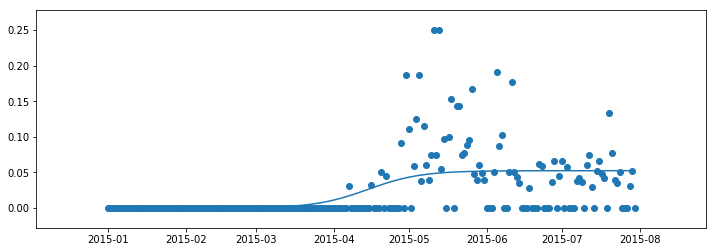

0.27474322958010855
104.68437346568895
2015-04-15
0.0013131722878018046
0.05121371922427037
66.29034383759333
143.07840309378463
76.7880592561913
---
758
152 2016
[0.7458154151689577, 0.05067291885128966, 0.07885412726434371]
999963.3213487227 0.12363363433380227 0.0521878267082342


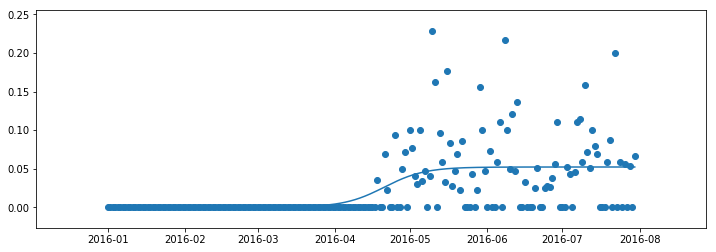

0.31326743023406944
111.74527023398417
2016-04-21
0.001304695667705855
0.05088313104052834
82.11286748314144
141.37767298482686
59.264805501685416
---
759
152 2017
[0.5470705076613132, 0.030882621702951862, 0.6284358061913865]
999999.0927715746 0.12364890533159245 0.04273102788963719


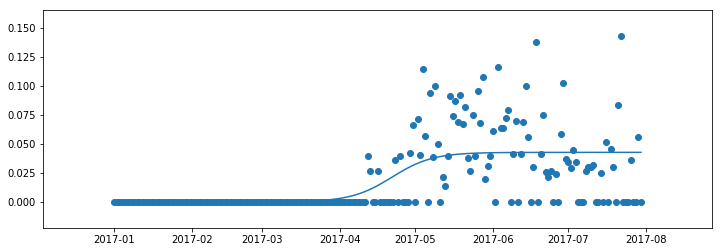

0.3923172177130635
111.73175867336657
2017-04-22
0.0010682756972409297
0.041662752192396256
82.10301561005373
141.3605017366794
59.257486126625665
---
760
152 2018
[0.785191083882894, 0.28206445748071385, 0.536733996828375]
10968.519916776462 0.09018961974674597 0.03880665205920597


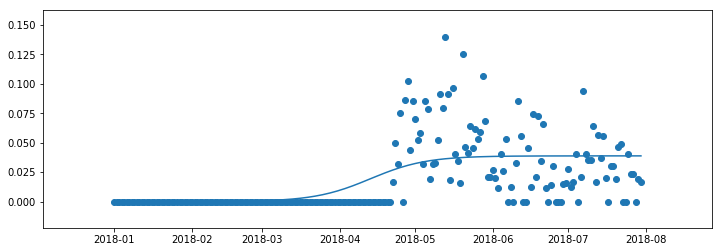

0.3876647383291506
103.14695470833955
2018-04-13
0.0009701663014801493
0.03783648575772582
62.52629729325129
143.76761212342782
81.24131483017653
---
761
152 2019
[0.012553553228659475, 0.7752826006127859, 0.0680935616609164]
968551.8891647296 0.12895551116666673 0.04667059507332387


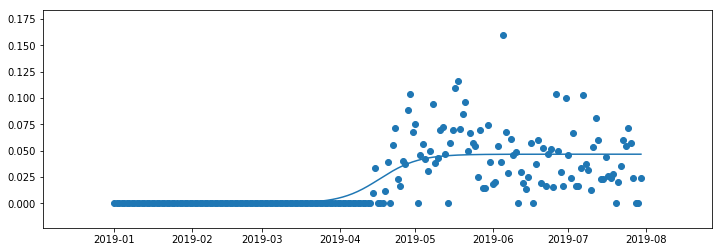

0.5159681141377492
106.88614400833687
2019-04-17
0.0011667648768330968
0.04550383019649077
78.47664360788691
135.29564440878679
56.81900080089987
---
762
154 2010
[0.19090219345259563, 0.2358499987277204, 0.8837913495528325]
999999.9928020306 0.11420217109861536 0.0860477133338068


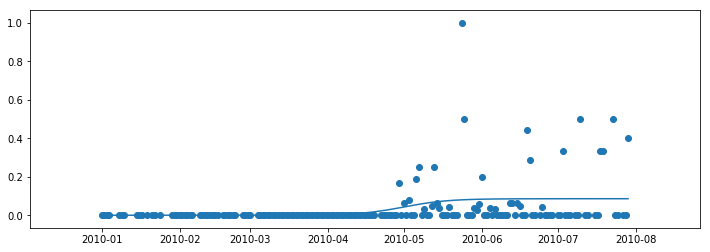

0.10771766471135658
120.97414977195483
2010-05-01
0.00215119283334517
0.08389652050046163
88.89453507736111
153.05376446654859
64.15922938918747
---
763
154 2011
[0.4816124498177424, 0.9696940741905306, 0.49748432515102536]
437.6376230490868 0.03026030123384089 0.9999999999999992


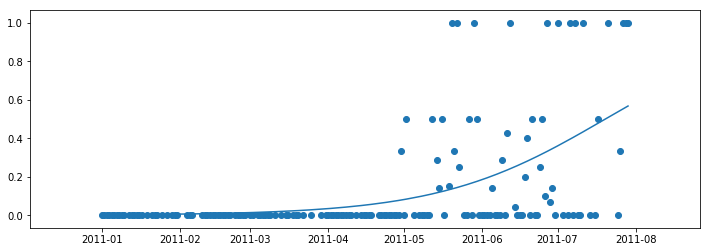

0.29735452024955944
200.96928898051468
2011-07-20
0.02499999999999998
0.9749999999999992
79.90104125161932
322.03753670940984
242.13649545779052
---
764
154 2012
[0.7769388510157582, 0.2900016858393206, 0.023138950041254436]
231.34265792428576 0.021868379542195438 0.9999999999997978


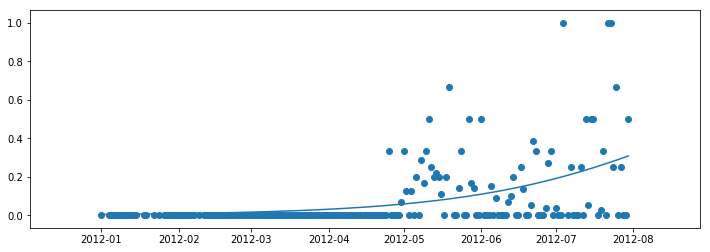

0.23220452387500323
248.93934040939325
---
765
154 2013
[0.3521848911569404, 0.31498813355942445, 0.9094154176353565]
999999.998510705 0.11730123123175763 0.14917163442490525


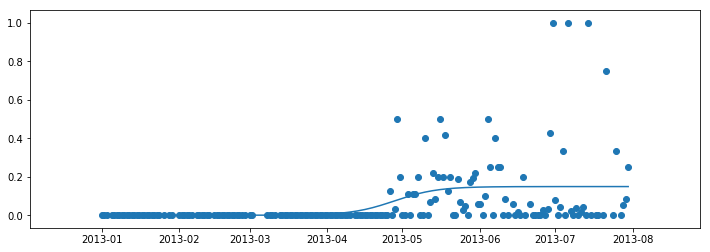

0.17360261330529225
117.77805238189714
2013-04-28
0.0037292908606226314
0.14544234356428262
86.54597060697209
149.01013415682223
62.46416354985014
---
766
154 2014
[0.41987437470057487, 0.4667334271764503, 0.9111136998363304]
999999.9931937853 0.10326458738658932 0.16001797445652674


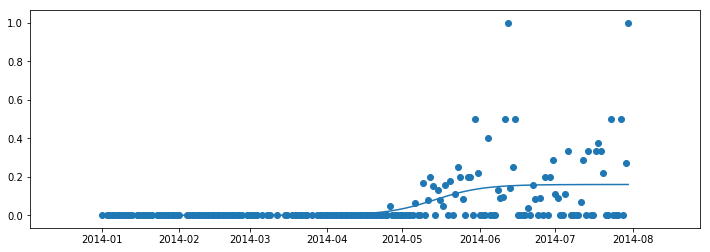

0.23435735335798746
133.78749579889612
2014-05-14
0.004000449361413169
0.15601752509511357
98.31007087669647
169.2649207210958
70.95484984439932
---
767
154 2015
[0.17285459313208673, 0.6504083908177842, 0.6036077589070148]
999999.9992863353 0.11260114379955714 0.11265547685574105


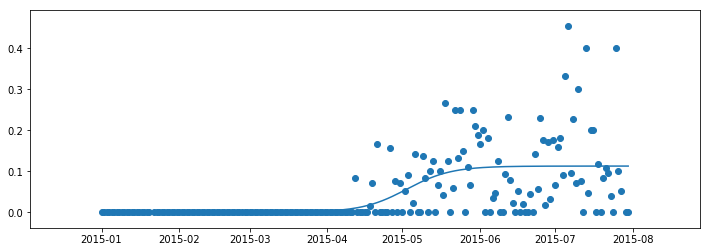

0.3572152588676698
122.69422930413381
2015-05-03
0.0028163869213935263
0.10983908993434752
90.1584883470863
155.22997026118128
65.07148191409497
---
768
154 2016
[0.2209383178678609, 0.5092418960495708, 0.2564504273303678]
999999.9999985857 0.11649552931170756 0.12616341494649153


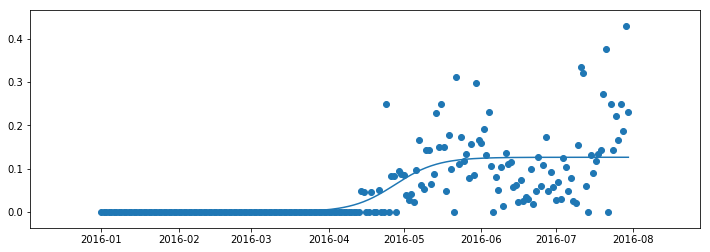

0.4839529565696914
118.59262445167867
2016-04-28
0.0031540853736622882
0.12300932957282923
87.14453654843358
150.04071235492373
62.89617580649015
---
769
154 2017
[0.4165143272674581, 0.3641334736554983, 0.23212317948668382]
999999.9984213879 0.114068432541316 0.15125355559369252


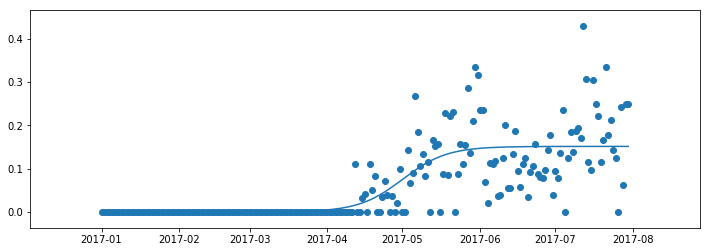

0.5846525801594535
121.11598492757086
2017-05-01
0.003781338889842313
0.14747221670385022
88.9987587633322
153.23321109180955
64.23445232847735
---
770
154 2018
[0.9273000609820706, 0.8624032120140034, 0.12835142909885977]
857239.393191577 0.10672488758983059 0.17376376541649466


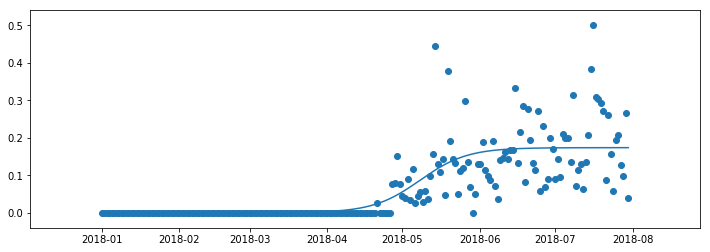

0.6142467184621803
128.00643604038964
2018-05-08
0.004344094135412367
0.1694196712810823
93.6792820947271
162.33358998605226
68.65430789132516
---
771
154 2019
[0.5125013795253823, 0.18105577515755444, 0.94760545100489]
582947.9785535069 0.1069512233650571 0.12096105093310357


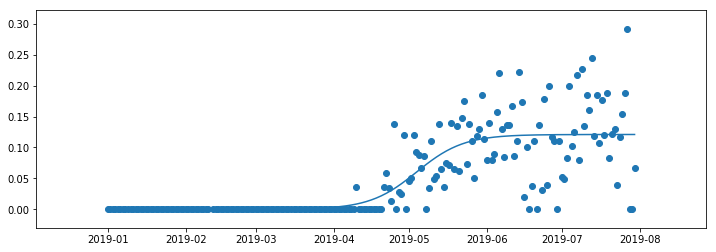

0.6452315963266534
124.12998012584981
2019-05-04
0.0030240262733275893
0.11793702465977597
89.87547109957346
158.38448915212612
68.50901805255266
---
772
155 2010
[0.12797617658873794, 0.10348143001684396, 0.7084194622637123]
2703.784155049937 0.07847335093990714 0.04151566170699933


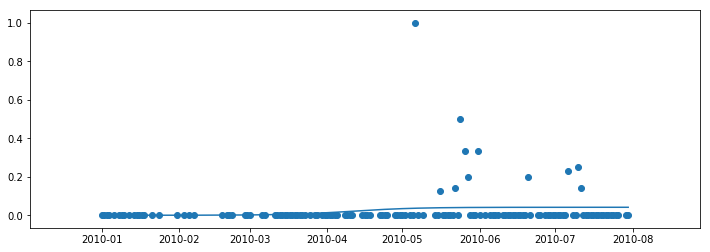

0.031669003617805
100.7017989548112
2010-04-11
0.0010378915426749833
0.04047777016432434
54.01637514851666
147.38722276110568
93.37084761258902
---
773
155 2011
[0.7887239009709702, 0.06509028526997473, 0.889324933511314]
997566.4260828445 0.08786706093006115 0.06325841662119042


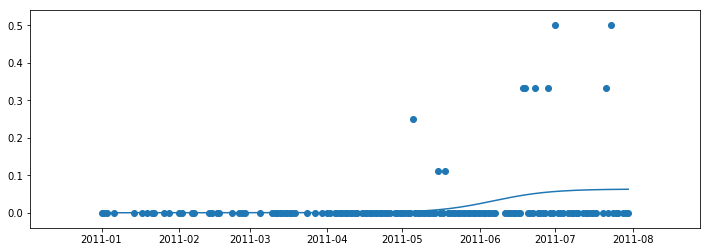

0.07722075013482632
157.20423412236252
2011-06-06
0.0015814604155297606
0.06167695620566065
115.50986529573585
198.8986029489891
83.38873765325324
---
774
155 2012
[0.4153985859966347, 0.23820385977739145, 0.7457318703211072]
999957.9020119741 0.11297037697442601 0.05670928781077329


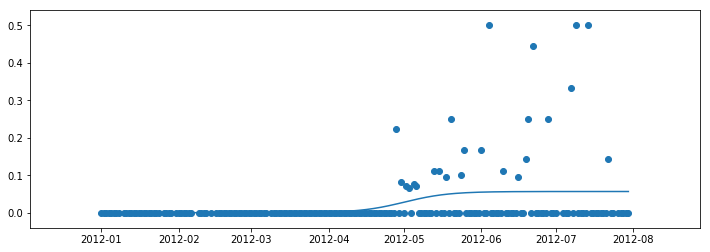

0.09827452489465527
122.29284197411876
2012-05-01
0.0014177321952693325
0.05529155561550396
89.86344106170968
154.72224288652782
64.85880182481814
---
775
155 2013
[0.9418396543182382, 0.09998574180648312, 0.8177634051542738]
999999.9999751967 0.10825885457344948 0.07381044713066122


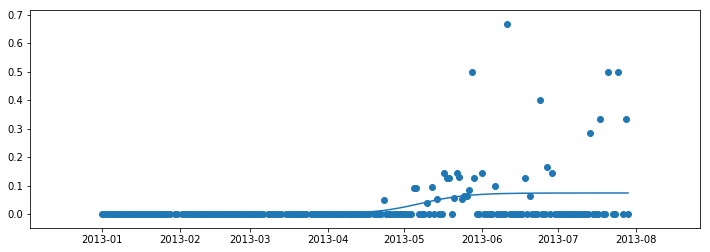

0.12863360269059831
127.61552495981911
2013-05-08
0.0018452611782665306
0.07196518595239469
93.7747674479792
161.45628247165905
67.68151502367985
---
776
155 2014
[0.9121713687810356, 0.5222728234485946, 0.41688883062056437]
999999.999984784 0.10497720878071078 0.06972157111531516


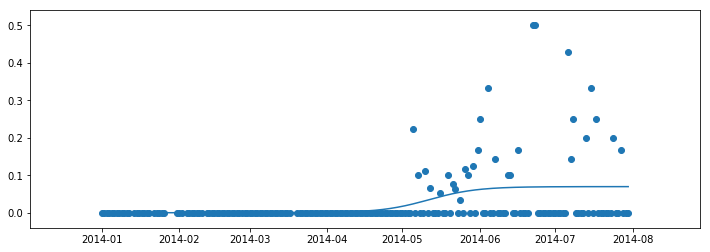

0.14614987694961468
131.6048570772022
2014-05-12
0.001743039277882879
0.06797853183743227
96.70621870911089
166.50349544529348
69.7972767361826
---
777
155 2015
[0.8755876312953537, 0.7647733908314126, 0.780762667569419]
999999.9981173812 0.11050351667572988 0.07362619298925326


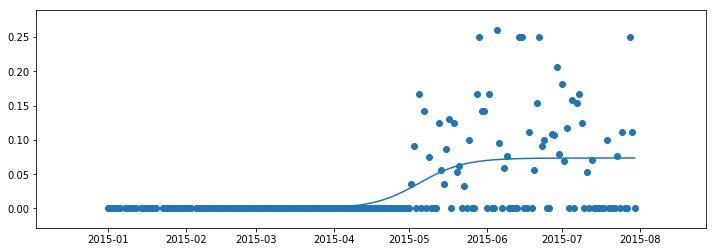

0.3025626416218131
125.02326597100945
2015-05-05
0.0018406548247313316
0.07178553816452192
91.8699170429361
158.17661489908275
66.30669785614666
---
778
155 2016
[0.6939045159804174, 0.3513687541588356, 0.15629129225142002]
999999.9922347012 0.10796104531268762 0.08335569670302136


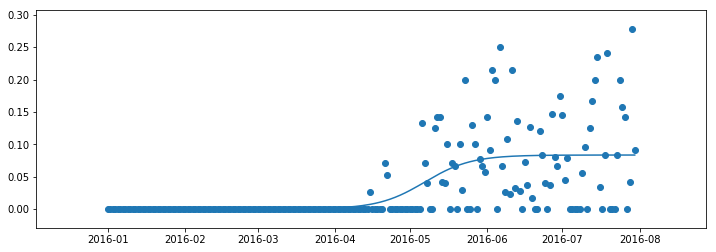

0.383313682033542
127.96755079746687
2016-05-07
0.002083892417575534
0.08127180428544582
94.03344395810763
161.90165763682617
67.86821367871855
---
779
155 2017
[0.16988778090980416, 0.6994699285951229, 0.8256189374423943]
999999.9891564858 0.10398486995194559 0.09512023828886385


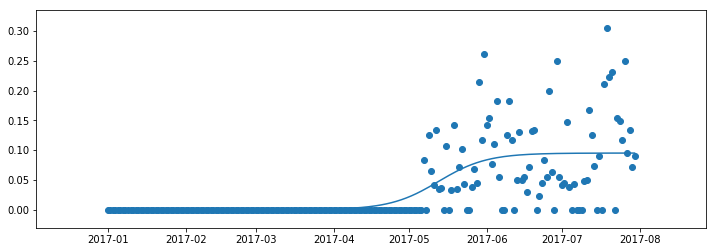

0.451833847261801
132.860776317798
2017-05-13
0.002378005957221596
0.09274223233164225
97.62909647992657
168.0924561556695
70.46335967574294
---
780
155 2018
[0.9391513789075384, 0.9762060428542486, 0.5986836268920771]
999999.9996302611 0.11249784821264616 0.08341655814579411


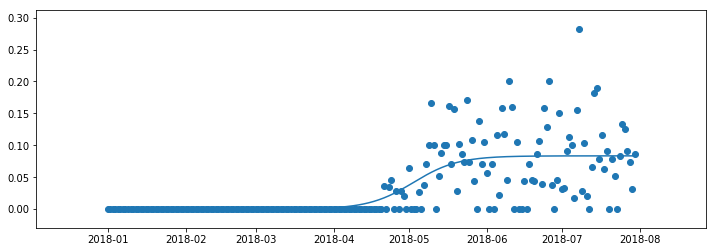

0.4985627627244201
122.80688721690144
2018-05-03
0.002085413953644853
0.08133114419214926
90.24127192437875
155.37250250942418
65.13123058504543
---
781
155 2019
[0.7842441989589807, 0.18710657125957642, 0.8830629359242259]
38530.38471409774 0.08476746622796094 0.05903904035405159


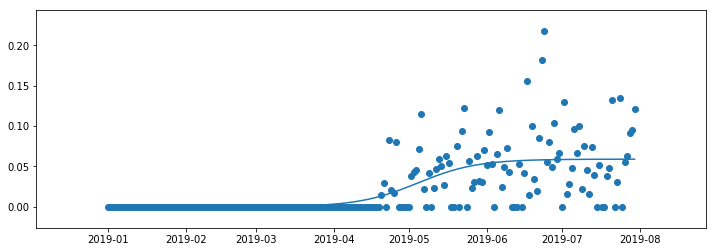

0.43521016317859096
124.56668686979063
2019-05-05
0.0014759760088512899
0.057563064345200296
81.34772788525038
167.78564585433085
86.43791796908047
---
782
156 2010
[0.1829931160904138, 0.11170300959203328, 0.9146953515808618]
657.635641807458 0.019757487806797737 0.9999999945844636


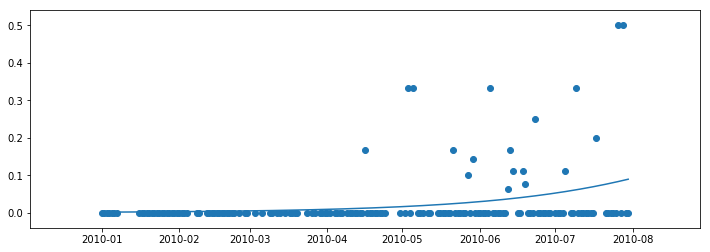

0.08567596851078885
328.4147815528245
---
783
156 2011
[0.36832845214785237, 0.85571583728785, 0.6772859463593209]
999999.9956462585 0.12152784673659643 0.09091641651152141


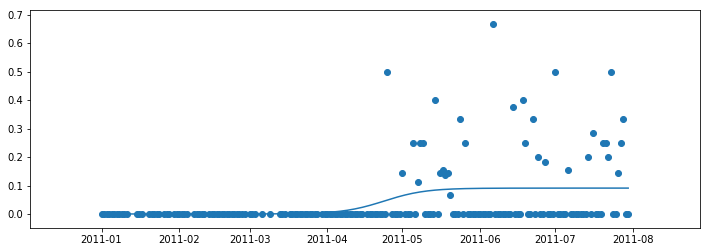

0.13847638991258138
113.68185090578243
2011-04-24
0.0022729104127880355
0.08864350609873337
83.53598932337346
143.82771248819134
60.29172316481788
---
784
156 2012
[0.0629111205302123, 0.7071554003057094, 0.24823829238951522]
12334.548584318401 0.07424840416711176 0.223301982986267


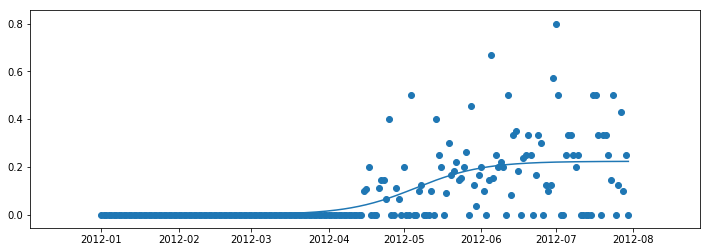

0.40439952187910544
126.87356095581124
2012-05-06
0.0055825495746566756
0.21771943341161032
77.53160287299475
176.2155190386278
98.68391616563305
---
785
156 2013
[0.8577564018006122, 0.7781288551850215, 0.3389056479332171]
999999.999999923 0.11478006237866786 0.13122678271279417


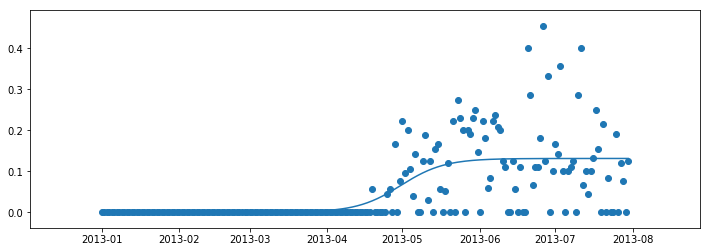

0.42640881493645455
120.36507274569874
2013-04-30
0.0032806695678198544
0.1279461131449743
88.4469715510567
152.28317394034073
63.836202389284026
---
786
156 2014
[0.20724991623296707, 0.6539285770618902, 0.4391594781757815]
999999.9999702441 0.10416757445802217 0.13825800285535467


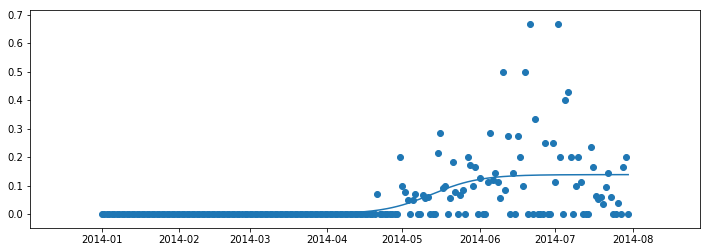

0.3023619720181283
132.6277455322908
2014-05-13
0.003456450071383867
0.1348015527839708
97.45786022785758
167.79763083672395
70.33977060886637
---
787
156 2015
[0.4739268047258717, 0.34905428928562743, 0.5232017742919393]
999999.9999988929 0.11133008868729913 0.1361431545174933


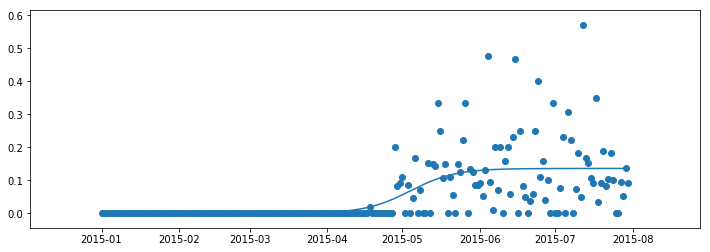

0.39292536820789414
124.09502876412675
2015-05-04
0.0034035788629373323
0.13273957565455596
91.18782740170121
157.00223012655232
65.8144027248511
---
788
156 2016
[0.7441059678517069, 0.14747353800861995, 0.12183935488592912]
999999.9999993445 0.11714138630491946 0.09504695982783513


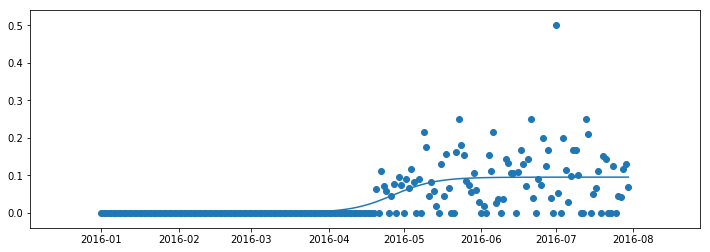

0.3964140246726283
117.93876608222642
2016-04-27
0.0023761739956958787
0.09267078583213925
86.66406666392365
149.21346550052917
62.54939883660552
---
789
156 2017
[0.4464147018237655, 0.012677715462323547, 0.04911829418276836]
6791.091843077998 0.06582654802577012 0.12902297793915518


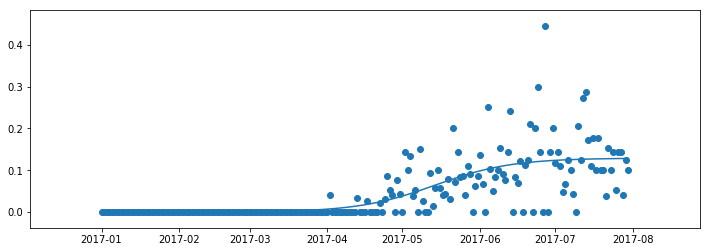

0.5333497999360971
134.0396431816969
2017-05-14
0.0032255744484788796
0.1257974034906763
78.38486929479316
189.69441706860073
111.30954777380757
---
790
156 2018
[0.9836783892892951, 0.10098442555792952, 0.9521823750789128]
999999.9999738897 0.11470882140788838 0.08174931257787633


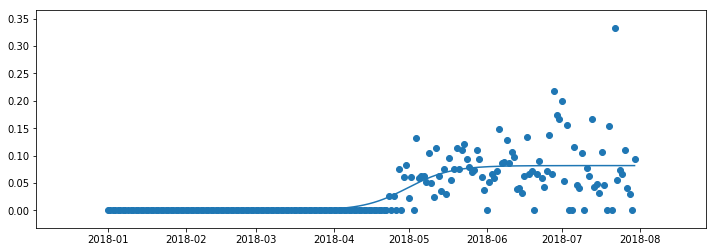

0.5305828493413794
120.43982658327695
2018-04-30
0.0020437328144469083
0.07970557976342943
88.50190235770638
152.37775080884754
63.87584845114115
---
791
156 2019
[0.825525461975529, 0.1957115708252254, 0.16544447124139683]
999999.9999605262 0.11480234769460029 0.06375663875649965


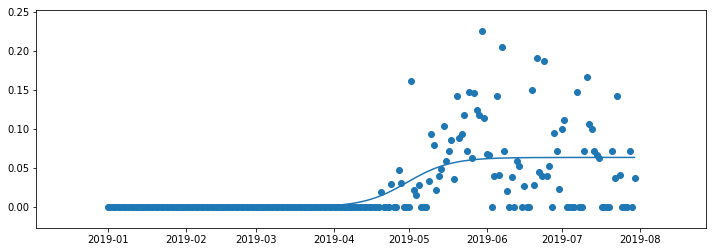

0.38295175185028296
120.34170759884739
2019-04-30
0.0015939159689124913
0.06216272278758715
88.42980231381321
152.25361288388154
63.82381057006833
---
792
157 2010
[0.6246139903322712, 0.6154406575748838, 0.5937992390276966]
1095.9134816087455 0.03154808523075641 0.9999999998605303


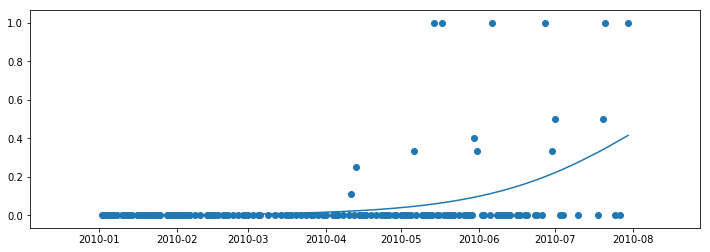

0.17199134949228534
221.86270491720106
---
793
157 2011
[0.861951392162679, 0.08125073690417306, 0.11789395354890175]
10548.261882587829 0.10622336279547932 0.21088155747083728


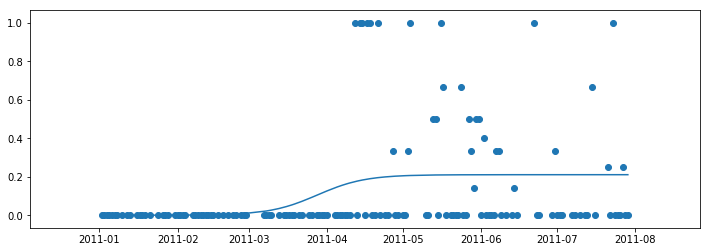

0.12183028836498266
87.20978258522995
2011-03-28
0.005272038936770932
0.20560951853406634
52.72055583025132
121.69900934020852
68.9784535099572
---
794
157 2012
[0.6296480506643664, 0.12802384342174544, 0.8057718235987125]
11645.695861508239 0.09585796033125417 0.12100766635832828


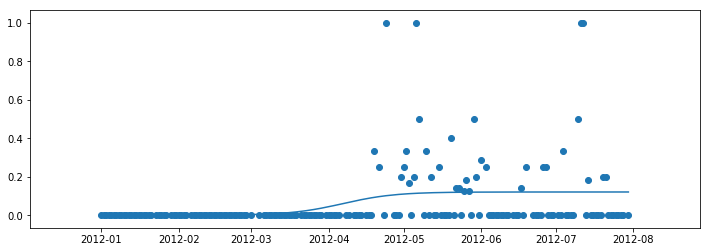

0.11153848609528472
97.67255535614039
2012-04-07
0.0030251916589582074
0.11798247469937008
59.453907332861355
135.89120337941944
76.43729604655809
---
795
157 2013
[0.08911558279492748, 0.8799142357815081, 0.7649472020915218]
999999.9430041544 0.13514235599264868 0.0843649453564786


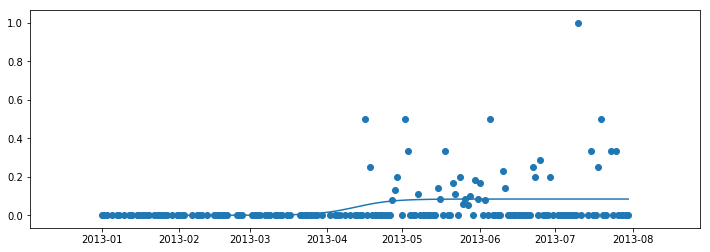

0.09431727733039019
102.22931515061013
2013-04-12
0.002109123633911965
0.08225582172256662
75.12040751599014
129.3382227852301
54.21781526923996
---
796
157 2014
[0.8077226042245959, 0.99975791359527, 0.41444923205205253]
999999.999910543 0.11855227120924365 0.12569431145553428


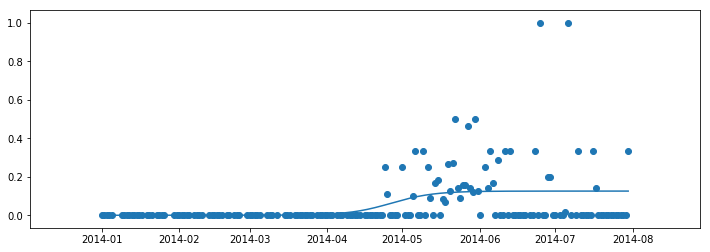

0.16019395995038854
116.53518247230008
2014-04-27
0.0031423577863883573
0.12255195366914592
85.6326817545914
147.4376831900088
61.80500143541741
---
797
157 2015
[0.9151792712660356, 0.024522747648216936, 0.007271917415534679]
87999.04696178359 0.1095254199393894 0.08597980932011913


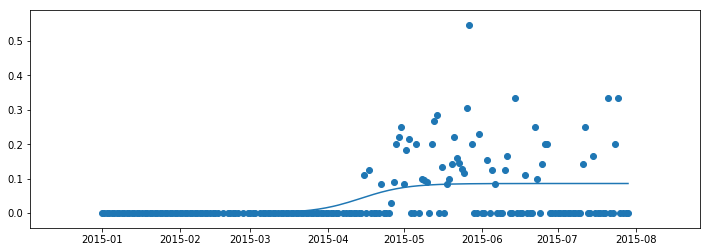

0.2133554667105989
103.9492135225082
2015-04-14
0.0021494952330029784
0.08383031408711615
70.49979467383329
137.39863237118317
66.89883769734988
---
798
157 2016
[0.388356263943077, 0.4881663079086531, 0.20069988526443994]
999999.9999666298 0.11488269210159234 0.15339105356511146


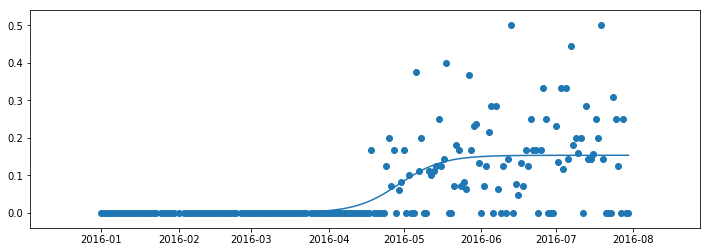

0.42092581412446783
120.25754537257588
2016-04-29
0.0038347763391277864
0.14955627722598366
88.3679580108007
152.147132734351
63.7791747235503
---
799
157 2017
[0.6554270909017565, 0.5907714701592608, 0.7593739485193826]
999999.9999996024 0.11743919003498753 0.17687414321494171


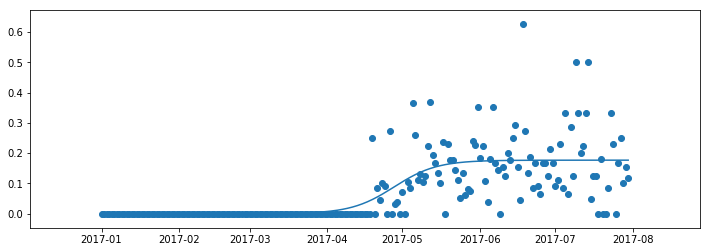

0.5175446168477551
117.63969552112846
2017-04-28
0.004421853580373543
0.17245228963456816
86.44430286695402
148.83508817530287
62.39078530834885
---
800
157 2018
[0.6278614929020832, 0.9636888539189642, 0.23796019589438921]
999999.9990550329 0.11983937104108527 0.15187416254831543


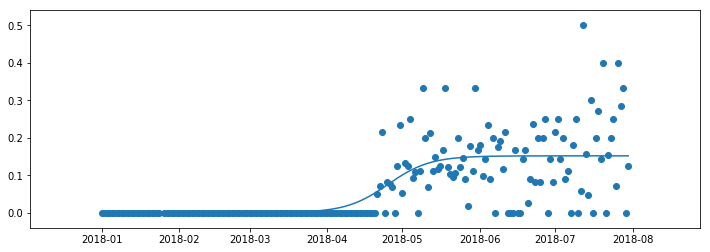

0.5057068984794375
115.28357030748141
2018-04-25
0.003796854063707886
0.14807730848460754
84.71296889074296
145.8541717242199
61.14120283347694
---
801
157 2019
[0.2249907783348567, 0.5050682367117973, 0.8472770293069383]
999999.9999956478 0.12087605808981433 0.11433561481740132


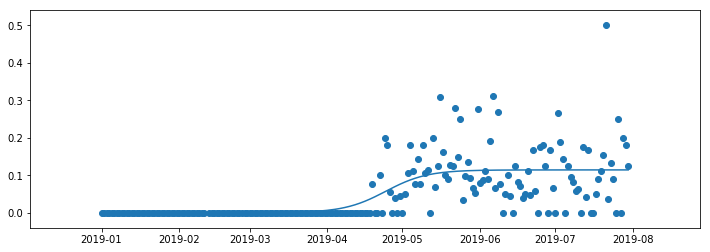

0.44415446650477164
114.29484693895797
2019-04-24
0.002858390370435033
0.11147722444696628
83.98643265060059
144.6032612273154
60.616828576714795
---
802
158 2010
[0.5988546167424111, 0.4590275731091805, 0.8973468087200306]
972539.1176468998 0.11528330997768907 0.14844878717752424


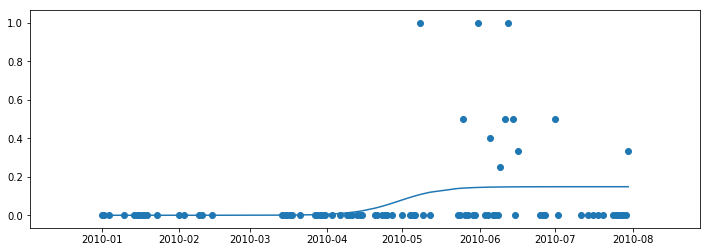

0.10505617912672094
119.59810644000045
2010-04-30
0.0037112196794381064
0.14473756749808614
87.81933771069643
151.3768751693045
63.55753745860807
---
803
158 2011
[0.5290570761929794, 0.5088679035465348, 0.41625083605212365]
191.08150149221717 0.01940801212022278 0.9999999724820366


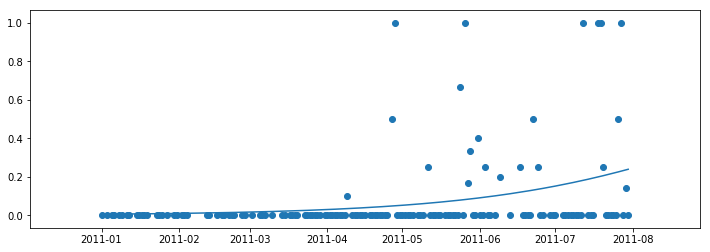

0.10146830765388015
270.6459586833313
---
804
158 2012
[0.02058344740816065, 0.8450237929172092, 0.18975929884344245]
130666.61887982339 0.11843294709868347 0.18977539539738492


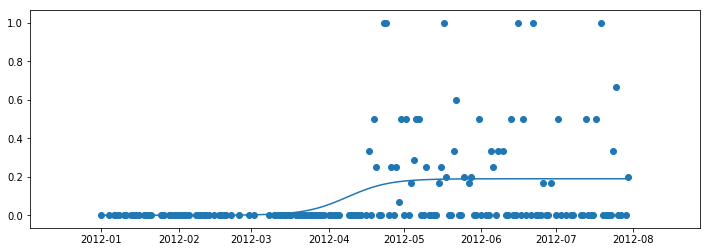

0.1479960343292771
99.46898015273437
2012-04-08
0.004744384884934623
0.1850310105124503
68.53534440459235
130.40261590087638
61.86727149628403
---
805
158 2013
[0.48350687182786123, 0.3616353305820861, 0.4892480029237092]
999999.9980001928 0.11598792291498451 0.16353752993685808


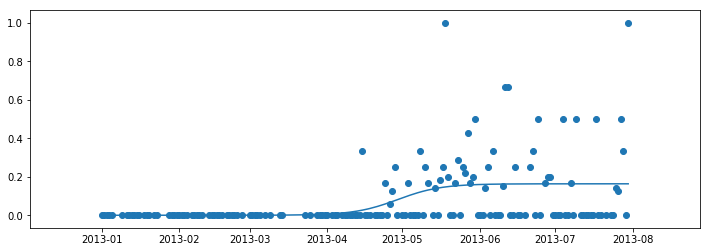

0.18226520940568058
119.11162997625883
2013-04-29
0.0040884382484214525
0.15944909168843663
87.52591351494308
150.69734643757457
63.17143292263148
---
806
158 2014
[0.6405795089089791, 0.47641180081923995, 0.09131682172278377]
999999.9987268477 0.1172763008030879 0.07977641462593743


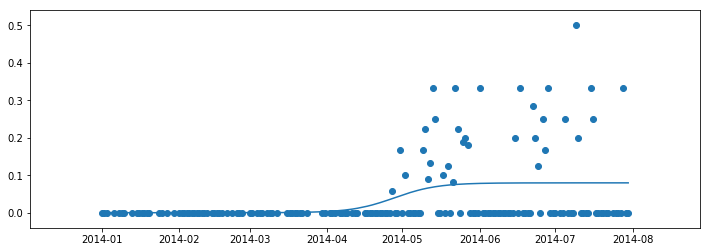

0.1538493682481884
117.8030894740445
2014-04-28
0.001994410365648436
0.07778200426028899
86.56436842774438
149.0418105203446
62.477442092600214
---
807
158 2015
[0.13029422606893237, 0.4907121833545993, 0.7503778355136179]
999999.9812038811 0.1144767841109646 0.11058124167032637


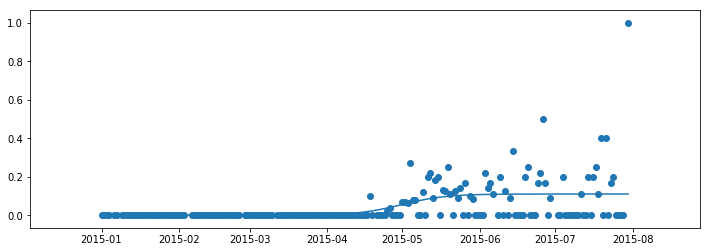

0.21516098537828565
120.68395043117658
2015-05-01
0.0027645310417581596
0.10781671062856821
88.68129002643911
152.686610835914
64.00532080947488
---
808
158 2016
[0.6704667405869172, 0.35639545210773016, 0.8609930798912657]
999999.9876588949 0.11544104154644456 0.14832342111382577


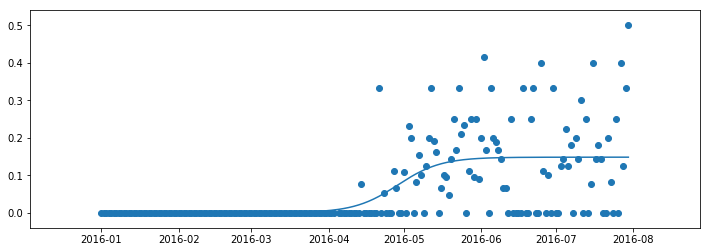

0.3919564300778542
119.67590001399003
2016-04-29
0.0037080855278456442
0.1446153355859801
87.94055184792457
151.41124818005545
63.470696332130885
---
809
158 2017
[0.821675937374326, 0.7851870998696533, 0.900245922195768]
999999.9983555961 0.11281665140357165 0.1309495285668376


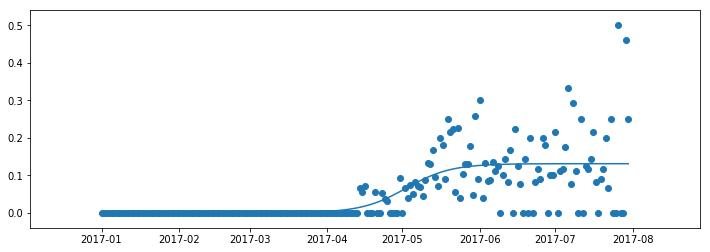

0.4689196092336956
122.45985308408548
2017-05-02
0.0032737382141709397
0.12767579035266666
89.98626340959474
154.93344275857623
64.94717934898149
---
810
158 2018
[0.14014366630381292, 0.30169552352161666, 0.9821790555026088]
999999.9999997003 0.11571596231762026 0.12440437899925852


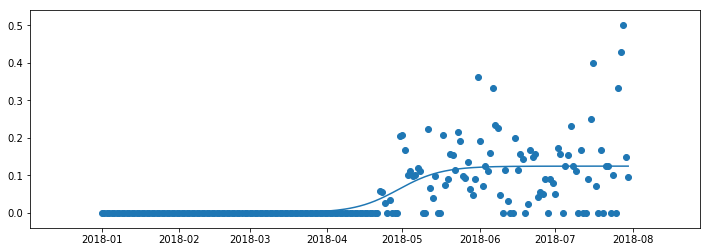

0.41852461802617047
119.3915712340774
2018-04-29
0.0031101094749814632
0.12129426952427705
87.73162067277276
151.05152179538197
63.31990112260921
---
811
158 2019
[0.33994712929077997, 0.7805226456466076, 0.7052717383621623]
999999.9988130291 0.1135908796442223 0.10430767093624155


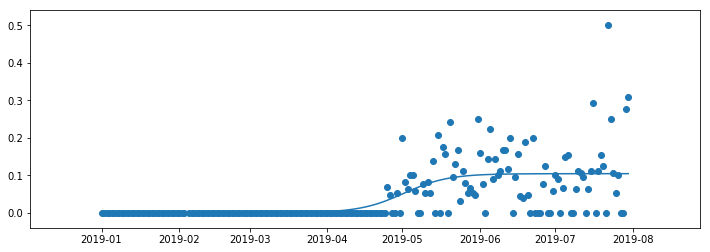

0.4039132347820693
121.62517448626886
2019-05-02
0.002607691773406039
0.1016999791628355
89.3729227420771
153.8774262304606
64.5045034883835
---
812
165 2012
[0.010205377454849507, 0.6743481964925775, 0.5328549534629604]
0.010205377454849507 0.6743481964925775 0.08870701058870244


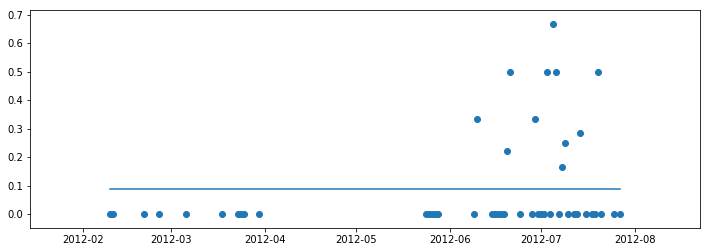

3.3306690738754696e-16
-6.798921566046491
---
813
165 2013
[0.02172723678608024, 0.17939477720239938, 0.8360648684860568]
999999.9998903841 0.10806739313348733 0.1392193142938506


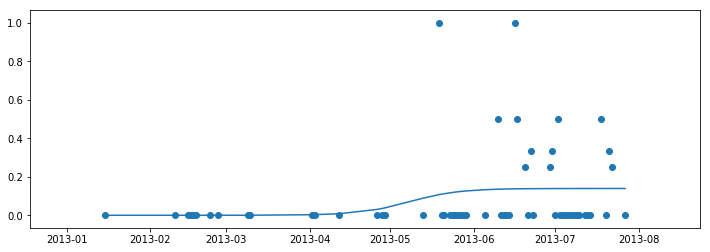

0.0682647557524404
127.8416195418855
2013-05-08
0.003480482857346265
0.13573883143650434
93.94090684860966
161.74233223516143
67.80142538655177
---
814
165 2014
[0.9393061444324974, 0.43220118785986983, 0.3063414332627552]
999999.9998687714 0.0950461362831945 0.1401013301905274


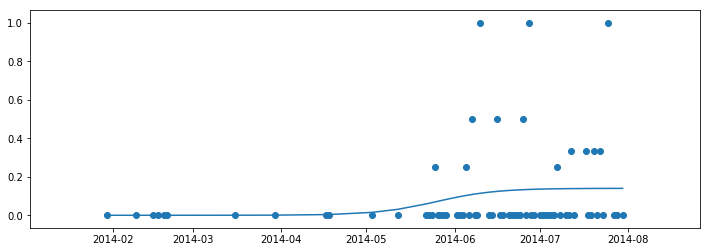

0.0499167146961943
145.35583557725138
2014-05-25
0.003502533254763185
0.1365987969357642
106.81074800826394
183.90092314623882
77.09017513797488
---
815
165 2015
[0.8296838421609761, 0.911959354108866, 0.02188252991816464]
0.8296838421609761 0.911959354108866 0.0795876885989563


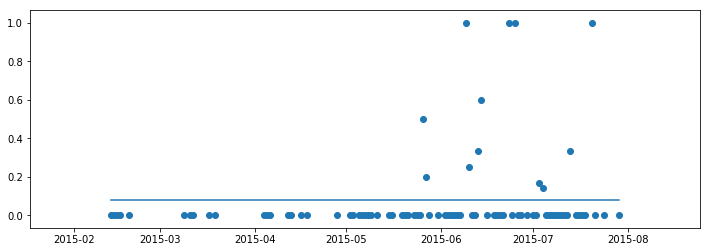

2.220446049250313e-16
-0.20473562004176446
---
816
165 2016
[0.37098810946034366, 0.13797542600511825, 0.826455342538319]
32671.63552035305 0.07581340060473726 0.14213556452813988


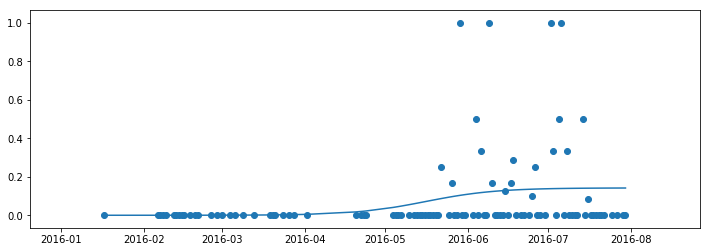

0.0815358599174626
137.1032361333466
2016-05-16
0.0035533891132034975
0.1385821754149364
88.779831340702
185.42664092599128
96.64680958528928
---
817
165 2017
[0.259054991345365, 0.4861322572937695, 0.4507528823050966]
999999.9367127328 0.09157975702813008 0.09387709033486565


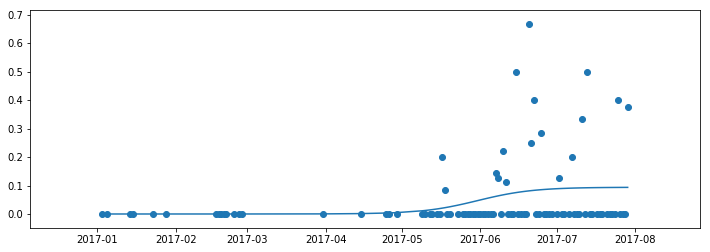

0.08151201771662553
150.85768889333661
2017-05-31
0.0023469272583716413
0.091530163076494
110.8536337940822
190.86174399259104
80.00811019850885
---
818
165 2018
[0.34985240780453797, 0.08135655685013676, 0.7599297665635579]
999999.9983426043 0.10583159905519286 0.08951761172556434


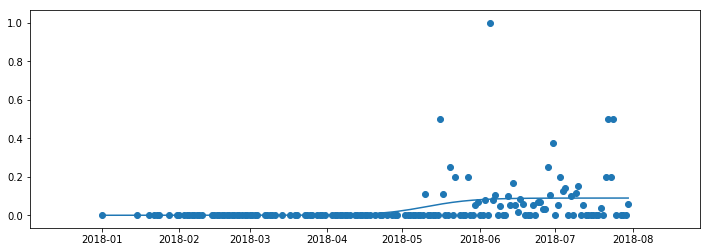

0.12785982246390692
130.5423964075405
2018-05-11
0.002237940293139109
0.08727967143242524
95.92549862997751
165.1592941851036
69.23379555512608
---
819
165 2019
[0.8923795135904864, 0.615532394185692, 0.15728559036796708]
999999.9999380554 0.1048968752274534 0.06883500321593802


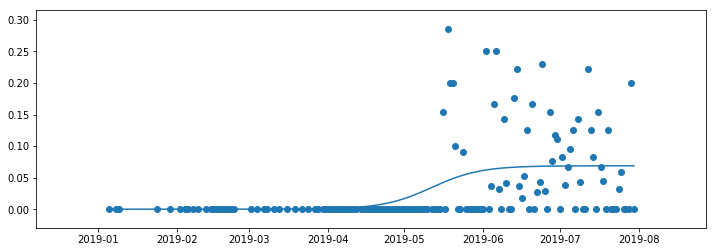

0.2304666088500117
131.70564450032884
2019-05-12
0.0017208750803984507
0.06711412813553957
96.78027958182433
166.6310094188334
69.85072983700907
---
820
166 2011
[0.794610178262807, 0.011498256071316049, 0.08301705691303596]
84209.96080190492 0.10443351992741055 0.16059968770804553


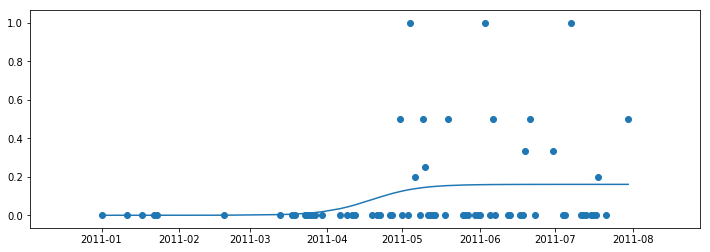

0.0784792608805378
108.59605709380062
2011-04-19
0.004014992192701138
0.15658469551534437
73.51573375818857
143.67638042941263
70.16064667122406
---
821
166 2013
[0.5870258886674473, 0.01897675287583722, 0.1443325554003808]
3188.511224791331 0.07850488694013308 0.13023898544890705


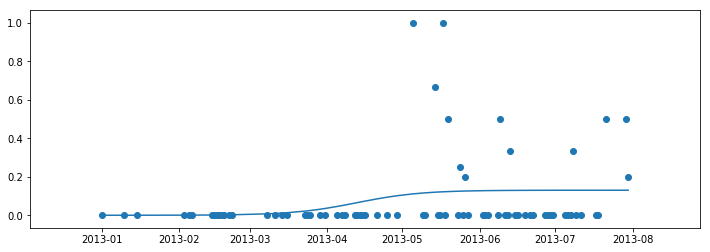

0.07978811742017256
102.761875095749
2013-04-13
0.0032559746362226766
0.12698301081268437
56.09520517336015
149.4285450181378
93.33333984477767
---
822
166 2014
[0.9200298540787315, 0.5317436097664394, 0.2564396067223169]
999999.9361691127 0.10779343672445685 0.08524631244870048


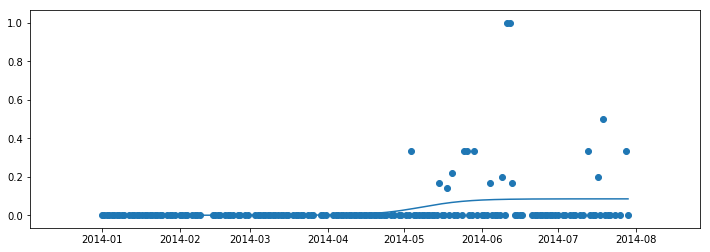

0.08690631609562316
128.1665277028767
2014-05-08
0.0021311578112175123
0.08311515463748297
94.17965654026133
162.153398865492
67.97374232523066
---
823
166 2016
[0.6672270833681322, 0.4063798458564578, 0.33552466867927855]
999999.9999725898 0.10488305964479823 0.14997950371395122


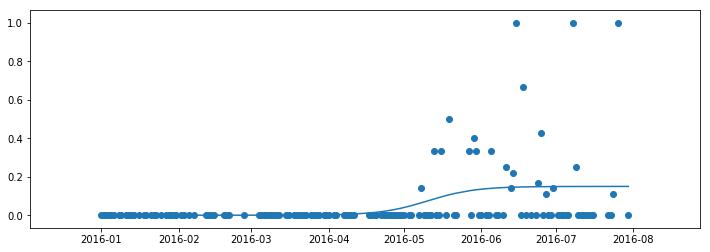

0.14814478018267963
131.72299325291524
2016-05-11
0.0037494875928487806
0.14623001612110242
96.7930278367953
166.65295866903512
69.85993083223981
---
824
166 2017
[0.17877578262758886, 0.5295606567086308, 0.2374890942443234]
13024.06650966715 0.07126107018621 0.048392191605297855


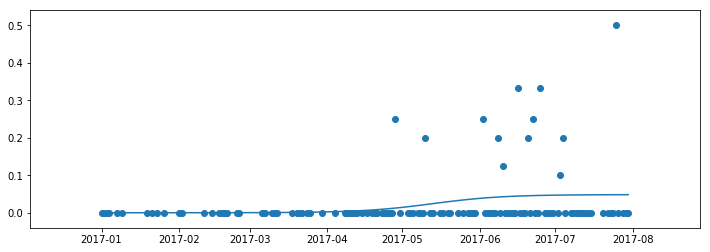

0.06175317415922388
132.95554178701101
2017-05-13
0.0012098047901324465
0.04718238681516541
81.54512040887973
184.36596316514226
102.82084275626254
---
825
166 2018
[0.10508650781125206, 0.17854185989473048, 0.4808903533005643]
6718.151177541922 0.03225108928744023 0.9999999660134233


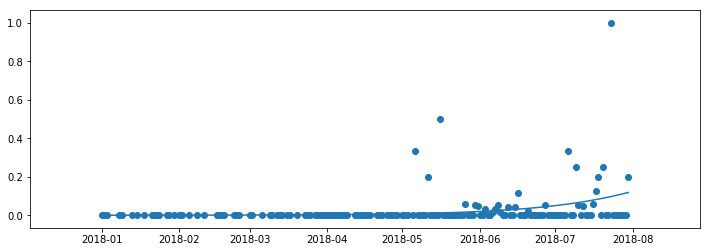

0.08147046318823481
273.24870160917123
---
826
166 2019
[0.9948217850321266, 0.3766220049737886, 0.03875405876328619]
35033.372475024415 0.0984141501593781 0.05826085514582163


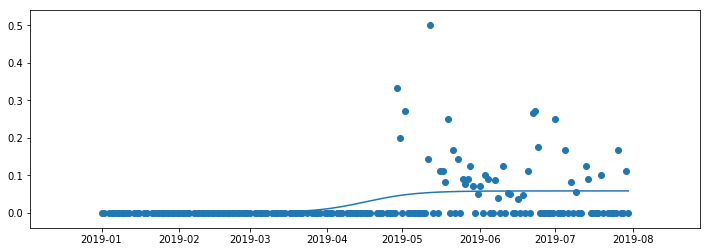

0.15253367945907026
106.32674639287255
2019-04-16
0.0014565213786455408
0.05680433376717609
69.100782035139
143.55271075060614
74.45192871546713
---
827
170 2016
[0.5055856927113352, 0.8419690230497673, 0.5003686050881263]
72664.192054016 0.09473424348688604 0.037434333500366325


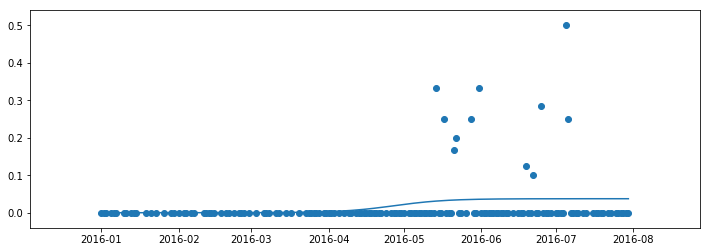

0.05751314995240375
118.15794992620849
2016-04-27
0.0009358583375091581
0.03649847516285717
79.48596067200825
156.8299391804088
77.34397850840054
---
828
170 2019
[0.2707490356195553, 0.6369003117451579, 0.638442317539528]
35390.62755268757 0.0790542595473018 0.052114438789561436


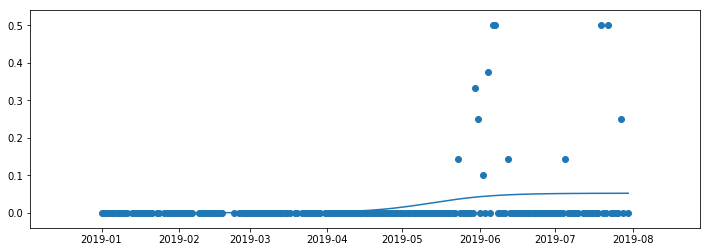

0.07618601921729751
132.49383860715716
2019-05-12
0.001302860969739036
0.0508115778198224
86.15146987068738
178.83620734362697
92.68473747293959
---


In [27]:
list_grid_cells_logistic = []
list_years_logistic = []
list_nb_prop_logistic = []
list_df = []
list_p0 = []
list_popt = []
list_r_squared = []
list_t_mad = []
list_mad = []
list_lower_bound_c = []
list_upper_bound_c = []
list_lower_bound_t = []
list_upper_bound_t = []
list_ci_nb_days = []
cnt_errors = 0

for i in range(len(list_grid_cells)):

    print(i)
    
    grid_cell = list_grid_cells[i]
    year = list_years[i]
    print(grid_cell, year)

    start_date = datetime(year, start_month, start_day)
    end_date = datetime(year, end_month, end_day)

    date_range = pd.date_range(start_date, end_date)
    date_range_str = date_range.strftime('%Y-%m-%d')

    # Get data for a given grid cell and year
    df_block_year = df[(df['grid_cell'] == grid_cell) & (df['year'] == year)]
    df_block_year.reset_index(drop=True, inplace=True)


    df_date_range = pd.DataFrame({'grid_cell': grid_cell, 'year': year, 'observation_date': date_range_str, 
                                  'observation_date_dt': date_range})

    df_block_year = df_date_range.merge(df_block_year, how='left', on=['grid_cell', 'year', 'observation_date', 
                                                                       'observation_date_dt'])
    df_block_year = df_block_year.reset_index()
    df_block_year.rename(columns={'index': 't'}, inplace=True)
    df_block_year['t'] = df_block_year['t'] + 1
    df_block_year_nas = df_block_year.copy()
    df_block_year = df_block_year.dropna()

    p0 = []
    for j in range(3):
        p0.append(random.uniform(0, 1))
    print(p0)
    # ?

    x = df_block_year['t']
    y = df_block_year['prop']

    try:
        # Nonlinear least squares optimization
        popt, pcov = optim.curve_fit(logistic_function, x, y, bounds=bounds, p0=p0)

        a_optim, b_optim, c_optim = popt
        print(a_optim, b_optim, c_optim)

        plt.figure(figsize=(12.0, 4.0))
        plt.scatter(df_block_year['observation_date_dt'], y)
        plt.plot(df_block_year['observation_date_dt'], logistic_function(x, a_optim, b_optim, c_optim))
        plt.show()

        residuals = y - logistic_function(x, a_optim, b_optim, c_optim)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        r_squared = 1 - (ss_res / ss_tot)
        # R-squared
        print(r_squared)

        # Time step for mean arrival date
        t_mad = np.log(a_optim) / b_optim
        print(t_mad)
        
        # Mean arrival date, rounded down
        mad_floor = df_block_year_nas[df_block_year_nas['t'] == round(t_mad)]['observation_date'].values[0]
        print(mad_floor)

#         # Mean arrival date, rounded down
#         mad_floor = df_block_year_nas[df_block_year_nas['t'] == math.floor(t_mad)]['observation_date'].values[0]
#         print(mad_floor)

#         # Mean arrival date, rounded up
#         mad_ceil = df_block_year_nas[df_block_year_nas['t'] == math.ceil(t_mad)]['observation_date'].values[0]
#         print(mad_ceil)

        lower_bound_c = (2.5 / 100) * c_optim
        print(lower_bound_c)

        upper_bound_c = (97.5 / 100) * c_optim
        print(upper_bound_c)

        lower_bound_t = -np.log((1 / a_optim)*(c_optim / lower_bound_c - 1)) / b_optim
        print(lower_bound_t)

        upper_bound_t = -np.log((1 / a_optim)*(c_optim / upper_bound_c - 1)) / b_optim
        print(upper_bound_t)
        
        print(upper_bound_t - lower_bound_t)

#         lower_bound_date = df_block_year[df_block_year['prop'] >= lower_bound_c]['observation_date_dt'].min()
#         print(lower_bound_date)

#         upper_bound_date = df_block_year[df_block_year['prop'] <= upper_bound_c]['observation_date_dt'].max()
#         print(upper_bound_date)
                
        list_grid_cells_logistic.append(list_grid_cells[i])
        list_years_logistic.append(list_years[i])
        list_nb_prop_logistic.append(list_nb_prop[i])
        
        list_df.append(df_block_year)
        list_p0.append(p0)
        
        list_r_squared.append(r_squared)
        list_t_mad.append(t_mad)
        list_mad.append(mad_floor)
        list_lower_bound_c.append(lower_bound_c)
        list_upper_bound_c.append(upper_bound_c)
        list_lower_bound_t.append(lower_bound_t)
        list_upper_bound_t.append(upper_bound_t)
        list_ci_nb_days.append(upper_bound_t - lower_bound_t)
    
    except (RuntimeError, IndexError) as e:
        cnt_errors += 1
        assert(
            (e.args[0] == 'Optimal parameters not found: The maximum number of function evaluations is exceeded.') | 
            (e.args[0] == 'index 0 is out of bounds for axis 0 with size 0'))
        
#     if i == 3:
#         break
                    
    print('---')

In [28]:
cnt_errors

20

In [29]:
df_logistic = pd.DataFrame({'grid_cell': list_grid_cells_logistic, 'year': list_years_logistic, 
                            'nb_prop': list_nb_prop_logistic, 'r_squared': list_r_squared, 't_mad': list_t_mad, 
                            'mad': list_mad, 'ci_nb_days': list_ci_nb_days})

In [30]:
df_logistic.shape

(809, 7)

In [31]:
df_logistic.head(2)

,grid_cell,year,nb_prop,r_squared,t_mad,mad,ci_nb_days
0,5,2010,19,0.118339,77.548667,2010-03-19,58.094665
1,5,2011,21,0.099887,43.949711,2011-02-13,36.750439


In [32]:
filename = 'ebd_US_barswa_201001_202001_mad_relJan-2020_v2.csv'
df_logistic.to_csv(filename, index=False)